### Loading data and storing it in csv files

#### Find details functions

In [2]:
import wfdb.processing
import numpy as np
import pandas as pd
import os, re, glob
import matplotlib.pyplot as plt
from biolab.bspm import BSPM
from biolab.utils import apply2all
import plotly.express as px
import plotly.graph_objects as go
from scipy.signal import find_peaks
import scipy.signal as signal


def findDetails(path):
    name = path.split(r'/')[-1]
    pattern = r'^([^\s_]+)_P(\d+)_M(\d+).bspm$'
    # Search for the pattern in the given filename
    match = re.search(pattern,name)
    if match:
        region = match.group(1)  # The entire V value (e.g., V1, V2-V3)
        patient = match.group(2)  # The number following 'P'
        measurement = match.group(3)  # The number following 'M'
    else:
        raise ValueError("Filename \"{}\" does not match the expected pattern.".format(name))
    
    healthy_list = str([17])
    B1_list = str([19, 20, 21, 24, 26, 27, 29])
    B2_list = str([18, 22, 23, 25, 28])
    if patient in healthy_list:
        stage = 'HEALTHY'
    elif patient in B1_list:
        stage = 'B1'
    elif patient in B2_list:
        stage = 'B2'
    else:
        raise ValueError(f"Patient {patient} needs to be assigned a stage - put patient number in appropriate list.")
    print('patient', patient)
    print('stage', stage)
    return region, measurement, stage, patient

def findDetailsPatient(patient):
    healthy_list = str([17])
    B1_list = str([19, 20, 21, 24, 26, 27, 29])
    B2_list = str([18, 22, 23, 25, 28])
    if patient in healthy_list:
        stage = 'HEALTHY'
    elif patient in B1_list:
        stage = 'B1'
    elif patient in B2_list:
        stage = 'B2'
    else:
        raise ValueError(f"Patient {patient} needs to be assigned a stage - put patient number in appropriate list.")
    print('patient', patient)
    print('stage', stage)
    return stage


#### Saving raw data to csv

In [94]:
import wfdb.processing
import numpy as np
import pandas as pd
import os, re, glob
import matplotlib.pyplot as plt
from biolab.bspm import BSPM
from biolab.utils import apply2all
import plotly.express as px
import plotly.graph_objects as go
from scipy.signal import find_peaks, stft, detrend
import scipy.signal as signal
from scipy.stats import mode


directory = r'/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_P17/'

os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.bspm")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)

for fp in bspm_fullpaths: 
    print(fp)
    reg, measurement, stg, patient = findDetails(fp)
    print('found details')
    
    MP = BSPM.load(loadpath=fp)
    # Resample and preprocess the data
    rMP = MP.resample(newfs=2000)  # change this around
    rMP.preprocess(bw=(0.5,100))  # change this around 

    cols_to_remove = ['LA', 'LL', 'RA'] 
    rMP.preprocessed_data = rMP.preprocessed_data.drop(columns=cols_to_remove, errors='ignore')


    #print(rMP.preprocessed_data)

    csv_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh100/V4-V5/'+str(patient)+r'.csv'
    #r'/Users/arzina/Desktop/HFD.xlsx'#
    #print(len(fm_all_ch))
    df_new = pd.DataFrame(rMP.preprocessed_data)

    if os.path.exists(csv_path):
        df_existing = pd.read_csv(csv_path)
        # Concatenate, resetting the index
        df_combined = pd.concat([df_existing, df_new], ignore_index=True)
    else:
        df_combined = df_new

    # Write back out to CSV (this will overwrite the file)
    df_combined.to_csv(csv_path, index=False)

    print(f"Data saved to {csv_path}")


/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_P17/V4-V5_P17_M1.bspm
patient 17
stage HEALTHY
found details
Data saved to /Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh100/V4-V5/17.csv


#### Saving WFDB peaks to csv

In [100]:

directory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh100/V5-V6/'

# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.csv")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)


for fp in bspm_fullpaths: 
    data = pd.read_csv(fp)
    patient = fp.split('/')[-1].split('.')[0]
    print('patient', patient)
#fp = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/18.csv'
#data = pd.read_csv(fp)

    # Find R /significant peaks using wfdb
    peaks_per_channel = {}
    for ch in data.columns:
        peaksch = wfdb.processing.xqrs_detect(data[ch],fs=2000,verbose=False)
        #peaksch = wfdb.processing.gqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=6000)#,verbose=False)
        print(ch, len(peaksch))
        peaks_per_channel[ch] = peaksch#wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=4000,verbose=False)


    #print(peaks_per_channel)

    rows = []
    for ch, peaks in peaks_per_channel.items():
        for i, peak in enumerate(peaks):
            rows.append({'channel': ch, 'cycle_index': i, 'peak': peak})

    peaksdf = pd.DataFrame(rows)

    savepath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh100/V5-V6/WFDBpeaks/'+str(patient)+r'_peaks.csv'
    peaksdf.to_csv(savepath, index=False)


patient 23
1 101
10 101
11 101
12 101
13 101
14 101
15 101
16 101
17 101
18 101
19 101
2 101
3 101
4 101
5 101
6 101
7 101
8 101
9 101
patient 22
1 144
10 144
11 143
12 95
13 146
14 144
15 144
16 144
17 141
18 144
19 144
2 144
3 144
4 144
5 144
6 144
7 144
8 88
9 125
patient 21
1 129
10 129
11 128
12 129
13 129
14 129
15 128
16 129
17 129
18 128
19 134
2 129
3 129
4 129
5 129
6 129
7 130
8 135
9 132
patient 25
1 113
10 114
11 113
12 113
13 113
14 113
15 113
16 113
17 113
18 113
19 113
2 113
3 113
4 112
5 113
6 113
7 113
8 113
9 113
patient 19
1 97
10 97
11 98
12 100
13 97
14 97
15 98
16 98
17 97
18 97
19 94
2 97
3 97
4 97
5 97
6 97
7 98
8 97
9 97
patient 18
1 97
10 97
11 97
12 97
13 97
14 97
15 97
16 97
17 97
18 97
19 97
2 97
3 97
4 97
5 97
6 122
7 97
8 97
9 97
patient 24
1 151
10 144
11 151
12 133
13 147
14 147
15 139
16 168
17 160
18 144
19 144
2 144
3 145
4 160
5 152
6 151
7 143
8 153
9 159
patient 26
1 68
10 68
11 50
12 60
13 68
14 68
15 68
16 54
17 68
18 68
19 68
2 63
3 55
4 68
5 

### HR

In [6]:
import pandas as pd
patients = [18,19,21,22,23,24,25,26,27,28,29]
#patients = [17,18,19,20,21,22,23,24,25,26,27,28,29]

import pandas as pd
import neurokit2 as nk


directory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/V2-V3/'

peaksdirectory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/V2-V3/WFDBpeaks/'
# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

os.chdir(directory) # move to the search directory
files = [f for f in glob.glob("*.csv")] # will produce a list of .bspm files
fullpaths = []
for filename in files:
    fullpath = os.path.join(directory, filename)
    fullpaths.append(fullpath)


hr_all = []
#bpm = []
for fp in fullpaths: 
#fp = directory
    data = pd.read_csv(fp)
    patient = fp.split('/')[-1].split('.')[0]
    print('patient', patient)
    stage = findDetailsPatient(patient)
    # Load the long-form DataFrame
    df_peaks = pd.read_csv(peaksdirectory + str(patient) + '_peaks.csv')

    # Rebuild peaks_per_channel dictionary
    peaks_per_channel = {
        ch: list(group['peak'].values)
        for ch, group in df_peaks.groupby('channel')}
    # Print the dictionary
    print(peaks_per_channel)


    # Print the dictionary
    hr_patient = []
    for k in peaks_per_channel.keys():
        hr_patient.append(len(peaks_per_channel[k]))
    
    stage = findDetailsPatient(str(patient))
    
    hr_patient.append(patient)
    hr_patient.append(stage)

    hr_all.append(hr_patient)




path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V3-V4/hr/hr.xlsx'

#print(len(fm_all_ch))
df = pd.DataFrame(hr_all)

cols_labels = []
for ch in data.columns:
    cols_labels += [f'bpm_{ch}']

cols_labels += ['patient', 'stage']

df.columns = cols_labels



if os.path.exists(path):
        existing_df = pd.read_excel(path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()
        combined_df.to_excel(path, index=False)
        print("Data merged and saved to Excel file.")
else:
    df.to_excel(path, index=False)
    print("Excel file created with new data.")

        

""" def :
    if os.path.exists(path):
        existing_df = pd.read_excel(path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()
        combined_df.to_excel(path, index=False)
        print("Data merged and saved to Excel file.")
    else:
        df.to_excel(path, index=False)
        print("Excel file created with new data.")
try:
    existing_df = pd.read_excel(excel_path)
    # Append the new data to the existing data
    combined_df = pd.concat([existing_df,df],ignore_index=True)
except FileNotFoundError:
    # If the file doesn't exist, just use the new data
    combined_df = df

# Write the combined data back to the Excel file
with pd.ExcelWriter(excel_path,mode='w',engine='openpyxl') as writer:
    combined_df.to_excel(writer,index=False)
    print('put into excel') 
 """

patient 23
patient 23
stage B2
{1: [572, 1183, 2058, 3605, 4460, 5890, 6842, 7805, 9538, 10414, 11408, 13054, 14049, 15014, 15902, 17542, 18391, 19850, 20716, 22079, 22938, 23898, 24965, 26451, 27278, 28220, 29802, 30648, 32121, 32972, 33893, 34780, 36292, 37171, 38213, 39786, 40649, 42010, 43246, 44103, 45621, 46590, 47745, 48805, 50439, 51336, 53082, 54456, 55404, 56380, 57597, 58462, 59507, 61100, 62098, 63835, 64771, 66150, 67214, 68088, 68981, 70033, 71631, 72539, 73790, 75457, 76390, 77598, 79143, 80257, 81161, 82612, 83889, 84811, 86025, 87885, 88760, 90230, 91594, 92487, 93364, 94542, 96194, 97139, 98815, 100413, 101414, 102875, 104340, 105339, 106502, 108165, 109149, 110887, 112336, 113330, 114481, 115462, 116287, 117288, 119243, 120134, 121056], 2: [503, 1177, 2051, 3597, 4454, 5882, 6836, 7797, 9530, 10408, 11401, 13046, 14042, 15007, 15895, 17534, 18384, 19843, 20709, 22071, 22932, 23890, 24957, 26443, 27270, 28213, 29794, 30640, 32112, 32964, 33887, 34773, 36284, 37164, 38

' def :\n    if os.path.exists(path):\n        existing_df = pd.read_excel(path)\n        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()\n        combined_df.to_excel(path, index=False)\n        print("Data merged and saved to Excel file.")\n    else:\n        df.to_excel(path, index=False)\n        print("Excel file created with new data.")\ntry:\n    existing_df = pd.read_excel(excel_path)\n    # Append the new data to the existing data\n    combined_df = pd.concat([existing_df,df],ignore_index=True)\nexcept FileNotFoundError:\n    # If the file doesn\'t exist, just use the new data\n    combined_df = df\n\n# Write the combined data back to the Excel file\nwith pd.ExcelWriter(excel_path,mode=\'w\',engine=\'openpyxl\') as writer:\n    combined_df.to_excel(writer,index=False)\n    print(\'put into excel\') \n '

In [234]:
print(hr_all)

[[79, 79, 79, 79, 79, 129, 79, 79, 108, 79, 79, 79, 1, 37, 79, 79, 1, 79, 79, 18, 'B2'], [92, 92, 92, 92, 92, 92, 92, 92, 80, 92, 92, 92, 1, 99, 92, 92, 1, 92, 92, 19, 'B1'], [122, 122, 122, 123, 122, 123, 122, 123, 123, 123, 123, 122, 123, 123, 123, 122, 123, 123, 122, 21, 'B1'], [109, 109, 109, 109, 108, 109, 109, 107, 109, 106, 107, 109, 110, 105, 104, 108, 109, 109, 109, 22, 'B2'], [102, 102, 102, 102, 103, 103, 103, 102, 102, 103, 103, 103, 102, 103, 102, 103, 103, 103, 103, 23, 'B2'], [131, 124, 111, 105, 117, 104, 124, 118, 132, 113, 121, 107, 23, 123, 127, 104, 99, 129, 102, 24, 'B1'], [45, 1, 1, 101, 1, 1, 1, 2, 1, 1, 122, 129, 76, 129, 122, 122, 28, 28, 122, 25, 'B2'], [69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 69, 84, 69, 69, 69, 69, 69, 26, 'B1'], [1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 27, 'B1'], [102, 101, 101, 102, 102, 102, 101, 104, 102, 115, 101, 101, 101, 101, 101, 101, 101, 101, 101, 28, 'B2'], [80, 81, 81, 80, 81, 81, 105, 80, 80, 82, 87, 82, 81, 80,

### Post-process to force R-peak (doesn't work that well) NOT ADDED TO FINAL CODE


Trying to improve peak detection algorithm to make it more consistent

Post-process to force R-peak detection After you run xqrs you can:
•Extract the segment of ECG around the detected QRS location.
•Use a simple peak detection algorithm (like scipy.signal.find_peaks) to locate the highest peak (the R wave) in that window.

In [15]:
import wfdb.processing
import numpy as np
import pandas as pd
import os, re, glob
import matplotlib.pyplot as plt
from biolab.bspm import BSPM
from biolab.utils import apply2all
import plotly.express as px
import plotly.graph_objects as go
from scipy.signal import find_peaks
import scipy.signal as signal


def findDetails(path):
    name = path.split(r'/')[-1]
    pattern = r'^([^\s_]+)_P(\d+)_M(\d+).bspm$'
    # Search for the pattern in the given filename
    match = re.search(pattern,name)
    if match:
        region = match.group(1)  # The entire V value (e.g., V1, V2-V3)
        patient = match.group(2)  # The number following 'P'
        measurement = match.group(3)  # The number following 'M'
    else:
        raise ValueError("Filename \"{}\" does not match the expected pattern.".format(name))
    
    healthy_list = str([17])
    B1_list = str([19, 20, 21, 24, 26])
    B2_list = str([18, 22, 23, 25, 28])
    if patient in healthy_list:
        stage = 'HEALTHY'
    elif patient in B1_list:
        stage = 'B1'
    elif patient in B2_list:
        stage = 'B2'
    else:
        raise ValueError(f"Patient {patient} needs to be assigned a stage - put patient number in appropriate list.")
    print('pateint', patient)
    print('stage', stage)
    return region, measurement, stage

In [4]:
directory = r'/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_V1'

# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.bspm")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)

for fp in bspm_fullpaths: 
    print(fp)
    reg, measurement, stg = findDetails(fp)
    print('found details')
    
    MP = BSPM.load(loadpath=fp)
    # Resample and preprocess the data
    rMP = MP.resample(newfs=2000)  # change this around
    rMP.preprocess(bw=(0.5,20))  # change this around 
    print('found rMP')
    # Find R peaks
    peaks_per_channel = {}
    for ch in rMP.preprocessed_data.columns:
        peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=2000,verbose=False)
        print(ch, len(peaksch))
        peaks_per_channel[ch] = peaksch#wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=2000,verbose=False)
    print('peaks_per_channel', peaks_per_channel)

/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_V1/V1_P23_M1.bspm
pateint 23
stage B2
found details
found rMP
1 97
10 97
11 97
12 97
13 97
14 97
15 97
16 97
17 98
18 97
19 97
2 97
3 97
4 97
5 97
6 97
7 97
8 97
9 97
LA 97
LL 1
RA 97
peaks_per_channel {'1': array([  1457,   2821,   3913,   5632,   7067,   8113,   9684,  10555,
        11631,  13156,  14344,  15564,  17442,  18900,  20177,  22198,
        23207,  23968,  25333,  26326,  27487,  29427,  30506,  31469,
        32889,  33874,  35738,  37214,  38195,  39454,  40867,  41844,
        42992,  44829,  45741,  46755,  47827,  48858,  49946,  51750,
        52813,  53783,  54669,  55600,  56661,  57649,  59259,  60461,
        62078,  63061,  63941,  65052,  65880,  66807,  67634,  68485,
        69304,  70180,  71414,  72835,  74166,  75473,  77057,  78747,
        79910,  81260,  82114,  82947,  83820,  85472,  86429,  87896,
        89122,  90853,  91975,  93042,  94587,  95916,  96885,  98388,
        99300, 100371, 10

In [58]:
def find_r_peak(signal_segment, center_index, search_window=200):
    """
    Search around the detected QRS position to find the tallest peak (presumably the R peak).

    Parameters
    ----------
    signal_segment : np.array
        Full ECG signal.
    center_index : int
        Initial QRS detection index.
    search_window : int
        Number of samples to search around the initial detection.

    Returns
    -------
    int
        Index of the tallest peak (presumably R).
    """
    start = max(0, center_index - search_window)
    end = min(len(signal_segment), center_index + search_window)

    search_area = signal_segment[start:end]
    #peaks, _ = find_peaks(search_area)
    pos_peaks, _ = signal.find_peaks(search_area)
    #neg_peaks, _ = signal.find_peaks(-search_area)  # Flip the signal to find negative peaks

    # Combine both types of peaks
    #all_peaks = np.concatenate([pos_peaks, neg_peaks])
    #all_peaks = np.sort(all_peaks)  # Sort them in order
    all_peaks = pos_peaks
    print(all_peaks)

    if len(all_peaks) > 0:
        tallest_peak = all_peaks[np.argmax(np.abs(search_area[all_peaks]))]
        r_peak_index = start + tallest_peak
        return r_peak_index

    else:
        # Fallback: if no peaks are found, just return the initial point
        print('no peak found')
        return center_index

    


channel  1
[ 67 180 182 229 277 350 352 428 609]
[ 71 179 278 352 426 606]
[ 74 178 180 277 350 427 609]
[ 10  84 177 179 278 352 427 607]


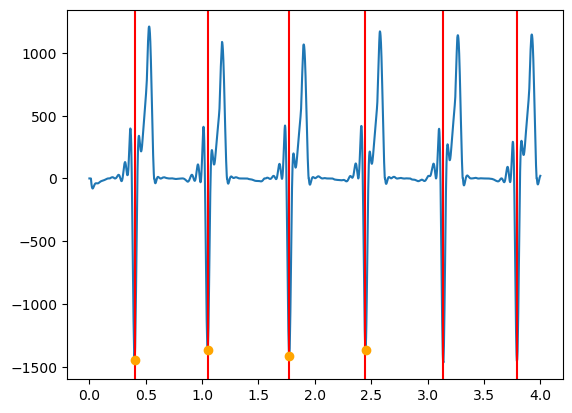

channel  10
[ 70 113 176 225 277 279 348 350 352 427 605]
[ 72 115 118 174 176 279 354 427 603 608]
[ 77 177 225 279 351 355 427 606]
[ 88 176 280 350 354 427 606 608]


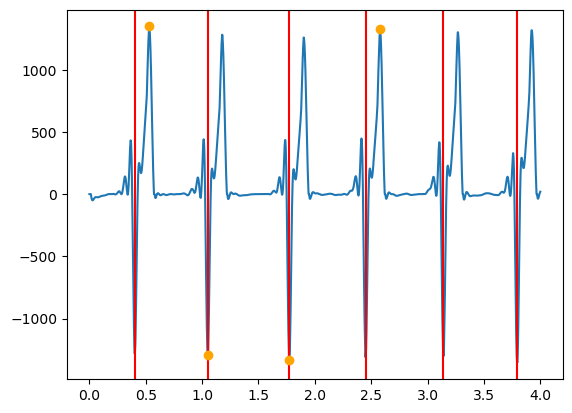

channel  11
[  7  66 179 279 353 427 606]
[  1  71 177 226 281 353 427 606 609]
[ 85 113 177 278 349 353 426 606]
[ 92 110 178 226 280 350 352 427 608]


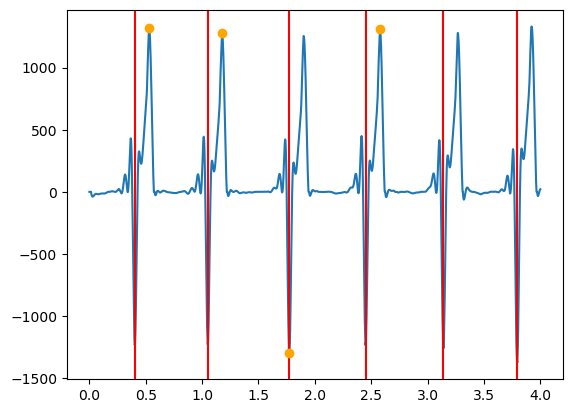

channel  12
[ 65 182 280 426 605]
[  1  68 179 278 280 348 350 352 425 604 606 608]
[ 76 179 181 277 279 350 354 426 606]
[ 82 178 278 425 607]


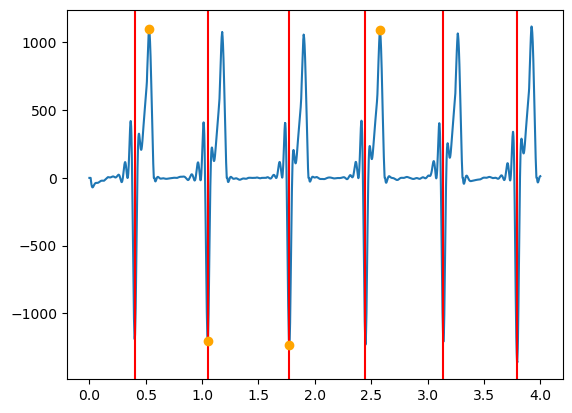

channel  13
[ 67 172 225 281 354 428 605 609]
[ 66 110 112 115 173 282 355 431 607 609]
[ 16  86  97 174 224 283 354 431 605 608 612]
[168 282 430 603 606 609 613]


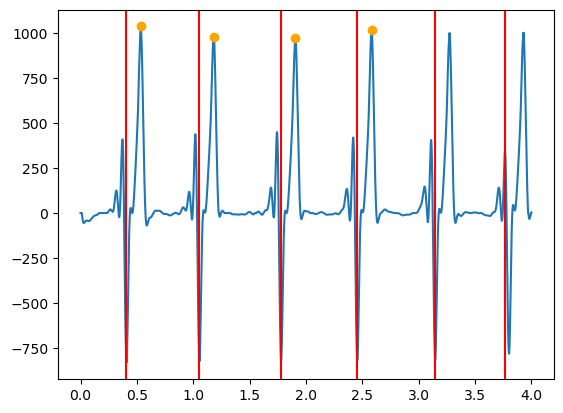

channel  14
[ 74 176 225 280 352 354 427 606 609]
[ 73 174 281 429 606 610 612 615]
[ 12  90  92  96 108 175 226 280 351 354 357 428 608 612]
[172 280 282 355 429 608 612 614]


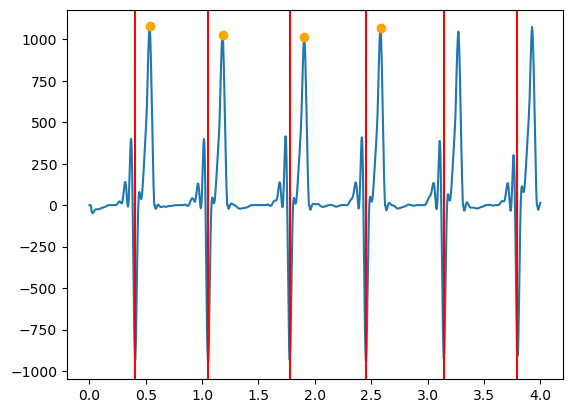

channel  15
[ 70 177 279 281 354 427 609]
[ 77 120 175 279 352 427 610]
[ 85 177 224 280 351 353 427 610]
[175 280 351 427 607 609 612]


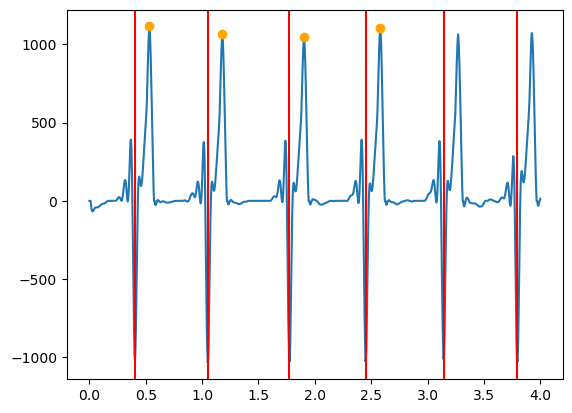

channel  16
[ 64 180 281 349 351 353 426 609]
[ 76 119 178 280 351 426 602 607 611]
[ 82 178 277 279 350 426 607 609]
[ 10  92  97 177 223 280 352 425 607 610]


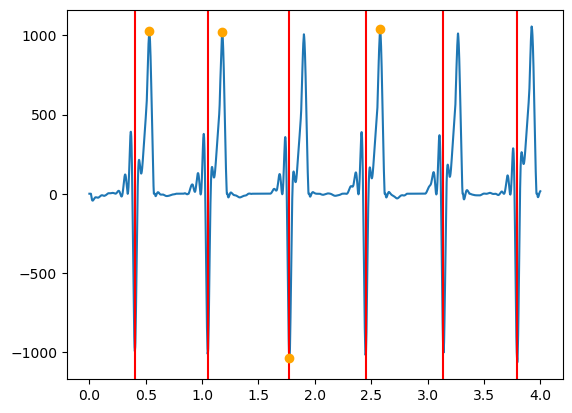

channel  17
[ 86 101 171 283 353 427 607 611 613]
[ 46 154 159 163 229 284 343 488 659 664 667 670 674]
[ 91 172 225 283 355 429 603 607 609 613]
[168 284 428 603 609 613 615]


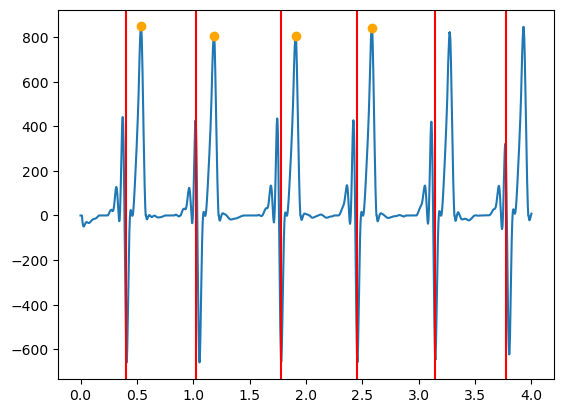

channel  18
[ 74 176 225 281 354 427 607 609 612]
[ 77 116 174 282 355 428 603 606 610 613]
[ 89 102 175 226 282 353 355 428 608 612 615]
[171 282 355 426 602 606 608 610 613]


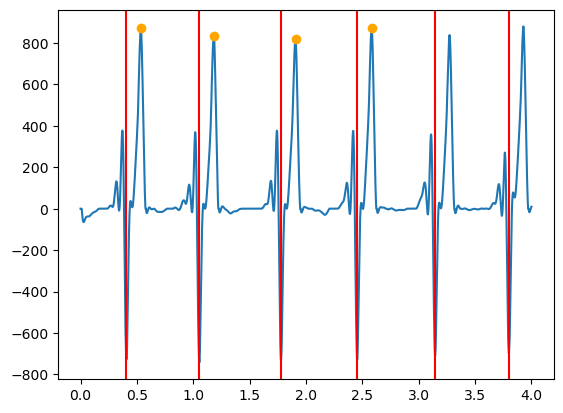

channel  19
[ 67 178 280 282 353 427 606 610]
[ 76 115 177 224 280 353 427 606 610 613]
[ 89 108 176 224 279 353 427 608 612]
[174 224 280 354 427 603 608 613]


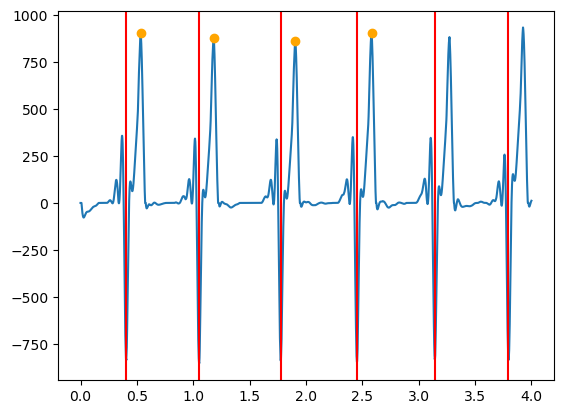

channel  2
[  9  12  16  67 184 281 427 607]
[ 71 180 281 348 426 603 605]
[ 74 179 278 351 426 606]
[ 80 181 280 351 426 605]


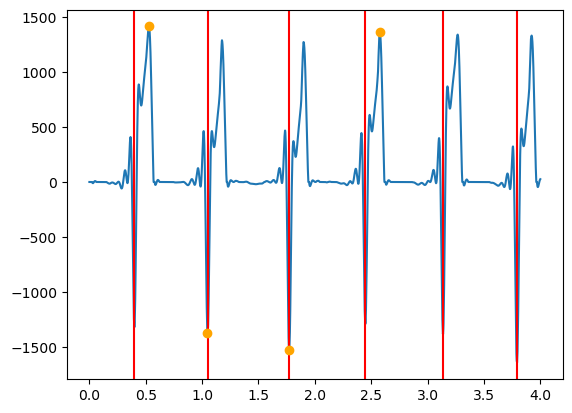

channel  3
[ 70 179 181 275 350 426 602]
[ 77 181 228 276 278 429 607]
[ 69 181 280 429 610]
[ 83 177 179 278 350 425 605]


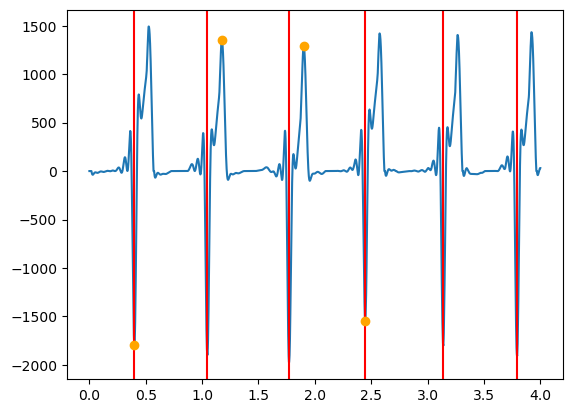

channel  4
[ 68 178 180 278 350 352 428 607]
[ 72 116 176 178 279 352 427 607]
[ 75 178 279 351 355 428 608]
[ 15  19  90 177 278 350 352 428 607]


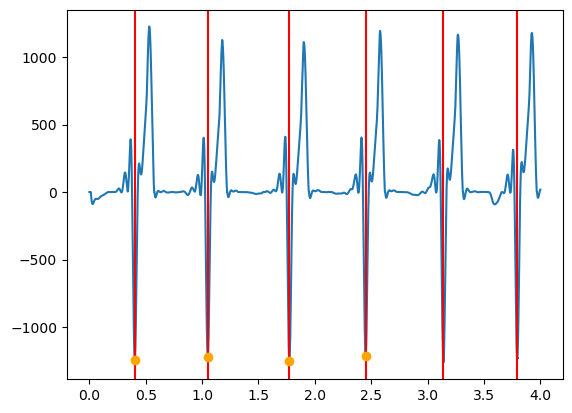

channel  5
[ 68 179 277 279 353 428 607]
[ 71 176 279 352 428 608]
[ 75 177 179 278 354 428 608]
[ 12  17  83 177 279 351 353 427 606]


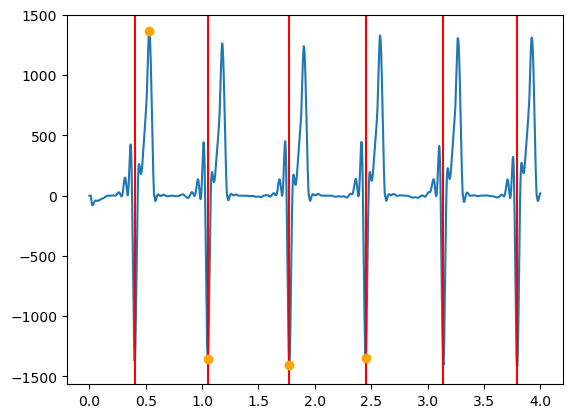

channel  6
[ 77  81  85  90  95  97 101 103 106 189 193 196 203 210 221 223 230 282
 427 611 615 619 621 623 625 627]
[181 244 248 250 253 258 260 272 275 438 441 444 446 450 455 458 466 606
 609 611 613 615 618 622]
[ 48 168 274 429 437 439 441 444 449 453 464 466 610 612]
[142 148 151 155 159 161 163 166 168 171 175 178 182 238 268 272 275 277
 423 430 433 435 437 440 445 448 609 611 614]


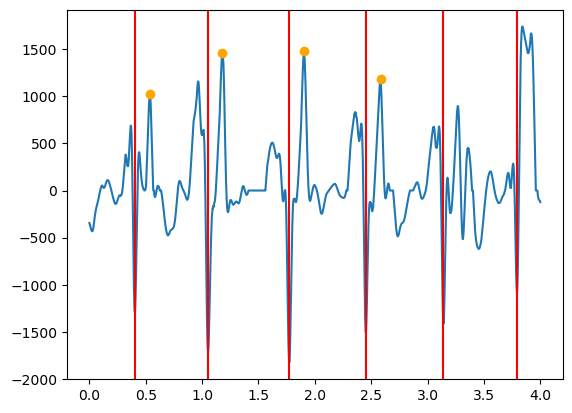

channel  7
[ 65 179 280 351 426 602 604]
[ 69 178 280 350 354 425 603 609]
[ 67 180 278 280 351 426 607]
[ 18  80 177 279 352 425 608]


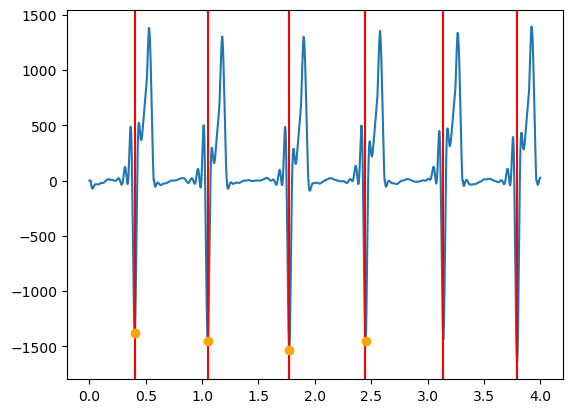

channel  8
[ 71 172 225 278 281 352 354 427 610]
[ 65 174 280 282 353 355 429 608 611 616]
[ 85 173 225 279 281 353 355 427 611]
[ 15 170 281 354 356 428 608 611 615]


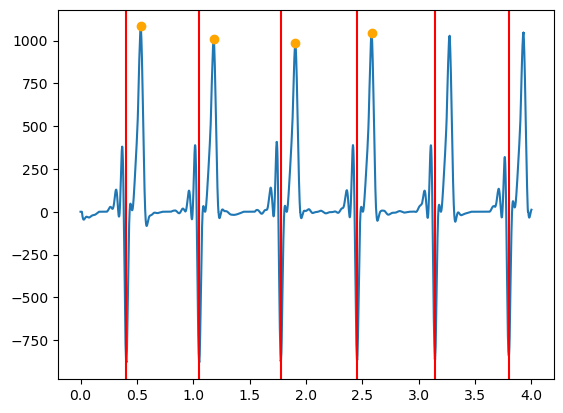

channel  9
[ 72 177 225 278 280 351 355 428 606]
[ 72 176 282 355 357 430 611]
[ 75 177 280 428 609]
[175 280 352 428 611]


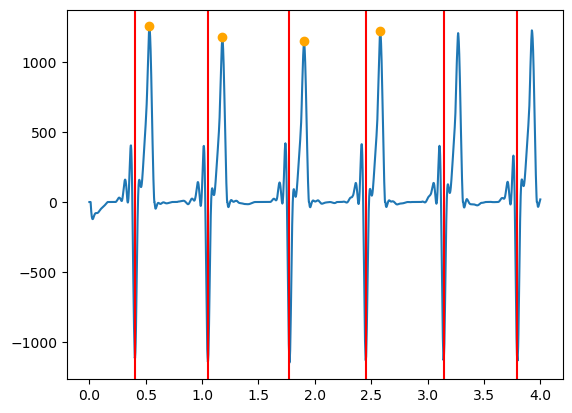

In [59]:
def plotTraces(rMP, peaks_per_channel):

    for ch in rMP.preprocessed_data.columns:
        print('channel ', ch)
    #peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=2000,verbose=False)
    
        # Get the peak indices for channel 1
        channel_1_peaks = peaks_per_channel[ch]/rMP.metadata['amplifier_sample_rate']
        plt.plot(rMP.preprocessed_data[ch][:4])
        for i in channel_1_peaks[:6]:
            plt.axvline(i, color = 'r')

        
        for peak_peaksch in peaks_per_channel[ch][:4]:
            signal_segment = rMP.preprocessed_data[ch][0:60].values
            tallest_peak = find_r_peak(signal_segment, peak_peaksch, search_window=350) # peaks_per_channel[ch][0]
            plt.plot(tallest_peak/rMP.metadata['amplifier_sample_rate'], signal_segment[tallest_peak], 'o', color = 'orange')
            
        plt.show()


""" for ch in rMP.preprocessed_data.columns:
        peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=2000,verbose=False)
        print(ch, len(peaksch))
        peaks_per_channel[ch] = peaksch#wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=2000,verbose=False)
    print('peaks_per_channel', peaks_per_channel)


    for ch in rMP.preprocessed_data.columns:
        if ch == '10':
            print('ch', ch)

            #plt.plot(r_peak)

            print(rMP.preprocessed_data[ch][:6])
            plt.plot(rMP.preprocessed_data[ch][:4])
            peaks = peaks_per_channel[ch]/rMP.metadata['amplifier_sample_rate']
            for i in peaks[:6]:
                print(i)
                plt.axvline(i, color = 'r')
            plt.show()
 """
plotTraces(rMP, peaks_per_channel)

### Finding the 3 most significant peaks ADDED TO FINAL CODE

assume first is the R peak
Basically the 3 biggest peaks in the channel
Can find delay between these 3 peaks vs another channel’s 3peaks (it should be quite similar – good check if you’ve actually got a delay)
Take one of the 3 (not an average)


In [2]:
def find_3_peaks(signal_segment, center_index, search_window):

    start = max(0, center_index - search_window)
    end = min(len(signal_segment), center_index + search_window)

    search_area = signal_segment[start:end]
    #peaks, _ = find_peaks(search_area)
    pos_peaks, _ = signal.find_peaks(search_area)  # find the index of the peak 
    neg_peaks, _ = signal.find_peaks(-search_area)  # Flip the signal to find negative peaks

    # Combine both types of peaks
    all_peaks = np.concatenate([pos_peaks, neg_peaks])
    all_peaks = sorted(all_peaks) 
    #print(all_peaks)

    three_peaks = []
    #three_peaks_vals = []  # NEW LINE
    if len(all_peaks) < 3:
        print('less than 3 peaks found') # Fallback if no peaks are found
        return None #np.array([center_index]*3) #DONT RETURN ANYTHING...... CAN'T BE A VALID CYCLE IF U DON'T FIND ANY PEAKS AROUND IT
    else:
        tallest_peak_idx = all_peaks[np.argmax(np.abs(search_area.iloc[all_peaks]))]  # REMOVE .iloc if it causes issues
        #tallest_peak_idx = all_peaks[np.argmax(np.abs(search_area[all_peaks]))]
        r_peak_index = start + tallest_peak_idx
        #print('first r_peak_index', r_peak_index)
        three_peaks.append(r_peak_index)
        all_peaks.remove(tallest_peak_idx)


        while len(three_peaks) < 3  and len(all_peaks) != 0:
            #print('all_peaks', all_peaks)
            tallest_peak_idx = all_peaks[np.argmax(np.abs(search_area.iloc[all_peaks]))]  # REMOVE .iloc if it causes issues
            #tallest_peak_idx = all_peaks[np.argmax(np.abs(search_area[all_peaks]))] 
            # some detect peaks are too close to each other so i only consider the ones outside ±15 as a different peak
            if np.min(np.abs(start + tallest_peak_idx - np.array(three_peaks))) > 15:
                r_peak_index = start + tallest_peak_idx
                #print('first r_peak_index', r_peak_index)
                three_peaks.append(r_peak_index)
                #three_peaks_vals.append(signal_segment[r_peak_index]) ## NEW LINE

            else:
                pass
                #print('detected peak is too close to previous detected peak')

            all_peaks.remove(tallest_peak_idx)

        if len(three_peaks) < 3:
            return None

        return np.sort(three_peaks)#, center_index

### Reading raw data file, computing delays and saving a feature matrix

let's find 3 peaks for every cycle

just take the first of these 3 peaks - NB I TOOK THE 3RD PEAK AS IT LOOKED MORE CONSISTENT!!

put it into your new firstof3peaks_per_channel

In [5]:
import os, re, glob
import wfdb.processing
import numpy as np
import pandas as pd
import os, re, glob
import matplotlib.pyplot as plt
from biolab.bspm import BSPM
from biolab.utils import apply2all
import plotly.express as px
import plotly.graph_objects as go
from scipy.signal import find_peaks
import scipy.signal as signal


def SaveToExcel(df, path):
    if os.path.exists(path):
        existing_df = pd.read_excel(path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()
        combined_df.to_excel(path, index=False)
        print("Data merged and saved to Excel file.")
    else:
        df.to_excel(path, index=False)
        print("Excel file created with new data.")

def plotTraces(data, peaks_per_channel, three_peak_groups, patient, rise_times, fall_times):
    for ch in data.columns:
        #if ch == '10' or ch == '1':
        #ch = '1'
        print('patient', patient)
        print('channel ', ch)
        plt.figure(figsize=(12, 4))
        #plt.ylim(-700, 1200)
        channel_1_peaks = np.array(peaks_per_channel[int(ch)])/2000
        plt.plot(np.arange(0, len(data[ch][:9000].values))/2000, data[ch][:9000].values)  # plotting blue trace

        for i in channel_1_peaks[:8]: #5?
            print('i', i)
            plt.axvline(i, color = 'r')  # plotting red line

        signal_segment = data[ch].values

        for peak in three_peak_groups[ch][:21]: # 18
            plt.plot(peak/2000, signal_segment[peak], 'o', color = 'orange') 
        
        for peak in three_peak_groups[ch][:18]:
            print('peak', peak)
            print('peak in secs', peak/2000) 

        """ for peak in rise_times[ch][:7]:
            plt.plot(peak/2000, signal_segment[peak], 'o', color = 'red')
        for peak in fall_times[ch][:7]:
            plt.plot(peak/2000, signal_segment[peak], 'o', color = 'blue') """
    
                # axis labels and title
        plt.xlabel('Time /s')
        plt.ylabel('Electric potential /mV')
        plt.title(f'Patient {patient} – Channel {ch}')
        
        # only show legend once
        plt.legend(loc='upper right', fontsize='small')
        
        plt.tight_layout()
        
        plt.show()

""" def plotTraces(rMP, peaks_per_channel, three_peak_groups, patient, rise_times, fall_times):
    for ch in rMP.preprocessed_data.columns:
        #if ch == '10' or ch == '1':
        #ch = '1'
        print('patient', patient)
        print('channel ', ch)
        plt.figure(figsize=(12, 4))
        channel_1_peaks = peaks_per_channel[ch]/rMP.metadata['amplifier_sample_rate']
        plt.plot(np.arange(0, len(rMP.preprocessed_data[ch][:5].values))/rMP.metadata['amplifier_sample_rate'], rMP.preprocessed_data[ch][:5].values)  # plotting blue trace

        for i in channel_1_peaks[:6]:
            print('i', i)
            plt.axvline(i, color = 'r')  # plotting red line

        signal_segment = rMP.preprocessed_data[ch][:60].values

        for peak in three_peak_groups[ch][:18]:
            plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o', color = 'orange') 
        
        for peak in three_peak_groups[ch][:18]:
            print('peak', peak)
            print('peak in secs', peak/rMP.metadata['amplifier_sample_rate']) 

        for peak in rise_times[ch][:7]:
            plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o', color = 'red')
        for peak in fall_times[ch][:7]:
            plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o', color = 'blue')

        plt.show() """

            
def fun2(data, stage, firstof3peaks_per_channel, patientnum, third_peak_val, third_peak_width, SWdw, wfdbpeaktimestamps):

    # Get the peak indices for channel 1
    channel_1_peaks = firstof3peaks_per_channel[data.columns[0]]
    #wfdb_channel_peak_timestamps = wfdbpeaktimestamps[data.columns[0]]
    #print('found channel_1_peaks of length', len(channel_1_peaks))

    # Initialise list to store delays for valid cycles
    delays_all_ch = []
    peak_val_all_ch = []
    width_all_ch = []
    timestamps_all_ch = []
    # Define ECG peak delay tolerance
    tolerance = 20 # with 60 everything is in, to remove anomolies, i am going down to 10
    # THIS IS IN INDEX VALUES 0.025  # now 10ms; 100ms = 0.05 * 2000 = 0.1s, maybe let's try bit bigger with 0.1*2000 = 200ms
    
    num_valid_cycles = 0
    # Calculate delays for each cycle
    for peak_1 in channel_1_peaks:
        #print('peak_1', peak_1)
        delay_ch = []
        peak_val_ch = []
        width_ch = []
        timestamps_ch = []
        valid_cycle = True
        for ch in data.columns[1:]:  # Skip channel 1, compare all others to it
            wfdbtimestamps = wfdbpeaktimestamps[ch]  # Get the timestamps for the current channel
            channel_peaks = firstof3peaks_per_channel[ch]
            channel_peaks_val = third_peak_val[ch]
            channel_peaks_width = third_peak_width[ch]

            print('ch, channel_peaks', ch, channel_peaks)
            # Find the closest peak in the current channel within the tolerance window
            valid_peaks = np.abs(channel_peaks-peak_1)<=tolerance #tolerance*rMP.metadata['amplifier_sample_rate']
            #print(valid_peaks)  # this is boolean, it says True where the peak is within the tolerance
            #print('len(valid_peaks)', len(valid_peaks))


            print('LENGTH', len(channel_peaks))
            print('LENGTH',len(channel_peaks_width))
            print('LENGTH',len(valid_peaks))

            
            if np.any(valid_peaks):  # If there's a valid peak
                closest_peak0 = channel_peaks[valid_peaks][0] # Get the first valid peak
                closest_peak_val = channel_peaks_val[valid_peaks][0]
                closest_peak_width = channel_peaks_width[valid_peaks][0]
                wfdb_timestamp = wfdbtimestamps[valid_peaks][0]  # Get the corresponding timestamp

                #print('first valid peak', closest_peak)
                delay_ch_col0 = (closest_peak0-peak_1)#/rMP.metadata['amplifier_sample_rate'] # Convert to seconds
                print('ch, delay_ch_col0', ch, delay_ch_col0)

                #channel_peak_properties = compute_peak_widths(segment, peak_idx, fs)
                delay_ch.append(delay_ch_col0)
                peak_val_ch.append(closest_peak_val)
                width_ch.append(closest_peak_width)
                timestamps_ch.append(wfdb_timestamp)  # Store the timestamp of the wfdb peak



            else:
                # If any channel does not have a valid peak for this col, skip it and go to the next column
                valid_cycle = False
                print('valid cycle FALSE')
                # delay_ch.append('')
                break 
            # If the cycle was valid, store the delays

        if valid_cycle:
            print('valid cycle TRUE')
            num_valid_cycles += 1
            #elay_ch.append(peak_1)

            delays_all_ch.append(delay_ch)
            peak_val_all_ch.append(peak_val_ch)
            width_all_ch.append(width_ch)
            #peak_timestamps.append(peak_1)  # Store the timestamp of the first peak

            timestamps_all_ch.append(timestamps_ch[0])  # Store the timestamps for all channels
            #peak_property_all_ch.append()

                
        # Convert delays to DataFrame
    if delays_all_ch:  # Only create DataFrame if there are valid cycles
        #print('delays_all_ch', delays_all_ch)

        delay_df = pd.DataFrame(delays_all_ch)
        print('created delays df')
        amplitdue_df = pd.DataFrame(peak_val_all_ch)
        print('created amplitude df')
        widths_df = pd.DataFrame(width_all_ch)
        print('created widths df')
        
        #print('delay_df', delay_df)
        cols_labels, cols_labels2, cols_labels3 = [], [], []
        for ch in data.columns[1:]:
            cols_labels += [f'Delay_ch{ch}']
            cols_labels2 += [f'Amp_ch{ch}']
            cols_labels3 += [f"ratio_rise_fwhm{ch}"]
            
        delay_df.columns = cols_labels
        delay_df['timestamp'] = timestamps_all_ch  # Add timestamps to the delay DataFrame
        amplitdue_df.columns = cols_labels2
        widths_df.columns = cols_labels3

    else:
        delay_df = pd.DataFrame()  # Return an empty DataFrame if no valid cycles are found
        amplitdue_df = pd.DataFrame()
        widths_df = pd.DataFrame()
        print('Return empty DataFrame')

    delay_df['stage'] = [stage] * num_valid_cycles
    delay_df['patient'] = [patientnum] * num_valid_cycles
    delay_df['search_window'] = [SWdw] * num_valid_cycles

    amplitdue_df['stage'] = [stage] * num_valid_cycles
    amplitdue_df['patient'] = [patientnum] * num_valid_cycles
    amplitdue_df['search_window'] = [SWdw] * num_valid_cycles
    
    widths_df['stage'] = [stage] * num_valid_cycles
    widths_df['patient'] = [patientnum] * num_valid_cycles
    widths_df['search_window'] = [SWdw] * num_valid_cycles

    return delay_df, amplitdue_df, widths_df

def compute_peak_widths(signal, peak_index, fs):

    peak_amp = signal[peak_index]
    half_amp = peak_amp / 2.0

    # Rise time - Search backwards for first time signal rises above 50%
    rise_idx = None
    for i in range(peak_index, 0, -1):
        if signal[i] < half_amp and signal[i+1] >= half_amp:
            rise_idx = i
            break

    # Fall time – Search forward for when signal falls below 50%
    fall_idx = None
    for i in range(peak_index, len(signal) - 1):
        if signal[i] >= half_amp and signal[i+1] < half_amp:
            fall_idx = i
            break

    if rise_idx is None or fall_idx is None:
        return None  # couldn't compute feature reliably

    # converting indices to time in mms
    rise_time_ms = (peak_index - rise_idx) * 1000 / fs
    fall_time_ms = (fall_idx - peak_index) * 1000 / fs
    fwhm_ms = rise_time_ms + fall_time_ms

    #print('rise_time_ms', rise_time_ms)
    #print('fall_time_ms', fall_time_ms)
    #print('fwhm_ms', fwhm_ms)

    # ratios
    #ratio_rise_fall = rise_time_ms / fall_time_ms if fall_time_ms != 0 else np.nan
    ratio_rise_fwhm = rise_time_ms / fwhm_ms if fwhm_ms != 0 else np.nan
    #ration_fall_fwhm = fall_time_ms / fwhm_ms if fwhm_ms != 0 else np.nan
    #ratio_fwhm_amp = fwhm_ms / peak_amp if peak_amp != 0 else np.nan

    return ratio_rise_fwhm, rise_idx, fall_idx

In [24]:
import plotly.graph_objects as go
import numpy as np
import os

def plotTracesInteractive(rMP, patient, save_dir=r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/interactiveTraces'):
    sample_rate = rMP.metadata['amplifier_sample_rate']
    
    for ch in rMP.preprocessed_data.columns:
        print('patient:', patient)
        print('channel:', ch)
        
        # Get the data for this channel
        y_data = rMP.preprocessed_data[ch][30:35].values
        x_data = np.arange(0, len(y_data)) / sample_rate  # Convert indices to time
        print(x_data)
        # Create interactive plot
        fig = go.Figure()
        fig.add_trace(go.Scatter(
            x=x_data,
            y=y_data,
            mode='lines+markers',
            name=f'Channel {ch}',
            line=dict(width=0.3),  # Thin line
            marker=dict(size=4),  # Optional: smaller markers
            hovertemplate='Time: %{x:.6f}s<br>Value: %{y:.4f}<extra></extra>'
        ))

        fig.update_layout(
            title=f"Patient {patient} - Channel {ch}",
            xaxis_title='Time (s)',
            yaxis_title='Amplitude',
            hovermode='x',
            width=900,
            height=400
        )

        #fig.show()
        # Save to HTML
        filename = f"{save_dir}/patient_{patient}_channel_{ch}.html"
        fig.write_html(filename)
        print(f"Saved plot to {filename}")

""" def plotTracesInteractive(rMP, patient):

    for ch in rMP.preprocessed_data.columns:
        
        #if ch == '10' or ch == '1':
        print('patient', patient)
        print('channel ', ch)
        
        #plt.figure(figsize=(12, 4))
        #channel_1_peaks = peaks_per_channel[ch]/rMP.metadata['amplifier_sample_rate']

        plt.plot(np.arange(0, len(rMP.preprocessed_data[ch][:5].values))/rMP.metadata['amplifier_sample_rate'], rMP.preprocessed_data[ch][:5].values)  # plotting blue trace

        plt.show() """
"""         for i in channel_1_peaks[:6]:
            print('i', i)
            plt.axvline(i, color = 'r')  # plotting red line

        signal_segment = rMP.preprocessed_data[ch][:60].values

        for peak in three_peak_groups[ch][:18]:
            plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o', color = 'orange') 
        
        for peak in three_peak_groups[ch][:18]:
            print('peak', peak)
            print('peak in secs', peak/rMP.metadata['amplifier_sample_rate']) 
                
            plt.show() """

#plotTracesInteractive(rMP, patient)

"         for i in channel_1_peaks[:6]:\n            print('i', i)\n            plt.axvline(i, color = 'r')  # plotting red line\n\n        signal_segment = rMP.preprocessed_data[ch][:60].values\n\n        for peak in three_peak_groups[ch][:18]:\n            plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o', color = 'orange') \n        \n        for peak in three_peak_groups[ch][:18]:\n            print('peak', peak)\n            print('peak in secs', peak/rMP.metadata['amplifier_sample_rate']) \n                \n            plt.show() "

patient 19
{1: [1275, 3268, 4763, 5713, 6518, 7284, 8485, 9278, 11009, 12884, 13770, 15011, 16213, 17811, 18697, 20237, 21696, 22596, 23386, 24101, 24878, 25749, 27360, 28143, 29640, 31364, 32748, 33804, 35125, 36484, 37302, 38522, 39524, 41420, 43277, 44146, 44925, 45631, 47480, 49507, 50387, 52083, 52915, 54051, 55906, 56786, 58125, 59724, 61484, 62647, 63530, 64393, 66329, 67998, 68890, 70174, 71730, 73383, 74305, 75152, 76800, 78734, 79704, 80648, 82483, 84137, 85119, 85973, 87536, 89327, 90211, 91295, 93006, 94347, 95274, 96928, 98477, 99657, 100518, 101659, 103611, 104531, 105459, 107297, 109040, 109932, 110753, 112527, 114421, 115325, 116719, 118448, 119493], 2: [1275, 3259, 4761, 5708, 6517, 7282, 8485, 9274, 11008, 12880, 13767, 15009, 16212, 17808, 18695, 20230, 21689, 22595, 23385, 24097, 24878, 25748, 27358, 28135, 29639, 31363, 32736, 33803, 35124, 36483, 37301, 38523, 39463, 41420, 43268, 44146, 44920, 45631, 47473, 49505, 50385, 52083, 52912, 54051, 55903, 56776, 58124, 

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


Could not compute ratio for this peak.
channel  8
Could not compute ratio for this peak.
channel  9
patient 19
channel  1
i 0.6375
i 1.634
i 2.3815
i 2.8565
i 3.259
i 3.642
i 4.2425
i 4.639
peak 1203
peak in secs 0.6015
peak 1276
peak in secs 0.638
peak 1546
peak in secs 0.773
peak 3197
peak in secs 1.5985
peak 3270
peak in secs 1.635
peak 3529
peak in secs 1.7645
peak 4691
peak in secs 2.3455
peak 4765
peak in secs 2.3825
peak 5029
peak in secs 2.5145
peak 5644
peak in secs 2.822
peak 5715
peak in secs 2.8575
peak 5966
peak in secs 2.983
peak 6450
peak in secs 3.225
peak 6523
peak in secs 3.2615
peak 6770
peak in secs 3.385
peak 7213
peak in secs 3.6065
peak 7287
peak in secs 3.6435
peak 7538
peak in secs 3.769


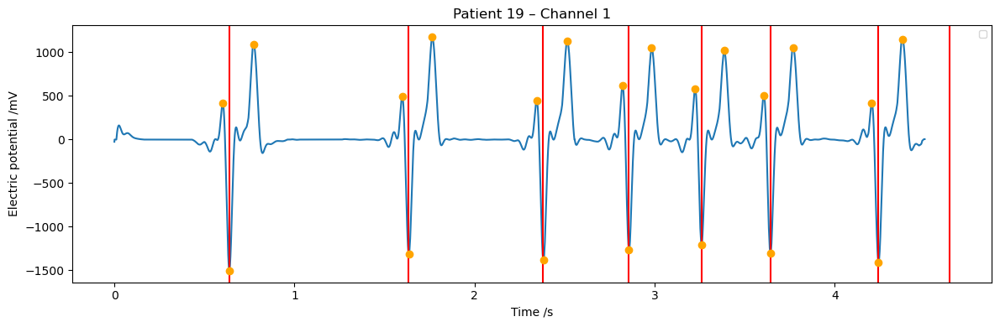

patient 19
channel  10
i 0.6385
i 1.6345
i 2.3825
i 2.8565


No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


i 3.2595
i 3.6425
i 4.2435
i 4.6395
peak 1207
peak in secs 0.6035
peak 1278
peak in secs 0.639
peak 1540
peak in secs 0.77
peak 3204
peak in secs 1.602
peak 3272
peak in secs 1.636
peak 3537
peak in secs 1.7685
peak 4695
peak in secs 2.3475
peak 4769
peak in secs 2.3845
peak 5029
peak in secs 2.5145
peak 5649
peak in secs 2.8245
peak 5717
peak in secs 2.8585
peak 5973
peak in secs 2.9865
peak 6453
peak in secs 3.2265
peak 6523
peak in secs 3.2615
peak 6775
peak in secs 3.3875
peak 7217
peak in secs 3.6085
peak 7288
peak in secs 3.644
peak 7536
peak in secs 3.768


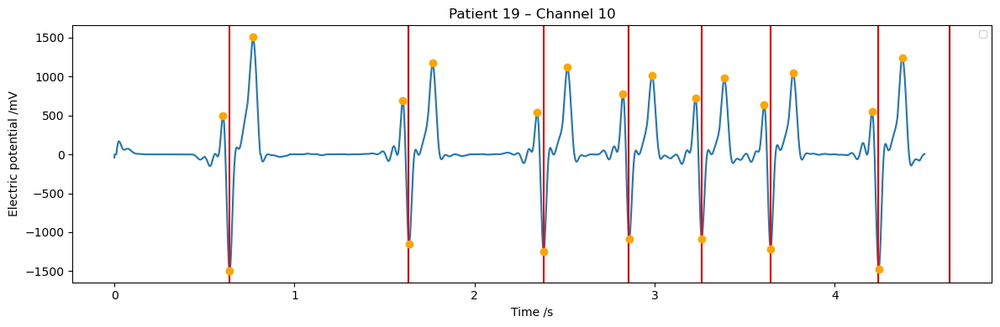

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  11
i 0.634
i 0.9485
i 1.6305
i 2.3805
i 2.8525
i 3.2565
i 3.64
i 4.242
peak 1436
peak in secs 0.718
peak 1469
peak in secs 0.7345
peak 1485
peak in secs 0.7425
peak 3190
peak in secs 1.595
peak 3261
peak in secs 1.6305
peak 3528
peak in secs 1.764
peak 4690
peak in secs 2.345
peak 4764
peak in secs 2.382
peak 5027
peak in secs 2.5135
peak 5633
peak in secs 2.8165
peak 5708
peak in secs 2.854
peak 5965
peak in secs 2.9825
peak 6439
peak in secs 3.2195
peak 6515
peak in secs 3.2575
peak 6770
peak in secs 3.385
peak 7210
peak in secs 3.605
peak 7283
peak in secs 3.6415
peak 7549
peak in secs 3.7745


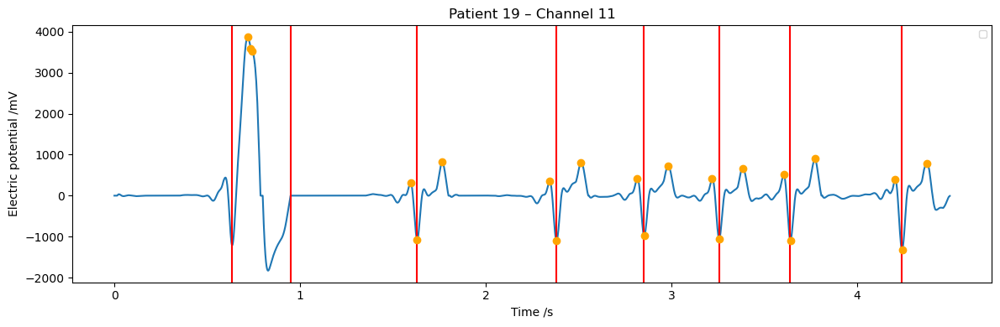

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  12
i 0.6325
i 1.0415
i 1.627
i 2.3785
i 2.85
i 3.2535
i 3.6395
i 4.2405
peak 1266
peak in secs 0.633
peak 1441
peak in secs 0.7205
peak 1591
peak in secs 0.7955
peak 1893
peak in secs 0.9465
peak 2084
peak in secs 1.042
peak 2192
peak in secs 1.096
peak 3181
peak in secs 1.5905
peak 3256
peak in secs 1.628
peak 3527
peak in secs 1.7635
peak 4757
peak in secs 2.3785
peak 4924
peak in secs 2.462
peak 5030
peak in secs 2.515
peak 5625
peak in secs 2.8125
peak 5702
peak in secs 2.851
peak 5966
peak in secs 2.983
peak 6507
peak in secs 3.2535
peak 6583
peak in secs 3.2915
peak 6769
peak in secs 3.3845


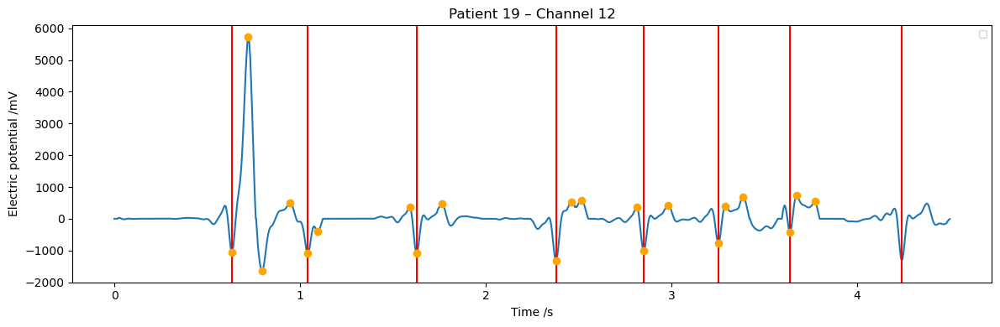

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  13
i 0.64
i 1.6335
i 2.3835
i 2.8555
i 3.2595
i 3.644
i 4.2455
i 4.639
peak 1215
peak in secs 0.6075
peak 1285
peak in secs 0.6425
peak 1554
peak in secs 0.777
peak 3201
peak in secs 1.6005
peak 3270
peak in secs 1.635
peak 3533
peak in secs 1.7665
peak 4702
peak in secs 2.351
peak 4770
peak in secs 2.385
peak 5035
peak in secs 2.5175
peak 5647
peak in secs 2.8235
peak 5717
peak in secs 2.8585
peak 5969
peak in secs 2.9845
peak 6456
peak in secs 3.228
peak 6525
peak in secs 3.2625
peak 6773
peak in secs 3.3865
peak 7224
peak in secs 3.612
peak 7292
peak in secs 3.646
peak 7545
peak in secs 3.7725


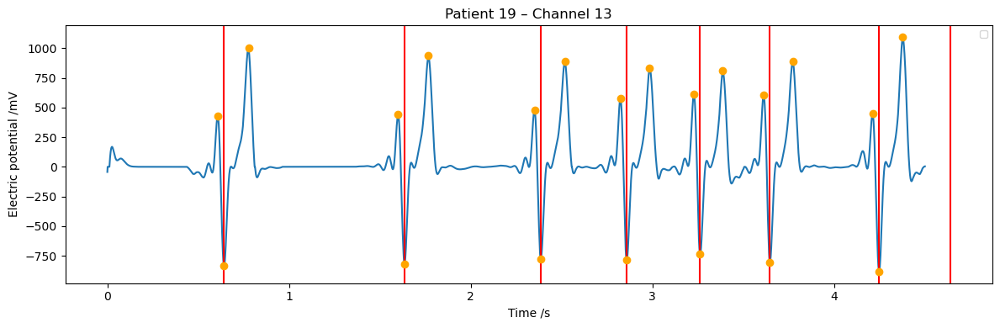

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  14
i 0.6385
i 1.6345
i 2.3825
i 2.8565
i 3.2595
i 3.6435
i 4.244
i 4.64
peak 1210
peak in secs 0.605
peak 1280
peak in secs 0.64
peak 1547
peak in secs 0.7735
peak 3204
peak in secs 1.602
peak 3272
peak in secs 1.636
peak 3538
peak in secs 1.769
peak 4697
peak in secs 2.3485
peak 4768
peak in secs 2.384
peak 5034
peak in secs 2.517
peak 5650
peak in secs 2.825
peak 5719
peak in secs 2.8595
peak 5973
peak in secs 2.9865
peak 6456
peak in secs 3.228
peak 6524
peak in secs 3.262
peak 6780
peak in secs 3.39
peak 7221
peak in secs 3.6105
peak 7294
peak in secs 3.647
peak 7541
peak in secs 3.7705


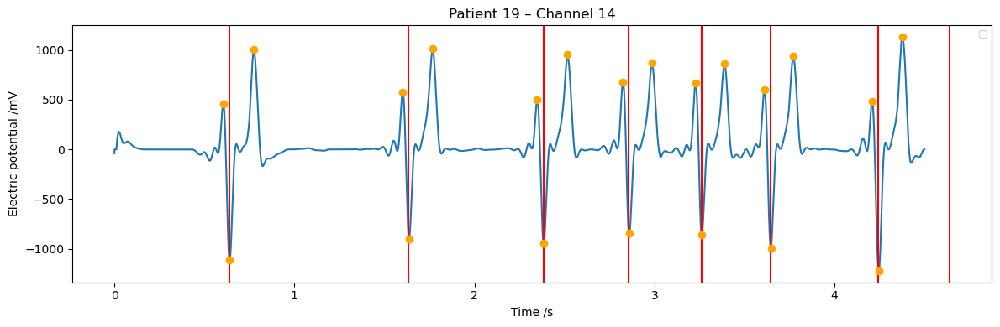

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  15
i 0.637
i 1.632
i 2.381
i 2.8545
i 3.257
i 3.642
i 4.243
i 4.638
peak 1204
peak in secs 0.602
peak 1278
peak in secs 0.639
peak 1497
peak in secs 0.7485
peak 3196
peak in secs 1.598
peak 3267
peak in secs 1.6335
peak 3530
peak in secs 1.765
peak 4694
peak in secs 2.347
peak 4764
peak in secs 2.382
peak 5030
peak in secs 2.515
peak 5642
peak in secs 2.821
peak 5713
peak in secs 2.8565
peak 5965
peak in secs 2.9825
peak 6449
peak in secs 3.2245
peak 6517
peak in secs 3.2585
peak 6775
peak in secs 3.3875
peak 7217
peak in secs 3.6085
peak 7287
peak in secs 3.6435
peak 7541
peak in secs 3.7705


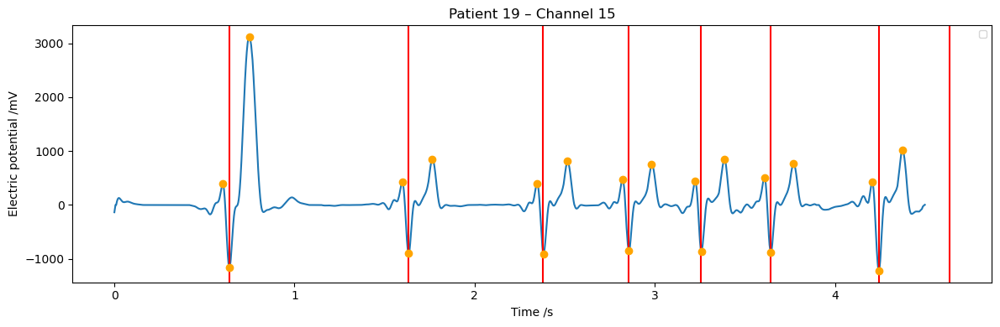

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  16
i 0.3605
i 0.635
i 0.9485
i 1.629
i 2.3805
i 2.852
i 3.256
i 3.6395
peak 795
peak in secs 0.3975
peak 878
peak in secs 0.439
peak 1065
peak in secs 0.5325
peak 1404
peak in secs 0.702
peak 1469
peak in secs 0.7345
peak 1493
peak in secs 0.7465
peak 3188
peak in secs 1.594
peak 3259
peak in secs 1.6295
peak 3527
peak in secs 1.7635
peak 4691
peak in secs 2.3455
peak 4762
peak in secs 2.381
peak 5027
peak in secs 2.5135
peak 5631
peak in secs 2.8155
peak 5706
peak in secs 2.853
peak 5965
peak in secs 2.9825
peak 6436
peak in secs 3.218
peak 6516
peak in secs 3.258
peak 6769
peak in secs 3.3845


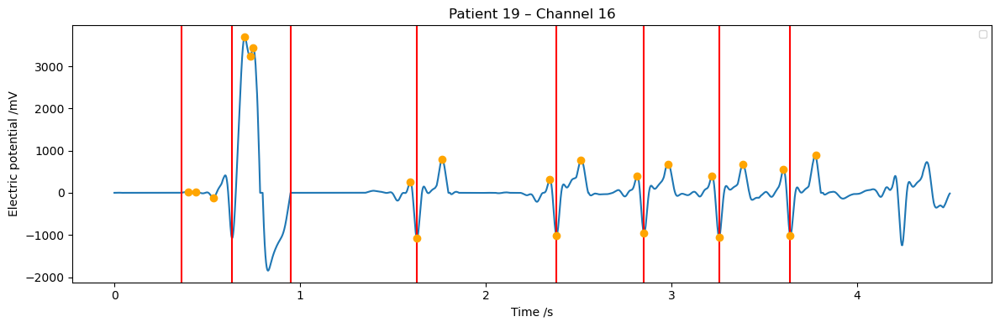

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  17
i 0.639
i 0.952
i 1.6315
i 2.3555
i 2.8275
i 3.2595
i 3.616
i 4.245
peak 1216
peak in secs 0.608
peak 1283
peak in secs 0.6415
peak 1545
peak in secs 0.7725
peak 3199
peak in secs 1.5995
peak 3268
peak in secs 1.634
peak 3538
peak in secs 1.769
peak 4705
peak in secs 2.3525
peak 4773
peak in secs 2.3865
peak 5022
peak in secs 2.511
peak 5648
peak in secs 2.824
peak 5721
peak in secs 2.8605
peak 5981
peak in secs 2.9905
peak 6457
peak in secs 3.2285
peak 6526
peak in secs 3.263
peak 6775
peak in secs 3.3875
peak 7228
peak in secs 3.614
peak 7292
peak in secs 3.646
peak 7540
peak in secs 3.77


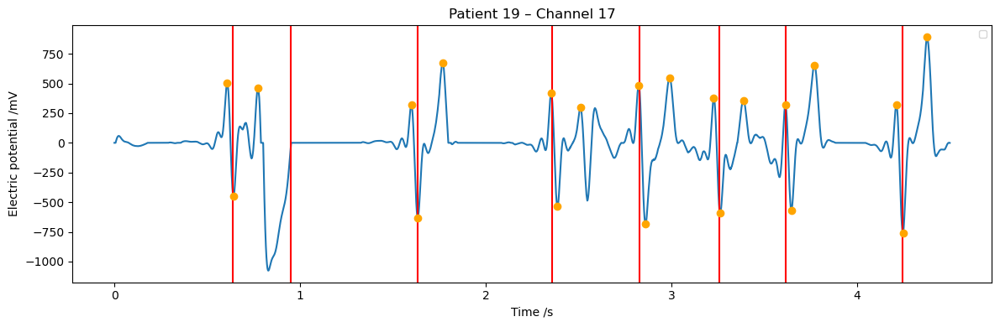

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  18
i 0.639
i 1.633
i 2.3825
i 2.8545
i 3.2585
i 3.6435
i 4.244
i 4.6385
peak 1210
peak in secs 0.605
peak 1283
peak in secs 0.6415
peak 1537
peak in secs 0.7685
peak 3199
peak in secs 1.5995
peak 3269
peak in secs 1.6345
peak 3531
peak in secs 1.7655
peak 4699
peak in secs 2.3495
peak 4770
peak in secs 2.385
peak 5036
peak in secs 2.518
peak 5646
peak in secs 2.823
peak 5715
peak in secs 2.8575
peak 5974
peak in secs 2.987
peak 6455
peak in secs 3.2275
peak 6522
peak in secs 3.261
peak 6780
peak in secs 3.39
peak 7222
peak in secs 3.611
peak 7293
peak in secs 3.6465
peak 7547
peak in secs 3.7735


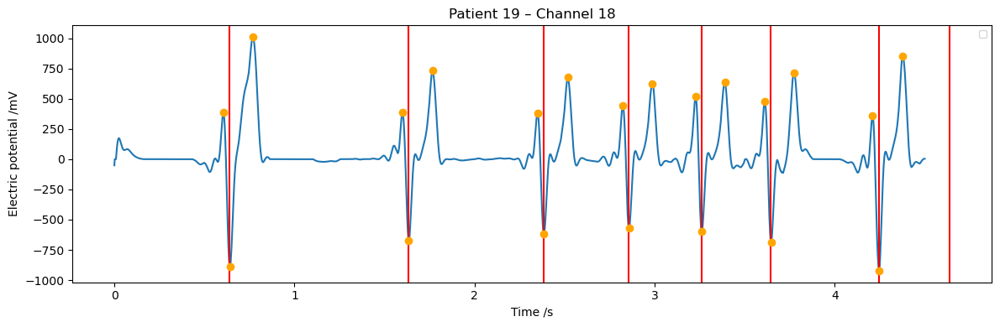

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  19
i 0.391
i 0.636
i 1.6295
i 2.3805
i 2.8525
i 3.256
i 3.641
i 4.243
peak 592
peak in secs 0.296
peak 715
peak in secs 0.3575
peak 1066
peak in secs 0.533
peak 1198
peak in secs 0.599
peak 1274
peak in secs 0.637
peak 1511
peak in secs 0.7555
peak 3188
peak in secs 1.594
peak 3260
peak in secs 1.63
peak 3525
peak in secs 1.7625
peak 4692
peak in secs 2.346
peak 4764
peak in secs 2.382
peak 5027
peak in secs 2.5135
peak 5637
peak in secs 2.8185
peak 5710
peak in secs 2.855
peak 5967
peak in secs 2.9835
peak 6442
peak in secs 3.221
peak 6515
peak in secs 3.2575
peak 6776
peak in secs 3.388


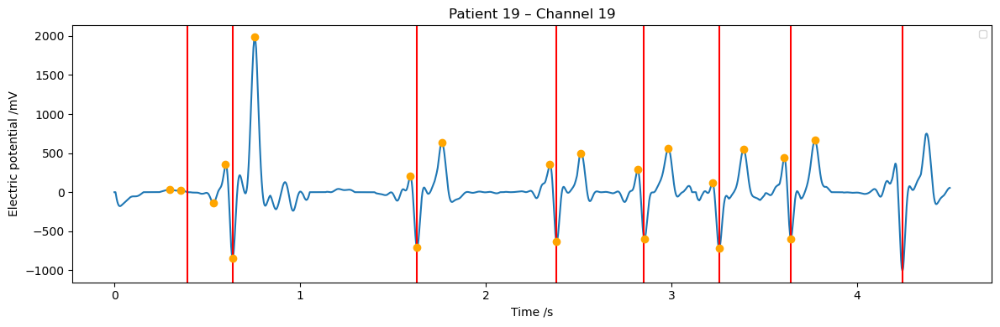

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  2
i 0.6375
i 1.6295
i 2.3805
i 2.854
i 3.2585
i 3.641
i 4.2425
i 4.637
peak 1201
peak in secs 0.6005
peak 1278
peak in secs 0.639
peak 1542
peak in secs 0.771
peak 3258
peak in secs 1.629
peak 3337
peak in secs 1.6685
peak 3525
peak in secs 1.7625
peak 4689
peak in secs 2.3445
peak 4762
peak in secs 2.381
peak 5029
peak in secs 2.5145
peak 5708
peak in secs 2.854
peak 5783
peak in secs 2.8915
peak 5963
peak in secs 2.9815
peak 6448
peak in secs 3.224
peak 6519
peak in secs 3.2595
peak 6774
peak in secs 3.387
peak 7211
peak in secs 3.6055
peak 7284
peak in secs 3.642
peak 7537
peak in secs 3.7685


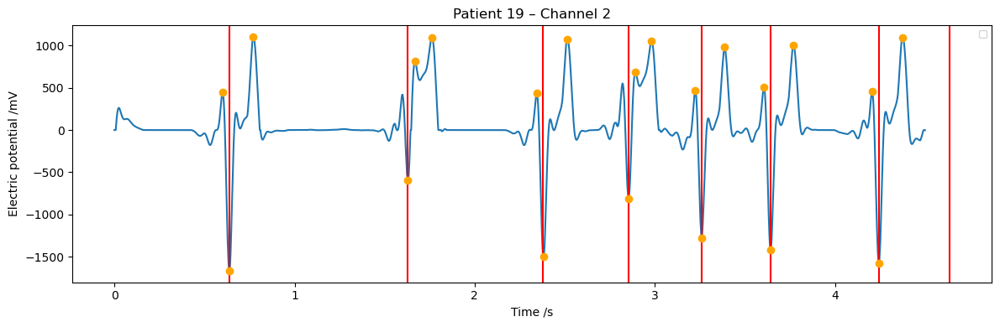

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  3
i 0.6355
i 1.629
i 2.3785
i 2.8515
i 3.2555
i 3.639
i 4.2405
i 4.635
peak 1195
peak in secs 0.5975
peak 1274
peak in secs 0.637
peak 1540
peak in secs 0.77
peak 3258
peak in secs 1.629
peak 3336
peak in secs 1.668
peak 3529
peak in secs 1.7645
peak 4681
peak in secs 2.3405
peak 4758
peak in secs 2.379
peak 5030
peak in secs 2.515
peak 5630
peak in secs 2.815
peak 5704
peak in secs 2.852
peak 5966
peak in secs 2.983
peak 6436
peak in secs 3.218
peak 6513
peak in secs 3.2565
peak 6771
peak in secs 3.3855
peak 7202
peak in secs 3.601
peak 7279
peak in secs 3.6395
peak 7539
peak in secs 3.7695


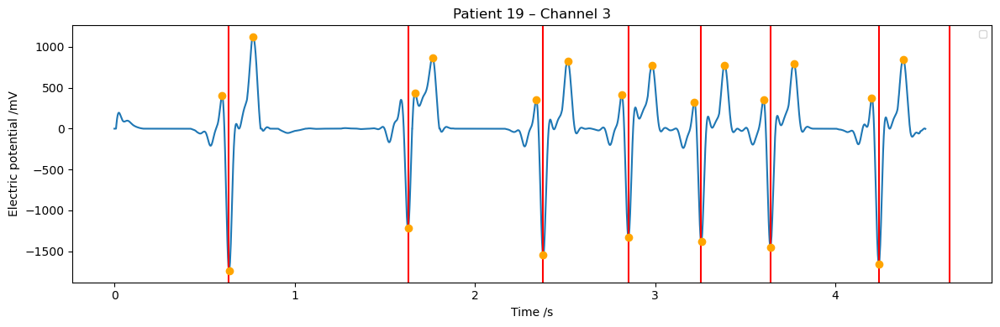

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  4
i 0.639
i 1.634
i 2.383
i 2.8565
i 3.26
i 3.6435
i 4.244
i 4.6395
peak 1208
peak in secs 0.604
peak 1279
peak in secs 0.6395
peak 1546
peak in secs 0.773
peak 3200
peak in secs 1.6
peak 3272
peak in secs 1.636
peak 3531
peak in secs 1.7655
peak 4696
peak in secs 2.348
peak 4768
peak in secs 2.384
peak 5029
peak in secs 2.5145
peak 5646
peak in secs 2.823
peak 5717
peak in secs 2.8585
peak 5969
peak in secs 2.9845
peak 6453
peak in secs 3.2265
peak 6523
peak in secs 3.2615
peak 6771
peak in secs 3.3855
peak 7219
peak in secs 3.6095
peak 7292
peak in secs 3.646
peak 7540
peak in secs 3.77


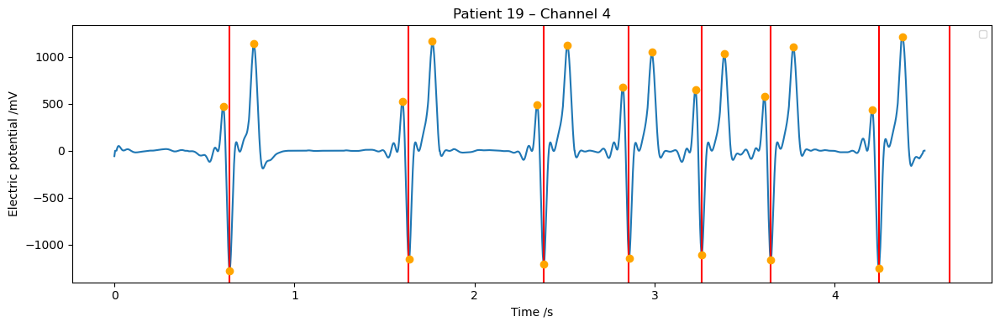

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  5
i 0.639
i 1.636
i 2.383
i 2.8575
i 3.26
i 3.643
i 4.244
i 4.6405
peak 1207
peak in secs 0.6035
peak 1282
peak in secs 0.641
peak 1545
peak in secs 0.7725
peak 3205
peak in secs 1.6025
peak 3276
peak in secs 1.638
peak 3537
peak in secs 1.7685
peak 4695
peak in secs 2.3475
peak 4769
peak in secs 2.3845
peak 5030
peak in secs 2.515
peak 5649
peak in secs 2.8245
peak 5720
peak in secs 2.86
peak 5969
peak in secs 2.9845
peak 6456
peak in secs 3.228
peak 6525
peak in secs 3.2625
peak 6771
peak in secs 3.3855
peak 7218
peak in secs 3.609
peak 7290
peak in secs 3.645
peak 7538
peak in secs 3.769


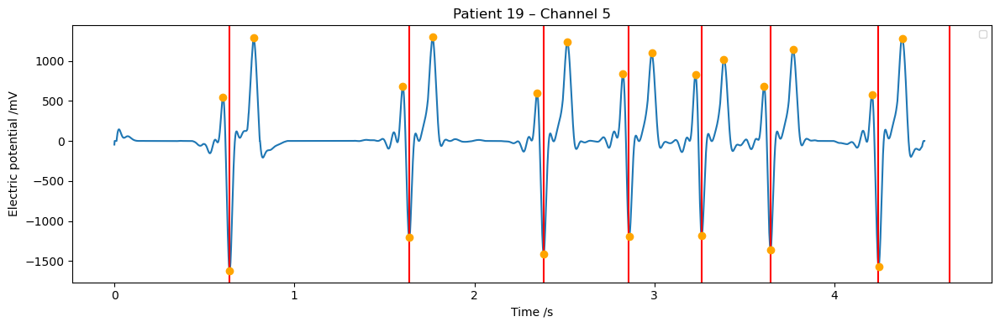

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  6
i 0.638
i 1.634
i 2.3815
i 2.856
i 3.2585
i 3.6415
i 4.243
i 4.639
peak 1203
peak in secs 0.6015
peak 1277
peak in secs 0.6385
peak 1538
peak in secs 0.769
peak 3198
peak in secs 1.599
peak 3270
peak in secs 1.635
peak 3530
peak in secs 1.765
peak 4690
peak in secs 2.345
peak 4766
peak in secs 2.383
peak 5028
peak in secs 2.514
peak 5643
peak in secs 2.8215
peak 5715
peak in secs 2.8575
peak 5968
peak in secs 2.984
peak 6448
peak in secs 3.224
peak 6522
peak in secs 3.261
peak 6769
peak in secs 3.3845
peak 7212
peak in secs 3.606
peak 7285
peak in secs 3.6425
peak 7537
peak in secs 3.7685


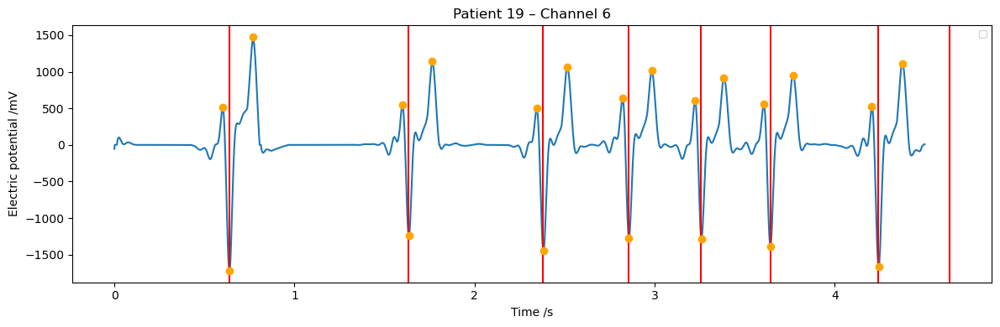

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  7
i 0.6345
i 1.6285
i 2.3785
i 2.8505
i 3.2545
i 3.6385
i 4.2405
i 4.634
peak 1272
peak in secs 0.636
peak 1486
peak in secs 0.743
peak 1502
peak in secs 0.751
peak 3173
peak in secs 1.5865
peak 3256
peak in secs 1.628
peak 3523
peak in secs 1.7615
peak 4555
peak in secs 2.2775
peak 4759
peak in secs 2.3795
peak 5028
peak in secs 2.514
peak 5626
peak in secs 2.813
peak 5704
peak in secs 2.852
peak 5965
peak in secs 2.9825
peak 6434
peak in secs 3.217
peak 6511
peak in secs 3.2555
peak 6770
peak in secs 3.385
peak 7201
peak in secs 3.6005
peak 7279
peak in secs 3.6395
peak 7536
peak in secs 3.768


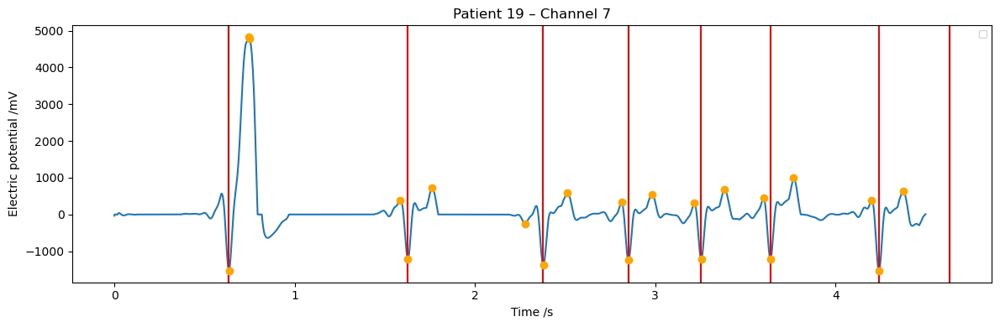

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  8
i 0.3115
i 0.641
i 1.6335
i 2.3835
i 2.8555
i 3.259
i 3.644
i 4.2455
peak 626
peak in secs 0.313
peak 727
peak in secs 0.3635
peak 955
peak in secs 0.4775
peak 1214
peak in secs 0.607
peak 1286
peak in secs 0.643
peak 1552
peak in secs 0.776
peak 3198
peak in secs 1.599
peak 3270
peak in secs 1.635
peak 3531
peak in secs 1.7655
peak 4700
peak in secs 2.35
peak 4772
peak in secs 2.386
peak 5034
peak in secs 2.517
peak 5646
peak in secs 2.823
peak 5717
peak in secs 2.8585
peak 5973
peak in secs 2.9865
peak 6453
peak in secs 3.2265
peak 6523
peak in secs 3.2615
peak 6776
peak in secs 3.388


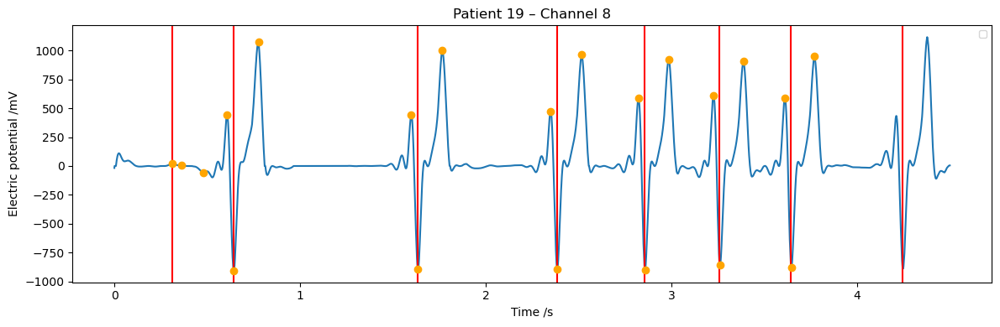

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


patient 19
channel  9
i 0.387
i 0.6405
i 1.634
i 2.3845
i 2.856
i 3.2595
i 3.6445
i 4.2445
peak 892
peak in secs 0.446
peak 1058
peak in secs 0.529
peak 1118
peak in secs 0.559
peak 1211
peak in secs 0.6055
peak 1285
peak in secs 0.6425
peak 1545
peak in secs 0.7725
peak 3201
peak in secs 1.6005
peak 3271
peak in secs 1.6355
peak 3531
peak in secs 1.7655
peak 4700
peak in secs 2.35
peak 4772
peak in secs 2.386
peak 5034
peak in secs 2.517
peak 5646
peak in secs 2.823
peak 5716
peak in secs 2.858
peak 5971
peak in secs 2.9855
peak 6453
peak in secs 3.2265
peak 6521
peak in secs 3.2605
peak 6778
peak in secs 3.389


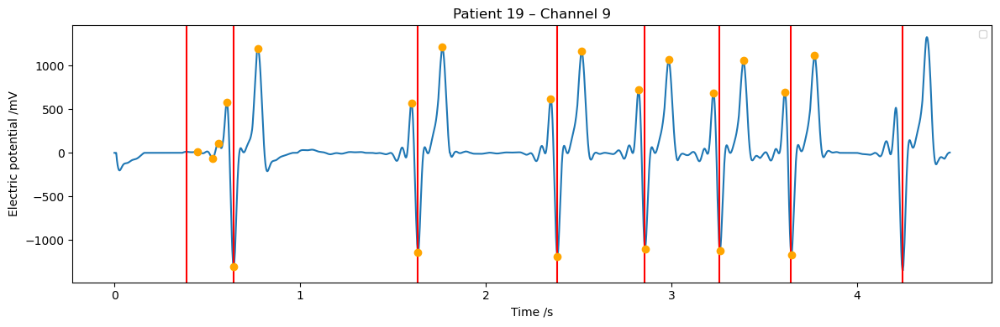

NameError: name 'findDetailsPatient' is not defined

In [6]:
import pandas as pd
import sys

#sws = [150, 200, 250, 300, 350, 400, 450, 500] # search windows in ms
SW = 350
fs = 2000
name = r'V1/'
directory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh20/' + name + r'19.csv'

peaksdirectory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh20/'+name+r'WFDBpeaks/'
# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

""" os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.csv")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)
    #print('fullpath', fullpath)


for fp in bspm_fullpaths:  """
fp = directory
data = pd.read_csv(fp)
patient = fp.split('/')[-1].split('.')[0]
print('patient', patient)

# Load the long-form DataFrame
df_peaks = pd.read_csv(peaksdirectory + str(patient) + '_peaks.csv')

# Rebuild peaks_per_channel dictionary
peaks_per_channel = {
    ch: list(group['peak'].values)
    for ch, group in df_peaks.groupby('channel')}
# Print the dictionary
print(peaks_per_channel)


#for SW in sws:
# finding surrounding peaks with the significant peak at the centre of the serach window
thirdof3peaks_per_channel = {}
all3peaks_per_channel = {}
third_peak_val = {}
third_peak_width = {}
third_peak_rise = {}
third_peak_fall = {}
pearson_corr = {}

wfdbpeaktimestamps = {}

for ch in data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    print('channel ', ch)

    ch_third_peaks = []
    ch_all_three_peaks = []
    ch_third_peak_val = []
    ch_third_peak_width = []
    ch_pearson_corr = []

    peak_timestamps = []

    rise_times = []
    fall_times = []

    if int(ch) not in peaks_per_channel:
        sys.exit()

    for peak_peaksch in peaks_per_channel[int(ch)]:
        signal_segment = data[ch]
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)
            ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])
            peak_timestamps.append(peak_peaksch)

            result = compute_peak_widths(signal_segment, three_tallest_peaks[2], fs)
            if result is not None:
                peak_width, rise_time, fall_time = result
                # Add to other lists if needed
            else:
                print("Could not compute ratio for this peak.")
                peak_width, rise_time, fall_time = np.nan, np.nan, np.nan
            #if peak_width:
                    #print(peak_width)
            ch_third_peak_width.append(peak_width)
            rise_times.append(rise_time)
            fall_times.append(fall_time)

    thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
    third_peak_val[ch] = np.array(ch_third_peak_val)
    third_peak_width[ch] = np.array(ch_third_peak_width)
    third_peak_rise[ch] = np.array(rise_times)
    third_peak_fall[ch] = np.array(fall_times)
    wfdbpeaktimestamps[ch] = np.array(peak_timestamps)


plotTraces(data, peaks_per_channel, all3peaks_per_channel, patient, third_peak_rise, third_peak_fall)


stage = findDetailsPatient(patient)
#excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/stft/stft.xlsx'
#stft_code(data, thirdof3peaks_per_channel, excel_path, patient, stg)
delay_df, amplitdue_df, widths_df = fun2(data, stage, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW, wfdbpeaktimestamps)

#delay_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/'+name+r'delays/delays.xlsx'
#amps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/'+name+r'amps/amps.xlsx'
#widths_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/'+name+r'widths/widths.xlsx'
#SaveToExcel(delay_df, delay_path)
#SaveToExcel(amplitdue_df, amps_path)
#SaveToExcel(widths_df, widths_path)


SW 100
fs 2000
/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_V1/V1_P29_M1.bspm
pateint 29
stage B1
found details
found rMP
1 75
10 75
11 75
12 75
13 75
14 75
15 75
16 75
17 75
18 75
19 75
2 75
3 75
4 76
5 75
6 75
7 75
8 75
9 75
channel  1
channel  10
channel  11
channel  12
channel  13
channel  14
channel  15
channel  16
channel  17
channel  18
channel  19
channel  2
channel  3
less than 3 peaks found
channel  4
less than 3 peaks found
channel  5
channel  6
less than 3 peaks found
channel  7
channel  8
channel  9
patient 29
channel  1
i 0.6855
i 1.439
i 2.1825
i 3.2735
i 4.0105
i 4.9225
peak 1283
peak in secs 0.6415
peak 1369
peak in secs 0.6845
peak 1447
peak in secs 0.7235
peak 2803
peak in secs 1.4015
peak 2875
peak in secs 1.4375
peak 2954
peak in secs 1.477
peak 4272
peak in secs 2.136
peak 4363
peak in secs 2.1815
peak 4443
peak in secs 2.2215
peak 6469
peak in secs 3.2345
peak 6545
peak in secs 3.2725
peak 6624
peak in secs 3.312
peak 7945
peak in secs 3.9725
peak 801

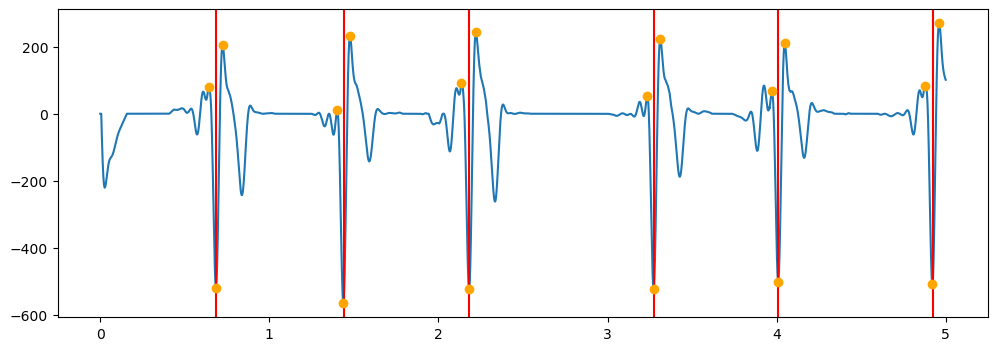

patient 29
channel  10
i 0.6915
i 1.444
i 2.19
i 3.2785
i 4.0155
i 4.9295
peak 1312
peak in secs 0.656
peak 1383
peak in secs 0.6915
peak 1458
peak in secs 0.729
peak 2818
peak in secs 1.409
peak 2889
peak in secs 1.4445
peak 2963
peak in secs 1.4815
peak 4310
peak in secs 2.155
peak 4380
peak in secs 2.19
peak 4455
peak in secs 2.2275
peak 6487
peak in secs 3.2435
peak 6559
peak in secs 3.2795
peak 6634
peak in secs 3.317
peak 7962
peak in secs 3.981
peak 8032
peak in secs 4.016
peak 8107
peak in secs 4.0535
peak 9788
peak in secs 4.894
peak 9858
peak in secs 4.929
peak 9934
peak in secs 4.967


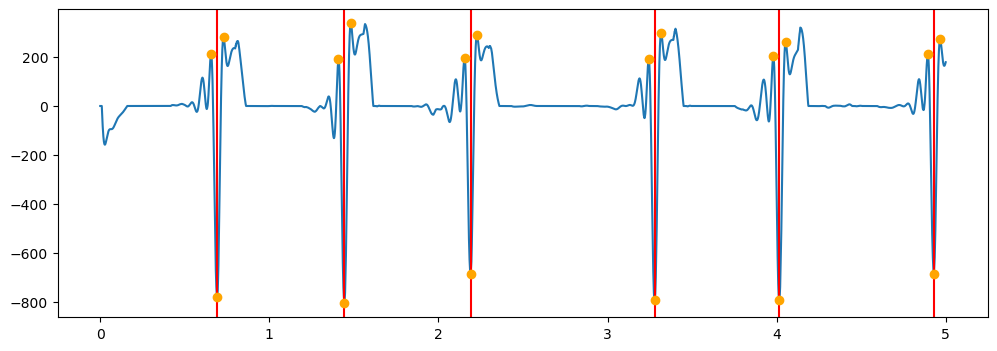

patient 29
channel  11
i 0.689
i 1.4415
i 2.187
i 3.277
i 4.014
i 4.9265
peak 1306
peak in secs 0.653
peak 1377
peak in secs 0.6885
peak 1453
peak in secs 0.7265
peak 2815
peak in secs 1.4075
peak 2882
peak in secs 1.441
peak 2959
peak in secs 1.4795
peak 4302
peak in secs 2.151
peak 4372
peak in secs 2.186
peak 4451
peak in secs 2.2255
peak 6483
peak in secs 3.2415
peak 6553
peak in secs 3.2765
peak 6630
peak in secs 3.315
peak 7958
peak in secs 3.979
peak 8026
peak in secs 4.013
peak 8104
peak in secs 4.052
peak 9784
peak in secs 4.892
peak 9851
peak in secs 4.9255
peak 9925
peak in secs 4.9625


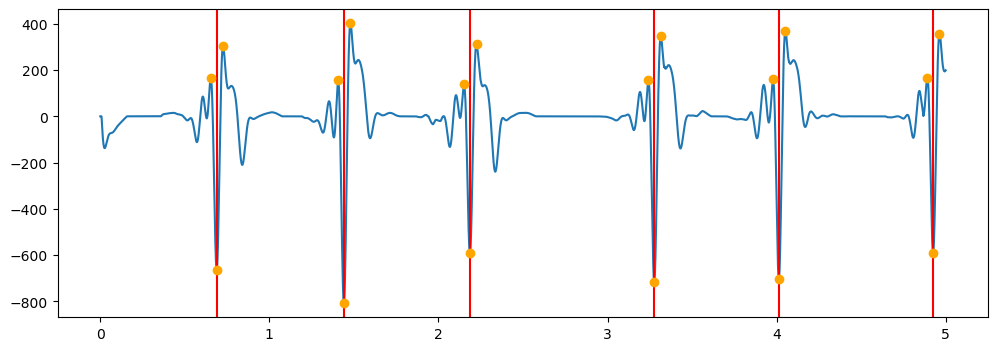

patient 29
channel  12
i 0.687
i 1.44
i 2.1845
i 3.275
i 4.012
i 4.924
peak 1301
peak in secs 0.6505
peak 1372
peak in secs 0.686
peak 1449
peak in secs 0.7245
peak 2808
peak in secs 1.404
peak 2878
peak in secs 1.439
peak 2954
peak in secs 1.477
peak 4285
peak in secs 2.1425
peak 4366
peak in secs 2.183
peak 4446
peak in secs 2.223
peak 6477
peak in secs 3.2385
peak 6548
peak in secs 3.274
peak 6625
peak in secs 3.3125
peak 7948
peak in secs 3.974
peak 8022
peak in secs 4.011
peak 8100
peak in secs 4.05
peak 9774
peak in secs 4.887
peak 9845
peak in secs 4.9225
peak 9923
peak in secs 4.9615


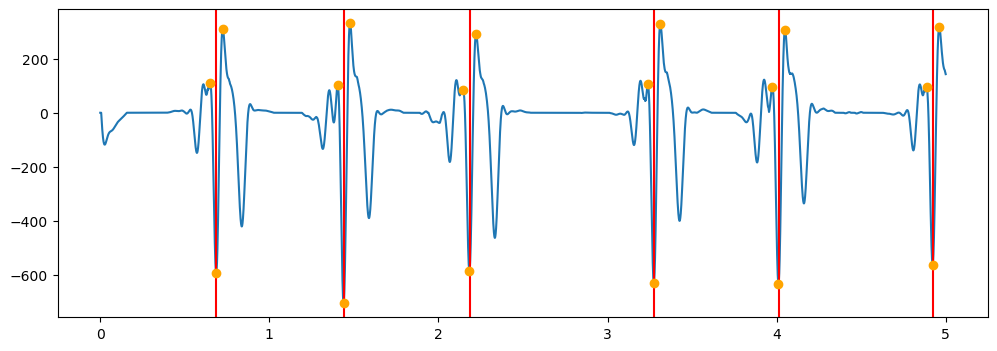

patient 29
channel  13
i 0.6955
i 1.448
i 2.1935
i 3.2835
i 4.0205
i 4.9325
peak 1325
peak in secs 0.6625
peak 1393
peak in secs 0.6965
peak 1465
peak in secs 0.7325
peak 2832
peak in secs 1.416
peak 2898
peak in secs 1.449
peak 2971
peak in secs 1.4855
peak 4320
peak in secs 2.16
peak 4389
peak in secs 2.1945
peak 4462
peak in secs 2.231
peak 6501
peak in secs 3.2505
peak 6569
peak in secs 3.2845
peak 6641
peak in secs 3.3205
peak 7975
peak in secs 3.9875
peak 8045
peak in secs 4.0225
peak 8113
peak in secs 4.0565
peak 9799
peak in secs 4.8995
peak 9869
peak in secs 4.9345
peak 9939
peak in secs 4.9695


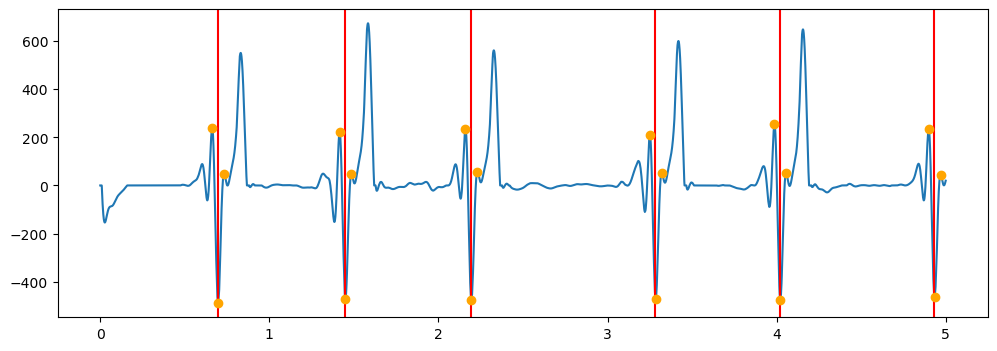

patient 29
channel  14
i 0.692
i 1.4445
i 2.191
i 3.279
i 4.017
i 4.93
peak 1313
peak in secs 0.6565
peak 1384
peak in secs 0.692
peak 1460
peak in secs 0.73
peak 2821
peak in secs 1.4105
peak 2889
peak in secs 1.4445
peak 2965
peak in secs 1.4825
peak 4311
peak in secs 2.1555
peak 4384
peak in secs 2.192
peak 4458
peak in secs 2.229
peak 6491
peak in secs 3.2455
peak 6560
peak in secs 3.28
peak 6636
peak in secs 3.318
peak 7965
peak in secs 3.9825
peak 8035
peak in secs 4.0175
peak 8108
peak in secs 4.054
peak 9791
peak in secs 4.8955
peak 9861
peak in secs 4.9305
peak 9935
peak in secs 4.9675


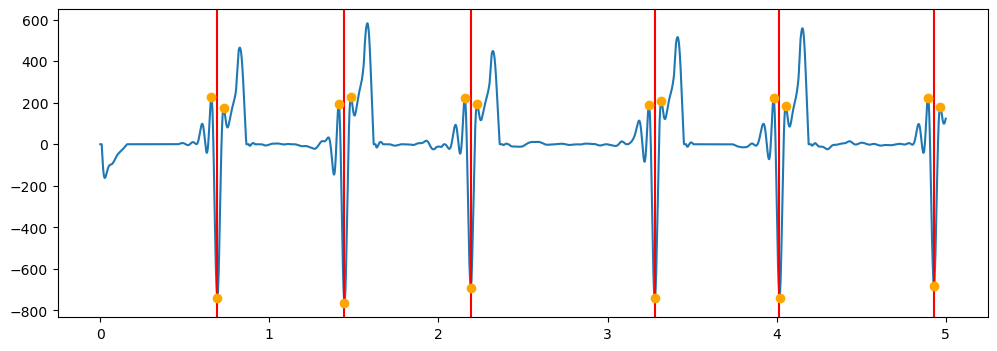

patient 29
channel  15
i 0.6915
i 1.444
i 2.1905
i 3.279
i 4.0165
i 4.9295
peak 1314
peak in secs 0.657
peak 1386
peak in secs 0.693
peak 1457
peak in secs 0.7285
peak 2818
peak in secs 1.409
peak 2887
peak in secs 1.4435
peak 2962
peak in secs 1.481
peak 4312
peak in secs 2.156
peak 4382
peak in secs 2.191
peak 4455
peak in secs 2.2275
peak 6488
peak in secs 3.244
peak 6557
peak in secs 3.2785
peak 6631
peak in secs 3.3155
peak 7962
peak in secs 3.981
peak 8032
peak in secs 4.016
peak 8107
peak in secs 4.0535
peak 9792
peak in secs 4.896
peak 9858
peak in secs 4.929
peak 9933
peak in secs 4.9665


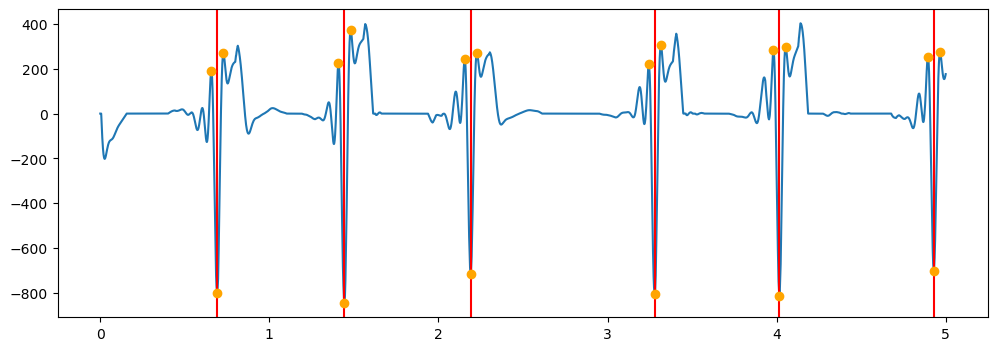

patient 29
channel  16
i 0.689
i 1.441
i 2.187
i 3.277
i 4.014
i 4.9265
peak 1308
peak in secs 0.654
peak 1376
peak in secs 0.688
peak 1453
peak in secs 0.7265
peak 2813
peak in secs 1.4065
peak 2881
peak in secs 1.4405
peak 2958
peak in secs 1.479
peak 4303
peak in secs 2.1515
peak 4372
peak in secs 2.186
peak 4449
peak in secs 2.2245
peak 6484
peak in secs 3.242
peak 6552
peak in secs 3.276
peak 6630
peak in secs 3.315
peak 7958
peak in secs 3.979
peak 8026
peak in secs 4.013
peak 8104
peak in secs 4.052
peak 9783
peak in secs 4.8915
peak 9851
peak in secs 4.9255
peak 9929
peak in secs 4.9645


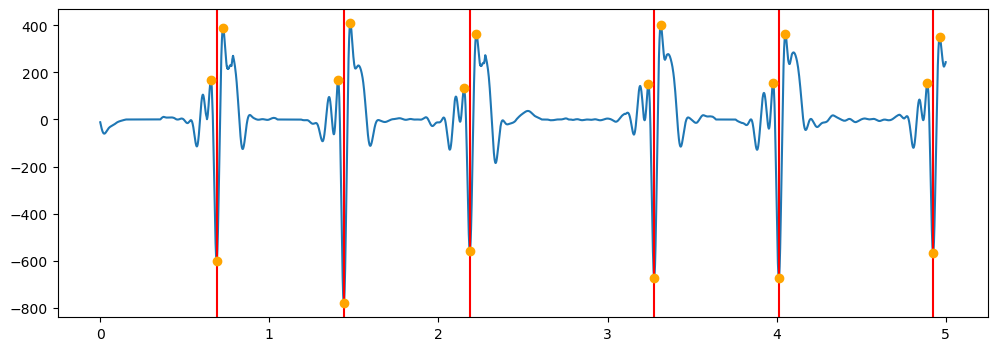

patient 29
channel  17
i 0.695
i 1.447
i 2.193
i 3.2825
i 4.0195
i 4.932
peak 1322
peak in secs 0.661
peak 1394
peak in secs 0.697
peak 1464
peak in secs 0.732
peak 2829
peak in secs 1.4145
peak 2898
peak in secs 1.449
peak 2969
peak in secs 1.4845
peak 4318
peak in secs 2.159
peak 4389
peak in secs 2.1945
peak 4461
peak in secs 2.2305
peak 6498
peak in secs 3.249
peak 6566
peak in secs 3.283
peak 6640
peak in secs 3.32
peak 7973
peak in secs 3.9865
peak 8041
peak in secs 4.0205
peak 8113
peak in secs 4.0565
peak 9797
peak in secs 4.8985
peak 9868
peak in secs 4.934
peak 9939
peak in secs 4.9695


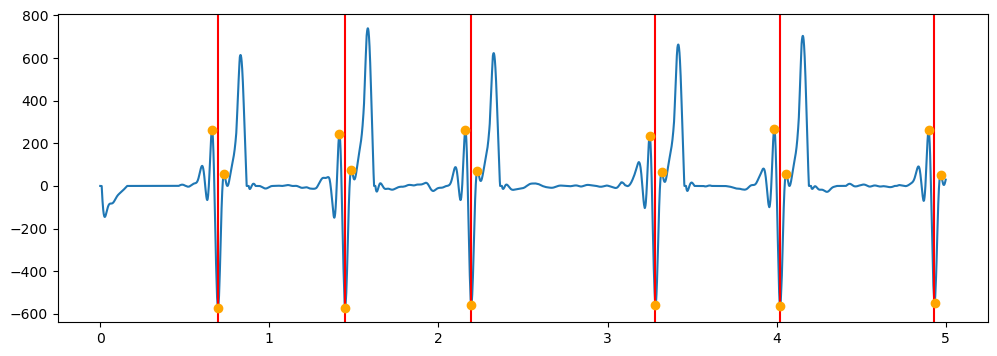

patient 29
channel  18
i 0.693
i 1.4445
i 2.1915
i 3.2805
i 4.017
i 4.9305
peak 1316
peak in secs 0.658
peak 1388
peak in secs 0.694
peak 1460
peak in secs 0.73
peak 2821
peak in secs 1.4105
peak 2891
peak in secs 1.4455
peak 2964
peak in secs 1.482
peak 4315
peak in secs 2.1575
peak 4384
peak in secs 2.192
peak 4458
peak in secs 2.229
peak 6491
peak in secs 3.2455
peak 6563
peak in secs 3.2815
peak 6635
peak in secs 3.3175
peak 7967
peak in secs 3.9835
peak 8037
peak in secs 4.0185
peak 8108
peak in secs 4.054
peak 9794
peak in secs 4.897
peak 9864
peak in secs 4.932
peak 9936
peak in secs 4.968


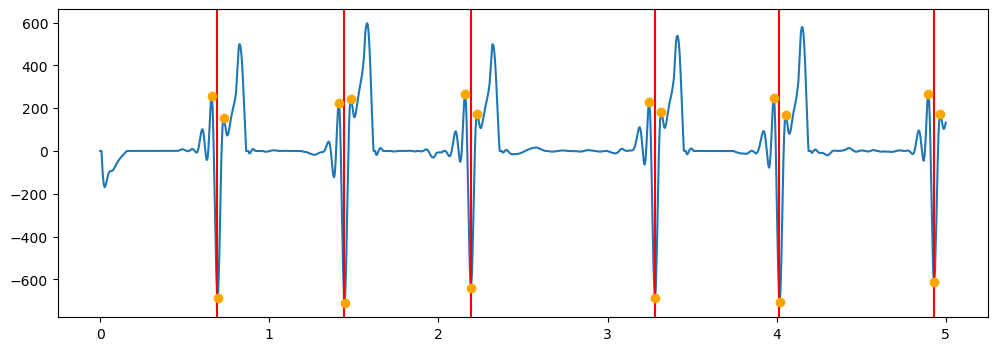

patient 29
channel  19
i 0.692
i 1.444
i 2.1905
i 3.28
i 4.017
i 4.93
peak 1314
peak in secs 0.657
peak 1386
peak in secs 0.693
peak 1458
peak in secs 0.729
peak 2819
peak in secs 1.4095
peak 2887
peak in secs 1.4435
peak 2962
peak in secs 1.481
peak 4311
peak in secs 2.1555
peak 4382
peak in secs 2.191
peak 4456
peak in secs 2.228
peak 6489
peak in secs 3.2445
peak 6560
peak in secs 3.28
peak 6633
peak in secs 3.3165
peak 7963
peak in secs 3.9815
peak 8036
peak in secs 4.018
peak 8106
peak in secs 4.053
peak 9790
peak in secs 4.895
peak 9860
peak in secs 4.93
peak 9933
peak in secs 4.9665


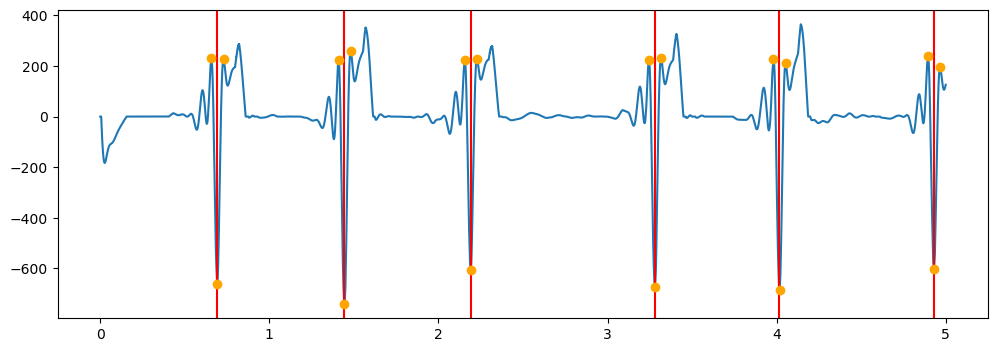

patient 29
channel  2
i 0.683
i 1.4355
i 2.18
i 3.272
i 4.0085
i 4.92
peak 1289
peak in secs 0.6445
peak 1361
peak in secs 0.6805
peak 1437
peak in secs 0.7185
peak 2798
peak in secs 1.399
peak 2863
peak in secs 1.4315
peak 2942
peak in secs 1.471
peak 4261
peak in secs 2.1305
peak 4354
peak in secs 2.177
peak 4434
peak in secs 2.217
peak 6467
peak in secs 3.2335
peak 6539
peak in secs 3.2695
peak 6617
peak in secs 3.3085
peak 7942
peak in secs 3.971
peak 8013
peak in secs 4.0065
peak 8091
peak in secs 4.0455
peak 9741
peak in secs 4.8705
peak 9834
peak in secs 4.917
peak 9913
peak in secs 4.9565


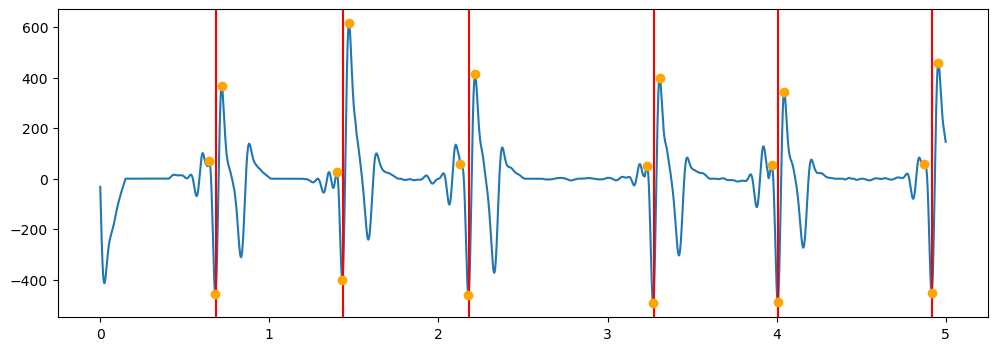

patient 29
channel  3
i 0.684
i 1.4375
i 2.181
i 3.2725
i 4.009
i 4.9205
peak 1279
peak in secs 0.6395
peak 1365
peak in secs 0.6825
peak 1443
peak in secs 0.7215
peak 2799
peak in secs 1.3995
peak 2871
peak in secs 1.4355
peak 2952
peak in secs 1.476
peak 4277
peak in secs 2.1385
peak 4359
peak in secs 2.1795
peak 4435
peak in secs 2.2175
peak 6455
peak in secs 3.2275
peak 6542
peak in secs 3.271
peak 6621
peak in secs 3.3105
peak 7941
peak in secs 3.9705
peak 8016
peak in secs 4.008
peak 8091
peak in secs 4.0455
peak 9757
peak in secs 4.8785
peak 9838
peak in secs 4.919
peak 9917
peak in secs 4.9585


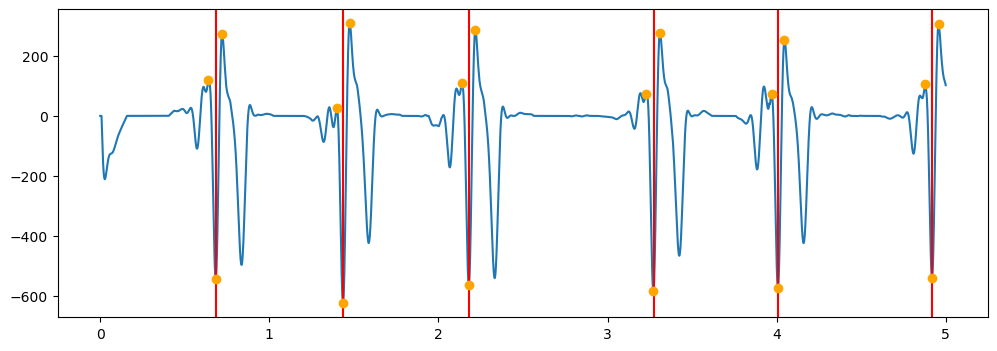

patient 29
channel  4
i 0.2635
i 0.691
i 1.446
i 2.1895
i 3.2795
i 4.0165
peak 1315
peak in secs 0.6575
peak 1382
peak in secs 0.691
peak 1459
peak in secs 0.7295
peak 2825
peak in secs 1.4125
peak 2892
peak in secs 1.446
peak 2964
peak in secs 1.482
peak 4308
peak in secs 2.154
peak 4379
peak in secs 2.1895
peak 4456
peak in secs 2.228
peak 6494
peak in secs 3.247
peak 6559
peak in secs 3.2795
peak 6633
peak in secs 3.3165
peak 7967
peak in secs 3.9835
peak 8034
peak in secs 4.017
peak 8107
peak in secs 4.0535
peak 9789
peak in secs 4.8945
peak 9857
peak in secs 4.9285
peak 9934
peak in secs 4.967


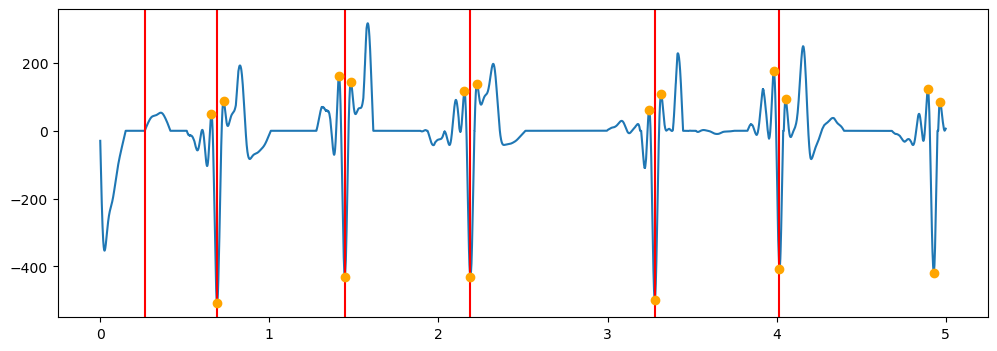

patient 29
channel  5
i 0.69
i 1.442
i 2.1875
i 3.2775
i 4.0145
i 4.9275
peak 1308
peak in secs 0.654
peak 1378
peak in secs 0.689
peak 1457
peak in secs 0.7285
peak 2817
peak in secs 1.4085
peak 2884
peak in secs 1.442
peak 2962
peak in secs 1.481
peak 4303
peak in secs 2.1515
peak 4373
peak in secs 2.1865
peak 4453
peak in secs 2.2265
peak 6484
peak in secs 3.242
peak 6554
peak in secs 3.277
peak 6633
peak in secs 3.3165
peak 7959
peak in secs 3.9795
peak 8028
peak in secs 4.014
peak 8105
peak in secs 4.0525
peak 9783
peak in secs 4.8915
peak 9856
peak in secs 4.928
peak 9931
peak in secs 4.9655


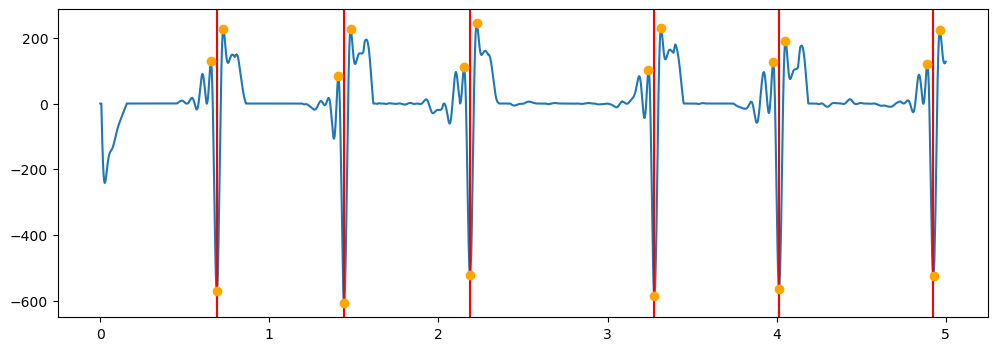

patient 29
channel  6
i 0.689
i 1.4415
i 2.1865
i 3.2765
i 4.0135
i 4.926
peak 1306
peak in secs 0.653
peak 1376
peak in secs 0.688
peak 1453
peak in secs 0.7265
peak 2815
peak in secs 1.4075
peak 2881
peak in secs 1.4405
peak 2959
peak in secs 1.4795
peak 4300
peak in secs 2.15
peak 4371
peak in secs 2.1855
peak 4449
peak in secs 2.2245
peak 6482
peak in secs 3.241
peak 6551
peak in secs 3.2755
peak 6630
peak in secs 3.315
peak 7957
peak in secs 3.9785
peak 8025
peak in secs 4.0125
peak 8103
peak in secs 4.0515
peak 9780
peak in secs 4.89
peak 9849
peak in secs 4.9245
peak 9929
peak in secs 4.9645


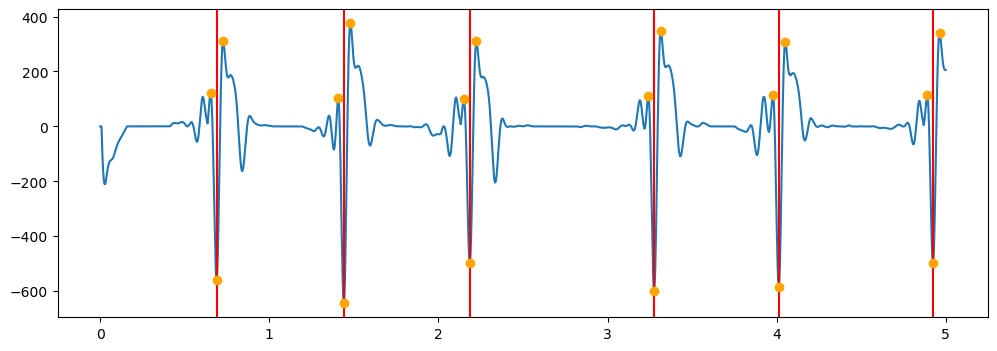

patient 29
channel  7
i 0.6845
i 1.438
i 2.182
i 3.273
i 4.0095
i 4.9215
peak 1292
peak in secs 0.646
peak 1367
peak in secs 0.6835
peak 1442
peak in secs 0.721
peak 2801
peak in secs 1.4005
peak 2874
peak in secs 1.437
peak 2952
peak in secs 1.476
peak 4279
peak in secs 2.1395
peak 4361
peak in secs 2.1805
peak 4441
peak in secs 2.2205
peak 6469
peak in secs 3.2345
peak 6543
peak in secs 3.2715
peak 6620
peak in secs 3.31
peak 7943
peak in secs 3.9715
peak 8017
peak in secs 4.0085
peak 8095
peak in secs 4.0475
peak 9758
peak in secs 4.879
peak 9840
peak in secs 4.92
peak 9917
peak in secs 4.9585


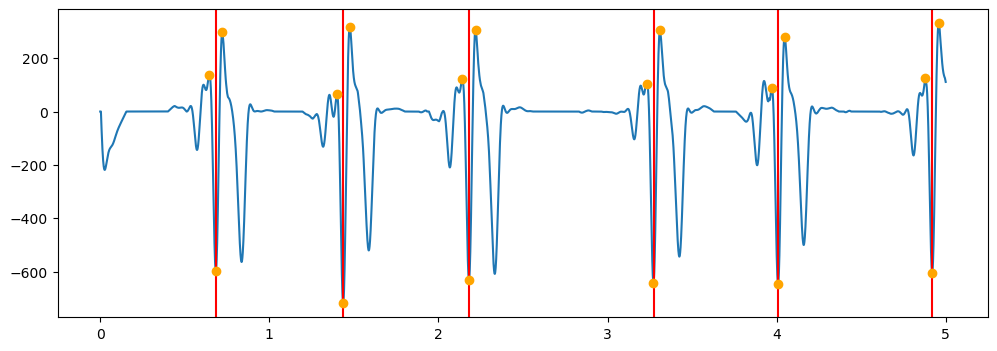

patient 29
channel  8
i 0.695
i 1.448
i 2.1925
i 3.283
i 4.02
i 4.932
peak 1322
peak in secs 0.661
peak 1394
peak in secs 0.697
peak 1464
peak in secs 0.732
peak 2831
peak in secs 1.4155
peak 2899
peak in secs 1.4495
peak 2970
peak in secs 1.485
peak 4317
peak in secs 2.1585
peak 4388
peak in secs 2.194
peak 4460
peak in secs 2.23
peak 6500
peak in secs 3.25
peak 6570
peak in secs 3.285
peak 6641
peak in secs 3.3205
peak 7973
peak in secs 3.9865
peak 8043
peak in secs 4.0215
peak 8111
peak in secs 4.0555
peak 9796
peak in secs 4.898
peak 9868
peak in secs 4.934
peak 9938
peak in secs 4.969


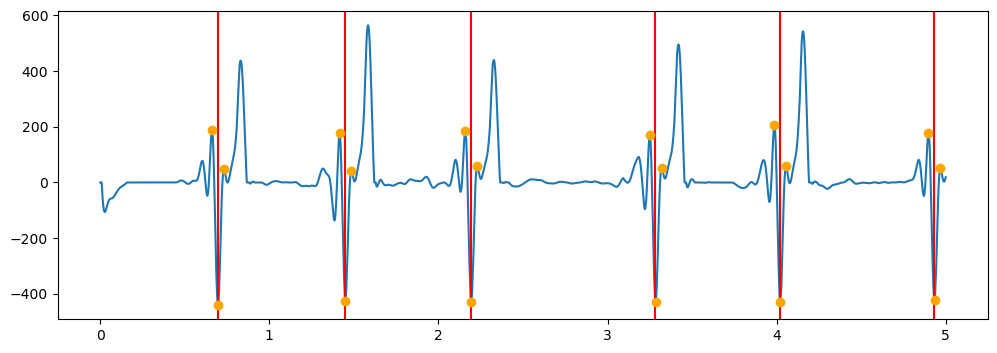

patient 29
channel  9
i 0.693
i 1.446
i 2.1915
i 3.2805
i 4.018
i 4.9305
peak 1316
peak in secs 0.658
peak 1386
peak in secs 0.693
peak 1461
peak in secs 0.7305
peak 2825
peak in secs 1.4125
peak 2892
peak in secs 1.446
peak 2967
peak in secs 1.4835
peak 4312
peak in secs 2.156
peak 4384
peak in secs 2.192
peak 4458
peak in secs 2.229
peak 6494
peak in secs 3.247
peak 6563
peak in secs 3.2815
peak 6638
peak in secs 3.319
peak 7967
peak in secs 3.9835
peak 8039
peak in secs 4.0195
peak 8110
peak in secs 4.055
peak 9793
peak in secs 4.8965
peak 9864
peak in secs 4.932
peak 9936
peak in secs 4.968


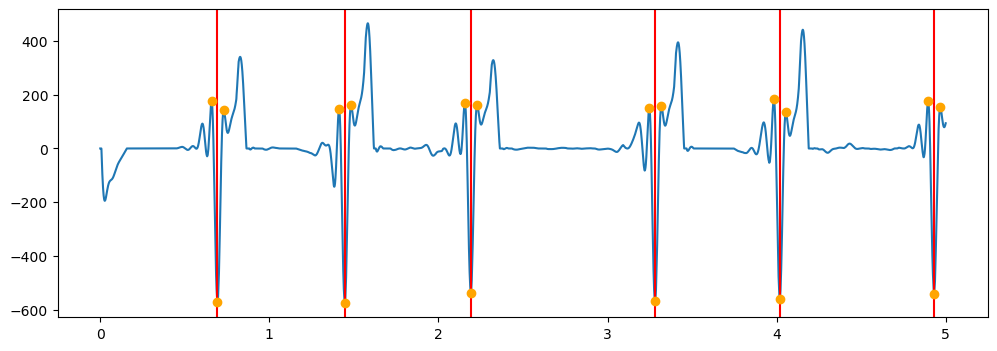

ch, channel_peaks 10 [  1458   2963   4455   6634   8107   9934  11917  13323  15110  17330
  18718  20441  22439  23780  26230  28050  29501  31294  33466  35583
  37200  39004  40493  42110  43520  44961  45754  47758  49641  51043
  52424  53575  55194  56367  58314  59292  60468  61844  63220  63904
  65939  67915  69242  71038  72936  74469  76040  77462  78484  80355
  82334  83997  85255  87094  89009  90326  91985  93622  95004  96596
  98341 100233 101740 102958 104561 106051 106688 108386 109711 111424
 113210 114378 115605 117193 118354]
LENGTH 75
LENGTH 75
LENGTH 75
ch, delay_ch_col0 10 11
ch, channel_peaks 11 [  1453   2959   4451   6630   8104   9925  11913  13321  15104  17326
  18715  20434  22434  23776  26225  28046  29498  31289  33460  35578
  37197  38999  40491  42106  43514  44958  45748  47752  49638  51038
  52419  53570  55192  56362  58309  59288  60467  61838  63216  63899
  65934  67911  69236  71030  72929  74466  76033  77457  78481  80352
  82330  83993 

In [27]:
#directory = r'/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_V1'
directory = r'/Users/arzina/Desktop/DogReadings/Data2/PhaseA/Potential_V1'

#SW350 = [18,23,25,26,28]
#SW100 = [19,21,22,24,27,29]
fs = 2000
SW = 100
print('SW', SW)
print('fs', fs)

os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.bspm")] # will produce a list of .bspm files
bspm_fullpaths = []

for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)

for fp in bspm_fullpaths: 
    print(fp)
    reg, measurement, stg, patient = findDetails(fp)
    print('found details')

    
    #if int(patient) in SW350:
    #    SW = 350
    #elif int(patient) in SW100:
    #    SW = 100
    
    
    
    MP = BSPM.load(loadpath=fp)
    # Resample and preprocess the data
  
    rMP = MP.resample(newfs=fs)  # change this around
    rMP.preprocess(bw=(0.5,20))  # change this around 

    cols_to_remove = ['LA', 'LL', 'RA'] 
    rMP.preprocessed_data = rMP.preprocessed_data.drop(columns=cols_to_remove, errors='ignore')
    print('found rMP')




    # Find R /significant peaks using wfdb
    peaks_per_channel = {}
    for ch in rMP.preprocessed_data.columns:
        peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=fs,verbose=False)
        print(ch, len(peaksch))
        peaks_per_channel[ch] = peaksch
    #print('peaks_per_channel', peaks_per_channel)


    #SW = 400
    # finding surrounding peaks with the significant peak at the centre of the serach window
    thirdof3peaks_per_channel = {}
    all3peaks_per_channel = {}
    third_peak_val = {}
    third_peak_width = {}
    third_peak_rise = {}
    third_peak_fall = {}
    pearson_corr = {}

    for ch in rMP.preprocessed_data.columns:
        #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
        print('channel ', ch)

        ch_third_peaks = []
        ch_all_three_peaks = []
        ch_third_peak_val = []
        ch_third_peak_width = []
        ch_pearson_corr = []

        rise_times = []
        fall_times = []

        for peak_peaksch in peaks_per_channel[ch]:
            signal_segment = rMP.preprocessed_data[ch][0:60].values
            three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

            if three_tallest_peaks is not None:
                ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
                ch_all_three_peaks += list(three_tallest_peaks)
                ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])

                result = compute_peak_widths(signal_segment, three_tallest_peaks[2], fs)
                if result is not None:
                    peak_width, rise_time, fall_time = result
                    # Add to other lists if needed
                else:
                    print("Could not compute ratio for this peak.")
                    peak_width, rise_time, fall_time = np.nan, np.nan, np.nan
                #if peak_width:
                        #print(peak_width)
                ch_third_peak_width.append(peak_width)
                rise_times.append(rise_time)
                fall_times.append(fall_time)

        thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
        all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
        third_peak_val[ch] = np.array(ch_third_peak_val)
        third_peak_width[ch] = np.array(ch_third_peak_width)
        third_peak_rise[ch] = np.array(rise_times)
        third_peak_fall[ch] = np.array(fall_times)


    plotTraces(rMP, peaks_per_channel, all3peaks_per_channel, patient, third_peak_rise, third_peak_fall)

    delays_df, amps_df, widths_df = fun2(rMP, stg, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW)
    #delays_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/delays28.xlsx'
    amps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/amps/amps_WITHANOMALIES.xlsx'
    widths_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/widths/widths.xlsx'
    SaveToExcel(amps_df, amps_path)
    SaveToExcel(widths_df, widths_pth)

    """SaveToExcel(delays_df, delays_pth)
    
     """


1 75
10 75
11 75
12 75
13 75
14 75
15 75
16 75
17 75
18 75
19 75
2 75
3 75
4 76
5 75
6 75
7 75
8 75
9 75
channel  1
Could not compute ratio for this peak.
channel  10
channel  11
channel  12
Could not compute ratio for this peak.
channel  13
channel  14
channel  15
channel  16
channel  17
channel  18
channel  19
channel  2
Could not compute ratio for this peak.
channel  3
Could not compute ratio for this peak.
channel  4
less than 3 peaks found
channel  5
channel  6
channel  7
Could not compute ratio for this peak.
channel  8
channel  9
patient 29
channel  1
i 0.6855
i 1.439
i 2.1825
i 3.2735
i 4.0105
i 4.9225
peak 1369
peak in secs 0.6845
peak 1447
peak in secs 0.7235
peak 1675
peak in secs 0.8375
peak 2875
peak in secs 1.4375
peak 2954
peak in secs 1.477
peak 3182
peak in secs 1.591
peak 4363
peak in secs 2.1815
peak 4443
peak in secs 2.2215
peak 4669
peak in secs 2.3345
peak 6545
peak in secs 3.2725
peak 6624
peak in secs 3.312
peak 6855
peak in secs 3.4275
peak 8019
peak in secs 4.

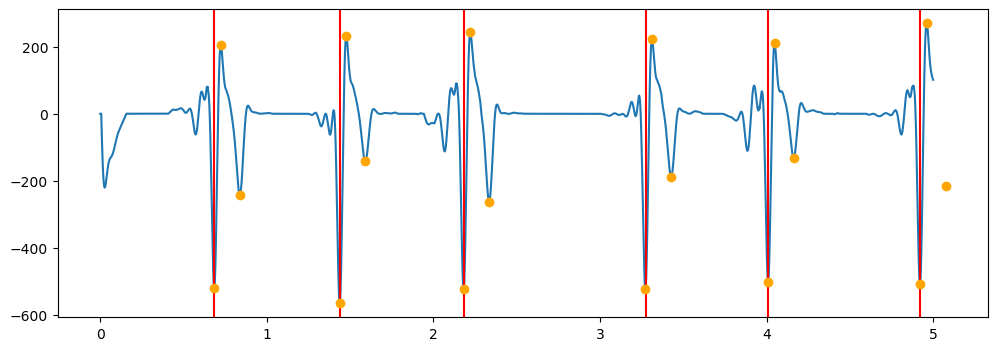

patient 29
channel  10
i 0.6915
i 1.444
i 2.19
i 3.2785
i 4.0155
i 4.9295
peak 1383
peak in secs 0.6915
peak 1458
peak in secs 0.729
peak 1628
peak in secs 0.814
peak 2889
peak in secs 1.4445
peak 2963
peak in secs 1.4815
peak 3132
peak in secs 1.566
peak 4380
peak in secs 2.19
peak 4455
peak in secs 2.2275
peak 4612
peak in secs 2.306
peak 6559
peak in secs 3.2795
peak 6634
peak in secs 3.317
peak 6804
peak in secs 3.402
peak 8032
peak in secs 4.016
peak 8107
peak in secs 4.0535
peak 8280
peak in secs 4.14
peak 9858
peak in secs 4.929
peak 9934
peak in secs 4.967
peak 10106
peak in secs 5.053


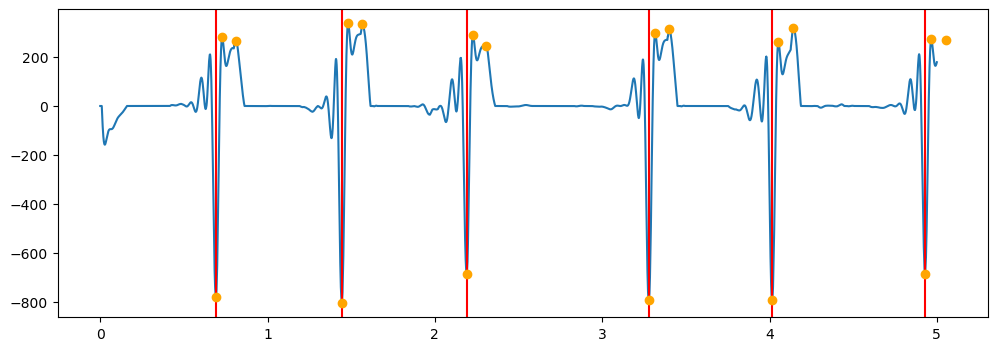

patient 29
channel  11
i 0.689
i 1.4415
i 2.187
i 3.277
i 4.014
i 4.9265
peak 1377
peak in secs 0.6885
peak 1453
peak in secs 0.7265
peak 1680
peak in secs 0.84
peak 2882
peak in secs 1.441
peak 2959
peak in secs 1.4795
peak 3053
peak in secs 1.5265
peak 4372
peak in secs 2.186
peak 4451
peak in secs 2.2255
peak 4672
peak in secs 2.336
peak 6553
peak in secs 3.2765
peak 6630
peak in secs 3.315
peak 6723
peak in secs 3.3615
peak 8026
peak in secs 4.013
peak 8104
peak in secs 4.052
peak 8200
peak in secs 4.1
peak 9851
peak in secs 4.9255
peak 9925
peak in secs 4.9625
peak 10027
peak in secs 5.0135


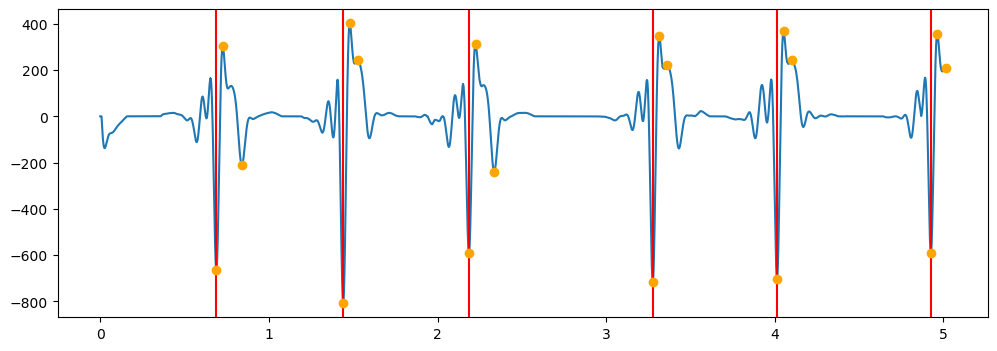

patient 29
channel  12
i 0.687
i 1.44
i 2.1845
i 3.275
i 4.012
i 4.924
peak 1372
peak in secs 0.686
peak 1449
peak in secs 0.7245
peak 1674
peak in secs 0.837
peak 2878
peak in secs 1.439
peak 2954
peak in secs 1.477
peak 3178
peak in secs 1.589
peak 4366
peak in secs 2.183
peak 4446
peak in secs 2.223
peak 4667
peak in secs 2.3335
peak 6548
peak in secs 3.274
peak 6625
peak in secs 3.3125
peak 6852
peak in secs 3.426
peak 8022
peak in secs 4.011
peak 8100
peak in secs 4.05
peak 8323
peak in secs 4.1615
peak 9845
peak in secs 4.9225
peak 9923
peak in secs 4.9615
peak 10149
peak in secs 5.0745


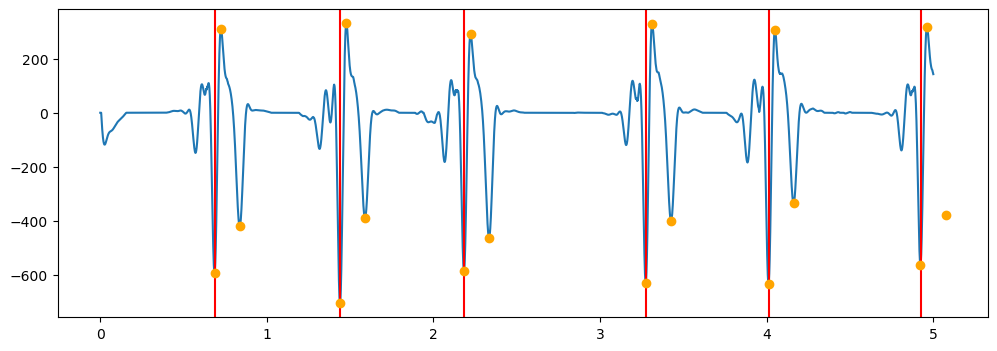

patient 29
channel  13
i 0.6955
i 1.448
i 2.1935
i 3.2835
i 4.0205
i 4.9325
peak 1325
peak in secs 0.6625
peak 1393
peak in secs 0.6965
peak 1661
peak in secs 0.8305
peak 2832
peak in secs 1.416
peak 2898
peak in secs 1.449
peak 3167
peak in secs 1.5835
peak 4320
peak in secs 2.16
peak 4389
peak in secs 2.1945
peak 4655
peak in secs 2.3275
peak 6501
peak in secs 3.2505
peak 6569
peak in secs 3.2845
peak 6839
peak in secs 3.4195
peak 7975
peak in secs 3.9875
peak 8045
peak in secs 4.0225
peak 8312
peak in secs 4.156
peak 9799
peak in secs 4.8995
peak 9869
peak in secs 4.9345
peak 10137
peak in secs 5.0685


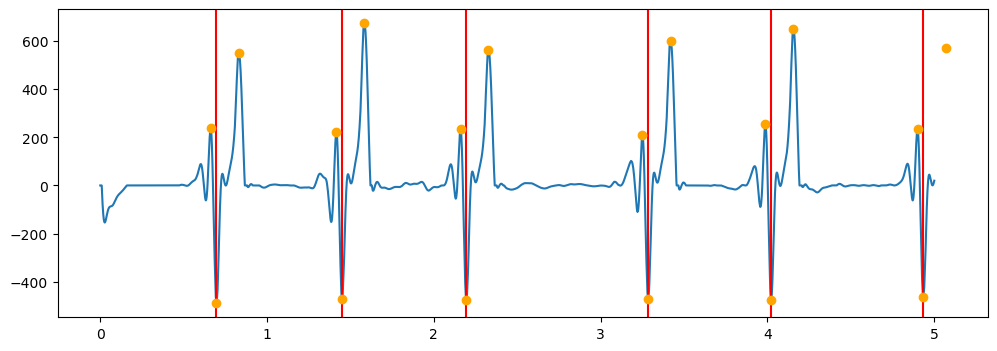

patient 29
channel  14
i 0.692
i 1.4445
i 2.191
i 3.279
i 4.017
i 4.93
peak 1313
peak in secs 0.6565
peak 1384
peak in secs 0.692
peak 1650
peak in secs 0.825
peak 2889
peak in secs 1.4445
peak 2965
peak in secs 1.4825
peak 3159
peak in secs 1.5795
peak 4311
peak in secs 2.1555
peak 4384
peak in secs 2.192
peak 4644
peak in secs 2.322
peak 6560
peak in secs 3.28
peak 6636
peak in secs 3.318
peak 6829
peak in secs 3.4145
peak 7965
peak in secs 3.9825
peak 8035
peak in secs 4.0175
peak 8305
peak in secs 4.1525
peak 9791
peak in secs 4.8955
peak 9861
peak in secs 4.9305
peak 10128
peak in secs 5.064


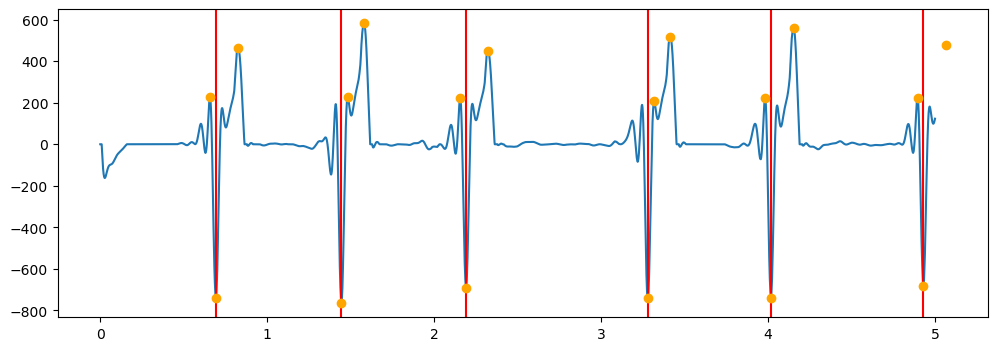

patient 29
channel  15
i 0.6915
i 1.444
i 2.1905
i 3.279
i 4.0165
i 4.9295
peak 1386
peak in secs 0.693
peak 1457
peak in secs 0.7285
peak 1627
peak in secs 0.8135
peak 2887
peak in secs 1.4435
peak 2962
peak in secs 1.481
peak 3134
peak in secs 1.567
peak 4382
peak in secs 2.191
peak 4455
peak in secs 2.2275
peak 4608
peak in secs 2.304
peak 6557
peak in secs 3.2785
peak 6631
peak in secs 3.3155
peak 6813
peak in secs 3.4065
peak 8032
peak in secs 4.016
peak 8107
peak in secs 4.0535
peak 8282
peak in secs 4.141
peak 9858
peak in secs 4.929
peak 9933
peak in secs 4.9665
peak 10103
peak in secs 5.0515


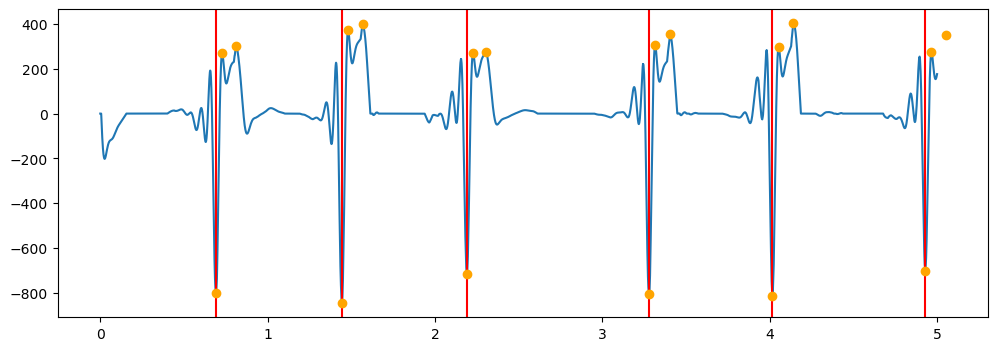

patient 29
channel  16
i 0.689
i 1.441
i 2.187
i 3.277
i 4.014
i 4.9265
peak 1376
peak in secs 0.688
peak 1453
peak in secs 0.7265
peak 1571
peak in secs 0.7855
peak 2881
peak in secs 1.4405
peak 2958
peak in secs 1.479
peak 3054
peak in secs 1.527
peak 4372
peak in secs 2.186
peak 4449
peak in secs 2.2245
peak 4554
peak in secs 2.277
peak 6552
peak in secs 3.276
peak 6630
peak in secs 3.315
peak 6716
peak in secs 3.358
peak 8026
peak in secs 4.013
peak 8104
peak in secs 4.052
peak 8200
peak in secs 4.1
peak 9851
peak in secs 4.9255
peak 9929
peak in secs 4.9645
peak 10051
peak in secs 5.0255


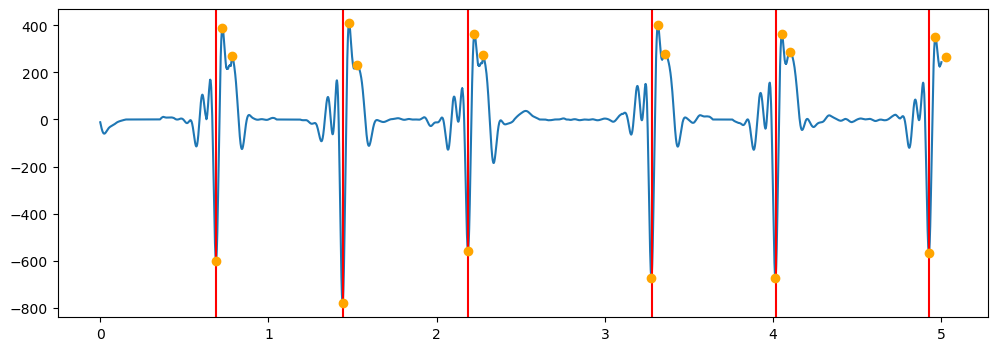

patient 29
channel  17
i 0.695
i 1.447
i 2.193
i 3.2825
i 4.0195
i 4.932
peak 1322
peak in secs 0.661
peak 1394
peak in secs 0.697
peak 1659
peak in secs 0.8295
peak 2829
peak in secs 1.4145
peak 2898
peak in secs 1.449
peak 3165
peak in secs 1.5825
peak 4318
peak in secs 2.159
peak 4389
peak in secs 2.1945
peak 4653
peak in secs 2.3265
peak 6498
peak in secs 3.249
peak 6566
peak in secs 3.283
peak 6837
peak in secs 3.4185
peak 7973
peak in secs 3.9865
peak 8041
peak in secs 4.0205
peak 8310
peak in secs 4.155
peak 9797
peak in secs 4.8985
peak 9868
peak in secs 4.934
peak 10135
peak in secs 5.0675


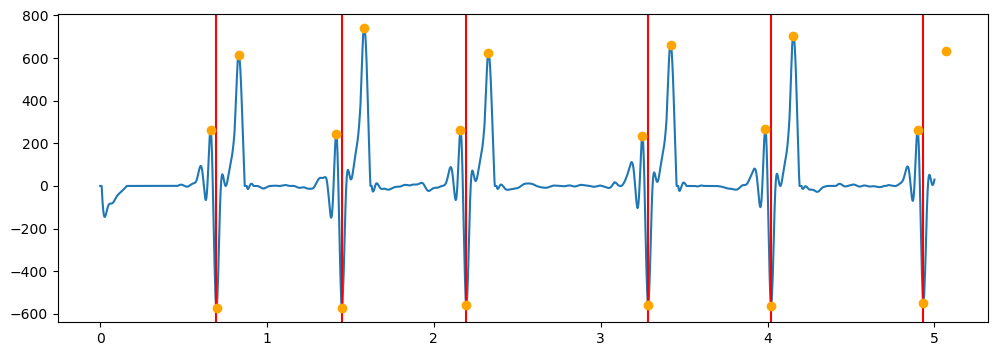

patient 29
channel  18
i 0.693
i 1.4445
i 2.1915
i 3.2805
i 4.017
i 4.9305
peak 1316
peak in secs 0.658
peak 1388
peak in secs 0.694
peak 1648
peak in secs 0.824
peak 2891
peak in secs 1.4455
peak 2964
peak in secs 1.482
peak 3156
peak in secs 1.578
peak 4315
peak in secs 2.1575
peak 4384
peak in secs 2.192
peak 4641
peak in secs 2.3205
peak 6491
peak in secs 3.2455
peak 6563
peak in secs 3.2815
peak 6827
peak in secs 3.4135
peak 7967
peak in secs 3.9835
peak 8037
peak in secs 4.0185
peak 8302
peak in secs 4.151
peak 9794
peak in secs 4.897
peak 9864
peak in secs 4.932
peak 10126
peak in secs 5.063


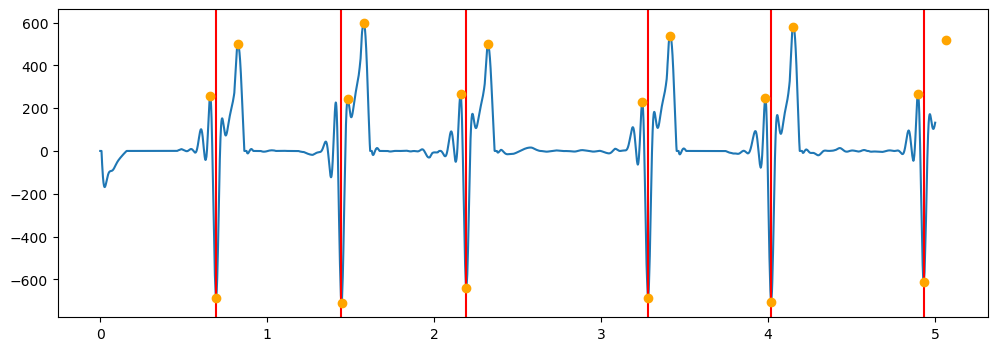

patient 29
channel  19
i 0.692
i 1.444
i 2.1905
i 3.28
i 4.017
i 4.93
peak 1386
peak in secs 0.693
peak 1621
peak in secs 0.8105
peak 1640
peak in secs 0.82
peak 2887
peak in secs 1.4435
peak 2962
peak in secs 1.481
peak 3139
peak in secs 1.5695
peak 4382
peak in secs 2.191
peak 4613
peak in secs 2.3065
peak 4633
peak in secs 2.3165
peak 6560
peak in secs 3.28
peak 6796
peak in secs 3.398
peak 6815
peak in secs 3.4075
peak 7963
peak in secs 3.9815
peak 8036
peak in secs 4.018
peak 8286
peak in secs 4.143
peak 9790
peak in secs 4.895
peak 9860
peak in secs 4.93
peak 10115
peak in secs 5.0575


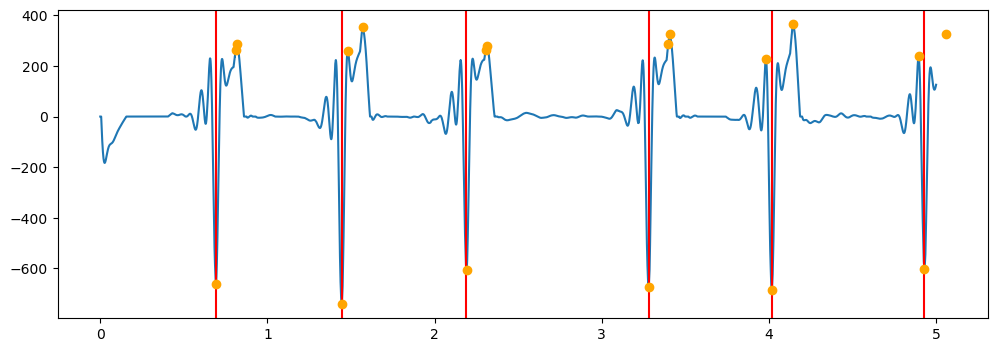

patient 29
channel  2
i 0.683
i 1.4355
i 2.18
i 3.272
i 4.0085
i 4.92
peak 1361
peak in secs 0.6805
peak 1437
peak in secs 0.7185
peak 1665
peak in secs 0.8325
peak 2863
peak in secs 1.4315
peak 2942
peak in secs 1.471
peak 3171
peak in secs 1.5855
peak 4354
peak in secs 2.177
peak 4434
peak in secs 2.217
peak 4660
peak in secs 2.33
peak 6539
peak in secs 3.2695
peak 6617
peak in secs 3.3085
peak 6845
peak in secs 3.4225
peak 8013
peak in secs 4.0065
peak 8091
peak in secs 4.0455
peak 8315
peak in secs 4.1575
peak 9834
peak in secs 4.917
peak 9913
peak in secs 4.9565
peak 10143
peak in secs 5.0715


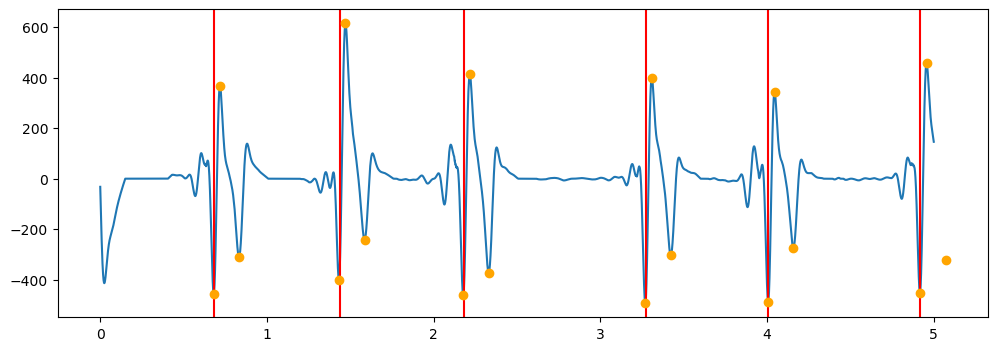

patient 29
channel  3
i 0.684
i 1.4375
i 2.181
i 3.2725
i 4.009
i 4.9205
peak 1365
peak in secs 0.6825
peak 1443
peak in secs 0.7215
peak 1671
peak in secs 0.8355
peak 2871
peak in secs 1.4355
peak 2952
peak in secs 1.476
peak 3175
peak in secs 1.5875
peak 4359
peak in secs 2.1795
peak 4435
peak in secs 2.2175
peak 4666
peak in secs 2.333
peak 6542
peak in secs 3.271
peak 6621
peak in secs 3.3105
peak 6849
peak in secs 3.4245
peak 8016
peak in secs 4.008
peak 8091
peak in secs 4.0455
peak 8319
peak in secs 4.1595
peak 9838
peak in secs 4.919
peak 9917
peak in secs 4.9585
peak 10146
peak in secs 5.073


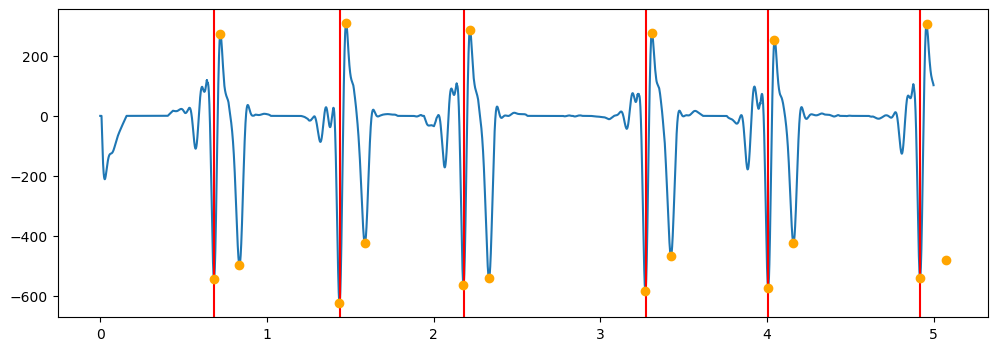

patient 29
channel  4
i 0.2635
i 0.691
i 1.446
i 2.1895
i 3.2795
i 4.0165
peak 1264
peak in secs 0.632
peak 1382
peak in secs 0.691
peak 1653
peak in secs 0.8265
peak 2825
peak in secs 1.4125
peak 2892
peak in secs 1.446
peak 3164
peak in secs 1.582
peak 4379
peak in secs 2.1895
peak 4456
peak in secs 2.228
peak 4648
peak in secs 2.324
peak 6439
peak in secs 3.2195
peak 6559
peak in secs 3.2795
peak 6832
peak in secs 3.416
peak 7967
peak in secs 3.9835
peak 8034
peak in secs 4.017
peak 8314
peak in secs 4.157
peak 9789
peak in secs 4.8945
peak 9857
peak in secs 4.9285
peak 10136
peak in secs 5.068


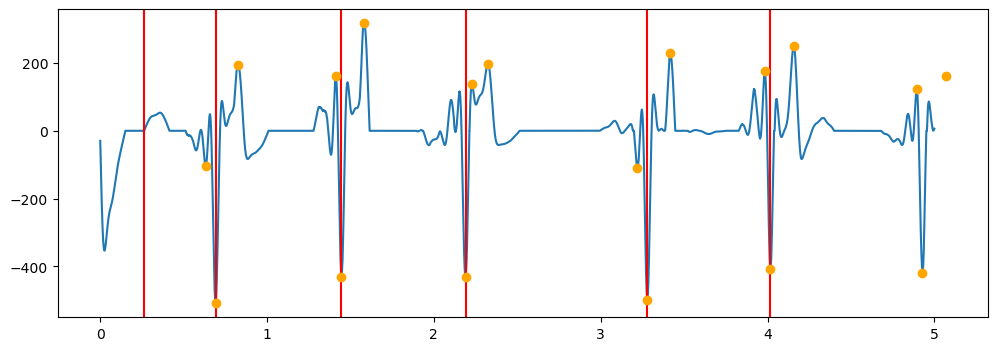

patient 29
channel  5
i 0.69
i 1.442
i 2.1875
i 3.2775
i 4.0145
i 4.9275
peak 1378
peak in secs 0.689
peak 1457
peak in secs 0.7285
peak 1612
peak in secs 0.806
peak 2884
peak in secs 1.442
peak 2962
peak in secs 1.481
peak 3146
peak in secs 1.573
peak 4373
peak in secs 2.1865
peak 4453
peak in secs 2.2265
peak 4551
peak in secs 2.2755
peak 6554
peak in secs 3.277
peak 6633
peak in secs 3.3165
peak 6801
peak in secs 3.4005
peak 8028
peak in secs 4.014
peak 8105
peak in secs 4.0525
peak 8295
peak in secs 4.1475
peak 9856
peak in secs 4.928
peak 9931
peak in secs 4.9655
peak 10099
peak in secs 5.0495


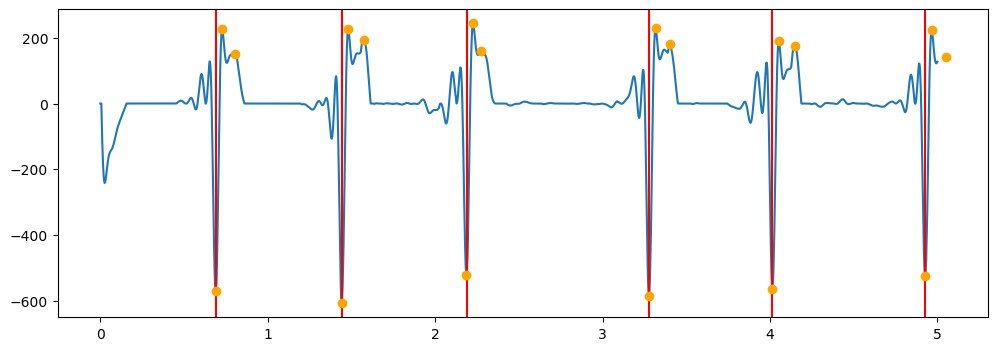

patient 29
channel  6
i 0.689
i 1.4415
i 2.1865
i 3.2765
i 4.0135
i 4.926
peak 1376
peak in secs 0.688
peak 1453
peak in secs 0.7265
peak 1540
peak in secs 0.77
peak 2881
peak in secs 1.4405
peak 2959
peak in secs 1.4795
peak 3049
peak in secs 1.5245
peak 4371
peak in secs 2.1855
peak 4449
peak in secs 2.2245
peak 4672
peak in secs 2.336
peak 6551
peak in secs 3.2755
peak 6630
peak in secs 3.315
peak 6718
peak in secs 3.359
peak 8025
peak in secs 4.0125
peak 8103
peak in secs 4.0515
peak 8145
peak in secs 4.0725
peak 9849
peak in secs 4.9245
peak 9929
peak in secs 4.9645
peak 10010
peak in secs 5.005


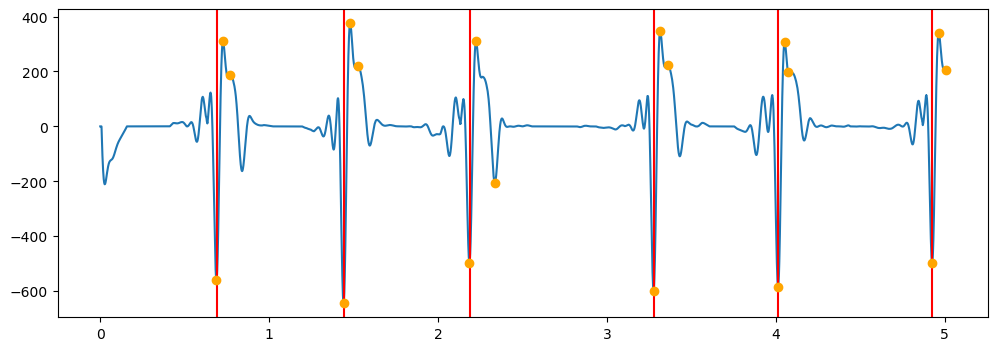

patient 29
channel  7
i 0.6845
i 1.438
i 2.182
i 3.273
i 4.0095
i 4.9215
peak 1367
peak in secs 0.6835
peak 1442
peak in secs 0.721
peak 1672
peak in secs 0.836
peak 2874
peak in secs 1.437
peak 2952
peak in secs 1.476
peak 3176
peak in secs 1.588
peak 4361
peak in secs 2.1805
peak 4441
peak in secs 2.2205
peak 4666
peak in secs 2.333
peak 6543
peak in secs 3.2715
peak 6620
peak in secs 3.31
peak 6850
peak in secs 3.425
peak 8017
peak in secs 4.0085
peak 8095
peak in secs 4.0475
peak 8320
peak in secs 4.16
peak 9840
peak in secs 4.92
peak 9917
peak in secs 4.9585
peak 10148
peak in secs 5.074


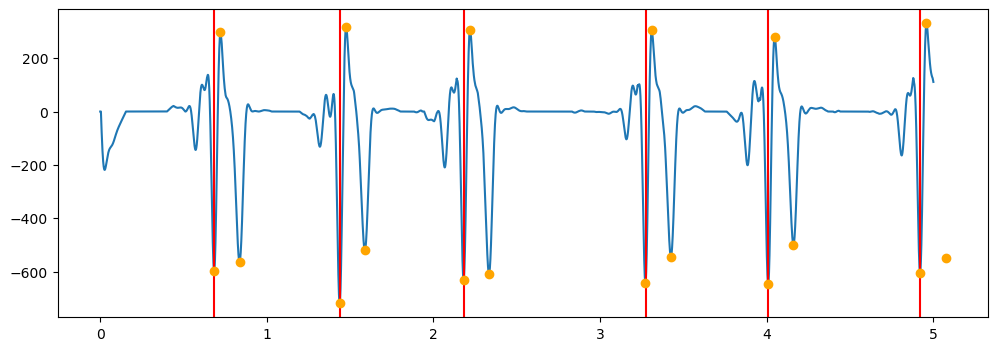

patient 29
channel  8
i 0.695
i 1.448
i 2.1925
i 3.283
i 4.02
i 4.932
peak 1322
peak in secs 0.661
peak 1394
peak in secs 0.697
peak 1661
peak in secs 0.8305
peak 2831
peak in secs 1.4155
peak 2899
peak in secs 1.4495
peak 3168
peak in secs 1.584
peak 4317
peak in secs 2.1585
peak 4388
peak in secs 2.194
peak 4655
peak in secs 2.3275
peak 6500
peak in secs 3.25
peak 6570
peak in secs 3.285
peak 6839
peak in secs 3.4195
peak 7973
peak in secs 3.9865
peak 8043
peak in secs 4.0215
peak 8312
peak in secs 4.156
peak 9796
peak in secs 4.898
peak 9868
peak in secs 4.934
peak 10137
peak in secs 5.0685


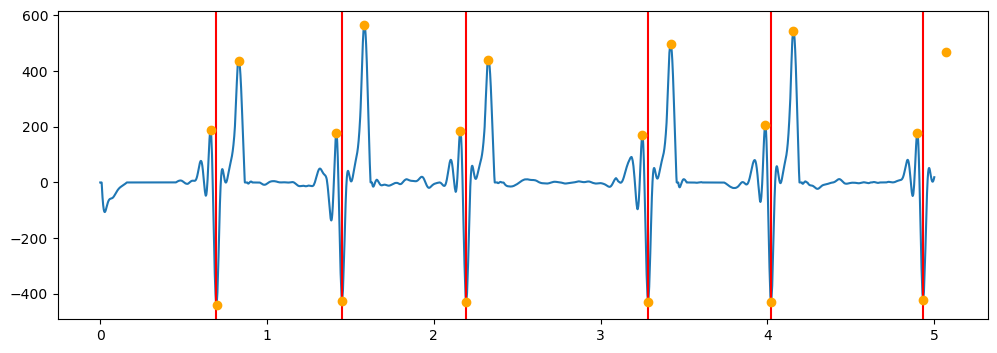

patient 29
channel  9
i 0.693
i 1.446
i 2.1915
i 3.2805
i 4.018
i 4.9305
peak 1316
peak in secs 0.658
peak 1386
peak in secs 0.693
peak 1655
peak in secs 0.8275
peak 2892
peak in secs 1.446
peak 2967
peak in secs 1.4835
peak 3165
peak in secs 1.5825
peak 4312
peak in secs 2.156
peak 4384
peak in secs 2.192
peak 4648
peak in secs 2.324
peak 6563
peak in secs 3.2815
peak 6638
peak in secs 3.319
peak 6834
peak in secs 3.417
peak 7967
peak in secs 3.9835
peak 8039
peak in secs 4.0195
peak 8310
peak in secs 4.155
peak 9793
peak in secs 4.8965
peak 9864
peak in secs 4.932
peak 10133
peak in secs 5.0665


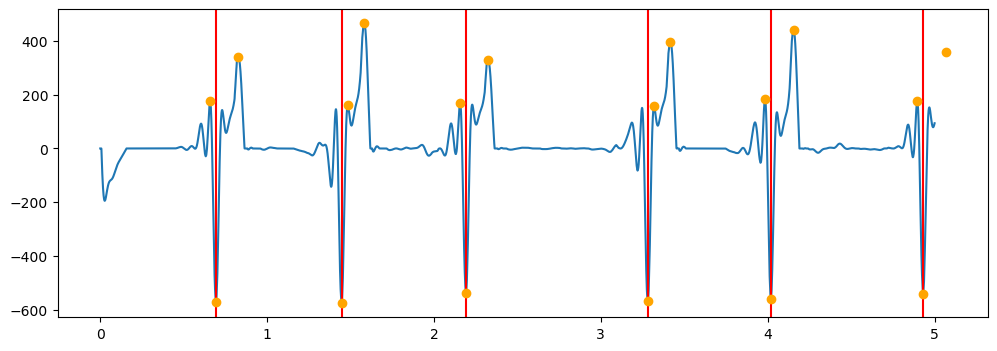

ch, channel_peaks 10 [  1628   3132   4612   6804   8280  10106  12078  13498  15270  17503
  18895  20601  22614  23954  26396  28225  29675  31468  33644  35760
  37373  39168  40668  42281  43690  45136  45866  47914  49815  51217
  52601  53575  55347  56457  58471  59292  60580  62011  63364  64070
  66078  68089  69411  71188  73111  74643  76215  77638  78655  80525
  82501  84163  85429  87264  89173  90495  91985  93793  95179  96760
  98512 100408 101915 103133 104735 106201 106791 108546 109892 111589
 113383 114506 115771 117369 118521]
LENGTH 75
LENGTH 75
LENGTH 75
valid cycle FALSE
ch, channel_peaks 10 [  1628   3132   4612   6804   8280  10106  12078  13498  15270  17503
  18895  20601  22614  23954  26396  28225  29675  31468  33644  35760
  37373  39168  40668  42281  43690  45136  45866  47914  49815  51217
  52601  53575  55347  56457  58471  59292  60580  62011  63364  64070
  66078  68089  69411  71188  73111  74643  76215  77638  78655  80525
  82501  84163  85429

'SaveToExcel(delays_df, delays_pth)\n\n    '

In [26]:
# Find R /significant peaks using wfdb
peaks_per_channel = {}
for ch in rMP.preprocessed_data.columns:
    peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=fs,verbose=False)
    print(ch, len(peaksch))
    peaks_per_channel[ch] = peaksch
#print('peaks_per_channel', peaks_per_channel)


#SW = 400
# finding surrounding peaks with the significant peak at the centre of the serach window
thirdof3peaks_per_channel = {}
all3peaks_per_channel = {}
third_peak_val = {}
third_peak_width = {}
third_peak_rise = {}
third_peak_fall = {}
pearson_corr = {}

for ch in rMP.preprocessed_data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    print('channel ', ch)

    ch_third_peaks = []
    ch_all_three_peaks = []
    ch_third_peak_val = []
    ch_third_peak_width = []
    ch_pearson_corr = []

    rise_times = []
    fall_times = []

    for peak_peaksch in peaks_per_channel[ch]:
        signal_segment = rMP.preprocessed_data[ch][0:60].values
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)
            ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])

            result = compute_peak_widths(signal_segment, three_tallest_peaks[2], fs)
            if result is not None:
                peak_width, rise_time, fall_time = result
                # Add to other lists if needed
            else:
                print("Could not compute ratio for this peak.")
                peak_width, rise_time, fall_time = np.nan, np.nan, np.nan
            #if peak_width:
                    #print(peak_width)
            ch_third_peak_width.append(peak_width)
            rise_times.append(rise_time)
            fall_times.append(fall_time)

    thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
    third_peak_val[ch] = np.array(ch_third_peak_val)
    third_peak_width[ch] = np.array(ch_third_peak_width)
    third_peak_rise[ch] = np.array(rise_times)
    third_peak_fall[ch] = np.array(fall_times)


plotTraces(rMP, peaks_per_channel, all3peaks_per_channel, patient, third_peak_rise, third_peak_fall)

delays_df, amps_df, widths_df = fun2(rMP, stg, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW)
#delays_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/delays28.xlsx'
amps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/amps/amps.xlsx'
widths_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/widths/widths.xlsx'
SaveToExcel(amps_df, amps_path)
SaveToExcel(widths_df, widths_pth)

"""SaveToExcel(delays_df, delays_pth)

    """

channel  1
Could not compute ratio for this peak.
less than 3 peaks found
channel  10
less than 3 peaks found
less than 3 peaks found
less than 3 peaks found
Could not compute ratio for this peak.
channel  11
less than 3 peaks found
less than 3 peaks found
Could not compute ratio for this peak.
less than 3 peaks found
channel  12
less than 3 peaks found
Could not compute ratio for this peak.
channel  13
Could not compute ratio for this peak.
Could not compute ratio for this peak.
channel  14
Could not compute ratio for this peak.
Could not compute ratio for this peak.
channel  15
less than 3 peaks found
less than 3 peaks found
less than 3 peaks found
less than 3 peaks found
less than 3 peaks found
Could not compute ratio for this peak.
less than 3 peaks found
channel  16
less than 3 peaks found
Could not compute ratio for this peak.
less than 3 peaks found
channel  17
Could not compute ratio for this peak.
less than 3 peaks found
channel  18
Could not compute ratio for this peak.
chann

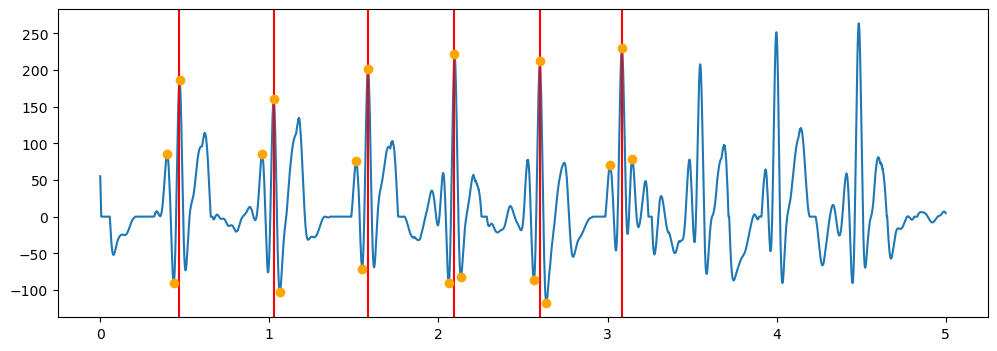

patient 20
channel  10
i 0.397
i 0.6515
i 0.9555
i 1.18
i 1.5125
i 1.7355
peak 792
peak in secs 0.396
peak 874
peak in secs 0.437
peak 891
peak in secs 0.4455
peak 1773
peak in secs 0.8865
peak 1831
peak in secs 0.9155
peak 1909
peak in secs 0.9545
peak 2907
peak in secs 1.4535
peak 3025
peak in secs 1.5125
peak 3130
peak in secs 1.565
peak 3459
peak in secs 1.7295
peak 3562
peak in secs 1.781
peak 3582
peak in secs 1.791
peak 4050
peak in secs 2.025
peak 4138
peak in secs 2.069
peak 4183
peak in secs 2.0915
peak 4418
peak in secs 2.209
peak 4488
peak in secs 2.244
peak 4597
peak in secs 2.2985


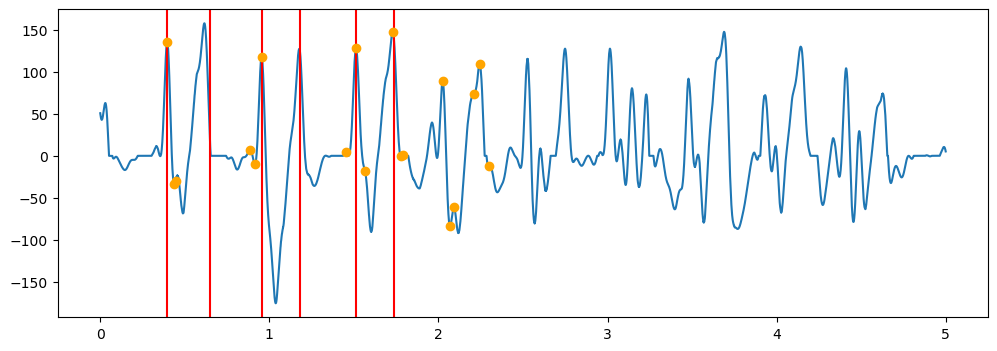

patient 20
channel  11
i 0.472
i 1.03
i 1.587
i 2.0975
i 2.6005
i 3.0905
peak 943
peak in secs 0.4715
peak 1032
peak in secs 0.516
peak 1058
peak in secs 0.529
peak 3175
peak in secs 1.5875
peak 3264
peak in secs 1.632
peak 3286
peak in secs 1.643
peak 4194
peak in secs 2.097
peak 4284
peak in secs 2.142
peak 4301
peak in secs 2.1505
peak 5053
peak in secs 2.5265
peak 5200
peak in secs 2.6
peak 5297
peak in secs 2.6485
peak 7853
peak in secs 3.9265
peak 7898
peak in secs 3.949
peak 8004
peak in secs 4.002
peak 8969
peak in secs 4.4845
peak 9057
peak in secs 4.5285
peak 9076
peak in secs 4.538


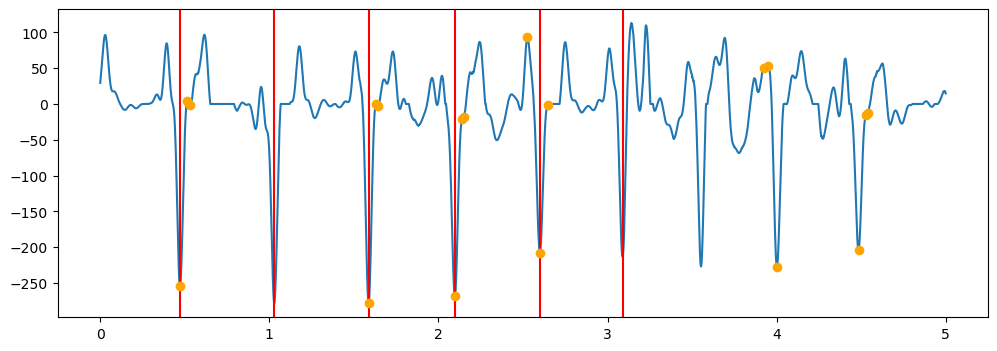

patient 20
channel  12
i 0.471
i 1.029
i 1.5855
i 2.0965
i 2.6
i 3.0885
peak 862
peak in secs 0.431
peak 942
peak in secs 0.471
peak 1024
peak in secs 0.512
peak 1938
peak in secs 0.969
peak 2057
peak in secs 1.0285
peak 2141
peak in secs 1.0705
peak 3090
peak in secs 1.545
peak 3171
peak in secs 1.5855
peak 3254
peak in secs 1.627
peak 4075
peak in secs 2.0375
peak 4193
peak in secs 2.0965
peak 4277
peak in secs 2.1385
peak 5082
peak in secs 2.541
peak 5108
peak in secs 2.554
peak 5200
peak in secs 2.6
peak 6094
peak in secs 3.047
peak 6175
peak in secs 3.0875
peak 6270
peak in secs 3.135


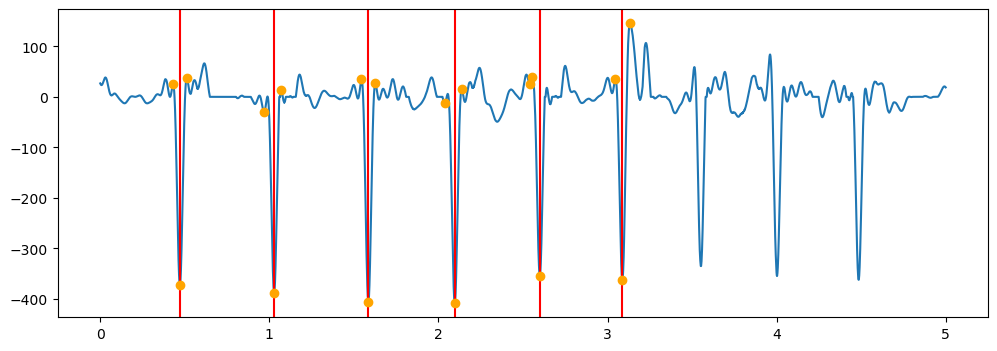

patient 20
channel  13
i 0.4595
i 1.017
i 1.5755
i 2.087
i 2.5935
i 3.078
peak 793
peak in secs 0.3965
peak 915
peak in secs 0.4575
peak 981
peak in secs 0.4905
peak 1915
peak in secs 0.9575
peak 2031
peak in secs 1.0155
peak 2094
peak in secs 1.047
peak 3030
peak in secs 1.515
peak 3146
peak in secs 1.573
peak 3212
peak in secs 1.606
peak 4051
peak in secs 2.0255
peak 4172
peak in secs 2.086
peak 4238
peak in secs 2.119
peak 5057
peak in secs 2.5285
peak 5185
peak in secs 2.5925
peak 5252
peak in secs 2.626
peak 6031
peak in secs 3.0155
peak 6152
peak in secs 3.076
peak 6217
peak in secs 3.1085


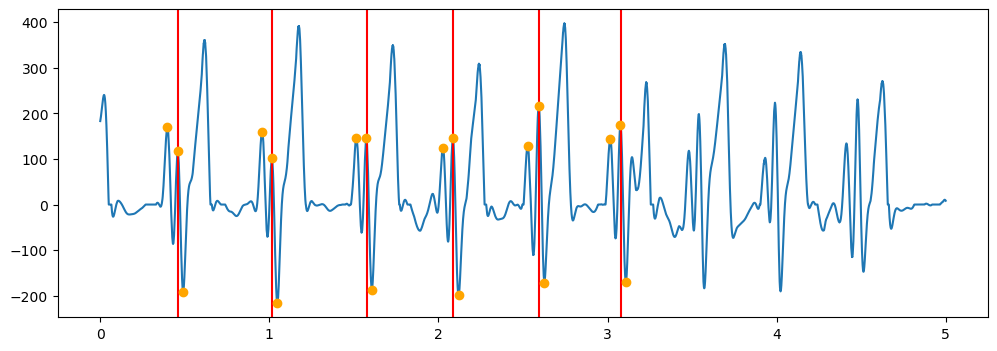

patient 20
channel  14
i 0.4295
i 0.987
i 1.574
i 2.058
i 2.273
i 2.5635
peak 794
peak in secs 0.397
peak 867
peak in secs 0.4335
peak 981
peak in secs 0.4905
peak 1912
peak in secs 0.956
peak 1982
peak in secs 0.991
peak 2092
peak in secs 1.046
peak 3029
peak in secs 1.5145
peak 3098
peak in secs 1.549
peak 3210
peak in secs 1.605
peak 4052
peak in secs 2.026
peak 4121
peak in secs 2.0605
peak 4237
peak in secs 2.1185
peak 4483
peak in secs 2.2415
peak 4587
peak in secs 2.2935
peak 4623
peak in secs 2.3115
peak 5059
peak in secs 2.5295
peak 5132
peak in secs 2.566
peak 5255
peak in secs 2.6275


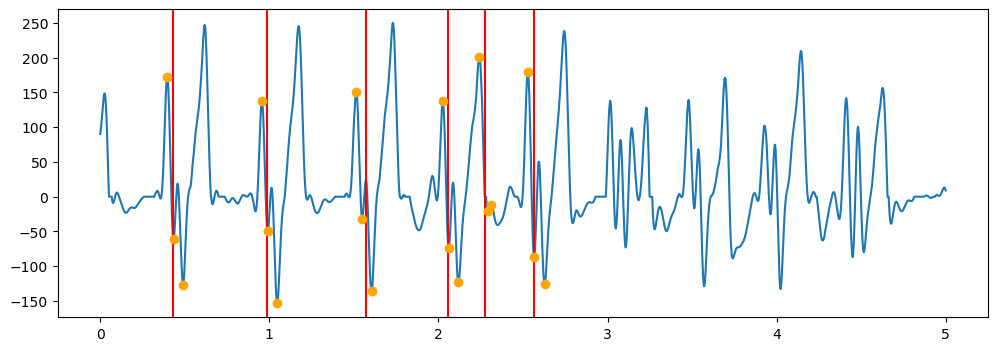

patient 20
channel  15
i 0.475
i 1.033
i 1.5895
i 2.1
i 2.6035
i 3.092
peak 862
peak in secs 0.431
peak 949
peak in secs 0.4745
peak 1036
peak in secs 0.518
peak 3177
peak in secs 1.5885
peak 3268
peak in secs 1.634
peak 3290
peak in secs 1.645
peak 6182
peak in secs 3.091
peak 6282
peak in secs 3.141
peak 6298
peak in secs 3.149
peak 7007
peak in secs 3.5035
peak 7024
peak in secs 3.512
peak 7110
peak in secs 3.555
peak 7895
peak in secs 3.9475
peak 7913
peak in secs 3.9565
peak 8009
peak in secs 4.0045
peak 8975
peak in secs 4.4875
peak 9069
peak in secs 4.5345
peak 9092
peak in secs 4.546


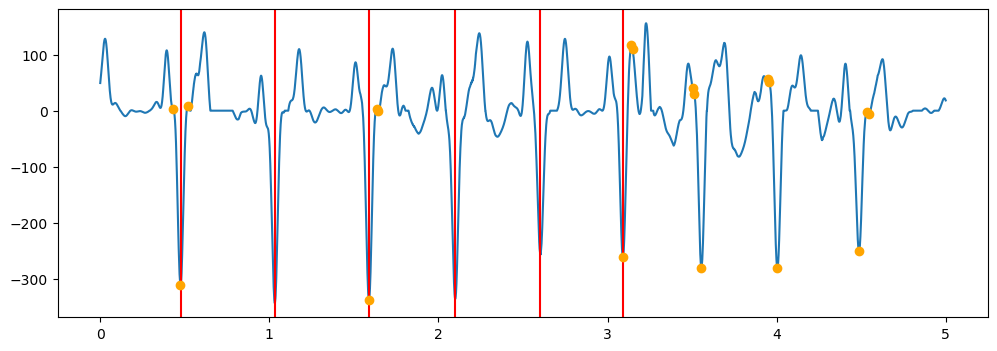

patient 20
channel  16
i 0.472
i 1.0295
i 1.5865
i 2.0975
i 2.601
i 3.089
peak 864
peak in secs 0.432
peak 944
peak in secs 0.472
peak 1026
peak in secs 0.513
peak 1941
peak in secs 0.9705
peak 2059
peak in secs 1.0295
peak 2142
peak in secs 1.071
peak 3092
peak in secs 1.546
peak 3173
peak in secs 1.5865
peak 3256
peak in secs 1.628
peak 4079
peak in secs 2.0395
peak 4195
peak in secs 2.0975
peak 4277
peak in secs 2.1385
peak 5089
peak in secs 2.5445
peak 5107
peak in secs 2.5535
peak 5201
peak in secs 2.6005
peak 6177
peak in secs 3.0885
peak 6273
peak in secs 3.1365
peak 6291
peak in secs 3.1455


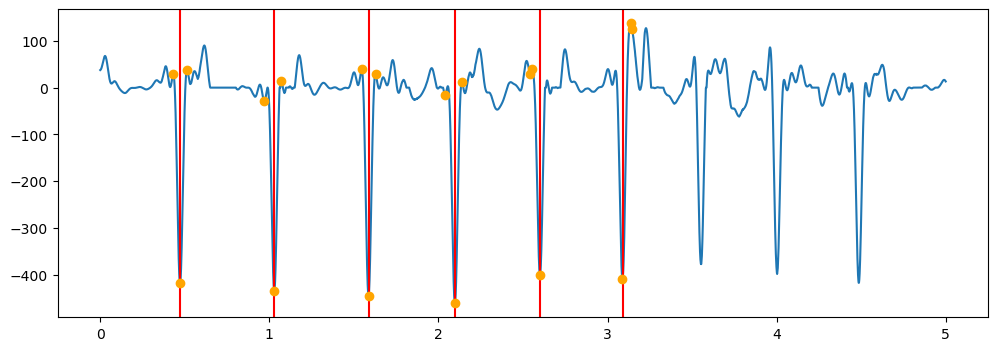

patient 20
channel  17
i 0.4815
i 1.0385
i 1.596
i 2.107
i 2.613
i 3.098
peak 961
peak in secs 0.4805
peak 1044
peak in secs 0.522
peak 1072
peak in secs 0.536
peak 2005
peak in secs 1.0025
peak 2078
peak in secs 1.039
peak 2168
peak in secs 1.084
peak 3191
peak in secs 1.5955
peak 3277
peak in secs 1.6385
peak 3297
peak in secs 1.6485
peak 4115
peak in secs 2.0575
peak 4142
peak in secs 2.071
peak 4214
peak in secs 2.107
peak 5158
peak in secs 2.579
peak 5226
peak in secs 2.613
peak 5324
peak in secs 2.662
peak 6195
peak in secs 3.0975
peak 6280
peak in secs 3.14
peak 6334
peak in secs 3.167


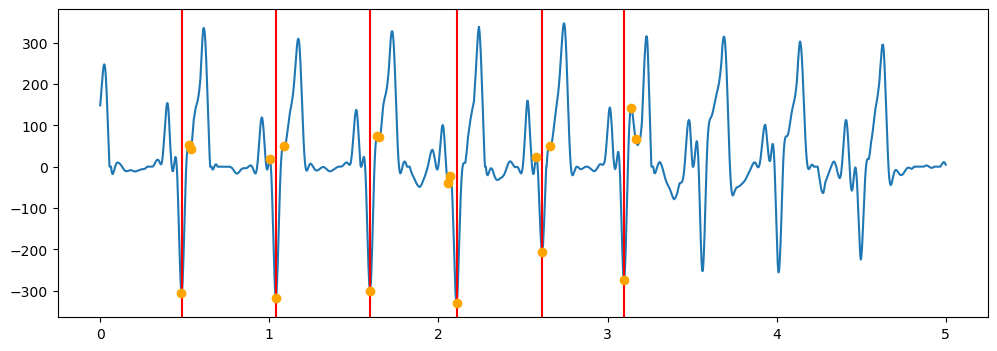

patient 20
channel  18
i 0.476
i 1.0335
i 1.5895
i 2.101
i 2.6055
i 3.092
peak 871
peak in secs 0.4355
peak 951
peak in secs 0.4755
peak 1034
peak in secs 0.517
peak 1960
peak in secs 0.98
peak 2066
peak in secs 1.033
peak 2152
peak in secs 1.076
peak 3178
peak in secs 1.589
peak 3264
peak in secs 1.632
peak 3300
peak in secs 1.65
peak 4201
peak in secs 2.1005
peak 4288
peak in secs 2.144
peak 4315
peak in secs 2.1575
peak 5118
peak in secs 2.559
peak 5210
peak in secs 2.605
peak 5298
peak in secs 2.649
peak 6103
peak in secs 3.0515
peak 6183
peak in secs 3.0915
peak 6274
peak in secs 3.137


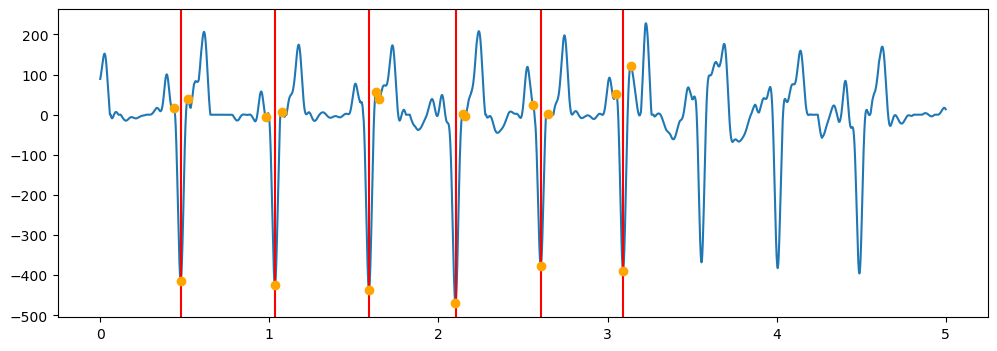

patient 20
channel  19
i 0.4725
i 1.03
i 1.587
i 2.098
i 2.6015
i 3.089
peak 864
peak in secs 0.432
peak 946
peak in secs 0.473
peak 1027
peak in secs 0.5135
peak 1942
peak in secs 0.971
peak 2060
peak in secs 1.03
peak 2143
peak in secs 1.0715
peak 3093
peak in secs 1.5465
peak 3174
peak in secs 1.587
peak 3258
peak in secs 1.629
peak 4080
peak in secs 2.04
peak 4196
peak in secs 2.098
peak 4317
peak in secs 2.1585
peak 5090
peak in secs 2.545
peak 5112
peak in secs 2.556
peak 5203
peak in secs 2.6015
peak 6178
peak in secs 3.089
peak 6272
peak in secs 3.136
peak 6292
peak in secs 3.146


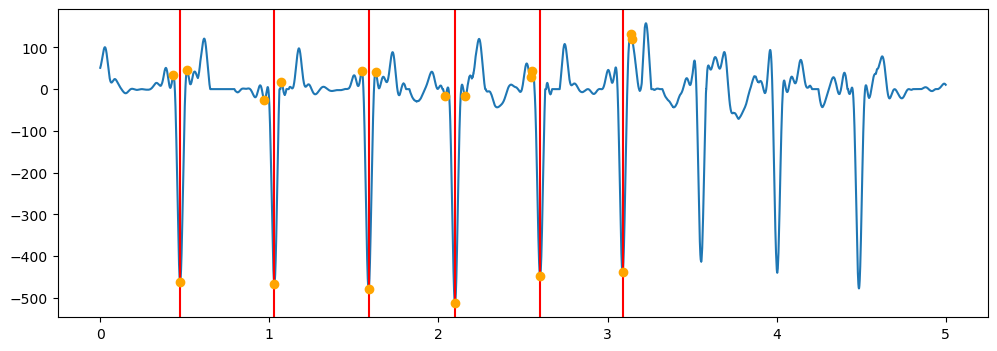

patient 20
channel  2
i 0.4695
i 1.026
i 1.5845
i 2.096
i 2.602
i 3.086
peak 791
peak in secs 0.3955
peak 872
peak in secs 0.436
peak 941
peak in secs 0.4705
peak 1910
peak in secs 0.955
peak 1988
peak in secs 0.994
peak 2125
peak in secs 1.0625
peak 3025
peak in secs 1.5125
peak 3170
peak in secs 1.585
peak 3241
peak in secs 1.6205
peak 4127
peak in secs 2.0635
peak 4194
peak in secs 2.097
peak 4270
peak in secs 2.135
peak 5134
peak in secs 2.567
peak 5206
peak in secs 2.603
peak 5283
peak in secs 2.6415
peak 6037
peak in secs 3.0185
peak 6173
peak in secs 3.0865
peak 6294
peak in secs 3.147


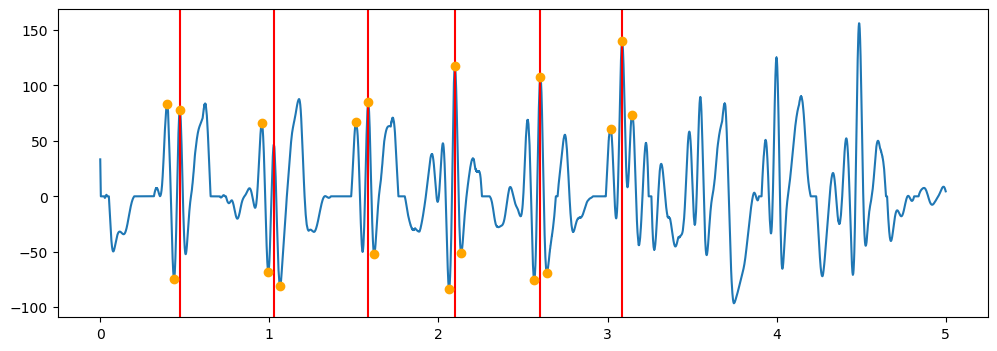

patient 20
channel  3
i 0.397
i 0.6245
i 0.955
i 1.1825
i 1.5135
i 1.763
peak 668
peak in secs 0.334
peak 789
peak in secs 0.3945
peak 885
peak in secs 0.4425
peak 1834
peak in secs 0.917
peak 1907
peak in secs 0.9535
peak 2015
peak in secs 1.0075
peak 3925
peak in secs 1.9625
peak 3994
peak in secs 1.997
peak 4050
peak in secs 2.025
peak 4400
peak in secs 2.2
peak 4420
peak in secs 2.21
peak 4488
peak in secs 2.244
peak 5150
peak in secs 2.575
peak 5225
peak in secs 2.6125
peak 5294
peak in secs 2.647
peak 6033
peak in secs 3.0165
peak 6119
peak in secs 3.0595
peak 6183
peak in secs 3.0915


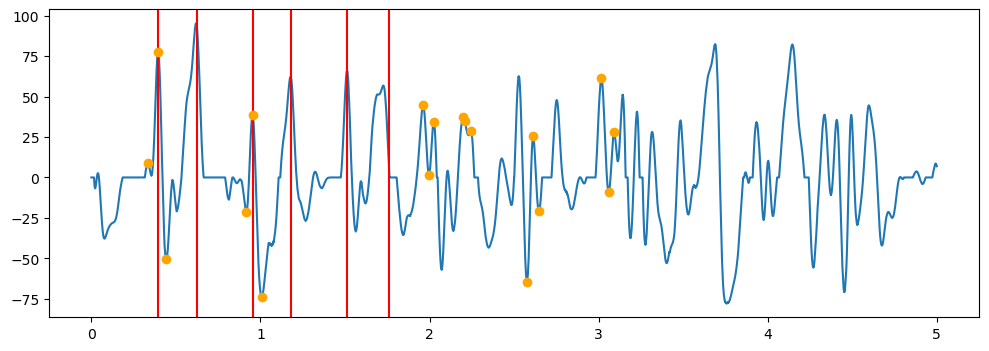

patient 20
channel  4
i 0.4675
i 1.024
i 1.5825
i 2.0935
i 2.5985
i 3.084
peak 865
peak in secs 0.4325
peak 935
peak in secs 0.4675
peak 1006
peak in secs 0.503
peak 1915
peak in secs 0.9575
peak 2048
peak in secs 1.024
peak 2120
peak in secs 1.06
peak 3027
peak in secs 1.5135
peak 3165
peak in secs 1.5825
peak 3237
peak in secs 1.6185
peak 4119
peak in secs 2.0595
peak 4187
peak in secs 2.0935
peak 4263
peak in secs 2.1315
peak 5126
peak in secs 2.563
peak 5198
peak in secs 2.599
peak 5269
peak in secs 2.6345
peak 6030
peak in secs 3.015
peak 6100
peak in secs 3.05
peak 6168
peak in secs 3.084


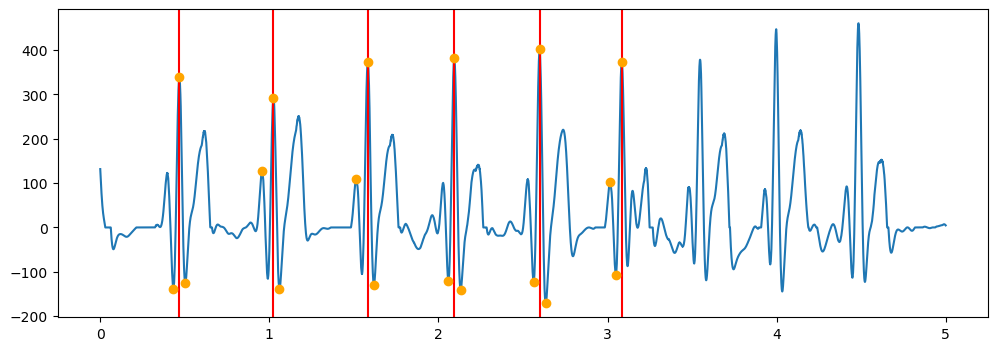

patient 20
channel  5
i 0.4685
i 1.0255
i 1.5835
i 2.0955
i 2.6005
i 3.085
peak 790
peak in secs 0.395
peak 872
peak in secs 0.436
peak 939
peak in secs 0.4695
peak 1914
peak in secs 0.957
peak 2052
peak in secs 1.026
peak 2122
peak in secs 1.061
peak 3033
peak in secs 1.5165
peak 3168
peak in secs 1.584
peak 3239
peak in secs 1.6195
peak 4124
peak in secs 2.062
peak 4193
peak in secs 2.0965
peak 4266
peak in secs 2.133
peak 5132
peak in secs 2.566
peak 5201
peak in secs 2.6005
peak 5278
peak in secs 2.639
peak 6034
peak in secs 3.017
peak 6171
peak in secs 3.0855
peak 6293
peak in secs 3.1465


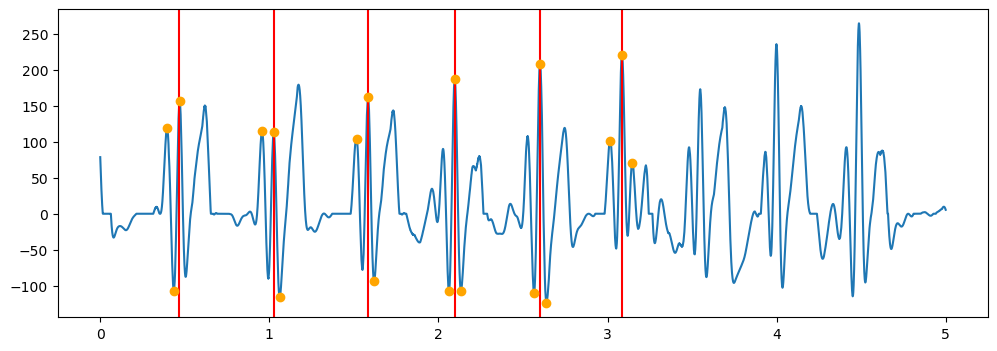

patient 20
channel  6
i 0.3975
i 0.6515
i 0.956
i 1.182
i 1.516
i 1.737
peak 670
peak in secs 0.335
peak 791
peak in secs 0.3955
peak 880
peak in secs 0.44
peak 1910
peak in secs 0.955
peak 2001
peak in secs 1.0005
peak 2043
peak in secs 1.0215
peak 3028
peak in secs 1.514
peak 3119
peak in secs 1.5595
peak 3136
peak in secs 1.568
peak 3923
peak in secs 1.9615
peak 4051
peak in secs 2.0255
peak 4137
peak in secs 2.0685
peak 4396
peak in secs 2.198
peak 4413
peak in secs 2.2065
peak 4489
peak in secs 2.2445
peak 5056
peak in secs 2.528
peak 5142
peak in secs 2.571
peak 5276
peak in secs 2.638


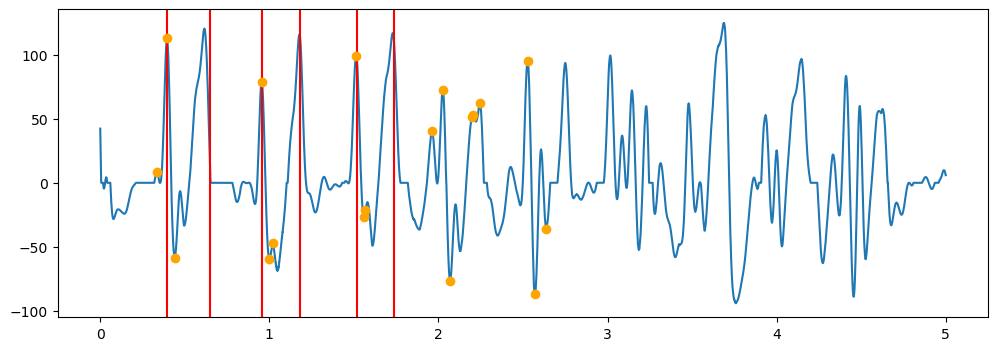

patient 20
channel  7
i 0.4705
i 1.028
i 1.585
i 2.0955
i 2.598
i 3.0885
peak 939
peak in secs 0.4695
peak 1022
peak in secs 0.511
peak 1060
peak in secs 0.53
peak 2055
peak in secs 1.0275
peak 2145
peak in secs 1.0725
peak 2163
peak in secs 1.0815
peak 3169
peak in secs 1.5845
peak 3255
peak in secs 1.6275
peak 3282
peak in secs 1.641
peak 4189
peak in secs 2.0945
peak 4273
peak in secs 2.1365
peak 4300
peak in secs 2.15
peak 5056
peak in secs 2.528
peak 5194
peak in secs 2.597
peak 5280
peak in secs 2.64
peak 6954
peak in secs 3.477
peak 7013
peak in secs 3.5065
peak 7100
peak in secs 3.55


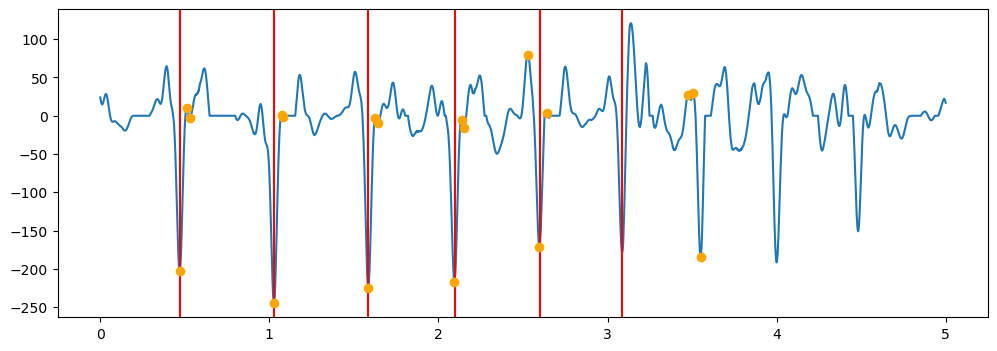

patient 20
channel  8
i 0.465
i 1.0225
i 1.58
i 2.091
i 2.595
i 3.081
peak 863
peak in secs 0.4315
peak 930
peak in secs 0.465
peak 997
peak in secs 0.4985
peak 1976
peak in secs 0.988
peak 2042
peak in secs 1.021
peak 2111
peak in secs 1.0555
peak 3027
peak in secs 1.5135
peak 3159
peak in secs 1.5795
peak 3228
peak in secs 1.614
peak 4054
peak in secs 2.027
peak 4182
peak in secs 2.091
peak 4254
peak in secs 2.127
peak 5122
peak in secs 2.561
peak 5188
peak in secs 2.594
peak 5262
peak in secs 2.631
peak 6094
peak in secs 3.047
peak 6163
peak in secs 3.0815
peak 6230
peak in secs 3.115


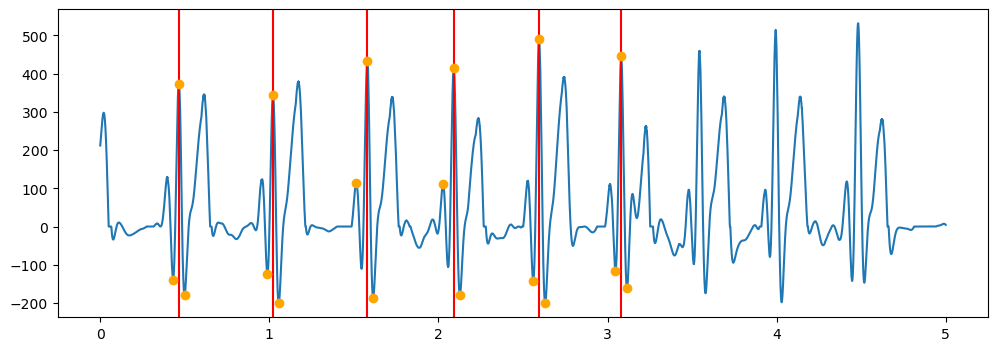

patient 20
channel  9
i 0.465
i 1.022
i 1.58
i 2.092
i 2.5975
i 3.082
peak 791
peak in secs 0.3955
peak 932
peak in secs 0.466
peak 1000
peak in secs 0.5
peak 1914
peak in secs 0.957
peak 2042
peak in secs 1.021
peak 2111
peak in secs 1.0555
peak 3029
peak in secs 1.5145
peak 3160
peak in secs 1.58
peak 3228
peak in secs 1.614
peak 4054
peak in secs 2.027
peak 4185
peak in secs 2.0925
peak 4258
peak in secs 2.129
peak 5056
peak in secs 2.528
peak 5196
peak in secs 2.598
peak 5266
peak in secs 2.633
peak 6034
peak in secs 3.017
peak 6165
peak in secs 3.0825
peak 6232
peak in secs 3.116


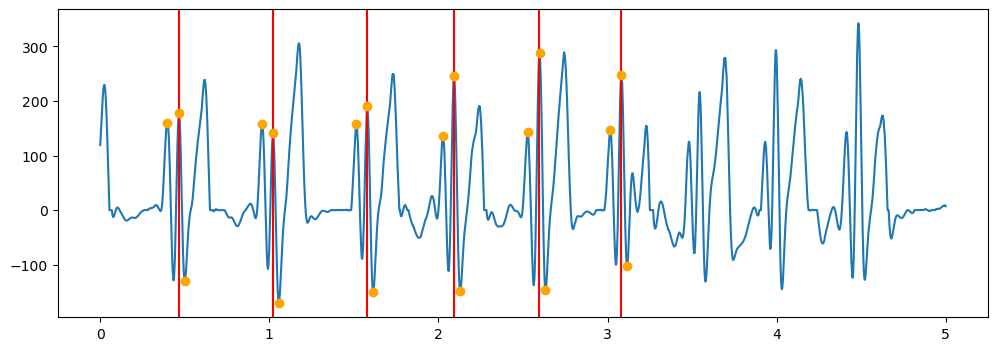

In [64]:
SW = 150
for ch in rMP.preprocessed_data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    print('channel ', ch)

    ch_third_peaks = []
    ch_all_three_peaks = []
    ch_third_peak_val = []
    ch_third_peak_width = []
    ch_pearson_corr = []

    rise_times = []
    fall_times = []

    for peak_peaksch in peaks_per_channel[ch]:
        signal_segment = rMP.preprocessed_data[ch][0:60].values
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)
            ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])

            result = compute_peak_widths(signal_segment, three_tallest_peaks[2], fs)
            if result is not None:
                peak_width, rise_time, fall_time = result
                # Add to other lists if needed
            else:
                print("Could not compute ratio for this peak.")
                peak_width, rise_time, fall_time = np.nan, np.nan, np.nan
            #if peak_width:
                    #print(peak_width)
            ch_third_peak_width.append(peak_width)
            rise_times.append(rise_time)
            fall_times.append(fall_time)

    thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
    third_peak_val[ch] = np.array(ch_third_peak_val)
    third_peak_width[ch] = np.array(ch_third_peak_width)
    third_peak_rise[ch] = np.array(rise_times)
    third_peak_fall[ch] = np.array(fall_times)


plotTraces(rMP, peaks_per_channel, all3peaks_per_channel, patient, third_peak_rise, third_peak_fall)

channel  1
channel  10
channel  11
channel  12
channel  13
channel  14
Could not compute ratio for this peak.
Could not compute ratio for this peak.
channel  15
Could not compute ratio for this peak.
channel  16
channel  17
Could not compute ratio for this peak.
channel  18
channel  19
channel  2
channel  3
channel  4
channel  5
Could not compute ratio for this peak.
channel  6
channel  7
channel  8
channel  9
Could not compute ratio for this peak.
patient 19
channel  1
i 0.324
i 1.1525
i 1.6125
i 2.251
i 3.145
i 3.872
peak 584
peak in secs 0.292
peak 649
peak in secs 0.3245
peak 951
peak in secs 0.4755
peak 2305
peak in secs 1.1525
peak 2440
peak in secs 1.22
peak 2614
peak in secs 1.307
peak 3065
peak in secs 1.5325
peak 3225
peak in secs 1.6125
peak 3525
peak in secs 1.7625
peak 4296
peak in secs 2.148
peak 4502
peak in secs 2.251
peak 4807
peak in secs 2.4035
peak 6291
peak in secs 3.1455
peak 6412
peak in secs 3.206
peak 6597
peak in secs 3.2985
peak 7744
peak in secs 3.872
peak 7

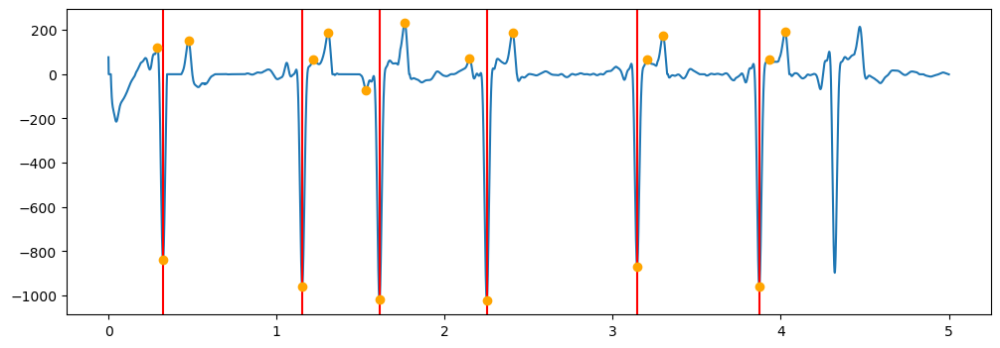

patient 19
channel  10
i 0.3205
i 1.0665
i 1.6075
i 2.248
i 3.1405
i 3.869
peak 587
peak in secs 0.2935
peak 641
peak in secs 0.3205
peak 696
peak in secs 0.348
peak 2133
peak in secs 1.0665
peak 2248
peak in secs 1.124
peak 2302
peak in secs 1.151
peak 3044
peak in secs 1.522
peak 3158
peak in secs 1.579
peak 3216
peak in secs 1.608
peak 4317
peak in secs 2.1585
peak 4442
peak in secs 2.221
peak 4496
peak in secs 2.248
peak 6280
peak in secs 3.14
peak 6336
peak in secs 3.168
peak 6596
peak in secs 3.298
peak 7565
peak in secs 3.7825
peak 7738
peak in secs 3.869
peak 8054
peak in secs 4.027


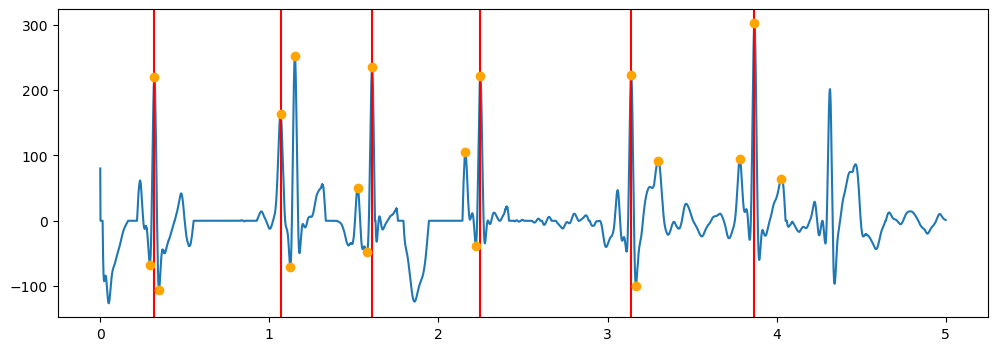

patient 19
channel  11
i 0.32
i 1.148
i 1.606
i 2.246
i 3.14
i 3.8675
peak 640
peak in secs 0.32
peak 697
peak in secs 0.3485
peak 1051
peak in secs 0.5255
peak 2135
peak in secs 1.0675
peak 2296
peak in secs 1.148
peak 2599
peak in secs 1.2995
peak 3212
peak in secs 1.606
peak 3268
peak in secs 1.634
peak 3534
peak in secs 1.767
peak 4311
peak in secs 2.1555
peak 4492
peak in secs 2.246
peak 4794
peak in secs 2.397
peak 6280
peak in secs 3.14
peak 6337
peak in secs 3.1685
peak 6605
peak in secs 3.3025
peak 7734
peak in secs 3.867
peak 8041
peak in secs 4.0205
peak 8059
peak in secs 4.0295


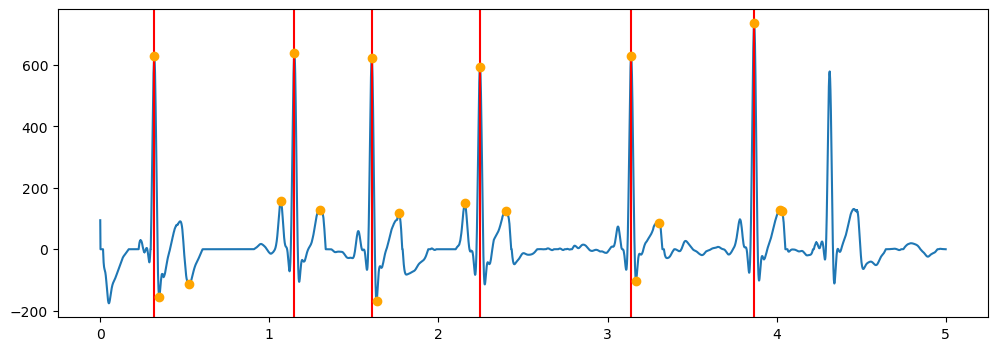

patient 19
channel  12
i 0.318
i 1.146
i 1.6045
i 2.2445
i 3.138
i 3.8655
peak 635
peak in secs 0.3175
peak 691
peak in secs 0.3455
peak 936
peak in secs 0.468
peak 2291
peak in secs 1.1455
peak 2601
peak in secs 1.3005
peak 2621
peak in secs 1.3105
peak 3209
peak in secs 1.6045
peak 3263
peak in secs 1.6315
peak 3533
peak in secs 1.7665
peak 4488
peak in secs 2.244
peak 4794
peak in secs 2.397
peak 4814
peak in secs 2.407
peak 6275
peak in secs 3.1375
peak 6585
peak in secs 3.2925
peak 6604
peak in secs 3.302
peak 7731
peak in secs 3.8655
peak 8041
peak in secs 4.0205
peak 8059
peak in secs 4.0295


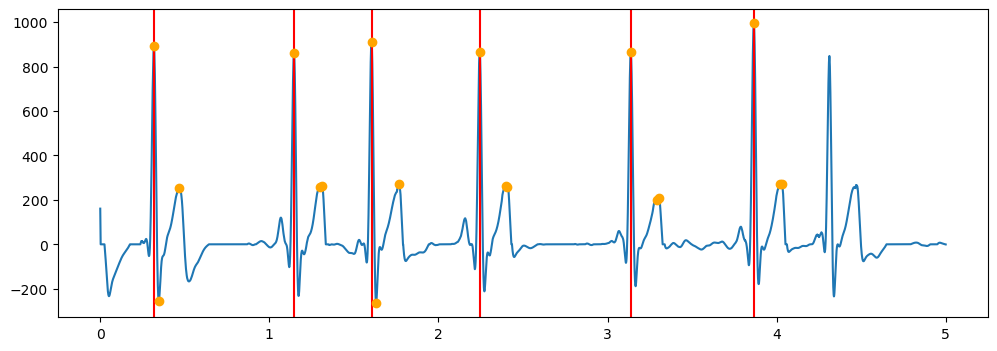

patient 19
channel  13
i 0.3185
i 8.911
i 9.856
i 10.47
i 11.2175
i 12.1235
peak 398
peak in secs 0.199
peak 466
peak in secs 0.233
peak 638
peak in secs 0.319
peak 17691
peak in secs 8.8455
peak 17822
peak in secs 8.911
peak 18130
peak in secs 9.065
peak 19710
peak in secs 9.855
peak 19868
peak in secs 9.934
peak 19885
peak in secs 9.9425
peak 20755
peak in secs 10.3775
peak 20823
peak in secs 10.4115
peak 20941
peak in secs 10.4705
peak 22433
peak in secs 11.2165
peak 22604
peak in secs 11.302
peak 22722
peak in secs 11.361
peak 23831
peak in secs 11.9155
peak 24084
peak in secs 12.042
peak 24251
peak in secs 12.1255


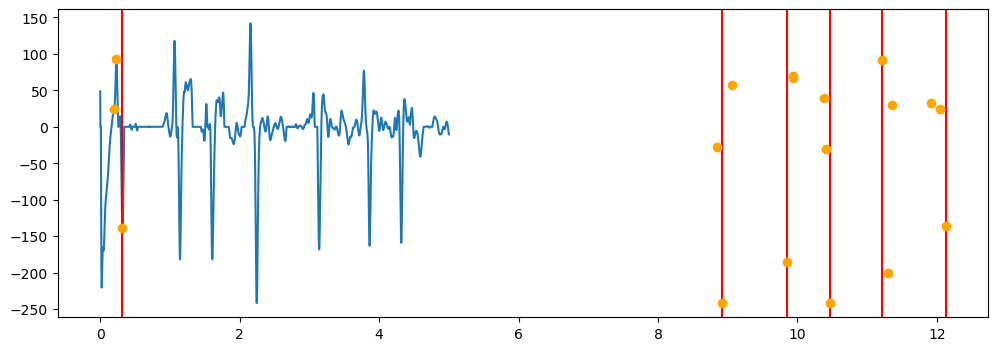

patient 19
channel  14
i 0.302
i 1.153
i 1.61
i 2.251
i 2.465
i 3.1435
peak 607
peak in secs 0.3035
peak 644
peak in secs 0.322
peak 695
peak in secs 0.3475
peak 2013
peak in secs 1.0065
peak 2137
peak in secs 1.0685
peak 2307
peak in secs 1.1535
peak 3220
peak in secs 1.61
peak 3490
peak in secs 1.745
peak 3595
peak in secs 1.7975
peak 4412
peak in secs 2.206
peak 4503
peak in secs 2.2515
peak 4858
peak in secs 2.429
peak 4503
peak in secs 2.2515
peak 4858
peak in secs 2.429
peak 5006
peak in secs 2.503
peak 6006
peak in secs 3.003
peak 6285
peak in secs 3.1425
peak 6340
peak in secs 3.17


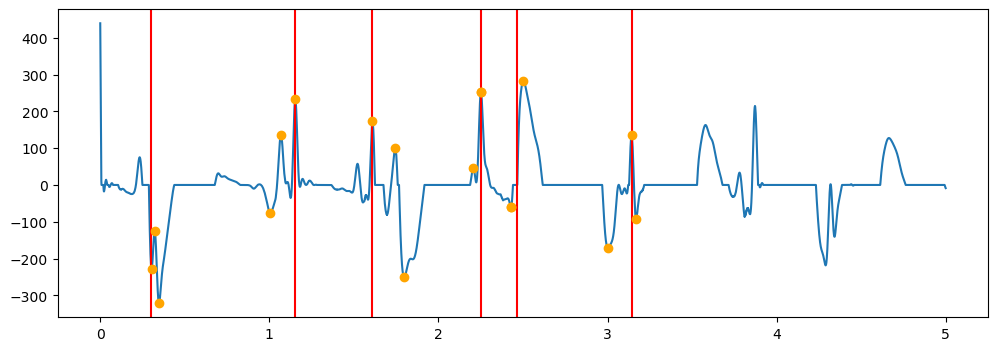

patient 19
channel  15
i 0.2125
i 1.15
i 1.6075
i 2.2475
i 3.1405
i 3.8685
peak 44
peak in secs 0.022
peak 101
peak in secs 0.0505
peak 642
peak in secs 0.321
peak 2137
peak in secs 1.0685
peak 2242
peak in secs 1.121
peak 2301
peak in secs 1.1505
peak 3153
peak in secs 1.5765
peak 3216
peak in secs 1.608
peak 3632
peak in secs 1.816
peak 4317
peak in secs 2.1585
peak 4436
peak in secs 2.218
peak 4496
peak in secs 2.248
peak 6223
peak in secs 3.1115
peak 6281
peak in secs 3.1405
peak 6340
peak in secs 3.17
peak 7569
peak in secs 3.7845
peak 7677
peak in secs 3.8385
peak 7737
peak in secs 3.8685


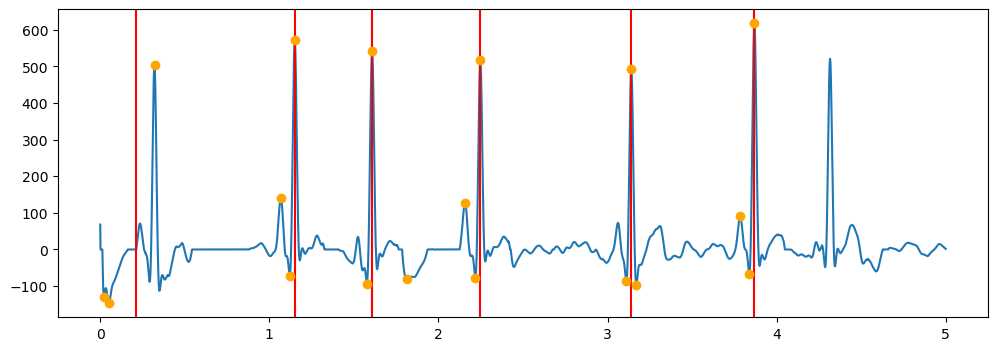

patient 19
channel  16
i 0.32
i 1.148
i 1.6065
i 2.246
i 3.1395
i 3.867
peak 640
peak in secs 0.32
peak 698
peak in secs 0.349
peak 1049
peak in secs 0.5245
peak 2295
peak in secs 1.1475
peak 2353
peak in secs 1.1765
peak 2575
peak in secs 1.2875
peak 3212
peak in secs 1.606
peak 3270
peak in secs 1.635
peak 3530
peak in secs 1.765
peak 4315
peak in secs 2.1575
peak 4492
peak in secs 2.246
peak 4776
peak in secs 2.388
peak 6279
peak in secs 3.1395
peak 6337
peak in secs 3.1685
peak 6563
peak in secs 3.2815
peak 7734
peak in secs 3.867
peak 8019
peak in secs 4.0095
peak 8062
peak in secs 4.031


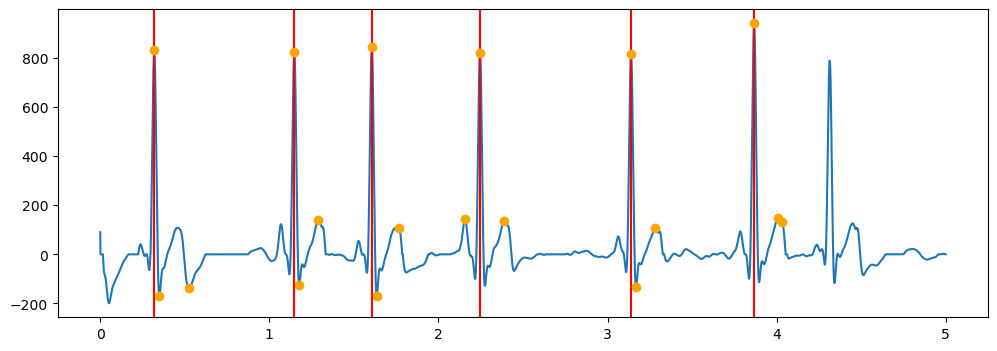

patient 19
channel  17
i 0.2365
i 1.155
i 1.6125
i 2.2525
i 3.1445
i 3.8725
peak 41
peak in secs 0.0205
peak 80
peak in secs 0.04
peak 96
peak in secs 0.048
peak 2134
peak in secs 1.067
peak 2257
peak in secs 1.1285
peak 2311
peak in secs 1.1555
peak 3113
peak in secs 1.5565
peak 3172
peak in secs 1.586
peak 3225
peak in secs 1.6125
peak 4312
peak in secs 2.156
peak 4453
peak in secs 2.2265
peak 4507
peak in secs 2.2535
peak 6121
peak in secs 3.0605
peak 6238
peak in secs 3.119
peak 6290
peak in secs 3.145
peak 7567
peak in secs 3.7835
peak 7688
peak in secs 3.844
peak 7747
peak in secs 3.8735


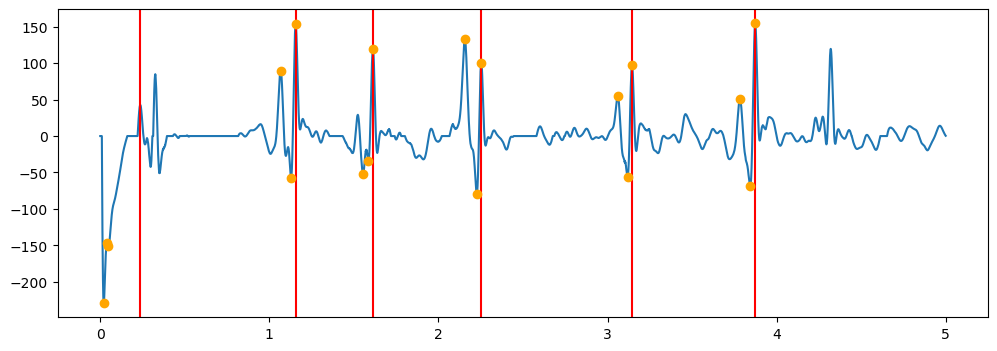

patient 19
channel  18
i 0.3225
i 1.152
i 1.6095
i 2.249
i 3.142
i 3.87
peak 644
peak in secs 0.322
peak 704
peak in secs 0.352
peak 757
peak in secs 0.3785
peak 2136
peak in secs 1.068
peak 2247
peak in secs 1.1235
peak 2304
peak in secs 1.152
peak 3048
peak in secs 1.524
peak 3152
peak in secs 1.576
peak 3219
peak in secs 1.6095
peak 4314
peak in secs 2.157
peak 4442
peak in secs 2.221
peak 4499
peak in secs 2.2495
peak 6122
peak in secs 3.061
peak 6227
peak in secs 3.1135
peak 6285
peak in secs 3.1425
peak 7570
peak in secs 3.785
peak 7681
peak in secs 3.8405
peak 7741
peak in secs 3.8705


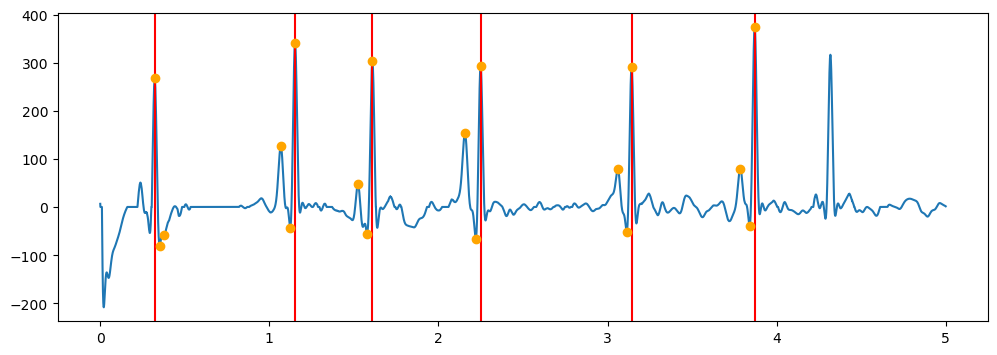

patient 19
channel  19
i 0.321
i 1.15
i 1.608
i 2.2475
i 3.141
i 3.8685
peak 641
peak in secs 0.3205
peak 702
peak in secs 0.351
peak 758
peak in secs 0.379
peak 2138
peak in secs 1.069
peak 2241
peak in secs 1.1205
peak 2300
peak in secs 1.15
peak 3156
peak in secs 1.578
peak 3216
peak in secs 1.608
peak 3276
peak in secs 1.638
peak 4316
peak in secs 2.158
peak 4436
peak in secs 2.218
peak 4495
peak in secs 2.2475
peak 6126
peak in secs 3.063
peak 6222
peak in secs 3.111
peak 6282
peak in secs 3.141
peak 7573
peak in secs 3.7865
peak 7676
peak in secs 3.838
peak 7737
peak in secs 3.8685


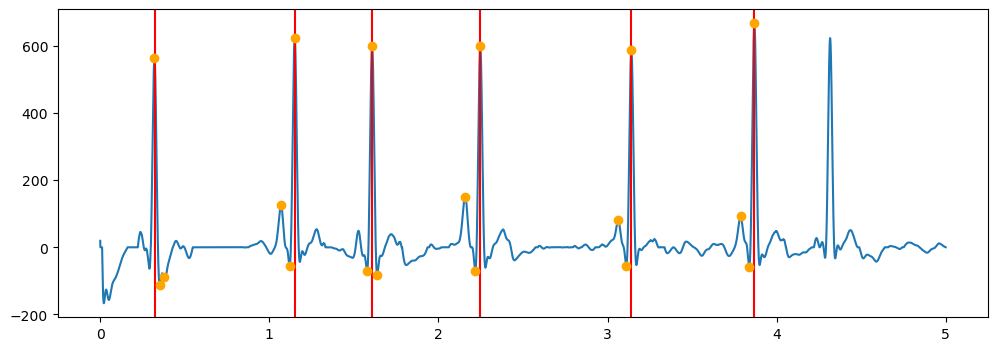

patient 19
channel  2
i 0.326
i 1.155
i 1.6145
i 2.253
i 3.1475
i 3.874
peak 580
peak in secs 0.29
peak 653
peak in secs 0.3265
peak 950
peak in secs 0.475
peak 2124
peak in secs 1.062
peak 2310
peak in secs 1.155
peak 2613
peak in secs 1.3065
peak 3229
peak in secs 1.6145
peak 3522
peak in secs 1.761
peak 3607
peak in secs 1.8035
peak 4303
peak in secs 2.1515
peak 4505
peak in secs 2.2525
peak 4806
peak in secs 2.403
peak 6078
peak in secs 3.039
peak 6296
peak in secs 3.148
peak 6596
peak in secs 3.298
peak 7748
peak in secs 3.874
peak 7874
peak in secs 3.937
peak 8051
peak in secs 4.0255


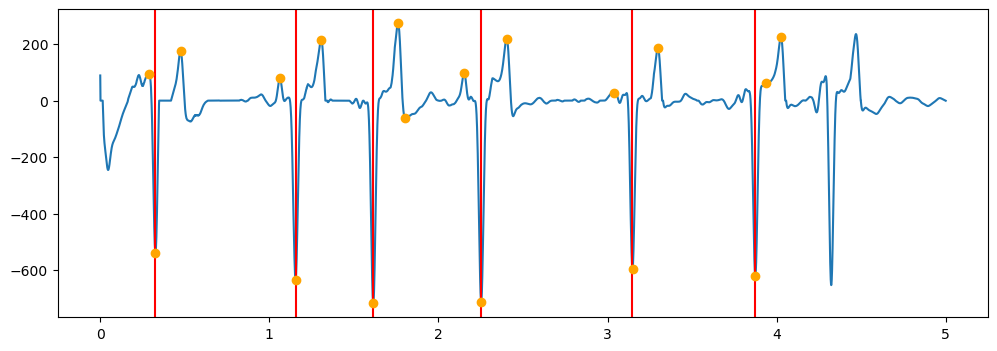

patient 19
channel  3
i 0.3335
i 1.161
i 1.62
i 2.2585
i 3.153
i 3.881
peak 615
peak in secs 0.3075
peak 668
peak in secs 0.334
peak 946
peak in secs 0.473
peak 2130
peak in secs 1.065
peak 2322
peak in secs 1.161
peak 2610
peak in secs 1.305
peak 3187
peak in secs 1.5935
peak 3241
peak in secs 1.6205
peak 3519
peak in secs 1.7595
peak 4307
peak in secs 2.1535
peak 4516
peak in secs 2.258
peak 4804
peak in secs 2.402
peak 6252
peak in secs 3.126
peak 6307
peak in secs 3.1535
peak 6593
peak in secs 3.2965
peak 7709
peak in secs 3.8545
peak 7764
peak in secs 3.882
peak 8048
peak in secs 4.024


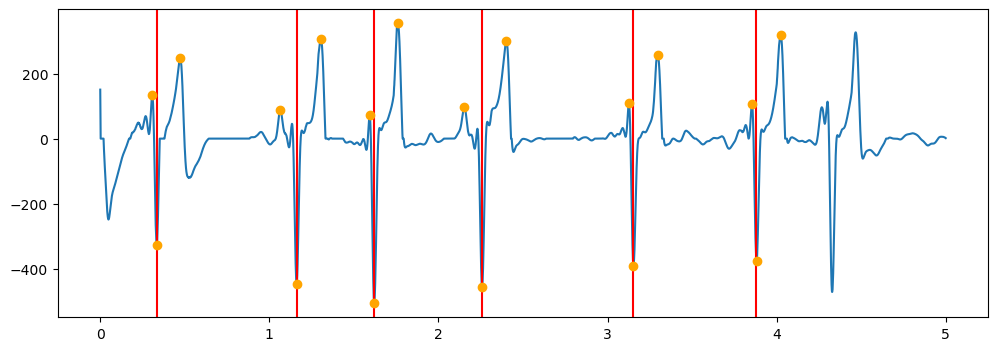

patient 19
channel  4
i 0.3235
i 1.1515
i 1.611
i 2.2495
i 3.144
i 3.8705
peak 447
peak in secs 0.2235
peak 647
peak in secs 0.3235
peak 955
peak in secs 0.4775
peak 2125
peak in secs 1.0625
peak 2303
peak in secs 1.1515
peak 2615
peak in secs 1.3075
peak 3074
peak in secs 1.537
peak 3223
peak in secs 1.6115
peak 3525
peak in secs 1.7625
peak 4303
peak in secs 2.1515
peak 4499
peak in secs 2.2495
peak 4808
peak in secs 2.404
peak 6289
peak in secs 3.1445
peak 6406
peak in secs 3.203
peak 6599
peak in secs 3.2995
peak 7741
peak in secs 3.8705
peak 7856
peak in secs 3.928
peak 8052
peak in secs 4.026


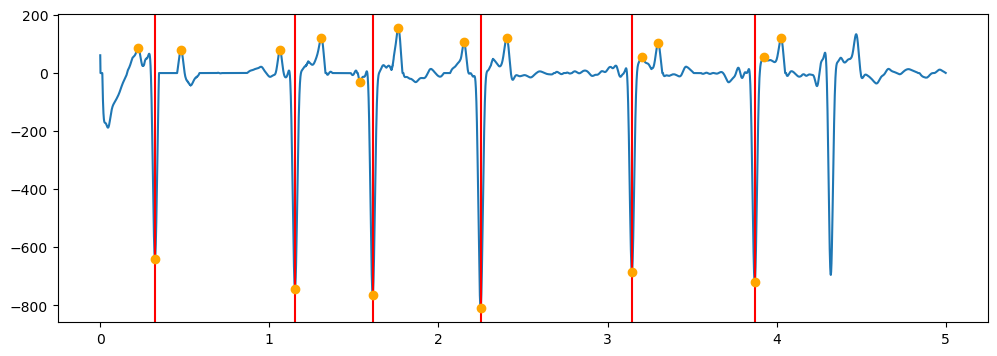

patient 19
channel  5
i 0.231
i 1.152
i 1.614
i 2.2505
i 3.147
i 3.8725
peak 94
peak in secs 0.047
peak 460
peak in secs 0.23
peak 650
peak in secs 0.325
peak 2129
peak in secs 1.0645
peak 2304
peak in secs 1.152
peak 2615
peak in secs 1.3075
peak 3227
peak in secs 1.6135
peak 3452
peak in secs 1.726
peak 3525
peak in secs 1.7625
peak 4306
peak in secs 2.153
peak 4501
peak in secs 2.2505
peak 4808
peak in secs 2.404
peak 6111
peak in secs 3.0555
peak 6295
peak in secs 3.1475
peak 6598
peak in secs 3.299
peak 7555
peak in secs 3.7775
peak 7747
peak in secs 3.8735
peak 8052
peak in secs 4.026


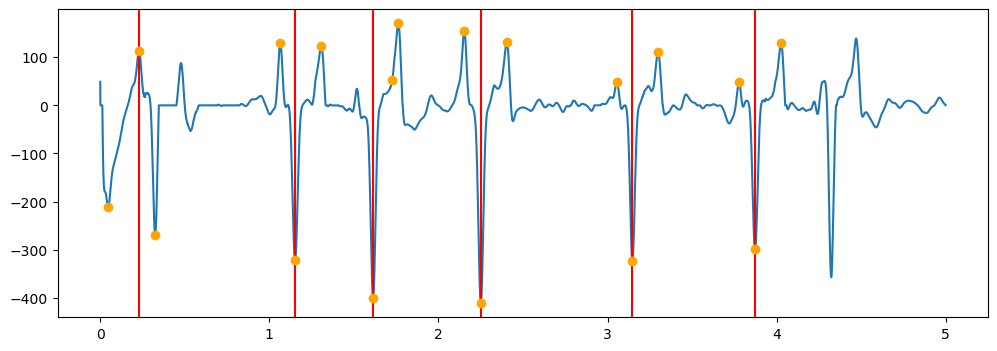

patient 19
channel  6
i 0.3165
i 1.066
i 1.3125
i 1.6025
i 2.2425
i 3.136
peak 631
peak in secs 0.3155
peak 685
peak in secs 0.3425
peak 941
peak in secs 0.4705
peak 2132
peak in secs 1.066
peak 2290
peak in secs 1.145
peak 2341
peak in secs 1.1705
peak 2290
peak in secs 1.145
peak 2341
peak in secs 1.1705
peak 2623
peak in secs 1.3115
peak 3203
peak in secs 1.6015
peak 3253
peak in secs 1.6265
peak 3608
peak in secs 1.804
peak 4310
peak in secs 2.155
peak 4532
peak in secs 2.266
peak 4813
peak in secs 2.4065
peak 6269
peak in secs 3.1345
peak 6323
peak in secs 3.1615
peak 6601
peak in secs 3.3005


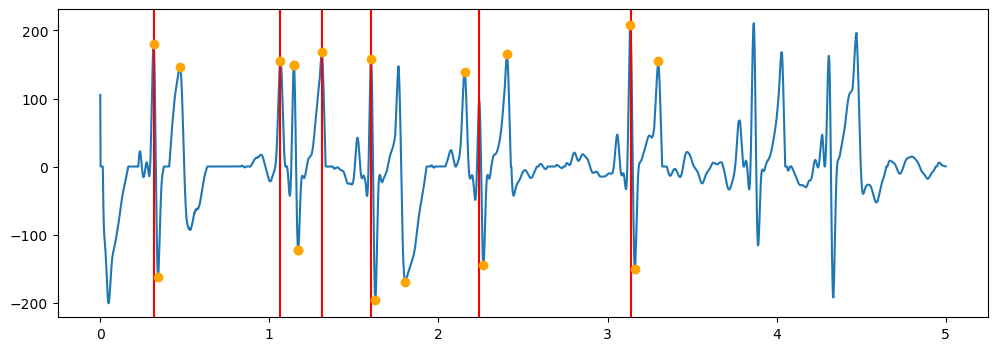

patient 19
channel  7
i 0.3165
i 1.145
i 1.603
i 2.243
i 3.136
i 3.8645
peak 630
peak in secs 0.315
peak 685
peak in secs 0.3425
peak 946
peak in secs 0.473
peak 2289
peak in secs 1.1445
peak 2341
peak in secs 1.1705
peak 2625
peak in secs 1.3125
peak 3205
peak in secs 1.6025
peak 3257
peak in secs 1.6285
peak 3532
peak in secs 1.766
peak 4484
peak in secs 2.242
peak 4537
peak in secs 2.2685
peak 4814
peak in secs 2.407
peak 6270
peak in secs 3.135
peak 6325
peak in secs 3.1625
peak 6608
peak in secs 3.304
peak 7728
peak in secs 3.864
peak 7782
peak in secs 3.891
peak 8058
peak in secs 4.029


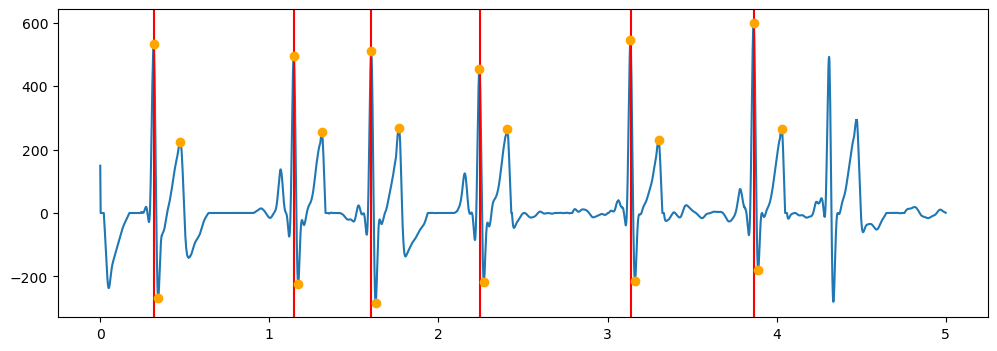

patient 19
channel  8
i 0.3215
i 1.149
i 1.609
i 2.247
i 3.142
i 3.868
peak 457
peak in secs 0.2285
peak 576
peak in secs 0.288
peak 643
peak in secs 0.3215
peak 2127
peak in secs 1.0635
peak 2298
peak in secs 1.149
peak 2613
peak in secs 1.3065
peak 3218
peak in secs 1.609
peak 3472
peak in secs 1.736
peak 3524
peak in secs 1.762
peak 4305
peak in secs 2.1525
peak 4495
peak in secs 2.2475
peak 4805
peak in secs 2.4025
peak 6284
peak in secs 3.142
peak 6398
peak in secs 3.199
peak 6418
peak in secs 3.209
peak 7736
peak in secs 3.868
peak 7817
peak in secs 3.9085
peak 8052
peak in secs 4.026


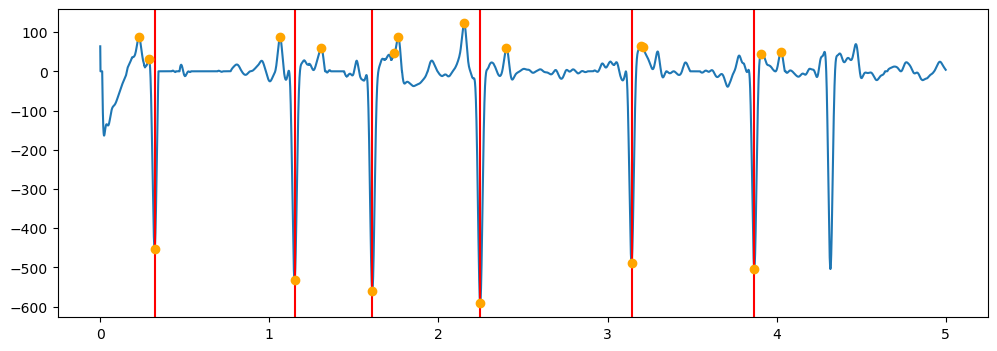

patient 19
channel  9
i 0.232
i 1.1445
i 1.6105
i 2.1555
i 3.144
i 3.8655
peak 46
peak in secs 0.023
peak 95
peak in secs 0.0475
peak 647
peak in secs 0.3235
peak 2131
peak in secs 1.0655
peak 2291
peak in secs 1.1455
peak 2615
peak in secs 1.3075
peak 3223
peak in secs 1.6115
peak 3376
peak in secs 1.688
peak 3416
peak in secs 1.708
peak 4236
peak in secs 2.118
peak 4308
peak in secs 2.154
peak 4494
peak in secs 2.247
peak 6181
peak in secs 3.0905
peak 6206
peak in secs 3.103
peak 6287
peak in secs 3.1435
peak 7558
peak in secs 3.779
peak 7733
peak in secs 3.8665
peak 8055
peak in secs 4.0275


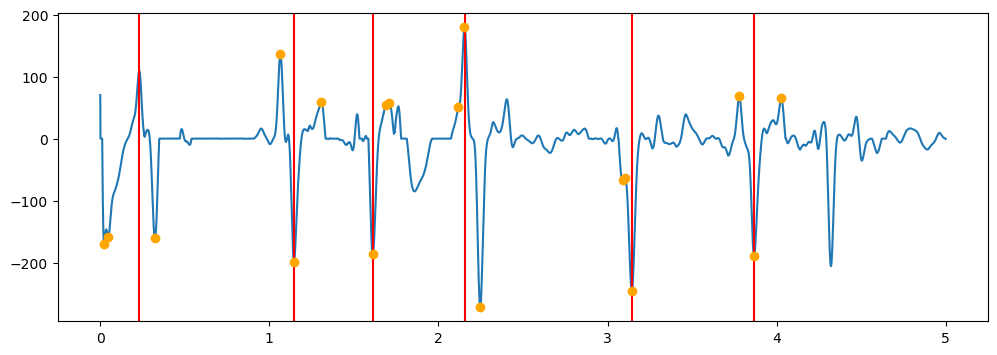

ch, channel_peaks 10 [   587   2133   3044   4317   6280   7565   8631  10231  11224  12937
  13830  14508  16727  17827  19661  20760  22437  24089  25060  26828
  27852  29371  30245  32250  33289  35337  35773  37822  38404  40353
  41220  43130  44358  46187  47783  49003  50191  52251  53319  55176
  56254  57863  59434  61147  62632  63540  65494  66466  68577  69490
  70691  71774  73680  75259  76199  77205  78168  79539  80421  81913
  82865  84720  85652  86300  88380  89399  91009  92835  94319  95410
  96869  98678  99667 101116 102960 104356 105469 106297 107823 108840
 110442 111115 112776 113834 114387 115412 116445 117844 118768 119475]
LENGTH 90
LENGTH 90
LENGTH 90
ch, delay_ch_col0 10 3
ch, channel_peaks 11 [   640   2135   3212   4311   6280   7734   8628  10232  11400  12940
  14010  14940  16732  17822  19708  20945  22438  24251  25231  26987
  27848  29375  30422  32416  33281  35335  36212  37827  38831  40353
  41395  43286  44562  46355  47784  49168  50375  5

In [53]:
SW = 450
# finding surrounding peaks with the significant peak at the centre of the serach window
thirdof3peaks_per_channel = {}
all3peaks_per_channel = {}
third_peak_val = {}
third_peak_width = {}
third_peak_rise = {}
third_peak_fall = {}
pearson_corr = {}

for ch in rMP.preprocessed_data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    print('channel ', ch)

    ch_third_peaks = []
    ch_all_three_peaks = []
    ch_third_peak_val = []
    ch_third_peak_width = []
    ch_pearson_corr = []

    rise_times = []
    fall_times = []

    for peak_peaksch in peaks_per_channel[ch]:
        signal_segment = rMP.preprocessed_data[ch][0:60].values
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[0])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)
            ch_third_peak_val.append(signal_segment[three_tallest_peaks[0]])

            result = compute_peak_widths(signal_segment, three_tallest_peaks[0], fs)
            if result is not None:
                peak_width, rise_time, fall_time = result
                # Add to other lists if needed
            else:
                print("Could not compute ratio for this peak.")
                peak_width, rise_time, fall_time = np.nan, np.nan, np.nan
            #if peak_width:
                    #print(peak_width)
            ch_third_peak_width.append(peak_width)
            rise_times.append(rise_time)
            fall_times.append(fall_time)

    thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
    third_peak_val[ch] = np.array(ch_third_peak_val)
    third_peak_width[ch] = np.array(ch_third_peak_width)
    third_peak_rise[ch] = np.array(rise_times)
    third_peak_fall[ch] = np.array(fall_times)


plotTraces(rMP, peaks_per_channel, all3peaks_per_channel, patient, third_peak_rise, third_peak_fall)

delays_df, amps_df, widths_df = fun2(rMP, stg, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW)
delays_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V3-V4/delays19.xlsx'
#amps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/amps.xlsx'
#widths_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/widths.xlsx'
SaveToExcel(delays_df, delays_pth)
#SaveToExcel(amps_df, amps_path)
#SaveToExcel(widths_df, widths_pth)

In [46]:
delays_df, amps_df, widths_df = fun2(rMP, stg, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW)
delays_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V3-V4/delays18.xlsx'
#amps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/amps.xlsx'
#widths_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/widths.xlsx'
SaveToExcel(delays_df, delays_pth)

ch, channel_peaks 10 [   559   2233   3761   5259   6828   8361   9978  11582  13221  14809
  16443  18065  19432  21332  22878  24176  26086  27367  28894  30694
  32096  34106  35646  37164  38346  40277  41879  43545  45140  46404
  48194  49868  51242  53102  54343  55782  57506  59014  60436  61794
  62904  64317  65781  67324  69170  70685  72225  73736  75025  76954
  78524  79797  81394  83373  84950  86482  88118  89675  90942  92799
  94337  95874  97376  98590 100491 101699 103527 105071 106331 108238
 109455 111327 112518 114483 116041 117679 119250]
LENGTH 77
LENGTH 77
LENGTH 77
ch, delay_ch_col0 10 13
ch, channel_peaks 11 [   846   2228   3757   5254   6822   8354   9973  11575  13214  14804
  16438  18061  19723  21324  22875  24466  26077  27659  29183  30688
  32388  34101  35642  37162  38637  40270  41876  43541  45139  46696
  48189  49865  51533  53097  54633  56077  57500  59007  60435  61792
  63189  64606  66070  67616  69168  70682  72221  73732  75317  76950
 

plotting traces

channel  1
channel  10
channel  11
channel  12
channel  13
Could not compute ratio for this peak.
channel  14
channel  15
channel  16
channel  17
channel  18
channel  19
channel  2
channel  3
channel  4
channel  5
channel  6
channel  7
channel  8
channel  9
patient 27
channel  1
i 0.971
i 2.1915
i 3.256
i 4.3885
i 5.5805
i 6.7565
peak 1938
peak in secs 0.969
peak 2007
peak in secs 1.0035
peak 2293
peak in secs 1.1465
peak 4379
peak in secs 2.1895
peak 4448
peak in secs 2.224
peak 4737
peak in secs 2.3685
peak 6508
peak in secs 3.254
peak 6578
peak in secs 3.289
peak 6865
peak in secs 3.4325
peak 8773
peak in secs 4.3865
peak 8842
peak in secs 4.421
peak 9127
peak in secs 4.5635
peak 11156
peak in secs 5.578
peak 11227
peak in secs 5.6135
peak 11516
peak in secs 5.758
peak 13509
peak in secs 6.7545
peak 13579
peak in secs 6.7895
peak 13868
peak in secs 6.934


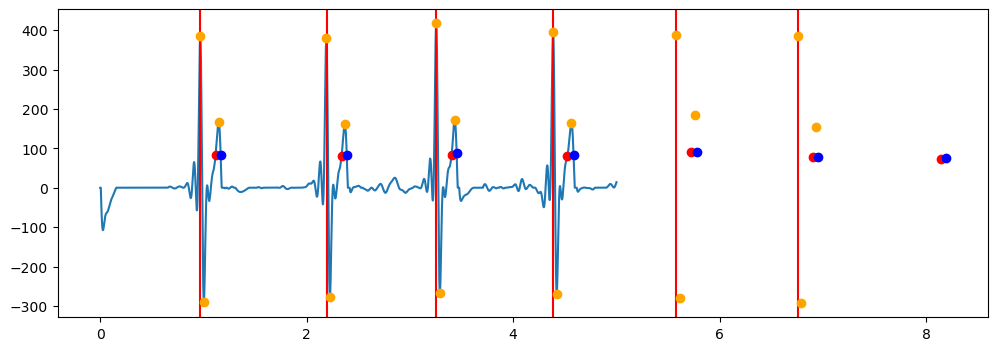

" delays_df, amps_df, widths_df = fun2(rMP, stg, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW)\ndelays_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/delays.xlsx'\namps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/amps.xlsx'\nwidths_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/widths.xlsx'\nSaveToExcel(delays_df, delays_pth)\nSaveToExcel(amps_df, amps_path)\nSaveToExcel(widths_df, widths_pth) "

In [67]:
SW = 400
# finding surrounding peaks with the significant peak at the centre of the serach window
thirdof3peaks_per_channel = {}
all3peaks_per_channel = {}
third_peak_val = {}
third_peak_width = {}
third_peak_rise = {}
third_peak_fall = {}
pearson_corr = {}

for ch in rMP.preprocessed_data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    print('channel ', ch)

    ch_third_peaks = []
    ch_all_three_peaks = []
    ch_third_peak_val = []
    ch_third_peak_width = []
    ch_pearson_corr = []

    rise_times = []
    fall_times = []

    for peak_peaksch in peaks_per_channel[ch]:
        signal_segment = rMP.preprocessed_data[ch][0:60].values
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)
            ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])

            result = compute_peak_widths(signal_segment, three_tallest_peaks[2], fs)
            if result is not None:
                peak_width, rise_time, fall_time = result
                # Add to other lists if needed
            else:
                print("Could not compute ratio for this peak.")
                peak_width, rise_time, fall_time = np.nan, np.nan, np.nan
            #if peak_width:
                    #print(peak_width)
            ch_third_peak_width.append(peak_width)
            rise_times.append(rise_time)
            fall_times.append(fall_time)

    thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
    third_peak_val[ch] = np.array(ch_third_peak_val)
    third_peak_width[ch] = np.array(ch_third_peak_width)
    third_peak_rise[ch] = np.array(rise_times)
    third_peak_fall[ch] = np.array(fall_times)


plotTraces(rMP, peaks_per_channel, all3peaks_per_channel, patient, third_peak_rise, third_peak_fall)

""" delays_df, amps_df, widths_df = fun2(rMP, stg, thirdof3peaks_per_channel, patient, third_peak_val, third_peak_width, SW)
delays_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/delays.xlsx'
amps_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/amps.xlsx'
widths_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/widths.xlsx'
SaveToExcel(delays_df, delays_pth)
SaveToExcel(amps_df, amps_path)
SaveToExcel(widths_df, widths_pth) """

In [59]:
for i in third_peak_width:
    print(i, len(third_peak_width[i]))

#print(len(third_peak_width['10']))

1 60
10 62
11 62
12 62
13 67
14 61
15 62
16 61
17 60
18 61
19 62
2 60
3 59
4 60
5 60
6 61
7 61
8 60
9 62


channel  1
channel  10
channel  11
channel  12
channel  13
channel  14
channel  15
channel  16
channel  17
channel  18
channel  19
channel  2
channel  3
less than 3 peaks found
channel  4
less than 3 peaks found
channel  5
channel  6
less than 3 peaks found
channel  7
channel  8
channel  9
patient 29
channel  1
i 0.6855
i 1.439
i 2.1825
i 3.2735
i 4.0105
i 4.9225
peak 1283
peak in secs 0.6415


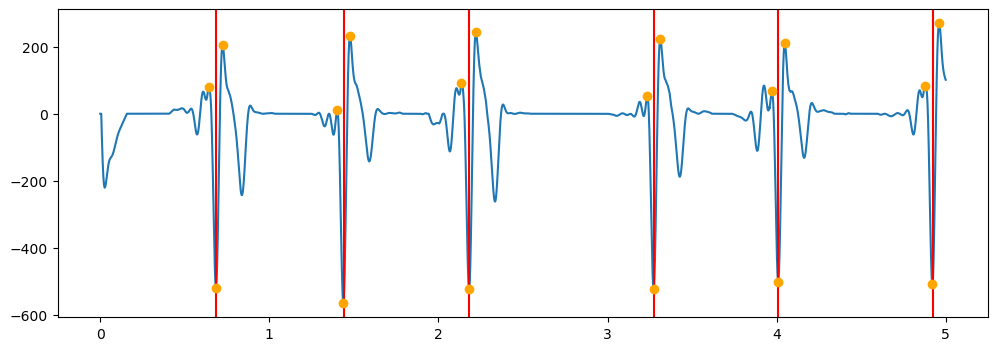

peak 1369
peak in secs 0.6845
peak 1447
peak in secs 0.7235
peak 2803
peak in secs 1.4015
peak 2875
peak in secs 1.4375
peak 2954
peak in secs 1.477
peak 4272
peak in secs 2.136
peak 4363
peak in secs 2.1815
peak 4443
peak in secs 2.2215
peak 6469
peak in secs 3.2345
peak 6545
peak in secs 3.2725
peak 6624
peak in secs 3.312
peak 7945
peak in secs 3.9725
peak 8019
peak in secs 4.0095
peak 8096
peak in secs 4.048
peak 9759
peak in secs 4.8795
peak 9842
peak in secs 4.921
peak 9922
peak in secs 4.961
patient 29
channel  10
i 0.6915
i 1.444
i 2.19
i 3.2785
i 4.0155
i 4.9295
peak 1312
peak in secs 0.656


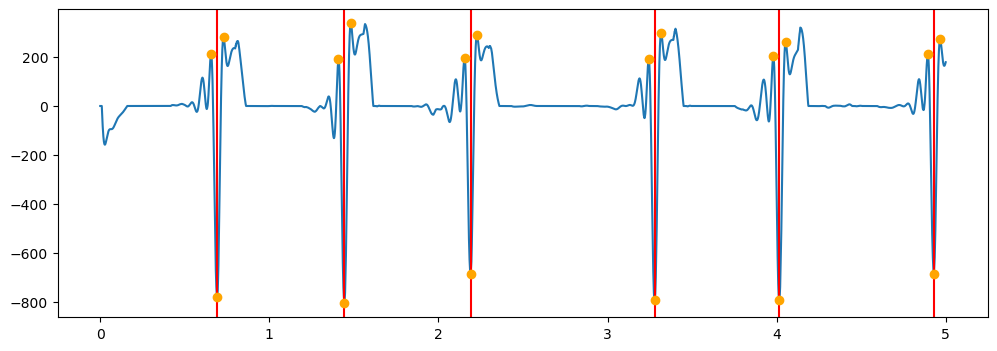

peak 1383
peak in secs 0.6915
peak 1458
peak in secs 0.729
peak 2818
peak in secs 1.409
peak 2889
peak in secs 1.4445
peak 2963
peak in secs 1.4815
peak 4310
peak in secs 2.155
peak 4380
peak in secs 2.19
peak 4455
peak in secs 2.2275
peak 6487
peak in secs 3.2435
peak 6559
peak in secs 3.2795
peak 6634
peak in secs 3.317
peak 7962
peak in secs 3.981
peak 8032
peak in secs 4.016
peak 8107
peak in secs 4.0535
peak 9788
peak in secs 4.894
peak 9858
peak in secs 4.929
peak 9934
peak in secs 4.967
patient 29
channel  11
i 0.689
i 1.4415
i 2.187
i 3.277
i 4.014
i 4.9265
peak 1306
peak in secs 0.653


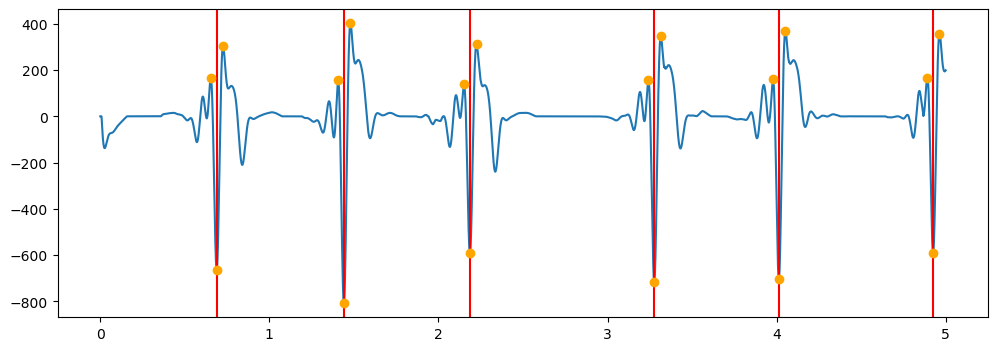

peak 1377
peak in secs 0.6885
peak 1453
peak in secs 0.7265
peak 2815
peak in secs 1.4075
peak 2882
peak in secs 1.441
peak 2959
peak in secs 1.4795
peak 4302
peak in secs 2.151
peak 4372
peak in secs 2.186
peak 4451
peak in secs 2.2255
peak 6483
peak in secs 3.2415
peak 6553
peak in secs 3.2765
peak 6630
peak in secs 3.315
peak 7958
peak in secs 3.979
peak 8026
peak in secs 4.013
peak 8104
peak in secs 4.052
peak 9784
peak in secs 4.892
peak 9851
peak in secs 4.9255
peak 9925
peak in secs 4.9625
patient 29
channel  12
i 0.687
i 1.44
i 2.1845
i 3.275
i 4.012
i 4.924
peak 1301
peak in secs 0.6505


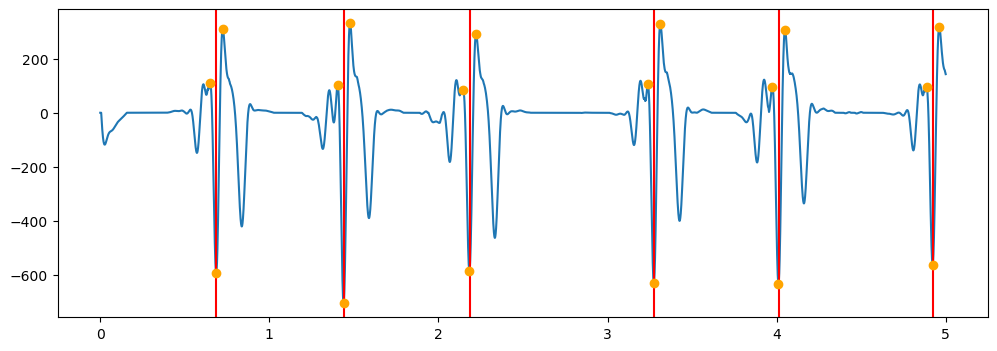

peak 1372
peak in secs 0.686
peak 1449
peak in secs 0.7245
peak 2808
peak in secs 1.404
peak 2878
peak in secs 1.439
peak 2954
peak in secs 1.477
peak 4285
peak in secs 2.1425
peak 4366
peak in secs 2.183
peak 4446
peak in secs 2.223
peak 6477
peak in secs 3.2385
peak 6548
peak in secs 3.274
peak 6625
peak in secs 3.3125
peak 7948
peak in secs 3.974
peak 8022
peak in secs 4.011
peak 8100
peak in secs 4.05
peak 9774
peak in secs 4.887
peak 9845
peak in secs 4.9225
peak 9923
peak in secs 4.9615
patient 29
channel  13
i 0.6955
i 1.448
i 2.1935
i 3.2835
i 4.0205
i 4.9325
peak 1325
peak in secs 0.6625


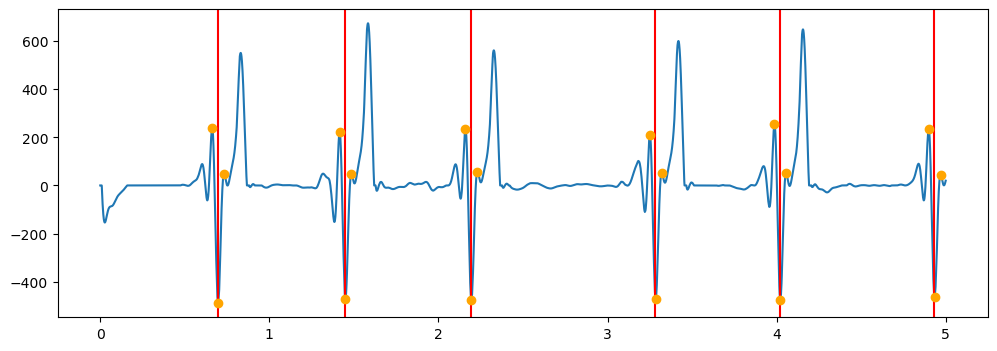

peak 1393
peak in secs 0.6965
peak 1465
peak in secs 0.7325
peak 2832
peak in secs 1.416
peak 2898
peak in secs 1.449
peak 2971
peak in secs 1.4855
peak 4320
peak in secs 2.16
peak 4389
peak in secs 2.1945
peak 4462
peak in secs 2.231
peak 6501
peak in secs 3.2505
peak 6569
peak in secs 3.2845
peak 6641
peak in secs 3.3205
peak 7975
peak in secs 3.9875
peak 8045
peak in secs 4.0225
peak 8113
peak in secs 4.0565
peak 9799
peak in secs 4.8995
peak 9869
peak in secs 4.9345
peak 9939
peak in secs 4.9695
patient 29
channel  14
i 0.692
i 1.4445
i 2.191
i 3.279
i 4.017
i 4.93
peak 1313
peak in secs 0.6565


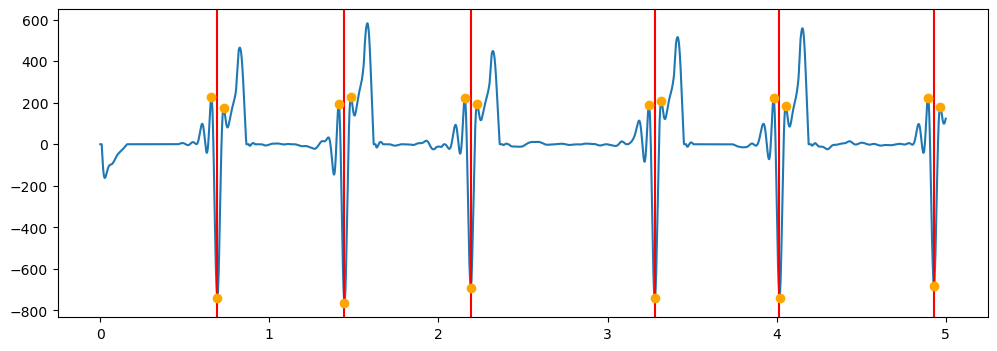

peak 1384
peak in secs 0.692
peak 1460
peak in secs 0.73
peak 2821
peak in secs 1.4105
peak 2889
peak in secs 1.4445
peak 2965
peak in secs 1.4825
peak 4311
peak in secs 2.1555
peak 4384
peak in secs 2.192
peak 4458
peak in secs 2.229
peak 6491
peak in secs 3.2455
peak 6560
peak in secs 3.28
peak 6636
peak in secs 3.318
peak 7965
peak in secs 3.9825
peak 8035
peak in secs 4.0175
peak 8108
peak in secs 4.054
peak 9791
peak in secs 4.8955
peak 9861
peak in secs 4.9305
peak 9935
peak in secs 4.9675
patient 29
channel  15
i 0.6915
i 1.444
i 2.1905
i 3.279
i 4.0165
i 4.9295
peak 1314
peak in secs 0.657


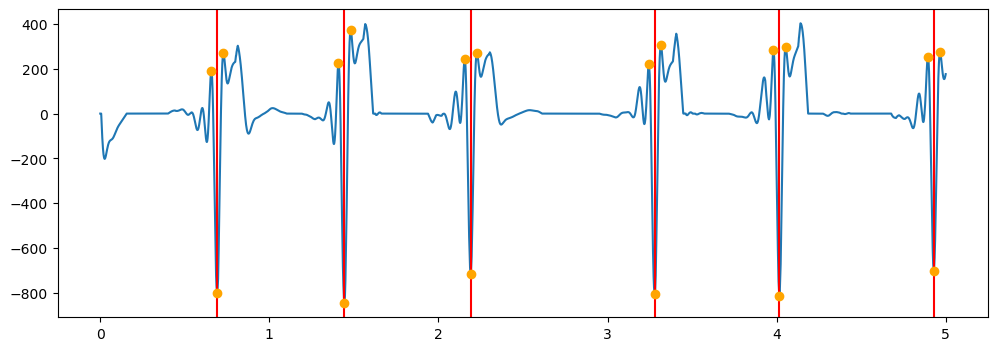

peak 1386
peak in secs 0.693
peak 1457
peak in secs 0.7285
peak 2818
peak in secs 1.409
peak 2887
peak in secs 1.4435
peak 2962
peak in secs 1.481
peak 4312
peak in secs 2.156
peak 4382
peak in secs 2.191
peak 4455
peak in secs 2.2275
peak 6488
peak in secs 3.244
peak 6557
peak in secs 3.2785
peak 6631
peak in secs 3.3155
peak 7962
peak in secs 3.981
peak 8032
peak in secs 4.016
peak 8107
peak in secs 4.0535
peak 9792
peak in secs 4.896
peak 9858
peak in secs 4.929
peak 9933
peak in secs 4.9665
patient 29
channel  16
i 0.689
i 1.441
i 2.187
i 3.277
i 4.014
i 4.9265
peak 1308
peak in secs 0.654


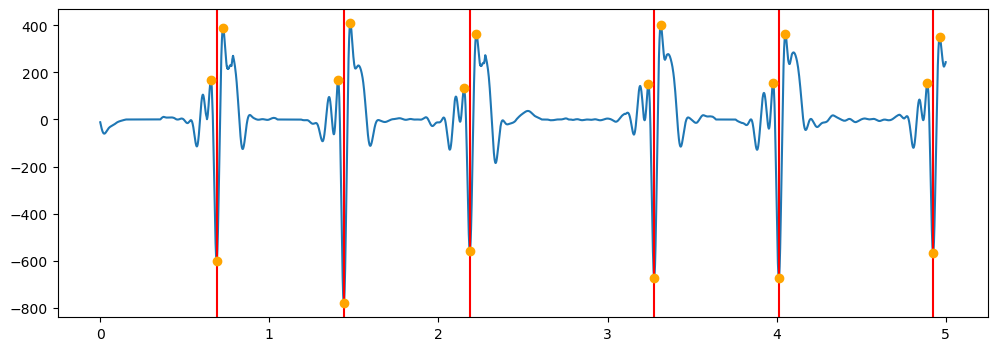

peak 1376
peak in secs 0.688
peak 1453
peak in secs 0.7265
peak 2813
peak in secs 1.4065
peak 2881
peak in secs 1.4405
peak 2958
peak in secs 1.479
peak 4303
peak in secs 2.1515
peak 4372
peak in secs 2.186
peak 4449
peak in secs 2.2245
peak 6484
peak in secs 3.242
peak 6552
peak in secs 3.276
peak 6630
peak in secs 3.315
peak 7958
peak in secs 3.979
peak 8026
peak in secs 4.013
peak 8104
peak in secs 4.052
peak 9783
peak in secs 4.8915
peak 9851
peak in secs 4.9255
peak 9929
peak in secs 4.9645
patient 29
channel  17
i 0.695
i 1.447
i 2.193
i 3.2825
i 4.0195
i 4.932
peak 1322
peak in secs 0.661


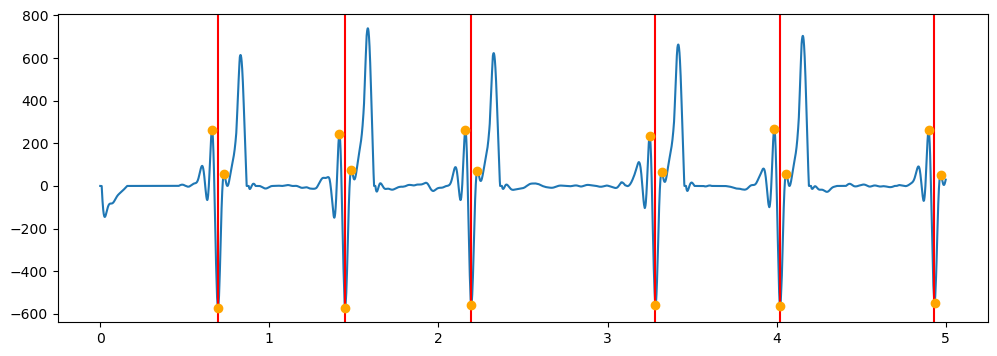

peak 1394
peak in secs 0.697
peak 1464
peak in secs 0.732
peak 2829
peak in secs 1.4145
peak 2898
peak in secs 1.449
peak 2969
peak in secs 1.4845
peak 4318
peak in secs 2.159
peak 4389
peak in secs 2.1945
peak 4461
peak in secs 2.2305
peak 6498
peak in secs 3.249
peak 6566
peak in secs 3.283
peak 6640
peak in secs 3.32
peak 7973
peak in secs 3.9865
peak 8041
peak in secs 4.0205
peak 8113
peak in secs 4.0565
peak 9797
peak in secs 4.8985
peak 9868
peak in secs 4.934
peak 9939
peak in secs 4.9695
patient 29
channel  18
i 0.693
i 1.4445
i 2.1915
i 3.2805
i 4.017
i 4.9305
peak 1316
peak in secs 0.658


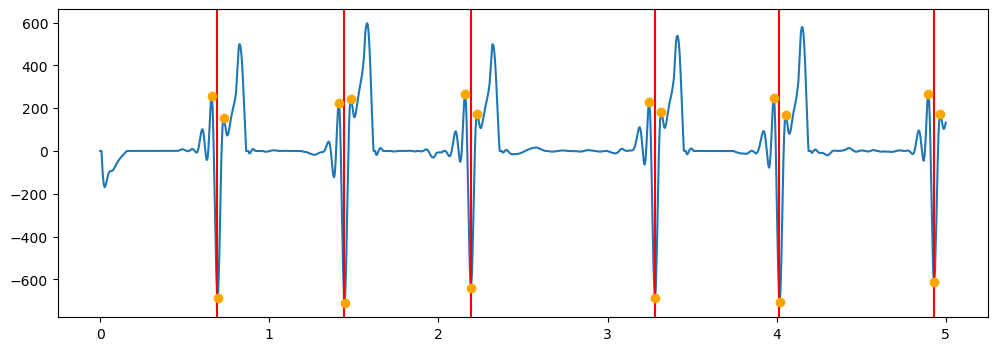

peak 1388
peak in secs 0.694
peak 1460
peak in secs 0.73
peak 2821
peak in secs 1.4105
peak 2891
peak in secs 1.4455
peak 2964
peak in secs 1.482
peak 4315
peak in secs 2.1575
peak 4384
peak in secs 2.192
peak 4458
peak in secs 2.229
peak 6491
peak in secs 3.2455
peak 6563
peak in secs 3.2815
peak 6635
peak in secs 3.3175
peak 7967
peak in secs 3.9835
peak 8037
peak in secs 4.0185
peak 8108
peak in secs 4.054
peak 9794
peak in secs 4.897
peak 9864
peak in secs 4.932
peak 9936
peak in secs 4.968
patient 29
channel  19
i 0.692
i 1.444
i 2.1905
i 3.28
i 4.017
i 4.93
peak 1314
peak in secs 0.657


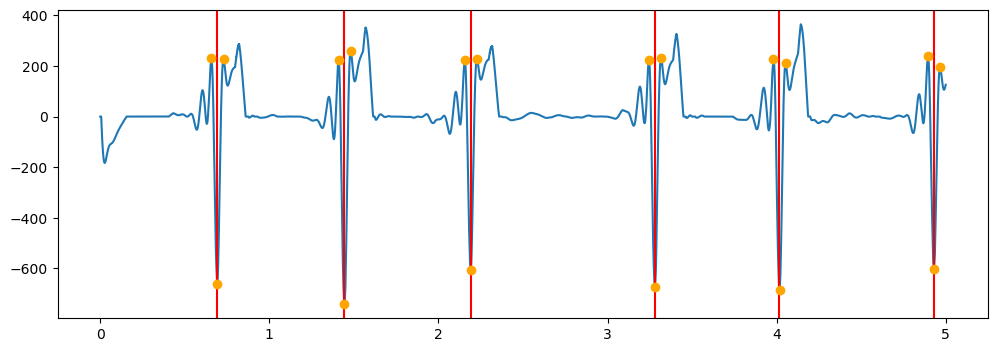

peak 1386
peak in secs 0.693
peak 1458
peak in secs 0.729
peak 2819
peak in secs 1.4095
peak 2887
peak in secs 1.4435
peak 2962
peak in secs 1.481
peak 4311
peak in secs 2.1555
peak 4382
peak in secs 2.191
peak 4456
peak in secs 2.228
peak 6489
peak in secs 3.2445
peak 6560
peak in secs 3.28
peak 6633
peak in secs 3.3165
peak 7963
peak in secs 3.9815
peak 8036
peak in secs 4.018
peak 8106
peak in secs 4.053
peak 9790
peak in secs 4.895
peak 9860
peak in secs 4.93
peak 9933
peak in secs 4.9665
patient 29
channel  2
i 0.683
i 1.4355
i 2.18
i 3.272
i 4.0085
i 4.92
peak 1289
peak in secs 0.6445


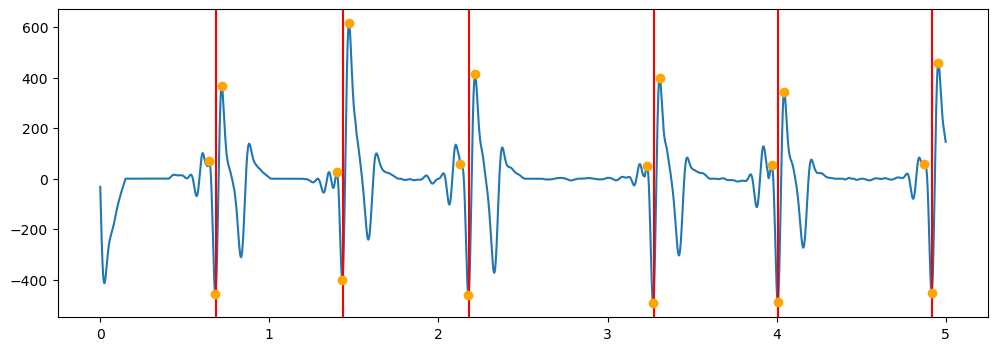

peak 1361
peak in secs 0.6805
peak 1437
peak in secs 0.7185
peak 2798
peak in secs 1.399
peak 2863
peak in secs 1.4315
peak 2942
peak in secs 1.471
peak 4261
peak in secs 2.1305
peak 4354
peak in secs 2.177
peak 4434
peak in secs 2.217
peak 6467
peak in secs 3.2335
peak 6539
peak in secs 3.2695
peak 6617
peak in secs 3.3085
peak 7942
peak in secs 3.971
peak 8013
peak in secs 4.0065
peak 8091
peak in secs 4.0455
peak 9741
peak in secs 4.8705
peak 9834
peak in secs 4.917
peak 9913
peak in secs 4.9565
patient 29
channel  3
i 0.684
i 1.4375
i 2.181
i 3.2725
i 4.009
i 4.9205
peak 1279
peak in secs 0.6395


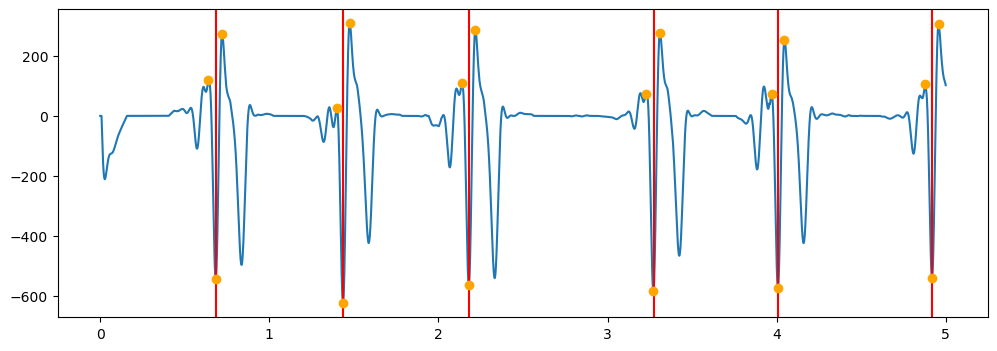

peak 1365
peak in secs 0.6825
peak 1443
peak in secs 0.7215
peak 2799
peak in secs 1.3995
peak 2871
peak in secs 1.4355
peak 2952
peak in secs 1.476
peak 4277
peak in secs 2.1385
peak 4359
peak in secs 2.1795
peak 4435
peak in secs 2.2175
peak 6455
peak in secs 3.2275
peak 6542
peak in secs 3.271
peak 6621
peak in secs 3.3105
peak 7941
peak in secs 3.9705
peak 8016
peak in secs 4.008
peak 8091
peak in secs 4.0455
peak 9757
peak in secs 4.8785
peak 9838
peak in secs 4.919
peak 9917
peak in secs 4.9585
patient 29
channel  4
i 0.2635
i 0.691
i 1.446
i 2.1895
i 3.2795
i 4.0165
peak 1315
peak in secs 0.6575


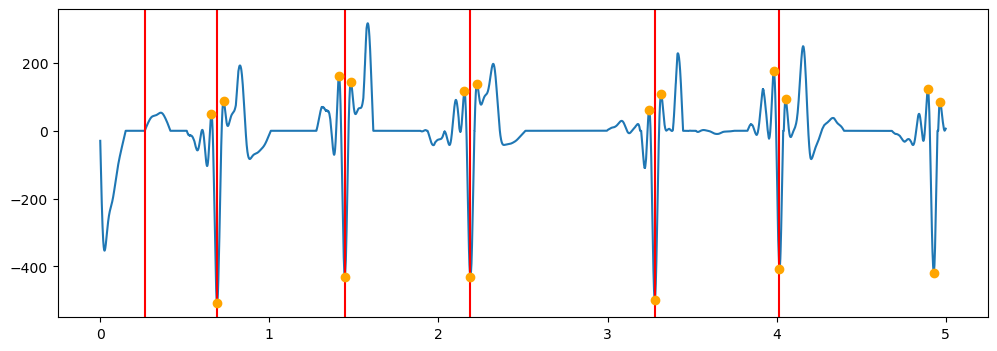

peak 1382
peak in secs 0.691
peak 1459
peak in secs 0.7295
peak 2825
peak in secs 1.4125
peak 2892
peak in secs 1.446
peak 2964
peak in secs 1.482
peak 4308
peak in secs 2.154
peak 4379
peak in secs 2.1895
peak 4456
peak in secs 2.228
peak 6494
peak in secs 3.247
peak 6559
peak in secs 3.2795
peak 6633
peak in secs 3.3165
peak 7967
peak in secs 3.9835
peak 8034
peak in secs 4.017
peak 8107
peak in secs 4.0535
peak 9789
peak in secs 4.8945
peak 9857
peak in secs 4.9285
peak 9934
peak in secs 4.967
patient 29
channel  5
i 0.69
i 1.442
i 2.1875
i 3.2775
i 4.0145
i 4.9275
peak 1308
peak in secs 0.654


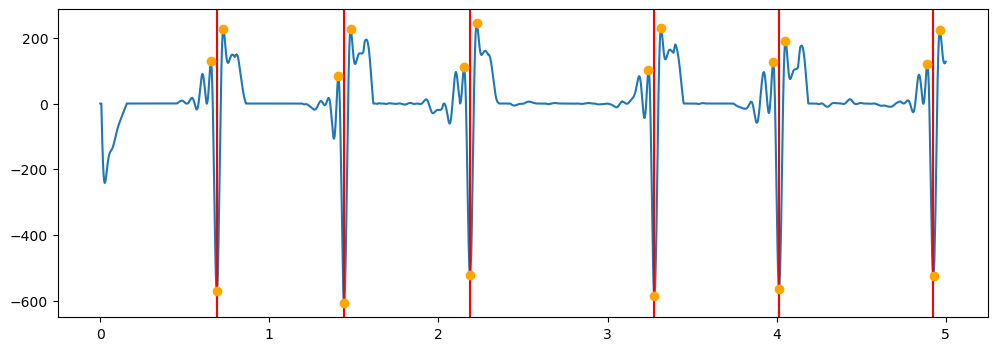

peak 1378
peak in secs 0.689
peak 1457
peak in secs 0.7285
peak 2817
peak in secs 1.4085
peak 2884
peak in secs 1.442
peak 2962
peak in secs 1.481
peak 4303
peak in secs 2.1515
peak 4373
peak in secs 2.1865
peak 4453
peak in secs 2.2265
peak 6484
peak in secs 3.242
peak 6554
peak in secs 3.277
peak 6633
peak in secs 3.3165
peak 7959
peak in secs 3.9795
peak 8028
peak in secs 4.014
peak 8105
peak in secs 4.0525
peak 9783
peak in secs 4.8915
peak 9856
peak in secs 4.928
peak 9931
peak in secs 4.9655
patient 29
channel  6
i 0.689
i 1.4415
i 2.1865
i 3.2765
i 4.0135
i 4.926
peak 1306
peak in secs 0.653


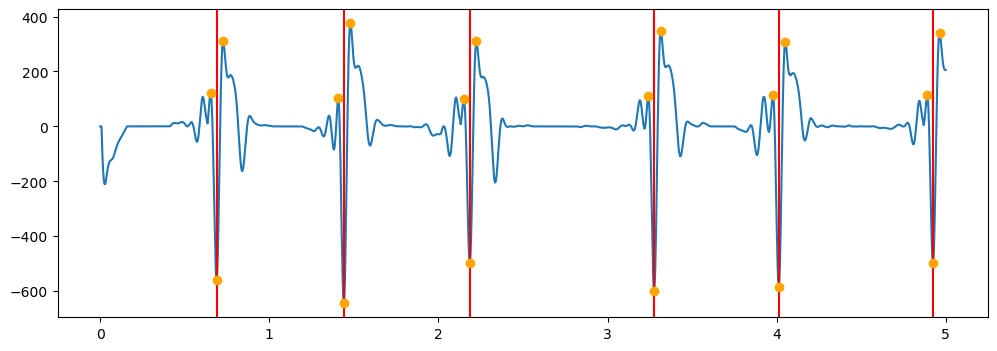

peak 1376
peak in secs 0.688
peak 1453
peak in secs 0.7265
peak 2815
peak in secs 1.4075
peak 2881
peak in secs 1.4405
peak 2959
peak in secs 1.4795
peak 4300
peak in secs 2.15
peak 4371
peak in secs 2.1855
peak 4449
peak in secs 2.2245
peak 6482
peak in secs 3.241
peak 6551
peak in secs 3.2755
peak 6630
peak in secs 3.315
peak 7957
peak in secs 3.9785
peak 8025
peak in secs 4.0125
peak 8103
peak in secs 4.0515
peak 9780
peak in secs 4.89
peak 9849
peak in secs 4.9245
peak 9929
peak in secs 4.9645
patient 29
channel  7
i 0.6845
i 1.438
i 2.182
i 3.273
i 4.0095
i 4.9215
peak 1292
peak in secs 0.646


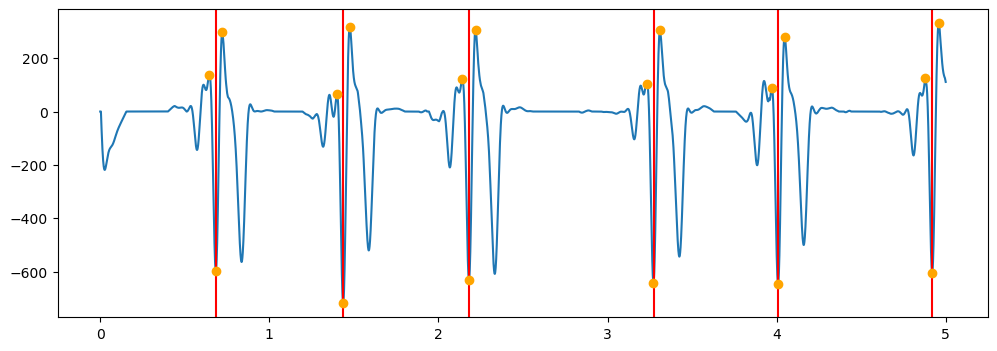

peak 1367
peak in secs 0.6835
peak 1442
peak in secs 0.721
peak 2801
peak in secs 1.4005
peak 2874
peak in secs 1.437
peak 2952
peak in secs 1.476
peak 4279
peak in secs 2.1395
peak 4361
peak in secs 2.1805
peak 4441
peak in secs 2.2205
peak 6469
peak in secs 3.2345
peak 6543
peak in secs 3.2715
peak 6620
peak in secs 3.31
peak 7943
peak in secs 3.9715
peak 8017
peak in secs 4.0085
peak 8095
peak in secs 4.0475
peak 9758
peak in secs 4.879
peak 9840
peak in secs 4.92
peak 9917
peak in secs 4.9585
patient 29
channel  8
i 0.695
i 1.448
i 2.1925
i 3.283
i 4.02
i 4.932
peak 1322
peak in secs 0.661


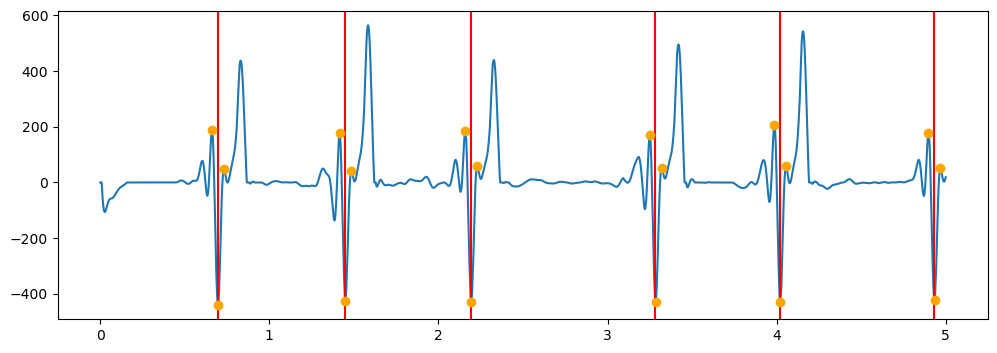

peak 1394
peak in secs 0.697
peak 1464
peak in secs 0.732
peak 2831
peak in secs 1.4155
peak 2899
peak in secs 1.4495
peak 2970
peak in secs 1.485
peak 4317
peak in secs 2.1585
peak 4388
peak in secs 2.194
peak 4460
peak in secs 2.23
peak 6500
peak in secs 3.25
peak 6570
peak in secs 3.285
peak 6641
peak in secs 3.3205
peak 7973
peak in secs 3.9865
peak 8043
peak in secs 4.0215
peak 8111
peak in secs 4.0555
peak 9796
peak in secs 4.898
peak 9868
peak in secs 4.934
peak 9938
peak in secs 4.969
patient 29
channel  9
i 0.693
i 1.446
i 2.1915
i 3.2805
i 4.018
i 4.9305
peak 1316
peak in secs 0.658


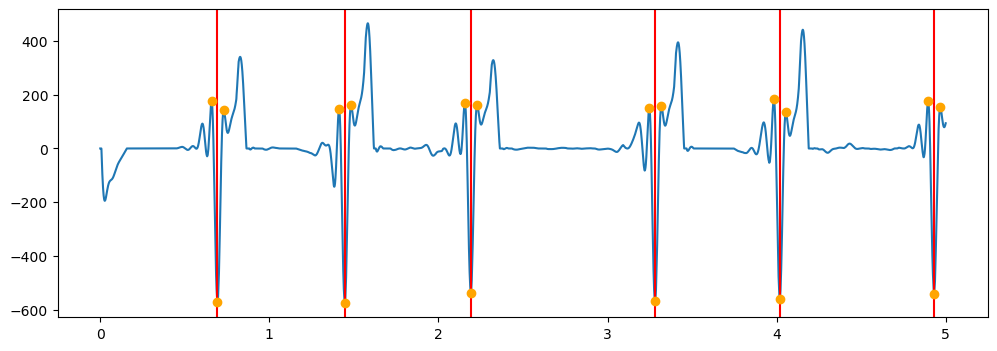

peak 1386
peak in secs 0.693
peak 1461
peak in secs 0.7305
peak 2825
peak in secs 1.4125
peak 2892
peak in secs 1.446
peak 2967
peak in secs 1.4835
peak 4312
peak in secs 2.156
peak 4384
peak in secs 2.192
peak 4458
peak in secs 2.229
peak 6494
peak in secs 3.247
peak 6563
peak in secs 3.2815
peak 6638
peak in secs 3.319
peak 7967
peak in secs 3.9835
peak 8039
peak in secs 4.0195
peak 8110
peak in secs 4.055
peak 9793
peak in secs 4.8965
peak 9864
peak in secs 4.932
peak 9936
peak in secs 4.968


In [ ]:
thirdof3peaks_per_channel = {}
all3peaks_per_channel = {}
    #all_chs_peaks = []
for ch in rMP.preprocessed_data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    print('channel ', ch)
#peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=4000,verbose=False)
    ch_third_peaks = []
    ch_all_three_peaks = []
    for peak_peaksch in peaks_per_channel[ch]:
        signal_segment = rMP.preprocessed_data[ch][0:60].values
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=100) # peaks_per_channel[ch][0]
        #print('3 tallest_peaks', three_tallest_peaks)
        #for peak in three_tallest_peaks:
        #    plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o')
        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)
            #num_valid
            #plt.show()
    thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)

plotTraces(rMP, peaks_per_channel, all3peaks_per_channel, patient)

In [66]:
for i in range(3):
    # finding surrounding peaks with the significant peak at the centre of the serach window
    thirdof3peaks_per_channel = {}
    all3peaks_per_channel = {}
        #all_chs_peaks = []
    for ch in rMP.preprocessed_data.columns:
        #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
        
        print('channel ', ch)
    #peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=4000,verbose=False)
        ch_third_peaks = []
        ch_all_three_peaks = []
        for peak_peaksch in peaks_per_channel[ch]:
            signal_segment = rMP.preprocessed_data[ch][0:60].values
            three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=350) # peaks_per_channel[ch][0]
            #print('3 tallest_peaks', three_tallest_peaks)
            #for peak in three_tallest_peaks:
            #    plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o')
            if three_tallest_peaks is not None:
                ch_third_peaks.append(three_tallest_peaks[i])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
                ch_all_three_peaks += list(three_tallest_peaks)
                #num_valid
                #plt.show()
        thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
        all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)

    excel_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/P'+str(patient)+'_'+str(i+1)+'.xlsx'

    fun2(rMP, stg, thirdof3peaks_per_channel, excel_pth, patient)


channel  1
channel  10
channel  11
less than 3 peaks found
channel  12
channel  13
channel  14
channel  15
channel  16
less than 3 peaks found
less than 3 peaks found
channel  17
less than 3 peaks found
channel  18
channel  19
channel  2
channel  3
channel  4
channel  5
channel  6
channel  7
channel  8
channel  9
ch, channel_peaks 10 [  1207   3204   4695   5649   6453   7217   8416   9211  10939  12819
  13704  14946  16148  17747  18632  20170  21632  22530  23321  24037
  24811  25685  27291  28080  29570  31296  32683  33739  35060  36420
  37028  38457  39461  41352  43211  44085  44723  45380  47414  49442
  50322  52019  52925  53987  55844  56723  58061  59660  61420  62583
  63466  64328  66264  67933  68827  70110  71669  73320  74240  75086
  76734  78669  79644  80584  82415  84073  85057  85908  87470  89262
  90148  91230  92943  94285  95209  96867  98413  99595 100455 101593
 103548 104468 105395 107233 108974 109868 110691 112460 114354 115261
 116657 118385 119425]
ch

### Removing outliers (using STD or IQD) from the delays feature matrix

In [29]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from mlxtend.plotting import plot_pca_correlation_graph

readpath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'

cleaned_data = []

df = pd.read_excel(io=readpath)
# checking shape
#print('Original Dataframe shape :',df.shape)

for i in range(len(df)):
    specific_row = np.array(df.drop('stage',axis=1).drop('patient',axis=1).iloc[i])
    print(specific_row)

    q1 = np.quantile(specific_row, .25)
    q2 = np.quantile(specific_row, .5)
    q3 = np.quantile(specific_row, .75)

    iqr = q3 - q1
    quartile_deviation = (iqr) / 2

    #print("Interquartile Range (IQR):", iqr)
    print("Quartile Deviation:", quartile_deviation)
    lower_bndry, upper_bndry = q2 - 3*quartile_deviation, q2 + 3*quartile_deviation
    print(lower_bndry, upper_bndry)
    """ for i in range(len(df)):
        specific_row = df.iloc[1]
        print(specific_row)

    for index, data in df.iterrows():
        print(data)#['Delay_ch11']) """

    update = np.where(np.logical_or(specific_row <= lower_bndry, specific_row >= upper_bndry), "", specific_row)

    print(update)
    cleaned_data.append(update)


[ 8 -1 -2  4  9  1 -2  9  2 -4 -4  0  2  8  1 -6  2  2]
Quartile Deviation: 2.625
-6.375 9.375
['8' '-1' '-2' '4' '9' '1' '-2' '9' '2' '-4' '-4' '0' '2' '8' '1' '-6' '2'
 '2']
[ 0 -2  1  6  5  1 -2 -7  7 -2  0  1  0  1 -1 -1  5  5]
Quartile Deviation: 2.5
-7.0 8.0
['0' '-2' '1' '6' '5' '1' '-2' '' '7' '-2' '0' '1' '0' '1' '-1' '-1' '5'
 '5']
[ 7 -1  0  3  7 -1 -1 15  8  1 -3  0  3  3  2 -1  7  5]
Quartile Deviation: 3.625
-8.375 13.375
['7' '-1' '0' '3' '7' '-1' '-1' '' '8' '1' '-3' '0' '3' '3' '2' '-1' '7'
 '5']
[ 5  0 -1  3 10  5 -1  5 10  6  4  1  1  1 -1  0  6  8]
Quartile Deviation: 2.75
-4.75 11.75
['5' '0' '-1' '3' '10' '5' '-1' '5' '10' '6' '4' '1' '1' '1' '-1' '0' '6'
 '8']
[-2 11  8  7  3  3 15  2  9  8 -1  1  2  0 -1 -2  2  4]
Quartile Deviation: 3.75
-8.75 13.75
['-2' '11' '8' '7' '3' '3' '' '2' '9' '8' '-1' '1' '2' '0' '-1' '-2' '2'
 '4']
[-2 -1 -2  2  0 -4 -1  0  1 -4 -1  1  0  0 -2 -1  3  0]
Quartile Deviation: 0.875
-3.125 2.125
['-2' '-1' '-2' '2' '0' '' '-1' '0' '1' '

In [ ]:
writepath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000_clean.xlsx'

clean_df = pd.DataFrame(cleaned_data)

cols_labels = []
for ch in range(2,20):
    cols_labels += [f'Delay_ch{ch}']

clean_df.columns = cols_labels
clean_df['stage'] = df['stage']
clean_df['patient'] = df['patient']

print(clean_df)

try:
    existing_df = pd.read_excel(writepath)
    # Append the new data to the existing data
    combined_df = pd.concat([existing_df,clean_df],ignore_index=True)
except FileNotFoundError:
    # If the file doesn't exist, just use the new data
    combined_df = clean_df

# Write the combined data back to the Excel file
with pd.ExcelWriter(writepath,mode='w',engine='openpyxl') as writer:
    combined_df.to_excel(writer,index=False)
    print('put into excel') 

    Delay_ch2 Delay_ch3 Delay_ch4 Delay_ch5 Delay_ch6 Delay_ch7 Delay_ch8  \
0           8        -1        -2         4         9         1        -2   
1           0        -2         1         6         5         1        -2   
2           7        -1         0         3         7        -1        -1   
3           5         0        -1         3        10         5        -1   
4          -2        11         8         7         3         3             
..        ...       ...       ...       ...       ...       ...       ...   
310        -1        -3        -4         3         1        -1        -2   
311        -2        -2        -2                   0        -2        -3   
312        -2         0        -4                   1         0         1   
313        -2         0        -5                   1         1         5   
314        -1        -2        -3                   1        -1        -1   

    Delay_ch9 Delay_ch10 Delay_ch11 Delay_ch12 Delay_ch13 Delay_ch14  \
0  

### Plotting and comparing delay magnitudes

In [37]:
def writeDFtoExcel(save_pth, df):
    try:
        existing_df = pd.read_excel(save_pth)
        # Append the new data to the existing data
        combined_df = pd.concat([existing_df,df],ignore_index=True)
    except FileNotFoundError:
        # If the file doesn't exist, just use the new data
        combined_df = df

    # Write the combined data back to the Excel file
    with pd.ExcelWriter(save_pth,mode='w',engine='openpyxl') as writer:
        combined_df.to_excel(writer,index=False)
        print('put into excel') 

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.preprocessing import StandardScaler
from mlxtend.plotting import plot_pca_correlation_graph
from scipy import stats as st

readpath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/hfd/hfd.xlsx'
save_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/hfd/hfd_MEDIANS.xlsx'

df = pd.read_excel(io=readpath)

patient = [18,19,21,22,23,24,25,26]

for p in patient:

    df_p = df.query(f"patient == {p}")

    p_dict = {}
    
    df_p_chs_only = df_p.drop('stage',axis=1).drop('patient',axis=1).drop('search_window', axis=1)

    for col in df_p_chs_only.columns:

        print(col)

        df_p_ch =df_p.drop('stage',axis=1).drop('patient',axis=1).drop('search_window', axis=1)

        #col = 'Delay_ch10'

        arry = np.array(df_p_ch[col])

        #print(arry)

        medin = np.median(arry)

        print(medin)

        p_dict[col] = [medin]

        #print(p_dict)

    p_dict['stage'] = df_p['stage'].iloc[0]
    p_dict['patient'] = df_p['patient'].iloc[0]
    
    dataf = pd.DataFrame(p_dict)

    print(dataf)

    writeDFtoExcel(save_pth, dataf)

fd_10
1.03463229410605
fd_11
1.032570746628614
fd_12
1.037161817067723
fd_13
1.030766472525738
fd_14
1.033961568873468
fd_15
1.034872840456447
fd_16
1.036545471668468
fd_17
1.030041282668345
fd_18
1.030870890983405
fd_19
1.03514666125052
fd_2
1.038510078329994
fd_3
1.040681898993171
fd_4
1.035238800264131
fd_5
1.0349485537071
fd_6
1.035662705954669
fd_7
1.042721105093423
fd_8
1.033932662268468
fd_9
1.034809805382263
      fd_10     fd_11     fd_12     fd_13     fd_14     fd_15     fd_16  \
0  1.034632  1.032571  1.037162  1.030766  1.033962  1.034873  1.036545   

      fd_17     fd_18     fd_19     fd_2      fd_3      fd_4      fd_5  \
0  1.030041  1.030871  1.035147  1.03851  1.040682  1.035239  1.034949   

       fd_6      fd_7      fd_8     fd_9 stage  patient  
0  1.035663  1.042721  1.033933  1.03481    B2       18  
put into excel
fd_10
1.0324617816658415
fd_11
1.0260234323700423
fd_12
1.0365338041714116
fd_13
1.034702409350522
fd_14
1.031281142765251
fd_15
1.0249945613580569
f

#### Plotting according to stage

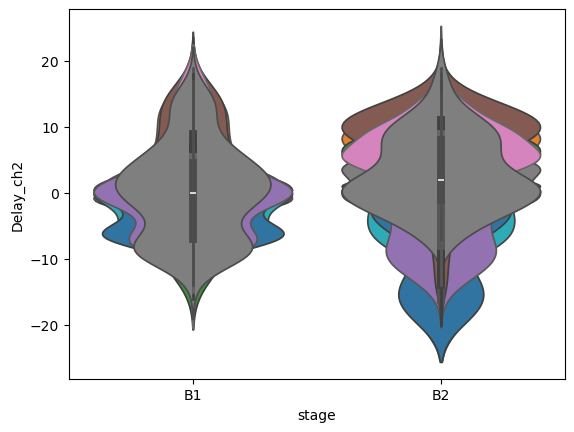

In [ ]:
# Scatter plot using pandas 
#ax = df.plot(kind='scatter', x='stage', y='Delay_ch10', title='ScatterPlot')

import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

# Create the violin plot
#sns.violinplot(x='patient', y='Delay_ch10', data=df)
#sns.violinplot(x='stage', y='Delay_ch10', data=df)

# Display the plot
plt.show()

for label in cols_labels:
    sns.violinplot(x='stage', y=label, data=df)




In [ ]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import os, glob, re

# Define read directory
# readpath = r'C:\Users\Ruben\OneDrive - University of Cambridge\PhD\BSPM_for_ECGi\Publications\Wireless 3D Stacking of High Density E-textile Eutectogel Electrode Arrays for Cutaneous Electrophysiology\Experiments\INTAN\Data\ECG_classification'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs4000.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/threePC_Delays.xlsx'
readpath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/medianPerPatient.xlsx'
#plotSpiderplotExpress2(datapath, 21)

#plotSpiderplotExpress2(datapath, )

patients = [18,19,21,22,23,24,25,26]

fig = go.Figure()

for patientnum in patients:
    #plotSpiderplotExpress2(datapath, p)

    df = pd.read_excel(io=readpath)

    df_patient = df.query(f"patient == {patientnum}")

    index_column = df_patient['stage']
    #print('index_column', index_column)
    value_columns = df_patient.drop('stage',axis=1).drop('patient',axis=1) #= [("Delay_ch"+str(ch)) for ch in rMP.preprocessed_data.columns[1:]]
    #print('value_columns', value_columns)
    df_filtered = df_patient.drop('patient',axis=1)#.drop('patient',axis=1)# pd.concat((index_column, value_columns))
    print('df_filtered', df_filtered)
    
    chs = value_columns.columns[1:]
    #print('chs!!!', chs)

    #color_scale = px.colors.qualitative.Set1  # Choose a color scheme
    #category_colors = {cat: color_scale[i % len(color_scale)] for i, cat in enumerate(df["stage"])}

    for index, row in df_filtered.iterrows():
        #print('index!!!', index)

        #print('row!!!', row)

        fig.add_trace(go.Scatterpolar(
            r=row[chs].values,  # Metric values
            theta=chs,          # Metric labels
            mode="lines",        # Line plot
            name=row["stage"]#,    patient, stage # Row label
            #line=dict(color=category_colors[row["stage"]])
            ))

    fig.update_layout(
    title='Median delay per patient',
    polar=dict(radialaxis=dict(visible=True)),
    showlegend=True
    )
    
fig.show()

df_filtered    Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch13  Delay_ch14  Delay_ch15  \
0        -1.0         0.0        -3.0         9.0         6.0         2.0   

   Delay_ch16  Delay_ch17  Delay_ch18  Delay_ch19  Delay_ch2  Delay_ch3  \
0         2.0        11.0           8         4.0       -3.0         -3   

   Delay_ch4  Delay_ch5  Delay_ch6  Delay_ch7  Delay_ch8  Delay_ch9 stage  
0          1          0          5       -5.0          6        2.0    B2  
df_filtered    Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch13  Delay_ch14  Delay_ch15  \
1         1.0         0.0         0.0         2.0         2.5         1.0   

   Delay_ch16  Delay_ch17  Delay_ch18  Delay_ch19  Delay_ch2  Delay_ch3  \
1         0.0         3.0           2         1.0       -1.0          1   

   Delay_ch4  Delay_ch5  Delay_ch6  Delay_ch7  Delay_ch8  Delay_ch9 stage  
1          1          1         -1       -1.0          1        2.0    B1  
df_filtered    Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch1

In [61]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import os, glob, re

# Define read directory
# readpath = r'C:\Users\Ruben\OneDrive - University of Cambridge\PhD\BSPM_for_ECGi\Publications\Wireless 3D Stacking of High Density E-textile Eutectogel Electrode Arrays for Cutaneous Electrophysiology\Experiments\INTAN\Data\ECG_classification'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs4000.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/threePC_Delays.xlsx'
readpath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/medianPerPatient.xlsx'
#plotSpiderplotExpress2(datapath, 21)

#plotSpiderplotExpress2(datapath, )

patients = [18,19,21,22,23,24,25,26]

fig = go.Figure()

for patientnum in patients:
    #plotSpiderplotExpress2(datapath, p)

    df = pd.read_excel(io=readpath)

    df_patient = df.query(f"patient == {patientnum}")

    index_column = df_patient['stage']
    #print('index_column', index_column)
    value_columns = df_patient.drop('stage',axis=1).drop('patient',axis=1) #= [("Delay_ch"+str(ch)) for ch in rMP.preprocessed_data.columns[1:]]
    #print('value_columns', value_columns)
    df_filtered = df_patient.drop('stage',axis=1)#.drop('patient',axis=1)# pd.concat((index_column, value_columns))
    print('df_filtered', df_filtered)
    
    chs = value_columns.columns[1:]
    #print('chs!!!', chs)

    #color_scale = px.colors.qualitative.Set1  # Choose a color scheme
    #category_colors = {cat: color_scale[i % len(color_scale)] for i, cat in enumerate(df["stage"])}

    for index, row in df_patient.iterrows():
        #print('index!!!', index)

        #print('row!!!', row)

        fig.add_trace(go.Scatterpolar(
            r=row[chs].values,  # Metric values
            theta=chs,          # Metric labels
            mode="lines",        # Line plot
            name=(str(row["patient"],'',row["stage"])),#,    patient, stage # Row label
            #line=dict(color=category_colors[row["stage"]])
            ))

    fig.update_layout(
    title='Median delay per patient',
    polar=dict(radialaxis=dict(visible=True)),
    showlegend=True
    )
    
fig.show()

df_filtered    Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch13  Delay_ch14  Delay_ch15  \
0        -1.0         0.0        -3.0         9.0         6.0         2.0   

   Delay_ch16  Delay_ch17  Delay_ch18  Delay_ch19  Delay_ch2  Delay_ch3  \
0         2.0        11.0           8         4.0       -3.0         -3   

   Delay_ch4  Delay_ch5  Delay_ch6  Delay_ch7  Delay_ch8  Delay_ch9  patient  
0          1          0          5       -5.0          6        2.0       18  


TypeError: decoding to str: need a bytes-like object, int found

### Adding 2 columns for these 2 features to existing feature matrix:  IQD and STD

In [ ]:
import pandas as pd
import numpy as np
from statistics import stdev

readpath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'

iqd_list = []
std_list = []

df = pd.read_excel(io=readpath)
# checking shape
#print('Original Dataframe shape :',df.shape)

for i in range(len(df)):
    specific_row = np.array(df.drop('stage',axis=1).drop('patient',axis=1).iloc[i])
    #print(list(specific_row))
    q1 = np.quantile(specific_row, .25)
    q3 = np.quantile(specific_row, .75)
    iqr = q3 - q1
    iqd = (iqr) / 2
    iqd_list.append(iqd)

    #std = stdev([int(x) for x in specific_row])
    std = np.std(specific_row, ddof=1)
    std_list.append(std)

    print('std', std)
    print('iqr', iqr)

df['IQD'] = iqd_list
df['STD'] = std_list
print(df)

std 4.565070566929469
iqr 5.25
std 3.5225696206073973
iqr 5.0
std 4.498365716307097
iqr 7.25
std 3.665775292722131
iqr 5.5
std 4.829444006484049
iqr 7.5
std 1.8194662723831596
iqr 1.75
std 3.116475300825212
iqr 5.5
std 1.4473324572571655
iqr 2.0
std 4.617740725913995
iqr 2.0
std 3.399826985217301
iqr 2.75
std 3.9539836782799913
iqr 8.0
std 3.529520695486751
iqr 5.5
std 2.4924723269584352
iqr 3.0
std 4.849364893393881
iqr 6.0
std 4.853743249226494
iqr 6.75
std 5.370276462254597
iqr 2.75
std 3.884357771127377
iqr 4.5
std 4.925590107641595
iqr 4.75
std 1.2153699778283713
iqr 1.0
std 4.2183074386605375
iqr 7.5
std 1.8113657144911368
iqr 1.75
std 2.0902825277343813
iqr 1.75
std 4.138137625373997
iqr 7.0
std 2.9950940277884635
iqr 3.0
std 3.114901985470003
iqr 5.75
std 1.7083034430670598
iqr 1.0
std 3.2804630631203167
iqr 1.0
std 1.4095843729891318
iqr 2.0
std 2.6346112560657287
iqr 1.75
std 3.675123936374448
iqr 2.0
std 1.903728711380891
iqr 1.0
std 3.1107025875572374
iqr 3.0
std 3.87256142

In [ ]:
writepath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000_std_iqr.xlsx'

# Write the combined data back to the Excel file
with pd.ExcelWriter(writepath,mode='w',engine='openpyxl') as writer:
    df.to_excel(writer,index=False)
    print('put into excel') 

put into excel


### Hypothesis Test

#### Hypothesis test to check whether the delays of a single patient is consistent – testing to check if the delays found using peak 1 vs peak 2 vs peak 3 are significantly different different

In [7]:
from scipy.stats import kruskal, f_oneway, friedmanchisquare

def hypothesisTest(len_df):
	same = 0
	different = 0

	for idx in range(len_df):
	#three_paths = []
		same_row = []
		for i in range(3):
			#print(i+1)
			excel_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/P19_'+str(i+1)+'.xlsx'
			#three_paths.append(excel_pth)

			df = pd.read_excel(excel_pth).drop('stage',axis=1).drop('patient',axis=1)
			row = df.iloc[idx] # first row of the df
			#print(np.array(row))
			same_row.append(np.array(row))
			
		#print(three_paths)
		print(same_row)

		data1 = same_row[0]
		data2 = same_row[1]
		data3 = same_row[2]

		# The Kruskal-Wallis H-test tests the null hypothesis that the population median of all of the groups are equal.
		statistic, pvalue = kruskal(data1, data2, data3)
		#statistic, pvalue = f_oneway(data1, data2, data3)
		#statistic, pvalue = friedmanchisquare(data1, data2, data3)
		#print('stat=%.3f, p=%.3f' % (statistic, pvalue))
		if pvalue > 0.15:
			#print('Probably the same distribution')
			same +=1
		else:
			#print('Probably different distributions')
			different +=1


	print('it is the same distribution: for', same, 'rows, which is ', same/len_df*100, '%')


excel_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/delays/delays_SCALEDPERPATIENT.xlsx'
df = pd.read_excel(excel_pth).drop('stage',axis=1).drop('patient',axis=1).drop('search_window',axis=1)
print(len(df))
hypothesisTest(len_df = len(df))

558


FileNotFoundError: [Errno 2] No such file or directory: '/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/P19_1.xlsx'

#### Hypothesis test to check whether the median magnitude of is significantly different between B1 and B2 patients - we consider channel by channel (i.e., column by column from the feature matrix)

for example, we check is ch2 for B1 patients is significantly different to ch2 for B2 patients

In [7]:
from scipy.stats import kruskal, f_oneway, friedmanchisquare, median_test
import pandas as pd

alphas = [0.05, 0.01] # 0.05, 

def compare_medians(sample1, sample2, alpha):
    global same
    global different
    _, p, gmedian, contig_table = median_test(sample1, sample2, ties='below')
    #print('medianB1', np.median(sample1))
    #print('medianB2', np.median(sample2))
    if p > alpha:
        same += 1
        #print('same')
        #print(p)
        #print('grandmedian',gmedian)
        return "Medians are similar (fail to reject H0)", contig_table
    else:
        #print('different')
        #print(p)
        #print('grandmedian',gmedian)
        different += 1
        return "Medians differ (reject H0)", contig_table
    

for a in alphas:

    print(f"\nAlpha: {a}")

    #datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/amps/amps_SCALEDPERPATIENT_GRADMAG.xlsx'
    #datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/hfd/hfd.xlsx'
    #datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/amps/amps_SCALEDPERPATIENT_GRADMAG.xlsx'
    datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_GRADANGLE_STANDARDISED.xlsx'#V2-V3/delays/delays_SCALEDPERPATIENT_GRADANGLE.xlsx'
    
    df = pd.read_excel(io=datapath)
            
    df = df.drop('patient', axis = 1).drop('search_window', axis = 1)

    df_B1 = df.query('stage == "B1"')
    df_B2 = df.query('stage == "B2"')

    df_B1 = df_B1.drop('stage',axis=1)
    df_B2 = df_B2.drop('stage',axis=1)
    df = df.drop('stage',axis=1)
    #print(df.columns)
    #print(df_B1.columns)

    same = 0
    different = 0

    for col in df.columns:
        #print(col)
        result, contig_table = compare_medians(np.array(df_B1[col]), np.array(df_B2[col]), a)
        #print(result)

    print(f"\nResults:")
    print(f"- Same median: {same} columns")
    print(f"- Different median: {different} columns")
    print('it is the same distribution: for', same, 'cols, which is ', same/(same+different)*100, '%') 



""" 
The contingency table. The shape of the table is (2, n), where n is the number of samples. 
The first row holds the counts of the values above the grand median, and the second row 
holds the counts of the values below the grand median. 
"""



Alpha: 0.05

Results:
- Same median: 5 columns
- Different median: 14 columns
it is the same distribution: for 5 cols, which is  26.31578947368421 %

Alpha: 0.01

Results:
- Same median: 6 columns
- Different median: 13 columns
it is the same distribution: for 6 cols, which is  31.57894736842105 %


' \nThe contingency table. The shape of the table is (2, n), where n is the number of samples. \nThe first row holds the counts of the values above the grand median, and the second row \nholds the counts of the values below the grand median. \n'

In [58]:
print(df_B1['fd_10'])
#print(np.array(df_B1['fd_10']))
print(np.median(np.array(df_B1['fd_10'])))

187    1.037720
188    1.037439
189    1.030614
190    1.038452
191    1.028806
         ...   
463    1.024815
464    1.030454
465    1.038087
466    1.028647
467    1.030017
Name: fd_10, Length: 174, dtype: float64
1.0350990425234836


#### Different hypothesis test which gets similar resutls as above?

In [62]:
# Run median test
from scipy.stats import median_test
addon ='all_fs2000SW100and350_SCALEDPERPATIENT.xlsx'#'all_fs2000GRADANGLE.xlsx'] #'all_fs2000GRADANGLE_SCALEDPERPATIENT.xlsx']#

datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/hfd/hfd.xlsx'
df = pd.read_excel(io=datapath) 
same = 0
different = 0

df = df.drop('patient', axis = 1).drop('search_window', axis =1)
#print(df.columns)

df_B1 = df.query('stage == "B1"')
df_B2 = df.query('stage == "B2"')

df_B1 = df_B1.drop('stage',axis=1)
df_B2 = df_B2.drop('stage',axis=1)
df = df.drop('stage',axis=1)

for col in df.columns:
    print(col)
    result, contig_table = compare_medians(np.array(df_B1[col]), np.array(df_B2[col]))
    print(result)#, contig_table)

    #stat, p, med, table = median_test(df_B1[col], df_B2[col])

    # Interpret the result
    alpha = 0.01
    print(f"Testing column '{col}'")
    print(f"p-value = {p}")

    if p > alpha:
        print("Fail to reject H0 → Medians are similar")
        same += 1
    else:
        print("Reject H0 → Medians are significantly different")
        different += 1

print(f"\nResults:")
print(f"- Same median: {same} columns")
print(f"- Different median: {different} columns")
print('it is the same distribution: for', same, 'cols, which is ', same/(same+different)*100, '%') 

fd_10
0.21371295545807156
Medians are similar (fail to reject H0)
Testing column 'fd_10'
p-value = 26
Fail to reject H0 → Medians are similar
fd_11
0.6320473664404446
Medians are similar (fail to reject H0)
Testing column 'fd_11'
p-value = 26
Fail to reject H0 → Medians are similar
fd_12
1.4356673410880312e-07
Medians differ (reject H0)
Testing column 'fd_12'
p-value = 26
Fail to reject H0 → Medians are similar
fd_13
1.6826833123528618e-09
Medians differ (reject H0)
Testing column 'fd_13'
p-value = 26
Fail to reject H0 → Medians are similar
fd_14
0.6324803800881478
Medians are similar (fail to reject H0)
Testing column 'fd_14'
p-value = 26
Fail to reject H0 → Medians are similar
fd_15
0.2131307919948725
Medians are similar (fail to reject H0)
Testing column 'fd_15'
p-value = 26
Fail to reject H0 → Medians are similar
fd_16
0.0055408457690685
Medians differ (reject H0)
Testing column 'fd_16'
p-value = 26
Fail to reject H0 → Medians are similar
fd_17
1.0714851769374036e-06
Medians differ

#### Hypothesis test, further analysis using Cohen’s d

An effect size is a way to quantify the difference between two groups.
While a p-value can tell us whether or not there is a statistically significant difference between two groups, an effect size can tell us how large this difference actually is. In practice, effect sizes are much more interesting and useful to know than p-values.

             column  median_B1  median_B2  Δ_median       mean_B1  \
14   Grad_angle_ch6      236.6      57.75    178.85    182.478404   
3   Grad_angle_ch13      252.8      72.15    180.65    225.664789   
15   Grad_angle_ch7      227.9      45.15    182.75    167.409859   
13   Grad_angle_ch5      105.8     253.20   -147.40    130.374648   
2   Grad_angle_ch12      182.0      38.15    143.85    174.506103   
12   Grad_angle_ch4      108.4     306.10   -197.70    139.493427   
18    search_window      350.0     350.00      0.00    359.624413   
17   Grad_angle_ch9      267.3     106.75    160.55    209.830516   
4   Grad_angle_ch14      193.8      96.40     97.40    170.996714   
6   Grad_angle_ch16      149.6     314.05   -164.45    200.856338   
0   Grad_angle_ch10      191.2     137.70     53.50    216.239437   
11   Grad_angle_ch3      144.2     226.70    -82.50    141.798122   
1   Grad_angle_ch11      162.2      65.75     96.45    147.900000   
8   Grad_angle_ch18       93.1    

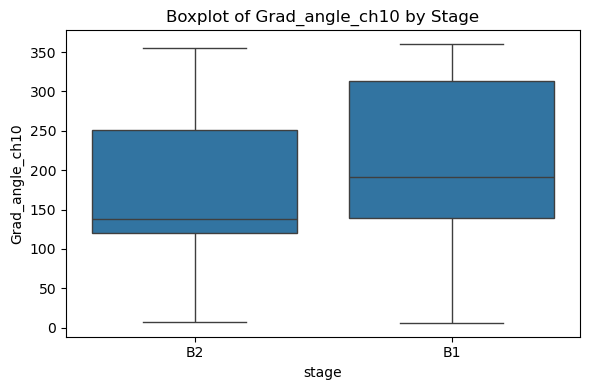

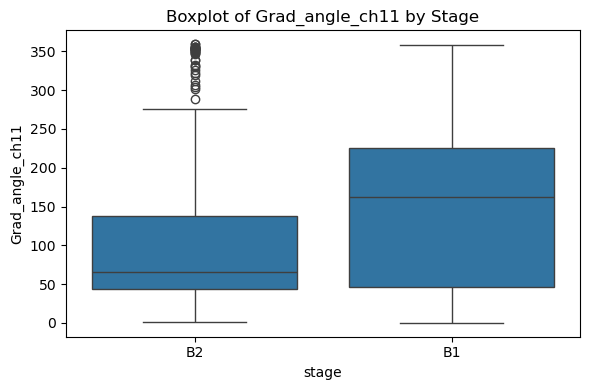

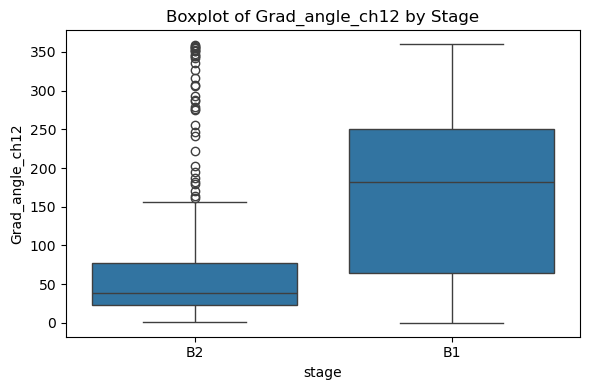

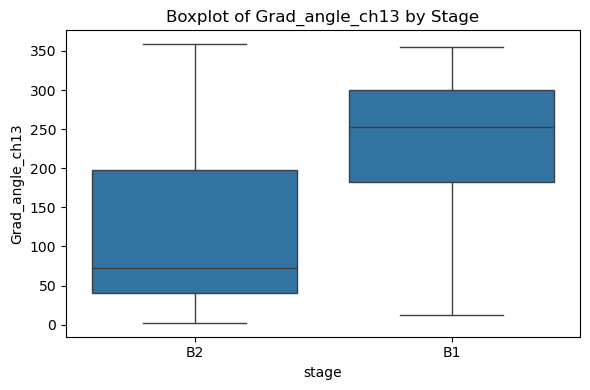

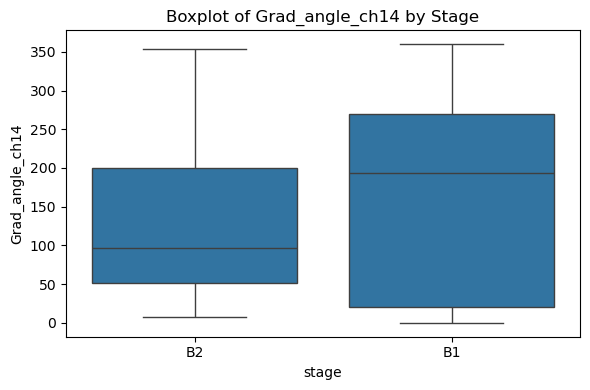

...

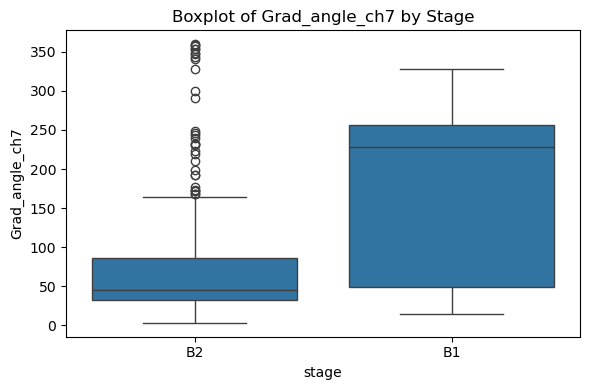

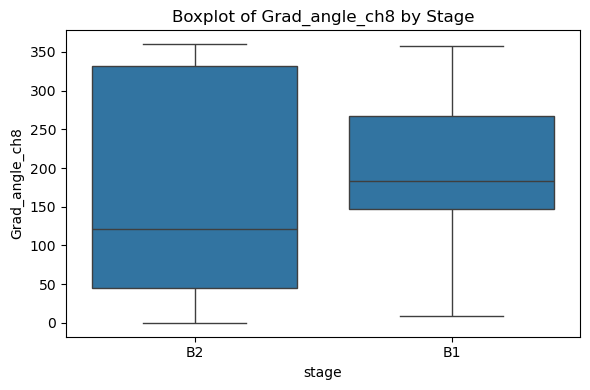

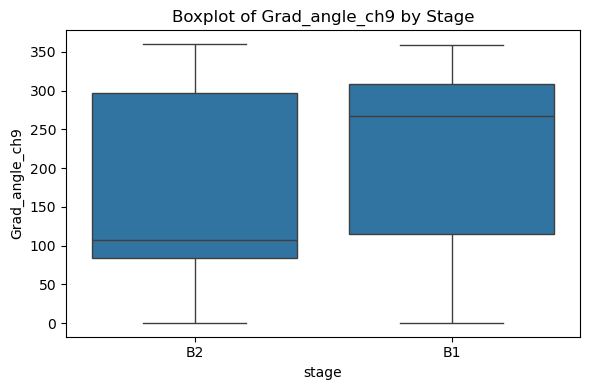

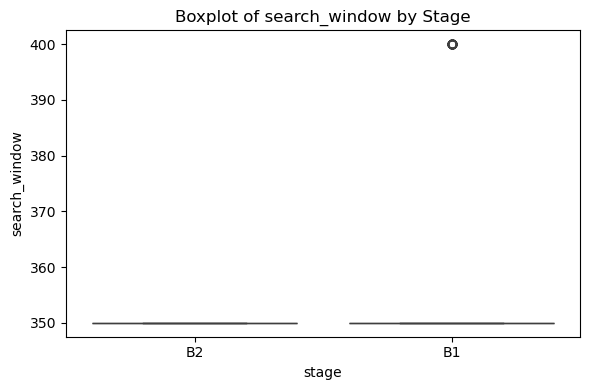

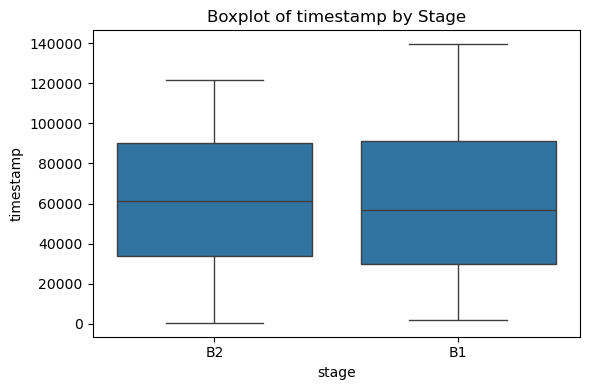

In [47]:
import pandas as pd
import matplotlib.pyplot as plt
from scipy.stats import median_test

# Optional: Cohen's d effect size
def cohens_d(x, y):
    nx, ny = len(x), len(y)
    dof = nx + ny - 2
    pooled_std = (((nx - 1)*x.std()**2 + (ny - 1)*y.std()**2) / dof) ** 0.5
    return (x.mean() - y.mean()) / pooled_std

# Load your Excel file (adjust the filename if needed)
#addon ='all_fs2000WIDTHSPCA1-101517.xlsx'#_SCALEDPERPATIENT#'all_fs2000GRADANGLE.xlsx'] #'all_fs2000GRADANGLE_SCALEDPERPATIENT.xlsx']#

datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_GRADANGLE.xlsx'
    
df = pd.read_excel(datapath)

# Drop irrelevant columns
if 'patient' in df.columns:
    df = df.drop('patient', axis=1)

# Separate B1 and B2 groups
df_B1 = df[df['stage'] == 'B1'].drop('stage', axis=1)
df_B2 = df[df['stage'] == 'B2'].drop('stage', axis=1)

# Prepare summary results
summary = []
for col in df_B1.columns:
    x = df_B1[col].dropna()
    y = df_B2[col].dropna()
    
    med_x, med_y = x.median(), y.median()
    mean_x, mean_y = x.mean(), y.mean()
    delta_med = med_x - med_y
    delta_mean = mean_x - mean_y
    d = cohens_d(x, y)

    summary.append({
        'column': col,
        'median_B1': med_x,
        'median_B2': med_y,
        'Δ_median': delta_med,
        'mean_B1': mean_x,
        'mean_B2': mean_y,
        'Δ_mean': delta_mean,
        "Cohen's d": d
    })

# Convert to DataFrame and sort by effect size
summary_df = pd.DataFrame(summary).sort_values("Cohen's d", key=abs, ascending=False)

# Print summary
print(summary_df)

# Plot boxplots for each column
import seaborn as sns
for col in df_B1.columns:
    plt.figure(figsize=(6, 4))
    sns.boxplot(data=df[df['stage'].isin(['B1', 'B2'])], x='stage', y=col)
    plt.title(f'Boxplot of {col} by Stage')
    plt.ylabel(col)
    plt.tight_layout()
    plt.show()


### New feature matrices of MEANs, STDs, MEDIANs and IQDs

currently i'm putting them in batches of 3 then finding the means and std


still there is the issue that if we don't have a group of 3 e.g., at the end we may just have a 1, then means/std are inaccurate! 

In [16]:
excel_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000ORIGINAL.xlsx'
save_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000MEDIANS.xlsx'


df = pd.read_excel(excel_pth)

print(df.shape)

#patnt = 18

patients = [27,28]#[18,19,21,22,23,24,25,26]

for patnt in patients:
    df_18_all = df.query(f"patient == {patnt}")

    all_means_18 = []

    #for i in range(0,len(df_18_all),3):

    df_18 = df_18_all.drop('stage',axis=1).drop('patient',axis=1)

    rows1to3 = np.array(df_18) #np.array(df_18.iloc[i:i+3])

    # JUST CHOOSE WHICH ONE U WANNA DO - MEAN OR MEDIAN OR STD!!
    #avg_for3_rows = list(np.mean(rows1to3, axis=0))
    # avg_for3_rows = list(np.std(rows1to3, axis=0))
    avg_for3_rows = list(np.median(rows1to3, axis=0))
    # Interquartile deviation
    #q1 = np.percentile(rows1to3, 25, axis=0)
    #q3 = np.percentile(rows1to3, 75, axis=0)
    #avg_for3_rows = list((q3 - q1) / 2)


    stage = df_18_all.iloc[0]['stage']

    #print(patnt, stage)

    avg_for3_rows.append(stage)

    avg_for3_rows.append(patnt)

    all_means_18.append(avg_for3_rows)

    #print(all_means_18)

    #print(df.columns)

    new_df = pd.DataFrame(all_means_18)

    new_df.columns = df.columns

    print(new_df)


    try:
        existing_df = pd.read_excel(save_path)
        # Append the new data to the existing data
        combined_df = pd.concat([existing_df,new_df],ignore_index=True)
    except FileNotFoundError:
        # If the file doesn't exist, just use the new data
        combined_df = new_df

    # Write the combined data back to the Excel file
    with pd.ExcelWriter(save_path,mode='w',engine='openpyxl') as writer:
        combined_df.to_excel(writer,index=False)
        print('put into excel') 


(517, 20)
   Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch13  Delay_ch14  Delay_ch15  \
0         9.0         8.0         7.0        18.0        15.0        14.0   

   Delay_ch16  Delay_ch17  Delay_ch18  Delay_ch19  Delay_ch2  Delay_ch3  \
0        12.0        20.5        20.0        20.0        0.0       -3.0   

   Delay_ch4  Delay_ch5  Delay_ch6  Delay_ch7  Delay_ch8  Delay_ch9 stage  \
0        6.0        7.0        3.0        0.0       12.0       13.0    B1   

   patient  
0       27  
put into excel
   Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch13  Delay_ch14  Delay_ch15  \
0         2.0         0.0        -2.0        11.0         9.0         3.0   

   Delay_ch16  Delay_ch17  Delay_ch18  Delay_ch19  Delay_ch2  Delay_ch3  \
0         0.0         0.0         8.0         3.0       -1.0       -2.0   

   Delay_ch4  Delay_ch5  Delay_ch6  Delay_ch7  Delay_ch8  Delay_ch9 stage  \
0        7.0        1.0        0.0       -1.5       10.0        9.0    B2   

   patient  
0       28  
p

### Logistic Regression - getting consistency in the function

In [3]:


# Let's assume you already have these:
# y_test: true labels
# y_pred: predicted labels
# clf.classes_: list of class names

def AccAndConsistency(cm, clfClasses, acc_cons_path, patientnum):

    class_metrics = []
    for i, class_name in enumerate(clfClasses):
        row = cm[i]
        support = np.sum(row)
        correct = row[i]
        most_common_pred = np.max(row)
        
        if support > 0:
            accuracy = correct / support
            consistency = most_common_pred / support
            
            class_metrics.append({
                "Class": class_name,
                "Accuracy": round(accuracy, 3),
                "Consistency": round(consistency, 3),
                "Support": support,
                "Patient tested on": patientnum})

    # Display results as a DataFrame
    df = pd.DataFrame(class_metrics)
    print(df)


    if os.path.exists(acc_cons_path):
        existing_df = pd.read_excel(acc_cons_path)
        combined_df = pd.concat([existing_df,df],ignore_index=True) # remove duplicates

        with pd.ExcelWriter(acc_cons_path, engine='openpyxl', mode='a', if_sheet_exists='replace') as writer:  # , 
            combined_df.to_excel(writer, index=False)
            print(f"Data appended to the existing excel file.")      
        # Save new Dataframe to Excel
    else:
        with pd.ExcelWriter(acc_cons_path, engine='openpyxl') as writer:
            df.to_excel(writer, index=False)
            print(f"Excel file created.")




In [5]:

import pandas as pd
import numpy as np
import os, glob, re
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.ensemble import HistGradientBoostingClassifier
import matplotlib.pyplot as plt


def AccAndConsistency(cm, clfClasses, acc_cons_path, patientnum):

    class_metrics = []
    for i, class_name in enumerate(clfClasses):
        row = cm[i]
        support = np.sum(row)
        correct = row[i]
        most_common_pred = np.max(row)
        
        if support > 0:
            accuracy = correct / support
            consistency = most_common_pred / support
            
            class_metrics.append({
                "Class": class_name,
                "Accuracy": round(accuracy, 3),
                "Consistency": round(consistency, 3),
                "Support": support,
                "Patient tested on": patientnum})

    # Display results as a DataFrame
    df = pd.DataFrame(class_metrics)
    print(df)

    if os.path.exists(acc_cons_path):
        existing_df = pd.read_excel(acc_cons_path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()
        combined_df.to_excel(acc_cons_path, index=False)
        print("Data merged and saved to existing Excel file.")
    else:
        df.to_excel(acc_cons_path, index=False)
        print("Excel file created with new data.")




# Import data from Excel
def getXYdata(readpath):
    df = pd.read_excel(io=readpath)
    # Generate feature matrix from data
    fmatrix = df#.sample(frac = 1)
    # Separate features and labels
    Xtest = fmatrix.drop('stage',axis=1)  # feature matrix
    Xtest = Xtest.values
    
    ytest = fmatrix['stage']  # labels
    ytest = ytest.values
    #u = np.unique(ytest)
    #print('u', u)
    # Standardise the data
    return Xtest, ytest


def runLogisticRegression(readpath_train, readpath_test):
    #readpath_train = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_rawdata_tol60/not26.xlsx'
    #readpath_test = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_rawdata_tol60/Perpatient/P26.xlsx'

    scaler = StandardScaler()
    Xtrain, ytrain = getXYdata(readpath_train)
    #print('y_train', ytrain)
    Xtrain = scaler.fit_transform(Xtrain)  # pd.DataFrame,columns=Xtrain.columns
    Xtest, ytest = getXYdata(readpath_test)
    #print('Xtest', Xtest)
    #print('ytest', ytest)
    Xtest = scaler.transform(Xtest)  # , columns=Xtrain.columns ; Apply the *already fitted* scaler to the test data (DO NOT FIT AGAIN)

    # Initialise and fit the logistic regression
    clf = LogisticRegression(class_weight='balanced')#HistGradientBoostingClassifier()  #LogisticRegression()#

    clf.fit(Xtrain,ytrain)

    # Predict the labels for the test set
    y_pred = clf.predict(Xtest)
    print('y_pred', y_pred)
    # Calculate the confusion matrix
    cm = confusion_matrix(ytest,y_pred)

    print(cm)

    print(clf.classes_)
    # Display the confusion matrix
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
    disp.plot(cmap="Blues")

    print(classification_report(ytest, y_pred, target_names=clf.classes_))

    return cm, clf.classes_
    

readpath_train = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'
readpath_test = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/rotate_manualDelays_P22.xlsx'#3extremes.xlsx'
acc_cons_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/testing_savetoexcel.xlsx'

cm, clfClasses = runLogisticRegression(readpath_train, readpath_test)

patientnum = 22

AccAndConsistency(cm, clfClasses, acc_cons_path, patientnum)


FileNotFoundError: [Errno 2] No such file or directory: '/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'

### SVM 

In [20]:
import pandas as pd
import os
import numpy as np
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, RobustScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import HistGradientBoostingClassifier
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/threePC_Delays.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000_std_iqr.xlsx'

#addon = 'all_fs2000AMPS.xlsx'#'all_fs2000GRADMAG.xlsx'#'all_fs2000ORIGINAL.xlsx'#'all_fs2000GRADANGLE.xlsx'#
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/' + addon

datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_GRADANGLE_STANDARDISED.xlsx'#1/widths/widths.xlsx'#Delays_thirdof3peaks/Delays_SearchWdw100/' + addon
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/' + addon

#save_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/Delays_SearchWdw100/all_fs2000WIDTHSPCA101517.xlsx'
df = pd.read_excel(io=datapath)

acc_cons_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/AccConsistencySVM.xlsx' #+ addon
#fmatrix = df.copy()

#df_4chs = fmatrix[['Delay_ch11', 'Delay_ch12', 'Delay_ch16', 'Delay_ch4','Delay_ch5','Delay_ch17', 'stage', 'patient']]

#print(df_4chs)

#df_not23 = fmatrix.query("patient != 23")
#print(df.dtypes)

print(df)

     Grad_angle_ch10  Grad_angle_ch11  Grad_angle_ch12  Grad_angle_ch13  \
0           0.280724         1.663125        -0.974540        -1.133014   
1          -0.958423         0.285200        -1.290594         0.095389   
2          -0.851878         1.694461        -0.796367        -0.056819   
3           1.691775         1.236049        -0.811588        -0.194701   
4          -0.296769        -1.167932        -0.553731        -1.165246   
..               ...              ...              ...              ...   
438        -0.403314        -0.995132        -1.236873         1.025644   
439        -0.268118        -1.001400        -1.141072         0.927157   
440        -0.256479        -1.030050        -1.337151         1.003261   
441        -0.423012        -0.669229        -1.362221         1.486743   
442        -0.468674        -0.936040        -0.908285        -1.344314   

     Grad_angle_ch14  Grad_angle_ch15  Grad_angle_ch16  Grad_angle_ch17  \
0          -0.893959    

In [ ]:
from sklearn.inspection import DecisionBoundaryDisplay
from sklearn.decomposition import PCA

import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import ListedColormap
from sklearn.preprocessing import LabelEncoder

import plotly.graph_objects as go
import numpy as np
from sklearn.decomposition import PCA
from sklearn.svm import SVC

import numpy as np
import plotly.graph_objs as go
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder
from sklearn.svm import SVC

def plot_decision_boundary_3d(clf, X, y, feature_names=None):
    # Convert string labels to numeric values
    le = LabelEncoder()
    y_numeric = le.fit_transform(y)
    
    # Reduce to 3 dimensions using PCA
    pca = PCA(n_components=3)
    X_3d = pca.fit_transform(X)
    
    # Train a new SVM just on these 3 dimensions
    svm_3d = SVC(
        C=clf.C,
        gamma=clf.gamma,
        kernel=clf.kernel,
        class_weight='balanced'
    )
    svm_3d.fit(X_3d, y_numeric)
    
    # Create a meshgrid over 3D space
    h = 0.5  # step size in the mesh
    x_min, x_max = X_3d[:, 0].min() - 1, X_3d[:, 0].max() + 1
    y_min, y_max = X_3d[:, 1].min() - 1, X_3d[:, 1].max() + 1
    z_min, z_max = X_3d[:, 2].min() - 1, X_3d[:, 2].max() + 1
    
    xx, yy, zz = np.meshgrid(
        np.arange(x_min, x_max, h),
        np.arange(y_min, y_max, h),
        np.arange(z_min, z_max, h)
    )
    
    grid = np.c_[xx.ravel(), yy.ravel(), zz.ravel()]
    preds = svm_3d.predict(grid)
    preds = preds.reshape(xx.shape)
    
    # Create 3D Scatter Plot
    scatter = go.Scatter3d(
        x=X_3d[:, 0],
        y=X_3d[:, 1],
        z=X_3d[:, 2],
        mode='markers',
        marker=dict(
            size=5,
            color=y_numeric,  # Color by class
            colorscale='Viridis',
            opacity=0.8
        ),
        text=le.inverse_transform(y_numeric)
    )
    
    # Create decision boundary isosurfaces
    surface = go.Isosurface(
        x=xx.flatten(),
        y=yy.flatten(),
        z=zz.flatten(),
        value=preds.flatten(),
        isomin=0,
        isomax=len(le.classes_) - 1,
        opacity=0.3,
        surface_count=len(le.classes_),
        colorscale='Viridis'
    )
    
    fig = go.Figure(data=[scatter, surface])
    fig.update_layout(
        scene=dict(
            xaxis_title=feature_names[0] if feature_names else "PC1",
            yaxis_title=feature_names[1] if feature_names else "PC2",
            zaxis_title=feature_names[2] if feature_names else "PC3"
        ),
        title="SVM Decision Boundary (3D PCA Projection)",
        width=900,
        height=800
    )
    fig.show()
    
    # Plot cumulative explained variance
    pca_full = PCA().fit(X)
    cum_var = np.cumsum(pca_full.explained_variance_ratio_)
    
    fig2 = go.Figure()
    fig2.add_trace(go.Scatter(y=cum_var, mode='lines+markers'))
    fig2.update_layout(
        title="Cumulative Explained Variance by PCA Components",
        xaxis_title="Number of Components",
        yaxis_title="Cumulative Explained Variance",
        width=700,
        height=500
    )
    fig2.show()

def plot_decision_boundary_2d(clf, X, y, feature_names=None):
    """
    Your actual model uses 18 features, but the visualization only shows 2D projections (PCA or feature pairs)
What looks like good separation in 2D may be complete overlap in 18D space
    """
    # Convert string labels to numeric values
    le = LabelEncoder()
    y_numeric = le.fit_transform(y)
    
    # Reduce to 2 dimensions using PCA
    pca = PCA(n_components=2)
    X_2d = pca.fit_transform(X)
    
    # Train a new SVM just on these 2 dimensions
    svm_2d = SVC(
        C=clf.C, 
        gamma=clf.gamma,
        kernel=clf.kernel,
        class_weight='balanced'
    ) 
    svm_2d.fit(X_2d, y_numeric)
    
    # Create plot
    fig, ax = plt.subplots(figsize=(10, 8))
    
    # Create a colormap with enough distinct colors
    cmap = ListedColormap(plt.cm.Spectral(np.linspace(0, 1, len(le.classes_))))
    
    # Plot decision boundary
    DecisionBoundaryDisplay.from_estimator(svm_2d,X_2d,response_method="predict",cmap=cmap,alpha=0.8,ax=ax)
    
    # Add axis labels
    if feature_names is not None and len(feature_names) >= 2:
        ax.set_xlabel(feature_names[0])
        ax.set_ylabel(feature_names[1])
    else:
        ax.set_xlabel("Principal Component 1")
        ax.set_ylabel("Principal Component 2")
    
    # Scatter plot with proper color mapping
    scatter = ax.scatter(X_2d[:, 0], X_2d[:, 1], c=y_numeric, s=50, edgecolors="k", cmap=cmap)
    
    # Add legend with original class names
    legend_labels = le.inverse_transform(range(len(le.classes_)))
    legend = ax.legend(scatter.legend_elements()[0], 
                      legend_labels,
                      title="Classes")
    ax.add_artist(legend)
    
    plt.title("SVM Decision Boundary (2D PCA Projection)")
    plt.show()

    # Check how much variance PCA captures
    pca = PCA().fit(X)
    plt.plot(np.cumsum(pca.explained_variance_ratio_))
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance')
    plt.show()


test_patientnum 18
Best parameters: {'C': 10, 'gamma': 'scale', 'kernel': 'poly'}
  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.338        0.662       68                 18
Excel file created with new data.
test_patientnum 19
Best parameters: {'C': 1, 'gamma': 'scale', 'kernel': 'rbf'}
  Class  Accuracy  Consistency  Support  Patient tested on
0    B1     0.051        0.949       78                 19
Data merged and saved to Excel file.
test_patientnum 21
Best parameters: {'C': 50, 'gamma': 'auto', 'kernel': 'rbf'}
  Class  Accuracy  Consistency  Support  Patient tested on
0    B1     0.827        0.827       52                 21
Data merged and saved to Excel file.
test_patientnum 22
Best parameters: {'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}
  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.611        0.611       18                 22
Data merged and saved to Excel file.
test_patientnum 23
Best parameters: {'C': 50, 'gamma': 'auto', '

ValueError: Found array with 0 sample(s) (shape=(0, 18)) while a minimum of 1 is required by RobustScaler.

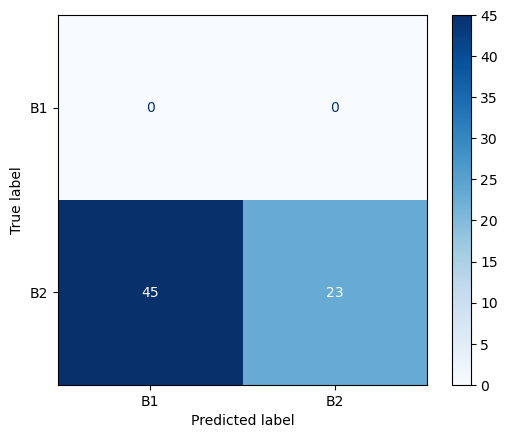

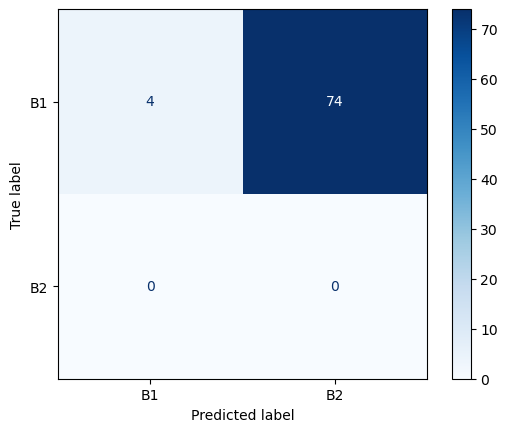

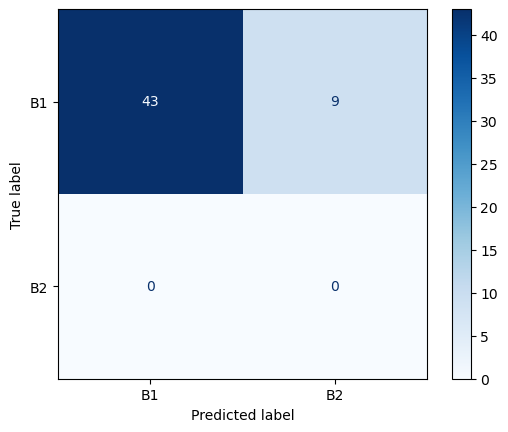

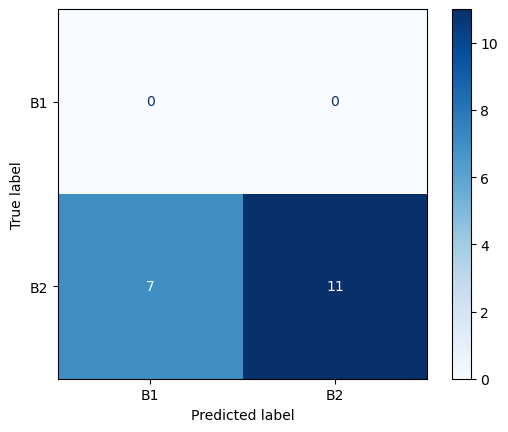

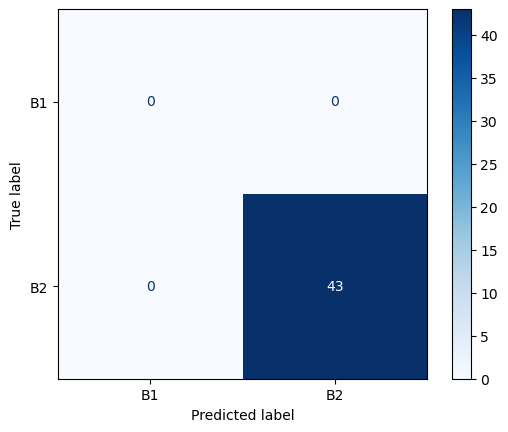

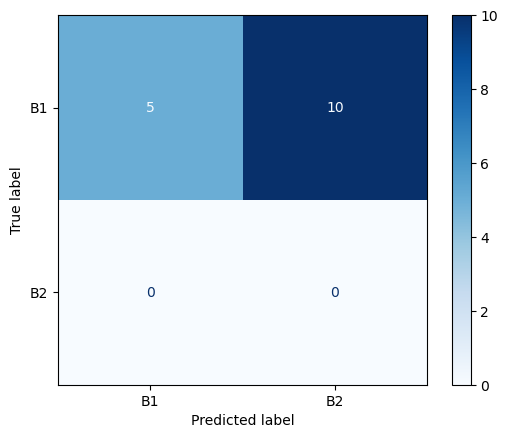

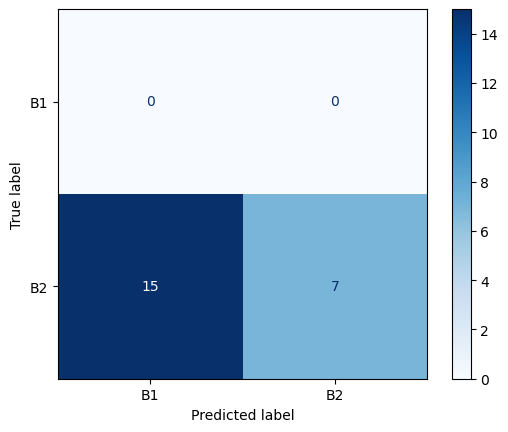

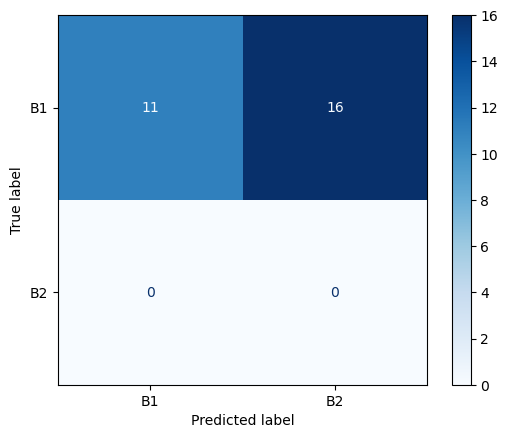

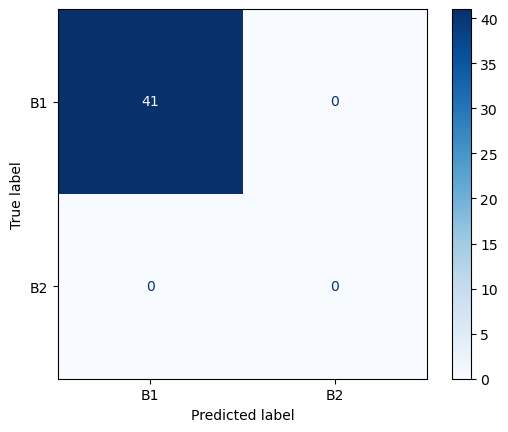

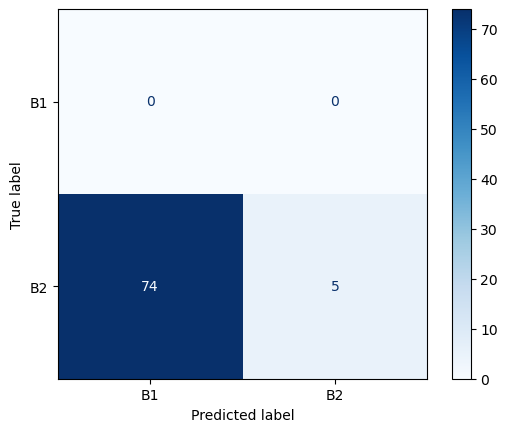

In [21]:
def getXYdata(df_test):

    fmatrix = df_test.copy()

    Xtest = fmatrix.drop('patient', axis = 1).drop('stage', axis =1).drop('search_window',axis=1).drop('timestamp', axis =1)  #feature matrix .drop('timestamp', axis =1) #
    Xtest = Xtest.values
    
    ytest = fmatrix['stage']  # labels
    ytest = ytest.values
    #u = np.unique(ytest)
    #print('u', u)
    # Standardise the data
    return Xtest, ytest

def runRegression(df):
    patients = [18,19,21,22,23,24,25,26,27,28,29] # 18,19,21,22,23, i think 19? and 23 are correctly classified

    for test_patientnum in patients:

        print('test_patientnum', test_patientnum)

        df_test = df.query(f"patient == {test_patientnum}")

        Xtest, ytest = getXYdata(df_test)

        df_train = df.query(f"patient != {test_patientnum}")

        Xtrain, ytrain = getXYdata(df_train)

        scaler = RobustScaler()#MinMaxScaler()#Normalizer()# StandardScaler()
        Xtrain = scaler.fit_transform(Xtrain)  # pd.DataFrame,columns=Xtrain.columns
        Xtest = scaler.transform(Xtest)  # , columns=Xtrain.columns ; Apply the *already fitted* scaler to the test data (DO NOT FIT AGAIN)

        #pca = PCA(n_components=2)
        #Xtrain = pca.fit_transform(Xtrain)
        #Xtest = pca.transform(Xtest)


        param_grid = {
        'C': [0.1, 1, 10, 50, 100],
        'gamma': ['scale', 'auto', 0.1, 1, 5, 10],
        'kernel': ['rbf', 'linear', 'poly']}
        grid_search = GridSearchCV(SVC(class_weight='balanced'), param_grid, cv=5)
        grid_search.fit(Xtrain, ytrain)
        best_params = grid_search.best_params_
        print("Best parameters:", best_params)
        clf = grid_search.best_estimator_#SVC(kernel='rbf', gamma=best_params['gamma'], C=best_params['C'], class_weight='balanced')#,probability=True)


        # Predict the labels for the test set
        y_pred = clf.predict(Xtest)

        # Calculate the confusion matrix
        cm = confusion_matrix(ytest,y_pred,labels=clf.classes_)

        #print(cm)

        #print(clf.classes_)
        # Display the confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
        disp.plot(cmap="Blues")

        #print(classification_report(ytest, y_pred, target_names=clf.classes_))

        AccAndConsistency(cm, clf.classes_, acc_cons_path, test_patientnum)

        #pca = PCA(n_components=2)
        #X_pca = pca.fit_transform(Xtrain)
        #plot_decision_boundary(clf, X_pca, ytrain, feature_names=["PCA Component 1", "PCA Component 2"])
        #plot_decision_boundary_2d(clf, Xtrain, ytrain)
        #plot_pairwise_decision_boundaries(clf, Xtrain, ytrain)
        #plot_decision_boundary_3d(clf, Xtrain, ytrain)
runRegression(df)

### Random forest

In [44]:
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, RobustScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap

#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/threePC_Delays.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000_std_iqr.xlsx'

#addon = 'all_fs2000WIDTHSPCA1-101517.xlsx'#'all_fs2000ORIGINAL.xlsx'#'all_fs2000GRADANGLE.xlsx'#'all_fs2000GRADMAG.xlsx'#'all_fs2000ORIGINAL.xlsx'

datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_STANDARDISED.xlsx'#/combined/delays_hfd_gradangle.xlsx'#V2-V3/delays/delays_SCALEDPERPATIENT.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/' + addon

#save_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/Delays_SearchWdw100/all_fs2000WIDTHSPCA101517.xlsx'
df = pd.read_excel(io=datapath)

acc_cons_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/AccConsistencyForest.xlsx'
#fmatrix = df.copy()

#df_4chs = fmatrix[['Delay_ch11', 'Delay_ch12', 'Delay_ch16', 'Delay_ch4','Delay_ch5','Delay_ch17', 'stage', 'patient']]

#print(df_4chs)

#df_not23 = fmatrix.query("patient != 23")
#print(df.dtypes)

# Import data from Excel
def getXYdata(df_test):

    fmatrix = df_test.copy()

    Xtest = fmatrix.drop('patient', axis = 1).drop('stage', axis =1).drop('search_window',axis=1).drop('timestamp', axis =1)
    Xtest = Xtest.values
    
    ytest = fmatrix['stage']  # labels
    ytest = ytest.values
    #u = np.unique(ytest)
    #print('u', u)
    # Standardise the data
    return Xtest, ytest


def AccAndConsistency(cm, clfClasses, acc_cons_path, patientnum):

    class_metrics = []
    for i, class_name in enumerate(clfClasses):
        row = cm[i]
        support = np.sum(row)
        correct = row[i]
        most_common_pred = np.max(row)
        
        if support > 0:
            accuracy = correct / support
            consistency = most_common_pred / support
            
            class_metrics.append({
                "Class": class_name,
                "Accuracy": round(accuracy, 3),
                "Consistency": round(consistency, 3),
                "Support": support,
                "Patient tested on": patientnum})

    # Display results as a DataFrame
    df = pd.DataFrame(class_metrics)
    print(df)

    if os.path.exists(acc_cons_path):
        existing_df = pd.read_excel(acc_cons_path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()
        combined_df.to_excel(acc_cons_path, index=False)
        print("Data merged and saved to Excel file.")
    else:
        df.to_excel(acc_cons_path, index=False)
        print("Excel file created with new data.")

test_patientnum 18
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best score: 0.8213333333333332
Best parameters: {'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 1, 'max_features': 0.2, 'max_depth': None}
Test set accuracy: 0.5441176470588235
[[ 0  0]
 [31 37]]
['B1' 'B2']
  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.544        0.544       68                 18
Data merged and saved to Excel file.
test_patientnum 19
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best score: 0.8849315068493151
Best parameters: {'n_estimators': 50, 'min_samples_split': 10, 'min_samples_leaf': 2, 'max_features': 0.5, 'max_depth': 20}
Test set accuracy: 0.08974358974358974
[[ 7 71]
 [ 0  0]]
['B1' 'B2']
  Class  Accuracy  Consistency  Support  Patient tested on
0    B1      0.09         0.91       78                 19
Data merged and saved to Excel file.
test_patientnum 21
Fitting 5 folds for each of 50 candidates, totalling 250 f

ValueError: Found array with 0 sample(s) (shape=(0, 18)) while a minimum of 1 is required by RandomForestClassifier.

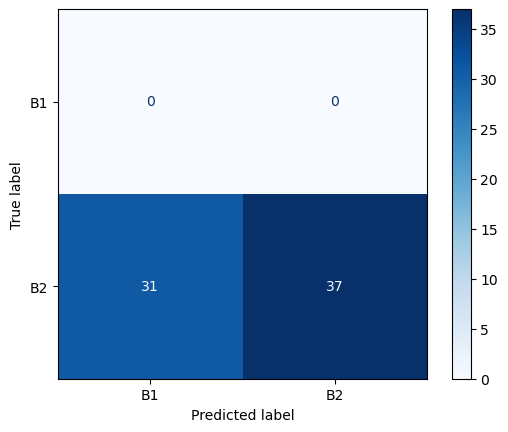

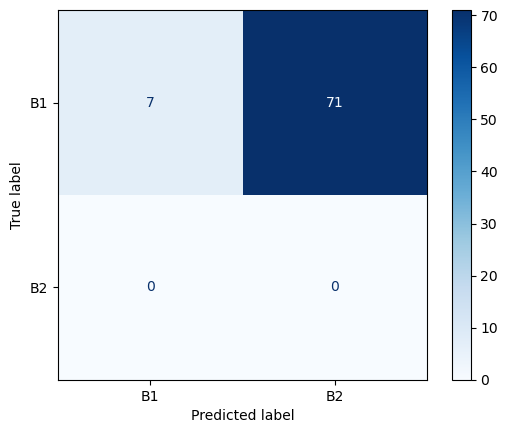

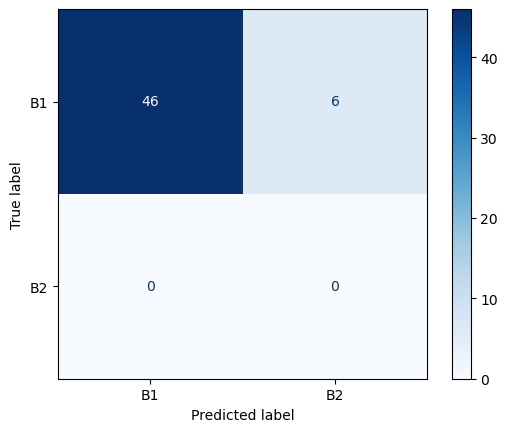

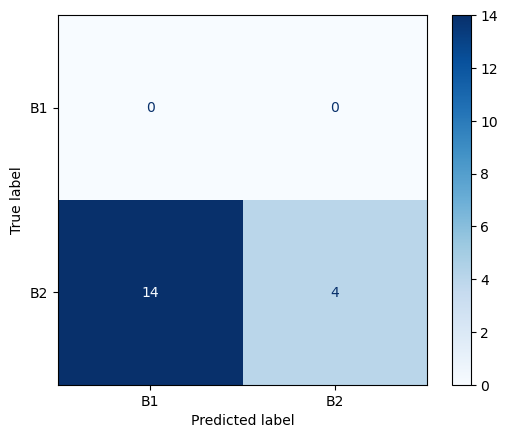

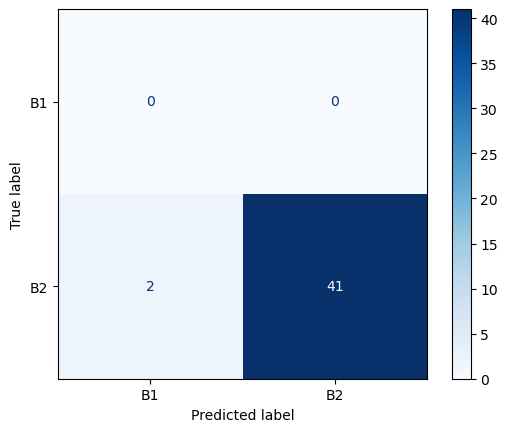

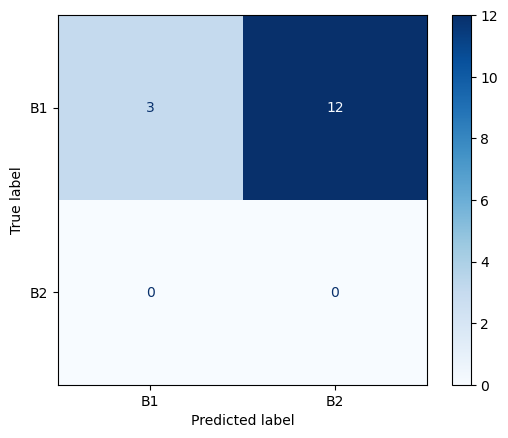

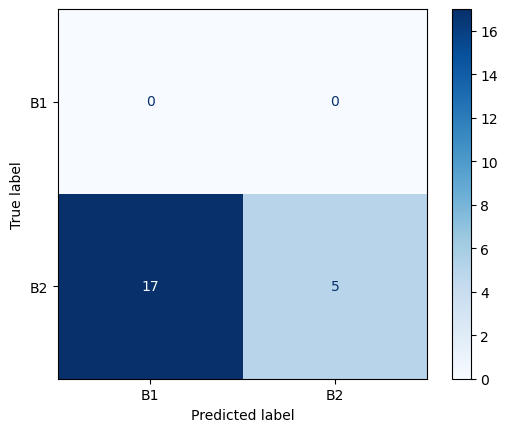

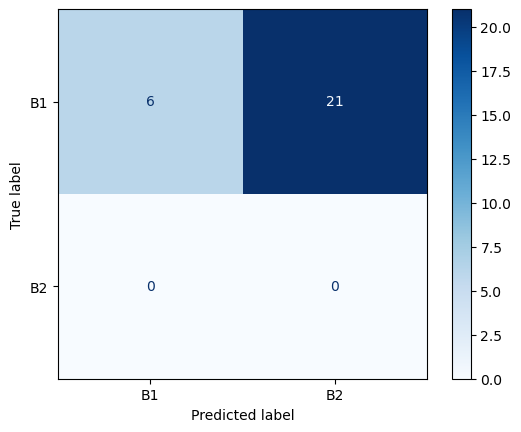

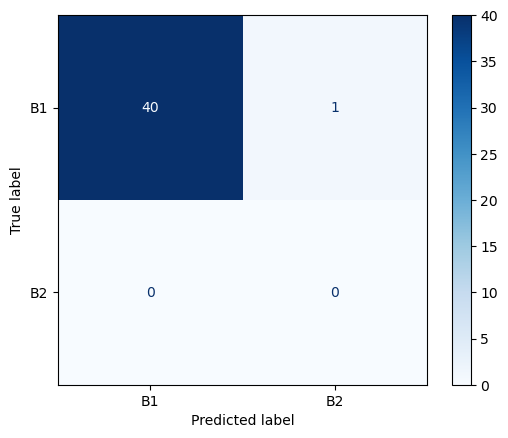

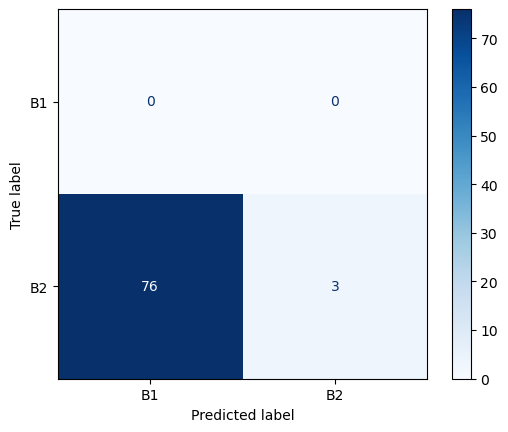

In [45]:
def runRegressionForest(df):

    param_grid = {
    "n_estimators": [50, 100, 200, 500],
    "max_depth": [None, 5, 10, 20],
    "min_samples_split": [2, 5, 10],
    "min_samples_leaf": [1, 2, 4],
    "max_features": ["sqrt", "log2", 0.2, 0.5]}
    

    patients = [18,19,21,22,23,24,25,26,27,28,29] # 18,19,21,22,23,29 i think 19? and 23 are correctly classified

    for test_patientnum in patients:

        print('test_patientnum', test_patientnum)

        df_test = df.query(f"patient == {test_patientnum}")

        Xtest, ytest = getXYdata(df_test)

        df_train = df.query(f"patient != {test_patientnum}")

        Xtrain, ytrain = getXYdata(df_train)

        #scaler = RobustScaler()#MinMaxScaler()#Normalizer()# StandardScaler()
        #Xtrain = scaler.fit_transform(Xtrain)  # pd.DataFrame,columns=Xtrain.columns
        #Xtest = scaler.transform(Xtest)  # , columns=Xtrain.columns ; Apply the *already fitted* scaler to the test data (DO NOT FIT AGAIN)

        #print(Xtrain)
        
        rf = RandomForestClassifier(random_state=42, n_jobs=-1)
        #rf.fit(Xtrain, ytrain)
        

        # Initialise and fit the logistic regression
        #clf = LogisticRegression(class_weight='balanced')#HistGradientBoostingClassifier()  #LogisticRegression()#
        #clf = SVC(kernel='rbf', gamma=best_params['gamma'], C=best_params['C'], class_weight='balanced',probability=True)
        #clf = DecisionTreeClassifier(class_weight='balanced')
        #clf = HistGradientBoostingClassifier(class_weight='balanced')
        #clf = LinearSVC(class_weight='balanced')

        # Example with RandomizedSearchCV
        clf = RandomizedSearchCV(
            estimator=rf,
            param_distributions=param_grid,
            n_iter=50,                            # number of random combinations
            cv=StratifiedKFold(n_splits=5),       # 5-fold stratified CV
            scoring="accuracy",                   # or any other metric
            verbose=1,
            random_state=42,
            n_jobs=-1
        )

        clf.fit(Xtrain, ytrain)

        print("Best score:", clf.best_score_)
        print("Best parameters:", clf.best_params_)

        best_rf = clf.best_estimator_
        test_score = best_rf.score(Xtest, ytest)
        print("Test set accuracy:", test_score)


        # Predict the labels for the test set
        y_pred = clf.predict(Xtest)
        #print('y_pred', y_pred)
        # Calculate the confusion matrix
        cm = confusion_matrix(ytest,y_pred,labels=clf.classes_)

        print(cm)

        print(clf.classes_)
        # Display the confusion matrix
        disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=clf.classes_)
        disp.plot(cmap="Blues")

        #print(classification_report(ytest, y_pred, target_names=clf.classes_))

        AccAndConsistency(cm, clf.classes_, acc_cons_path, test_patientnum)
        #plot_decision_boundary_2d(clf, Xtrain, ytrain)

        #display(Xtrain, ytrain)

runRegressionForest(df)

### Gradient boosting

test_patientnum 18
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.9199999999999999
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.324
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 0  0]
 [46 22]]
Classes: ['B1' 'B2']


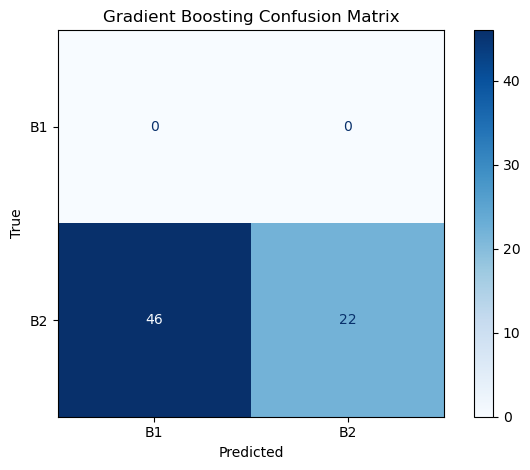

  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.324        0.676       68                 18
Excel file created with new data.
test_patientnum 19
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.9424657534246575
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.000
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 0 78]
 [ 0  0]]
Classes: ['B1' 'B2']


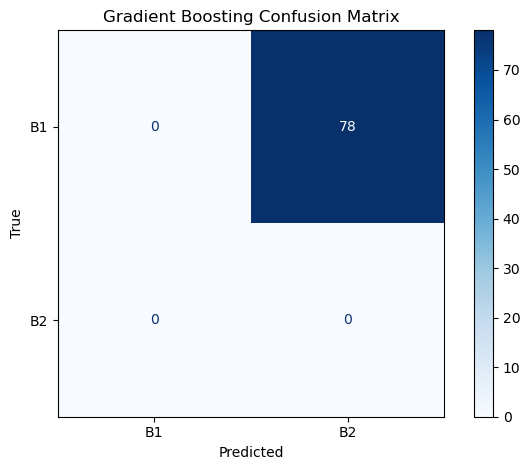

  Class  Accuracy  Consistency  Support  Patient tested on
0    B1       0.0          1.0       78                 19
Data merged and saved to Excel file.
test_patientnum 21
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.877150275884453
Best hyperparameters: {'subsample': 1.0, 'n_estimators': 100, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': 'log2', 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 1.000
Cohen’s κ:  nan
Confusion Matrix:
 [[52  0]
 [ 0  0]]
Classes: ['B1' 'B2']


/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:386: UserWarning: A single label was found in 'y_true' and 'y_pred'. For the confusion matrix to have the correct shape, use the 'labels' parameter to pass all known labels.
  warnings.warn(
/opt/homebrew/anaconda3/lib/python3.12/site-packages/sklearn/metrics/_classification.py:708: RuntimeWarning: invalid value encountered in scalar divide
  k = np.sum(w_mat * confusion) / np.sum(w_mat * expected)


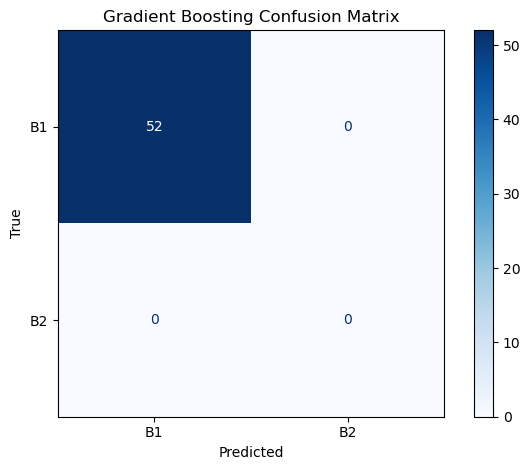

  Class  Accuracy  Consistency  Support  Patient tested on
0    B1       1.0          1.0       52                 21
Data merged and saved to Excel file.
test_patientnum 22
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.9035294117647059
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.556
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 0  0]
 [ 8 10]]
Classes: ['B1' 'B2']


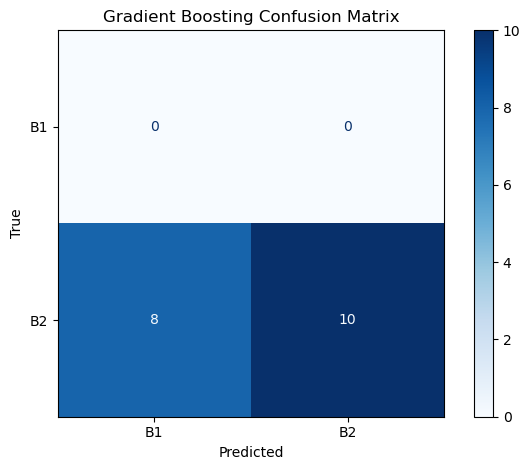

  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.556        0.556       18                 22
Data merged and saved to Excel file.
test_patientnum 23
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.8800000000000001
Best hyperparameters: {'subsample': 1.0, 'n_estimators': 50, 'min_samples_split': 2, 'min_samples_leaf': 2, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.05}
Test accuracy: 0.628
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 0  0]
 [16 27]]
Classes: ['B1' 'B2']


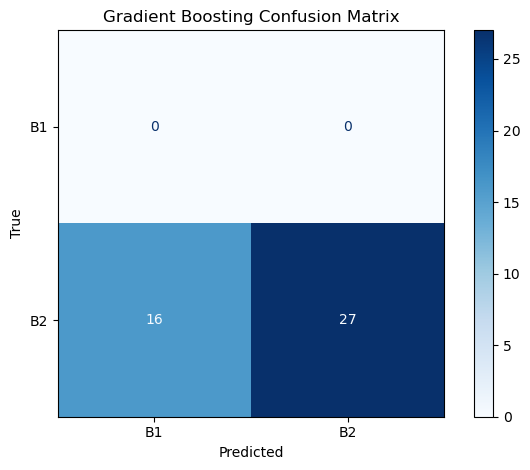

  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.628        0.628       43                 23
Data merged and saved to Excel file.
test_patientnum 24
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.9111080711354308
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 200, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 5, 'learning_rate': 0.01}
Test accuracy: 0.267
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 4 11]
 [ 0  0]]
Classes: ['B1' 'B2']


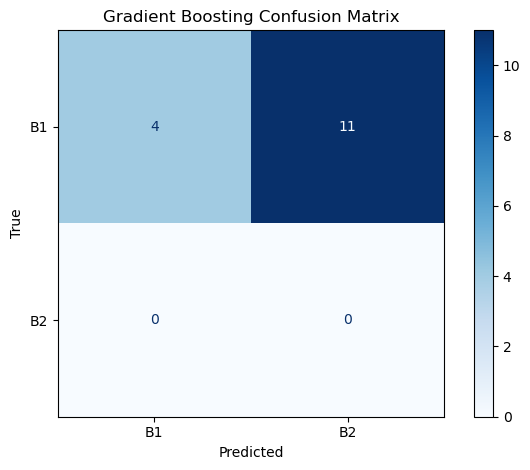

  Class  Accuracy  Consistency  Support  Patient tested on
0    B1     0.267        0.733       15                 24
Data merged and saved to Excel file.
test_patientnum 25
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.9192717086834733
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.182
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 0  0]
 [18  4]]
Classes: ['B1' 'B2']


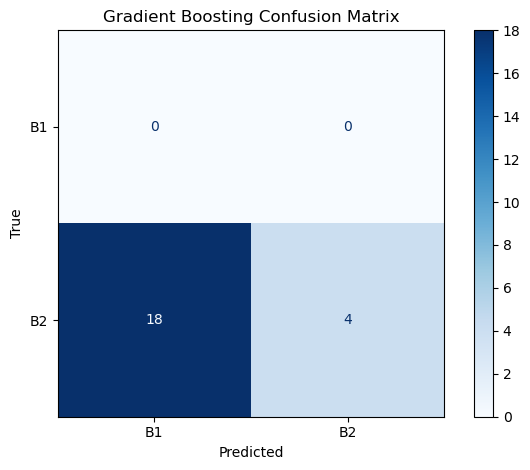

  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.182        0.818       22                 25
Data merged and saved to Excel file.
test_patientnum 26
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.9302925989672979
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.074
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 2 25]
 [ 0  0]]
Classes: ['B1' 'B2']


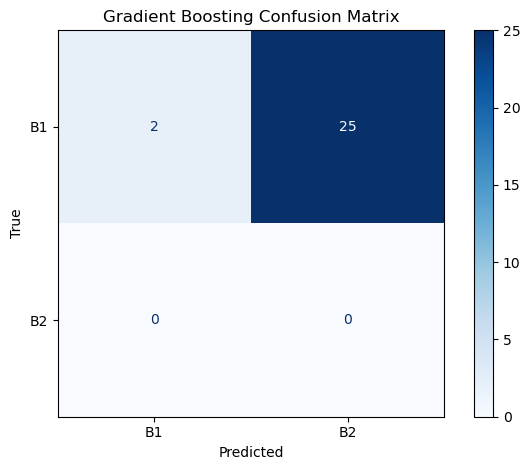

  Class  Accuracy  Consistency  Support  Patient tested on
0    B1     0.074        0.926       27                 26
Data merged and saved to Excel file.
test_patientnum 27
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.8904938271604937
Best hyperparameters: {'subsample': 0.6, 'n_estimators': 100, 'min_samples_split': 10, 'min_samples_leaf': 4, 'max_features': None, 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.707
Cohen’s κ:  0.000
Confusion Matrix:
 [[29 12]
 [ 0  0]]
Classes: ['B1' 'B2']


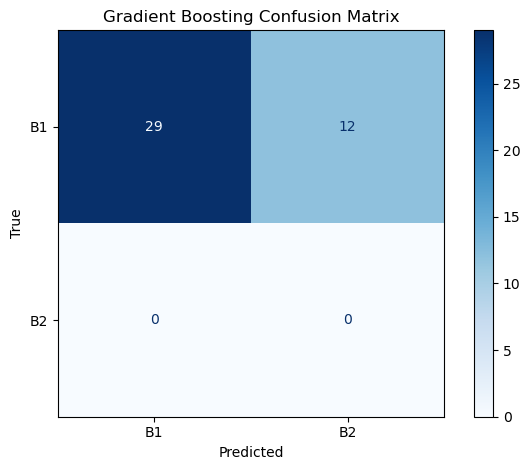

  Class  Accuracy  Consistency  Support  Patient tested on
0    B1     0.707        0.707       41                 27
Data merged and saved to Excel file.
test_patientnum 28
Fitting 5 folds for each of 50 candidates, totalling 250 fits
Best CV accuracy: 0.8595129375951294
Best hyperparameters: {'subsample': 1.0, 'n_estimators': 50, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_features': 'sqrt', 'max_depth': 3, 'learning_rate': 0.01}
Test accuracy: 0.101
Cohen’s κ:  0.000
Confusion Matrix:
 [[ 0  0]
 [71  8]]
Classes: ['B1' 'B2']


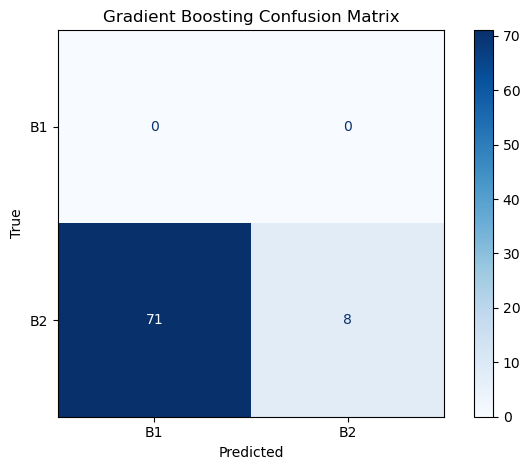

  Class  Accuracy  Consistency  Support  Patient tested on
0    B2     0.101        0.899       79                 28
Data merged and saved to Excel file.
test_patientnum 29


ValueError: Found array with 0 sample(s) (shape=(0, 36)) while a minimum of 1 is required by LinearDiscriminantAnalysis.

In [28]:
from sklearn.ensemble import GradientBoostingClassifier
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.metrics import (accuracy_score,cohen_kappa_score,confusion_matrix,classification_report,ConfusionMatrixDisplay)
import matplotlib.pyplot as plt
from sklearn.model_selection import RepeatedStratifiedKFold, cross_val_score, StratifiedKFold, train_test_split
from sklearn.preprocessing import StandardScaler, Normalizer, MinMaxScaler, RobustScaler
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
from sklearn.ensemble import HistGradientBoostingClassifier, RandomForestClassifier
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.ensemble import RandomForestClassifier
from sklearn.pipeline import Pipeline
from sklearn.model_selection import RandomizedSearchCV, StratifiedKFold
from sklearn.preprocessing import LabelEncoder
from matplotlib.colors import ListedColormap
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis

#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/threePC_Delays.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000_std_iqr.xlsx'

#addon = 'all_fs2000WIDTHSPCA1-101517.xlsx'#'all_fs2000ORIGINAL.xlsx'#'all_fs2000GRADANGLE.xlsx'#'all_fs2000GRADMAG.xlsx'#'all_fs2000ORIGINAL.xlsx'

datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/combined/hfd_gradangle.xlsx'#/delays_hfd_gradangle.xlsx'#V2-V3/delays/delays_SCALEDPERPATIENT.xlsx'
#datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/' + addon

#save_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/Delays_SearchWdw100/all_fs2000WIDTHSPCA101517.xlsx'
df = pd.read_excel(io=datapath)

acc_cons_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/combined/AccConsistencyBoosting.xlsx'
#fmatrix = df.copy()

#df_4chs = fmatrix[['Delay_ch11', 'Delay_ch12', 'Delay_ch16', 'Delay_ch4','Delay_ch5','Delay_ch17', 'stage', 'patient']]

#print(df_4chs)

#df_not23 = fmatrix.query("patient != 23")
#print(df.dtypes)

# Import data from Excel
def getXYdata(df_test):

    fmatrix = df_test.copy()

    Xtest = fmatrix.drop('patient', axis = 1).drop('stage', axis =1).drop('timestamp', axis =1) #.drop('search_window',axis=1)
    Xtest = Xtest.values
    
    ytest = fmatrix['stage']  # labels
    ytest = ytest.values
    #u = np.unique(ytest)
    #print('u', u)
    # Standardise the data
    return Xtest, ytest


def AccAndConsistency(cm, clfClasses, acc_cons_path, patientnum):

    class_metrics = []
    for i, class_name in enumerate(clfClasses):
        row = cm[i]
        support = np.sum(row)
        correct = row[i]
        most_common_pred = np.max(row)
        
        if support > 0:
            accuracy = correct / support
            consistency = most_common_pred / support
            
            class_metrics.append({
                "Class": class_name,
                "Accuracy": round(accuracy, 3),
                "Consistency": round(consistency, 3),
                "Support": support,
                "Patient tested on": patientnum})

    # Display results as a DataFrame
    df = pd.DataFrame(class_metrics)
    print(df)

    if os.path.exists(acc_cons_path):
        existing_df = pd.read_excel(acc_cons_path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)#.drop_duplicates()
        combined_df.to_excel(acc_cons_path, index=False)
        print("Data merged and saved to Excel file.")
    else:
        df.to_excel(acc_cons_path, index=False)
        print("Excel file created with new data.")


        

patients = [18,19,21,22,23,24,25,26,27,28,29] # 18,19,21,22,23,29 i think 19? and 23 are correctly classified

for test_patientnum in patients:

    print('test_patientnum', test_patientnum)

    df_test = df.query(f"patient == {test_patientnum}")

    X_test, y_test = getXYdata(df_test)

    df_train = df.query(f"patient != {test_patientnum}")

    X_train, y_train = getXYdata(df_train)



    n_components = 1
    #pca = PCA(n_components=n_components)
    pca = LinearDiscriminantAnalysis(n_components=n_components)

    #xpca_train = pca.fit_transform(X_train)  # Apply dimensionality reduction
    #xpca_test = pca.transform(X_train)  # Apply the same transformation to the test set
    X_train = pca.fit_transform(X_train, y_train)  # Apply dimensionality reduction
    X_test = pca.transform(X_test)  # Apply the same transformation to the test set



        
    # 1. Base estimator
    gb = GradientBoostingClassifier(random_state=42)

    # 2. Hyperparameter grid
    param_dist = {
        "n_estimators": [50, 100, 200, 500],
        "learning_rate": [0.01, 0.05, 0.1, 0.2],
        "max_depth": [3, 5, 7],
        "min_samples_split": [2, 5, 10],
        "min_samples_leaf": [1, 2, 4],
        "subsample": [0.6, 0.8, 1.0],        # fraction of samples per tree
        "max_features": ["sqrt", "log2", None]
    }

    # 3. Randomized search
    search = RandomizedSearchCV(
        estimator=gb,
        param_distributions=param_dist,
        n_iter=50,
        cv=StratifiedKFold(n_splits=5),
        scoring="accuracy",
        verbose=1,
        random_state=42,
        n_jobs=-1)

    # 4. Fit on training data
    search.fit(X_train, y_train)

    print("Best CV accuracy:", search.best_score_)
    print("Best hyperparameters:", search.best_params_)

    # 5. Evaluate on test set
    best_gb = search.best_estimator_
    y_pred = best_gb.predict(X_test)

    acc = accuracy_score(y_test, y_pred)
    kappa = cohen_kappa_score(y_test, y_pred)
    print(f"Test accuracy: {acc:.3f}")
    print(f"Cohen’s κ:  {kappa:.3f}")

    # 6. Confusion matrix & classification report
    cm = confusion_matrix(y_test, y_pred, labels=best_gb.classes_)
    print("Confusion Matrix:\n", cm)
    print("Classes:", best_gb.classes_)

    disp = ConfusionMatrixDisplay(cm, display_labels=best_gb.classes_)
    disp.plot(cmap="Blues")
    plt.title("Gradient Boosting Confusion Matrix")
    plt.xlabel("Predicted")
    plt.ylabel("True")
    plt.tight_layout()
    plt.show()

    AccAndConsistency(cm, search.classes_, acc_cons_path, test_patientnum)


### GMM (gaussian mixture model)

In [1]:
import numpy as np
from sklearn.mixture import GaussianMixture
from sklearn.model_selection import train_test_split
from sklearn.datasets import make_classification
from sklearn.metrics import classification_report, accuracy_score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import pandas as pd

datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/delays/delays_SCALEDPERPATIENT.xlsx'#combined/delays_hfd_gradangle.xlsx'#Delays_thirdof3peaks/Delays_SearchWdw100/' + addon
#2-V3/delays/delays_SCALEDPERPATIENT.xlsx'#
# 
# #datapath = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/' + addon
#save_pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/Delays_SearchWdw100/all_fs2000WIDTHSPCA101517.xlsx'
df = pd.read_excel(io=datapath)

acc_cons_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/delays/AccConsistencyGMM.xlsx' #+ addon

print(df)

# Import data from Excel
def getXYdata(df_test):

    fmatrix = df_test.copy()

    Xtest = fmatrix.drop('stage',axis=1).drop('patient',axis=1).drop('timestamp',axis=1).drop('search_window', axis=1)#feature matrix 
    Xtest = Xtest.values
    
    ytest = fmatrix['stage']  # labels
    ytest = ytest.values
    #u = np.unique(ytest)
    #print('u', u)
    # Standardise the data
    return Xtest, ytest

     Delay_ch10  Delay_ch11  Delay_ch12  Delay_ch13  Delay_ch14  Delay_ch15  \
0      0.684211    0.736842    0.105263    0.421053    0.578947    0.789474   
1      0.894737    0.947368   -0.105263    0.578947    0.736842    1.000000   
2      0.842105    0.894737   -0.421053    0.526316    0.631579    0.947368   
3      0.842105    0.736842   -0.421053    0.631579    0.736842    0.947368   
4      0.842105    0.947368    0.263158    0.421053    0.631579    0.842105   
..          ...         ...         ...         ...         ...         ...   
499    0.500000    0.350000    0.150000    0.850000    0.600000    0.450000   
500    0.500000    0.350000    0.200000    0.800000    0.550000    0.450000   
501    0.600000    0.250000    0.100000    0.950000    0.700000    0.600000   
502    0.550000    0.300000    0.150000    0.900000    0.700000    0.550000   
503    0.400000    0.300000    0.150000    0.800000    0.550000    0.400000   

     Delay_ch16  Delay_ch17  Delay_ch18  Delay_ch19

test_patientnum 18
Accuracy: 0.5294117647058824
              precision    recall  f1-score   support

          B1       0.00      0.00      0.00         0
          B2       1.00      0.53      0.69        68

    accuracy                           0.53        68
   macro avg       0.50      0.26      0.35        68
weighted avg       1.00      0.53      0.69        68



KeyError: 'HEALTHY'

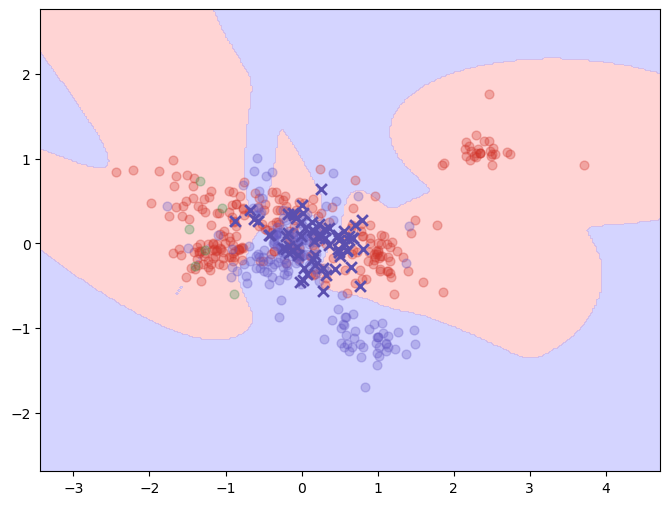

In [ ]:
import plotly.express as px
import pandas as pd
from sklearn.decomposition import PCA
import numpy as np
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn import mixture
from matplotlib.colors import LogNorm

def gmm_predict(X):
    log_posts = np.zeros((X.shape[0], len(classes)))
    for idx, k in enumerate(classes):
        # log p(x|y=k)
        log_likelihood = gmms[k].score_samples(X)
        log_posts[:, idx] = log_likelihood #+ np.log(priors[k])
    return classes[np.argmax(log_posts, axis=1)]

def gmm_predict_2d(grid):
    loglikes = np.zeros((grid.shape[0], len(classes)))
    for idx, k in enumerate(classes):
        loglikes[:, idx] = gmms[k].score_samples(grid)
    # winner_idx is in {0, 1, ..., len(classes)-1}
    winner_idx = np.argmax(loglikes, axis=1)
    return winner_idx


patients = [18,19,21,22,23,24,25,26,27,28,29] # 18,19,21,22,23,29 i think 19? and 23 are correctly classified

for test_patientnum in patients:

    print('test_patientnum', test_patientnum)

    df_test = df.query(f"patient == {test_patientnum}")

    X_test, y_test = getXYdata(df_test)

    df_train = df.query(f"patient != {test_patientnum}")

    X_train, y_train = getXYdata(df_train)

    
    n_components = 2
    pca = PCA(n_components=n_components)
    #pca = LinearDiscriminantAnalysis(n_components=n_components)

    #xpca_train = pca.fit_transform(X_train)  # Apply dimensionality reduction
    #xpca_test = pca.transform(X_train)  # Apply the same transformation to the test set
    X_train = pca.fit_transform(X_train)  # Apply dimensionality reduction
    X2_test = pca.transform(X_test)  # Apply the same transformation to the test set

    # Fit one GMM per class
    classes = np.unique(y_train)
    #print('classes', classes)
    gmms = {}
    priors = {}
    for k in classes:
        Xk = X_train[y_train == k]
        gmm = GaussianMixture(n_components=5, covariance_type='full', random_state=42)
        gmm.fit(Xk)
        gmms[k] = gmm
        priors[k] = Xk.shape[0] / X_train.shape[0]

    

    # 5) Evaluate
    y_pred = gmm_predict(X2_test)
    
    print("Accuracy:", accuracy_score(y_test, y_pred))
    print(classification_report(y_test, y_pred))

    cm = confusion_matrix(y_test,y_pred,labels=classes)
    disp = ConfusionMatrixDisplay(confusion_matrix=cm,display_labels=classes)
    #disp.plot(cmap="Blues")

    #plot_decision_boundary_2d(gmm, X_train, y_train)

    #AccAndConsistency(cm, classes, acc_cons_path, test_patientnum)



    # — Build a meshgrid over the 2D PCA (or original) plane —
    # You could also first do PCA if your data is higher‐dimensional:
    # pca = PCA(n_components=2)
    # X2_train = pca.fit_transform(X_high_dim_train)
    # For this example, X_train is already 2D:
    X2_train = X_train

    x_min, x_max = X2_train[:, 0].min() - 1.0, X2_train[:, 0].max() + 1.0
    y_min, y_max = X2_train[:, 1].min() - 1.0, X2_train[:, 1].max() + 1.0

    xx, yy = np.meshgrid(
        np.linspace(x_min, x_max, 300),
        np.linspace(y_min, y_max, 300)
    )
    grid = np.c_[xx.ravel(), yy.ravel()]

    # — Predict class on every point of the grid —
    Z = gmm_predict_2d(grid)
    Z = Z.reshape(xx.shape)

    # — Plot decision boundary via filled‐contours, then overlay the points —
    cmap_background = ListedColormap(["#FFAAAA", "#AAAAFF"])
    cmap_points     = ListedColormap(["#D1352B", "#675BC6"])

    plt.figure(figsize=(8, 6))
    plt.contourf(xx, yy, Z, cmap=cmap_background, alpha=0.5, levels=[-0.5, 0.5, 1.5])


    # 1) After computing `classes = np.unique(y_train)`, build a color‐map array.
    n_classes = len(classes)
    # Use Tab10 (or any other qualitative colormap) to get n_classes distinct RGBA tuples:
    rgba_colors = plt.cm.tab10(np.linspace(0, 1, n_classes))
    # Then map each class label → one RGBA tuple:
    label_to_rgba = { lab: rgba_colors[i] for i, lab in enumerate(classes) }
    colors = {'B1':"#D1352B",'B2': "#675BC6", 'HEALTHY':"#3A9450"} 
    colors_test = {'B1':"#94241CFF",'B2': "#5B4FAF", 'HEALTHY':"#2C703D"} 

    for k in classes:
        mask = (y_train == k)
        plt.scatter(
            X2_train[mask, 0],
            X2_train[mask, 1],
            color=colors[k],#c=cmap_points(k),#[cmap_points(k)],
            #edgecolor="k",
            s=40,
            label=f"Class {(k)}",
            alpha = 0.3
        )
        """ plt.scatter(
            X_test[mask, 0],
            X_test[mask, 1],
            color=colors_test[k],#c=cmap_points(k),#[cmap_points(k)],
            #edgecolor="k",
            s=40,
            label=f"Class {(k)}",
            alpha = 0.5
        ) """
    for k in classes:
        mask_test = (y_test == k)
        plt.scatter(
            X2_test[mask_test, 0],
            X2_test[mask_test, 1],
            color=colors_test[k],
            marker="x",
            s=60,
            linewidths=2,
            label=f"Test: {k}"#,
            #alpha = 0.8
        )

    plt.title("2D GMM Decision Boundary")
    plt.xlabel("PC1")
    plt.ylabel("PC2")
    plt.legend(loc="upper right")
    plt.xlim(x_min, x_max)
    plt.ylim(y_min, y_max)
    plt.tight_layout()
    plt.show()




### Coordinates for hexagonal grid

In [48]:
import numpy as np

def generate_flat_top_hexagonal_coordinates():
    coordinates = []
    
    # Central electrode
    coordinates.append([0.0, 0.0])
    
    # Hexagonal parameters
    radius = 1.0  # Distance between center and first ring
    sqrt3 = np.sqrt(3)
    
    # First ring (6 electrodes)
    for i in range(6):
        angle_deg = 60 * i  # Flat-top starts at 0°
        angle_rad = np.deg2rad(angle_deg)
        x = radius * np.cos(angle_rad)
        y = radius * np.sin(angle_rad)
        coordinates.append([x, y])
    
    # Second ring (12 electrodes)
    for i in range(6):
        angle_deg = 60 * i
        angle_rad = np.deg2rad(angle_deg)
        # Outer hexagon vertices (2x radius)
        x_outer = 2 * radius * np.cos(angle_rad)
        y_outer = 2 * radius * np.sin(angle_rad)
        coordinates.append([x_outer, y_outer])
        
        # Midpoints between outer vertices (for 12 electrodes total)
        angle_mid_rad = np.deg2rad(angle_deg + 30)
        x_mid = radius * sqrt3 * np.cos(angle_mid_rad)
        y_mid = radius * sqrt3 * np.sin(angle_mid_rad)
        coordinates.append([x_mid, y_mid])
    
    # Ensure exactly 19 electrodes
    coordinates = np.array(coordinates[:19])
    return coordinates

# Generate coordinates
electrode_coordinates = generate_flat_top_hexagonal_coordinates()

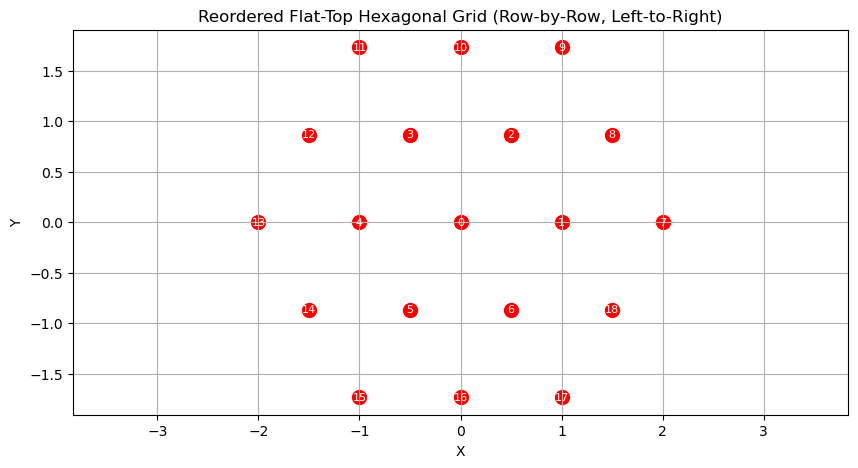

In [52]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.scatter(electrode_coordinates[:, 0], electrode_coordinates[:, 1], s=100, c='red')

# Annotate with new order
for i, (x, y) in enumerate(electrode_coordinates):
    plt.text(x, y, str(i), ha='center', va='center', fontsize=8, color='white')

plt.title("Reordered Flat-Top Hexagonal Grid (Row-by-Row, Left-to-Right)")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.axis('equal')
plt.show()

In [53]:
def reorder_hex_rows_flat_top(coords):
    # Separate x and y coordinates
    x, y = coords[:, 0], coords[:, 1]
    
    # Group by rows (using y-coordinate with tolerance for floating point errors)
    unique_ys = np.unique(np.round(y, decimals=5))  # Adjust decimals as needed
    row_groups = [coords[np.isclose(y, y_val)] for y_val in unique_ys]  # groups electrodes into horizontal rows by their y-coordinates
    row_groups.sort(key=lambda row: -row[0, 1])  # Sort rows by descending y (to start from top row)
    
    # Sort each row left-to-right (by x-coordinate)
    reordered = []
    indices = []
    original_indices = np.arange(len(coords))
    
    for row in row_groups:
        row_indices = original_indices[np.isin(coords, row).all(axis=1)]
        sorted_row = row[row[:, 0].argsort()]  # Sort row by x
        reordered.append(sorted_row)
        indices.append(row_indices[row[:, 0].argsort()])
    
    reordered_coords = np.vstack(reordered)
    reorder_indices = np.concatenate(indices)
    
    return np.round(reordered_coords,2), reorder_indices

# Generate your original coordinates (flat-top hex grid)
electrode_coordinates = generate_flat_top_hexagonal_coordinates()

# Reorder
reordered_coords, reorder_indices = reorder_hex_rows_flat_top(electrode_coordinates)

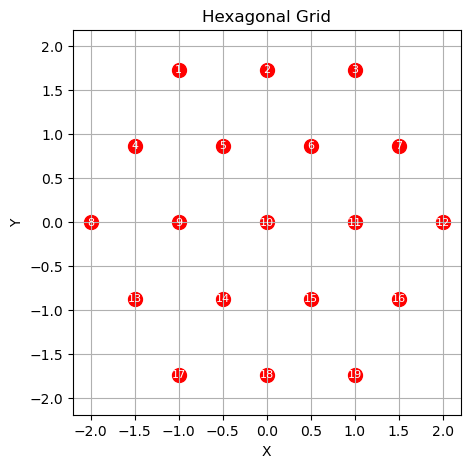

In [54]:
plt.figure(figsize=(5, 5))
plt.scatter(reordered_coords[:, 0], reordered_coords[:, 1], s=100, c='red')

# Annotate with new order
for i, (x, y) in enumerate(reordered_coords):
    plt.text(x, y, str(i+1), ha='center', va='center', fontsize=8, color='white')

plt.title("Hexagonal Grid")
plt.xlabel("X")
plt.ylabel("Y")
plt.grid(True)
plt.axis('equal')
plt.show()

In [25]:
print(reordered_coords)

[[-1.    1.73]
 [ 0.    1.73]
 [ 1.    1.73]
 [-1.5   0.87]
 [-0.5   0.87]
 [ 0.5   0.87]
 [ 1.5   0.87]
 [-2.    0.  ]
 [-1.    0.  ]
 [ 0.    0.  ]
 [ 1.    0.  ]
 [ 2.    0.  ]
 [-1.5  -0.87]
 [-0.5  -0.87]
 [ 0.5  -0.87]
 [ 1.5  -0.87]
 [-1.   -1.73]
 [-0.   -1.73]
 [ 1.   -1.73]]


### Looking at the delay surface

#### getting delay array from excel file

In [26]:
import pandas as pd
excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000ORIGINAL.xlsx'
df = pd.read_excel(io=excel_path)
print(df.iloc[0])
stage = df.iloc[0]['stage']
patient = df.iloc[0]['patient']

print(stage, patient)
delay = df.iloc[0].drop('stage').drop('patient')
print(np.array(delay))
""" for i in range(len(df)):
    row = df.loc[i]  # Get row by index
    print(row) """

Delay_ch10      2
Delay_ch11    -14
Delay_ch12    -19
Delay_ch13      1
Delay_ch14      2
Delay_ch15     -6
Delay_ch16    -17
Delay_ch17      4
Delay_ch18      1
Delay_ch19     -8
Delay_ch2     -13
Delay_ch3     -23
Delay_ch4       1
Delay_ch5       3
Delay_ch6     -14
Delay_ch7     -23
Delay_ch8       3
Delay_ch9       3
stage          B2
patient        23
Name: 0, dtype: object
B2 23
[2 -14 -19 1 2 -6 -17 4 1 -8 -13 -23 1 3 -14 -23 3 3]


' for i in range(len(df)):\n    row = df.loc[i]  # Get row by index\n    print(row) '

In [18]:
from scipy.interpolate import griddata
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import RBFInterpolator

coord = np.array([
    [0., 0.], [1., 0.], [2., 0.], [-1.5, -0.87], [-0.5, -0.87], 
    [0.5, -0.87], [1.5, -0.87], [-1., -1.73], [-0., -1.73], 
    [1., -1.73], [0., 1.73], [1., 1.73], 
    [-1.5, 0.87], [-0.5, 0.87], [0.5, 0.87], [1.5, 0.87], 
    [-2., 0.], [-1., 0.]
])

delay = [2, -14, -19, 1, 2, -6, -17, 4, 1, -8, -13, -23, 1, 3, -14, -23, 3, 3]
#delay = [1,	0	,0	,2	,2.5	,1	,0	,3	,2	,1	,-1	,1	,1	,1	,-1	,-1,	1	,2]
#delay = [-5,	-3	,-3	,-1,-2,	-1	,-1,-5	,-1	,0,	0,	-1,	-2,	-2,	-2,	-2,	1,	-2]
#delay = [4,8,2,13,12	,10,	8,	14,	13,	12	,1	,0	,5,	1,	1	,2	,11,	10] #26
#delay = [9,8,7,18,15,14,12,20.5,20,20	,0,	-3,	6	,7,	3	,0	,12,	13] #27
# Convert to numpy arrays
points = np.array(coord)
values = np.array(delay)/2000

# Create grid for interpolation
grid_x, grid_y = np.mgrid[-2:2:100j, -2:2:100j]

#### Delay surface (magnitude plot)

In [21]:
rbf = RBFInterpolator(coord, values)
grid_z = rbf(np.column_stack([grid_x.ravel(), grid_y.ravel()])).reshape(grid_x.shape)

labels = ['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '3', '4', '5', '6', '7', '8', '9']
#labels = [1,	0	,0	,2	,2.5	,1	,0	,3	,2	,1	,-1	,1	,1	,1	,-1	,-1,	1	,2]
# Create the figure
fig = go.Figure()

# Add the interpolated surface
fig.add_trace(go.Surface(
    x=grid_x, y=grid_y, z=grid_z,
    colorscale='Viridis',
    opacity=0.8,
    name='RBF Interpolation'
))

# Add original points (optional)
fig.add_trace(go.Scatter3d(
    x=coord[:, 0], y=coord[:, 1], z=values,#delay,
    mode='markers+text',
    text = labels,
    textposition='top center',
    marker=dict(size=5, color='red'),
    name='Original Points'
))

# Update layout
fig.update_layout(
    title='3D Surface with RBF Interpolation',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Delay /s'#,
        #zaxis=dict(range=[-30, 10])
    ),
    margin=dict(l=0, r=0, b=0, t=30)
)

#fig.update_layout(zaxis_range=[-25,25])
#fig.update_layout(zaxis=dict(range=[-25,25]))
fig.show()

#### Delay gradient surface (magnitude plot)

In [14]:
# Compute gradient (central differences)
dz_dx, dz_dy = np.gradient(grid_z)

#print(dz_dx.shape)
#print(dz_dy.shape)
# basically you have a 100x100 surface... you need to turn this into a feature matrix i.e., pick the gradient out at the red dots

gradient_magnitude = np.sqrt(dz_dx**2 + dz_dy**2)  # Steepness at each point
#print((gradient_magnitude.shape))

#print(*gradient_magnitude)


fig = go.Figure()

# Gradient magnitude surface
fig.add_trace(go.Surface(
    x=grid_x, y=grid_y, z=gradient_magnitude,
    colorscale='Plasma',
    opacity=0.9,
    name='Gradient Magnitude',
    showscale=True  # Adds colorbar
))
""" 
# Add original points (optional)
fig = go.Figure(go.Scatter3d(
    x=grid_x, y=grid_y, z=gradient_magnitude,
    mode='markers+text',
    text = labels,
    textposition='top center',
    marker=dict(size=5, color='red'),
    name='Original Points'
)) """


fig.update_layout(
    title='3D Gradient Magnitude (Steepness)',
    scene=dict(
        xaxis_title='X',
        yaxis_title='Y',
        zaxis_title='Gradient Magnitude',
        zaxis=dict(range=[-.2, 1])
    )
)
fig.show()

#### Delay gradient surface Quiver Plot (Vector Field)

In [22]:
fig = go.Figure()

# Subsample grid for cleaner arrows
skip = 10  # Plot every 10th arrow
x_sub = grid_x[::skip, ::skip].ravel()
y_sub = grid_y[::skip, ::skip].ravel()
z_sub = grid_z[::skip, ::skip].ravel()
dz_dx_sub = dz_dx[::skip, ::skip].ravel()
dz_dy_sub = dz_dy[::skip, ::skip].ravel()

# Create cones (arrows) for gradient vectors
fig.add_trace(go.Cone(
    x=x_sub,
    y=y_sub,
    z=z_sub,
    u=dz_dx_sub,  # x-component of gradient
    v=dz_dy_sub,  # y-component of gradient
    w=np.zeros_like(z_sub),  # No vertical component (2D gradient)
    sizemode='scaled',
    sizeref=1,  # Adjust arrow size
    colorscale='Blues',
    name='Gradient Vectors'
))

fig.update_layout(scene_zaxis_title='Gradient')
fig.show()

#### Gradient at the 18 coordinates

In [31]:
import numpy as np
from scipy.interpolate import RBFInterpolator, griddata
import plotly.graph_objects as go

# 4 lines added from previous sections
rbf = RBFInterpolator(coord, delay)
grid_z = rbf(np.column_stack([grid_x.ravel(), grid_y.ravel()])).reshape(grid_x.shape)
dz_dx, dz_dy = np.gradient(grid_z)
labels = ['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '3', '4', '5', '6', '7', '8', '9']

# Interpolate gradient back to original points
dz_dx = griddata(
    np.column_stack([grid_x.ravel(), grid_y.ravel()]),
    dz_dx.ravel(),
    coord,
    method='cubic')

dz_dy = griddata(
    np.column_stack([grid_x.ravel(), grid_y.ravel()]),
    dz_dy.ravel(),
    coord,
    method='cubic')

# Print results
print("Gradient components at original points:")
for i in range(len(coord)):
    print(f"dz/dx = {dz_dx[i]:.3f}, dz/dy = {dz_dy[i]:.3f}")

print(dz_dx, dz_dy)


# Represent gradient as complex numbers
gradient_complex = dz_dx + 1j * dz_dy

print(gradient_complex)

""" # Gradient magnitude at original points
grad_magnitude_at_original = np.sqrt(dz_dx_at_original**2 + dz_dy_at_original**2)

fig.add_trace(go.Scatter3d(
    x=coord[:, 0], y=coord[:, 1], z=delay,
    mode='markers+text',
    marker=dict(size=1, color=grad_magnitude_at_original, colorscale='Viridis'),
    text=[f"Grad: {mag:.2f}" for mag in grad_magnitude_at_original],
    name='Gradient at Points'
)) """

Gradient components at original points:
dz/dx = -0.028, dz/dy = -0.284
dz/dx = 0.006, dz/dy = -0.190
dz/dx = -0.264, dz/dy = -0.125
dz/dx = -0.016, dz/dy = -0.060
dz/dx = -0.114, dz/dy = -0.152
dz/dx = -0.004, dz/dy = -0.152
dz/dx = -0.191, dz/dy = -0.105
dz/dx = -0.033, dz/dy = -0.062
dz/dx = -0.041, dz/dy = -0.083
dz/dx = -0.086, dz/dy = -0.095
dz/dx = -0.013, dz/dy = 0.021
dz/dx = -0.045, dz/dy = -0.066
dz/dx = -0.128, dz/dy = -0.223
dz/dx = -0.130, dz/dy = -0.127
dz/dx = 0.100, dz/dy = -0.123
dz/dx = -0.107, dz/dy = -0.162
dz/dx = -0.023, dz/dy = -0.173
dz/dx = -0.175, dz/dy = -0.264
[-0.02785572  0.0056689  -0.26440383 -0.01608817 -0.11372433 -0.00350502
 -0.19126012 -0.03309793 -0.04092515 -0.08589813 -0.01275226 -0.04451804
 -0.12757574 -0.1296459   0.1002372  -0.10719629 -0.02295923 -0.17549353] [-0.28367514 -0.19030611 -0.12543235 -0.06033136 -0.15231285 -0.15226501
 -0.10545887 -0.06178286 -0.0829664  -0.09476461  0.02129407 -0.06630578
 -0.22312295 -0.12749249 -0.12272928 -0

' # Gradient magnitude at original points\ngrad_magnitude_at_original = np.sqrt(dz_dx_at_original**2 + dz_dy_at_original**2)\n\nfig.add_trace(go.Scatter3d(\n    x=coord[:, 0], y=coord[:, 1], z=delay,\n    mode=\'markers+text\',\n    marker=dict(size=1, color=grad_magnitude_at_original, colorscale=\'Viridis\'),\n    text=[f"Grad: {mag:.2f}" for mag in grad_magnitude_at_original],\n    name=\'Gradient at Points\'\n)) '

Gradient at original points:
Point 10: Magnitude = 0.285, Direction = 264.4°
Point 11: Magnitude = 0.190, Direction = 271.7°
Point 12: Magnitude = 0.293, Direction = 205.4°
Point 13: Magnitude = 0.062, Direction = 255.1°
Point 14: Magnitude = 0.190, Direction = 233.3°
Point 15: Magnitude = 0.152, Direction = 268.7°
Point 16: Magnitude = 0.218, Direction = 208.9°
Point 17: Magnitude = 0.070, Direction = 241.8°
Point 18: Magnitude = 0.093, Direction = 243.7°
Point 19: Magnitude = 0.128, Direction = 227.8°
Point 2: Magnitude = 0.025, Direction = 120.9°
Point 3: Magnitude = 0.080, Direction = 236.1°
Point 4: Magnitude = 0.257, Direction = 240.2°
Point 5: Magnitude = 0.182, Direction = 224.5°
Point 6: Magnitude = 0.158, Direction = 309.2°
Point 7: Magnitude = 0.194, Direction = 236.5°
Point 8: Magnitude = 0.175, Direction = 262.5°
Point 9: Magnitude = 0.317, Direction = 236.4°
[0.28503952 0.19039053 0.29264767 0.06243959 0.19008532 0.15230534
 0.21840789 0.07008991 0.09251104 0.1279016  0.0

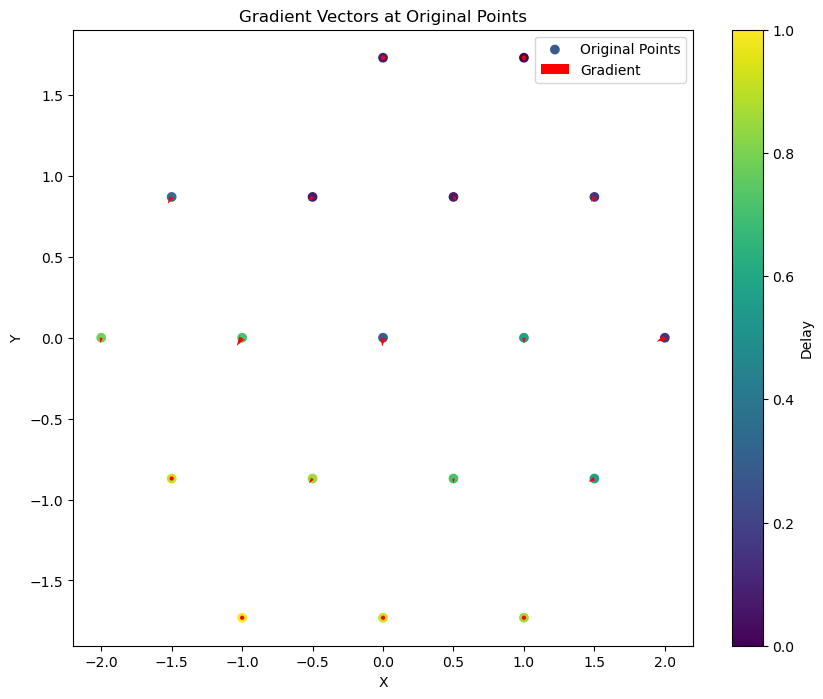

In [19]:
# Gradient magnitude (steepness)
gradient_magnitude = np.sqrt(dz_dx**2 + dz_dy**2)

# Gradient direction (angle in radians)
gradient_direction_rad = np.arctan2(dz_dy, dz_dx)

# Convert to degrees (0° to 360°)
gradient_direction_deg = np.degrees(gradient_direction_rad) % 360

fm = []
cols_labels = []
print("Gradient at original points:")
for i in range(len(coord)):
    point = labels[i]
    cols_labels += [f'Grad_magn_ch{point}']
    cols_labels += [f'Grad_angle_ch{point}']
    print( f"Point {point}: "
        f"Magnitude = {gradient_magnitude[i]:.3f}, "
        f"Direction = {gradient_direction_deg[i]:.1f}°")
    fm.append(f"{gradient_magnitude[i]:.3f}")
    fm.append(f"{gradient_direction_deg[i]:.1f}")

print(gradient_magnitude, gradient_direction_deg)

plt.figure(figsize=(10, 8))
plt.scatter(coord[:, 0], coord[:, 1], c=delay, cmap='viridis', label='Original Points')
plt.quiver(
    coord[:, 0], coord[:, 1],           # Point locations
    dz_dx, dz_dy, # Gradient components
    color='red', scale=20,               # Adjust scale for arrow size
    label='Gradient'
)
plt.colorbar(label='Delay')
plt.title('Gradient Vectors at Original Points')
plt.xlabel('X')
plt.ylabel('Y')
plt.legend()
plt.show()

#### Putting into excel file

In [ ]:
import pandas as pd
#print(np.array(fm).T)
grad_df = pd.DataFrame(fm).T

print(grad_df)

grad_df.columns = cols_labels
#print('num_valid_cycles', num_valid_cycles)
stage, patientnum = 'B2', 23
grad_df['stage'] = [stage]
grad_df['patient'] = [patientnum]


excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000GRADTEST.xlsx'

try:
    existing_df = pd.read_excel(excel_path)
    # Append the new data to the existing data
    combined_df = pd.concat([existing_df,grad_df],ignore_index=True)
except FileNotFoundError:
    # If the file doesn't exist, just use the new data
    combined_df = grad_df

# Write the combined data back to the Excel file
with pd.ExcelWriter(excel_path,mode='w',engine='openpyxl') as writer:
    combined_df.to_excel(writer,index=False)
    print('put into excel') 


['0.475' '186.0' '0.498' '200.3' '0.168' '227.1' '0.037' '236.7' '0.076'
 '143.6' '0.510' '183.3' '0.277' '199.0' '0.145' '259.9' '0.287' '202.4'
 '0.443' '209.8' '0.608' '215.8' '0.341' '203.8' '0.171' '300.2' '0.421'
 '228.8' '0.735' '207.3' '0.301' '233.1' '0.068' '182.4' '0.149' '37.2']
      0      1      2      3      4      5      6      7      8      9   ...  \
0  0.475  186.0  0.498  200.3  0.168  227.1  0.037  236.7  0.076  143.6  ...   

      26     27     28     29     30     31     32     33     34    35  
0  0.421  228.8  0.735  207.3  0.301  233.1  0.068  182.4  0.149  37.2  

[1 rows x 36 columns]
put into excel


#### Putting it all together

In [ ]:
from scipy.interpolate import griddata
import plotly.graph_objects as go
import numpy as np
from scipy.interpolate import RBFInterpolator
import pandas as pd

#addon = 'all_fs2000SW100and350'#'all_fs2000ORIGINAL.xlsx'#'all_fs2000GRADANGLE.xlsx'#'all_fs2000GRADMAG.xlsx'#'all_fs2000ORIGINAL.xlsx'

#excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/Delays_SearchWdw100/' + addon + r'.xlsx'

#addon = r'all_fs2000AMPS_SCALEDPERPATIENT'#all_fs2000SW100and350_SCALEDPERPATIENT'#'all_fs2000AMPS_SCALEDPERPATIENT'#SW100and350'
excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd.xlsx'#r'/Users/arzina/Desktop/HFD.xlsx'#amps_SCALEDPERPATIENT.xlsx'#r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/amps/amps_SCALEDPERPATIENT.xlsx'#delays/delays_SCALEDPERPATIENT.xlsx'#Delays_thirdof3peaks/Delays_SearchWdw100/' + addon +r'.xlsx'


#excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000ORIGINAL.xlsx'
df_p = pd.read_excel(io=excel_path)

patients = [18]#17,18,19,20,21,22,23,24,25,26,27,28,29] #27,28,22

for p in patients:

    print(p)

    df = df_p.query(f"patient == {p}")
    #print('queried')
    coord = np.array([[0., 0.], [1., 0.], [2., 0.], [-1.5, -0.87], [-0.5, -0.87], 
            [0.5, -0.87], [1.5, -0.87], [-1., -1.73], [-0., -1.73], 
            [1., -1.73], [0., 1.73], [1., 1.73], 
            [-1.5, 0.87], [-0.5, 0.87], [0.5, 0.87], [1.5, 0.87], 
            [-2., 0.], [-1., 0.]])

    for i in range(len(df)):
        #print('within i')
        #row = df.loc[i]  # Get row by index
        #print(row)
        #print(df.iloc[0])
        stage = df.iloc[i]['stage']
        patientnum = df.iloc[i]['patient']
        sw = df.iloc[i]['search_window']
        #print(stage, patientnum)
        delay = df.iloc[i].drop('stage').drop('patient').drop('search_window').drop('timestamp')
        #print(np.array(delay))


        #delay = [2, -14, -19, 1, 2, -6, -17, 4, 1, -8, -13, -23, 1, 3, -14, -23, 3, 3]

        # Convert to numpy arrays
        #points = np.array(coord)
        #values = np.array(delay)

        # Create grid for interpolation
        grid_x, grid_y = np.mgrid[-2:2:100j, -2:2:100j]

        rbf = RBFInterpolator(coord, delay)
        grid_z = rbf(np.column_stack([grid_x.ravel(), grid_y.ravel()])).reshape(grid_x.shape)
        dz_dx, dz_dy = np.gradient(grid_z)
        labels = ['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '2', '3', '4', '5', '6', '7', '8', '9']

        # Interpolate gradient back to original points
        dz_dx = griddata(
            np.column_stack([grid_x.ravel(), grid_y.ravel()]),
            dz_dx.ravel(),
            coord,
            method='cubic')

        dz_dy = griddata(
            np.column_stack([grid_x.ravel(), grid_y.ravel()]),
            dz_dy.ravel(),
            coord,
            method='cubic')

        # Print results
        #print("Gradient components at original points:")
        #for i in range(len(coord)):
        #    print(f"dz/dx = {dz_dx[i]:.3f}, dz/dy = {dz_dy[i]:.3f}")

        #print(dz_dx, dz_dy)

        # Represent gradient as complex numbers
        #gradient_complex = dz_dx + 1j * dz_dy

        #print(gradient_complex)


        # Gradient magnitude (steepness)
        gradient_magnitude = np.sqrt(dz_dx**2 + dz_dy**2)

        # Gradient direction (angle in radians)
        gradient_direction_rad = np.arctan2(dz_dy, dz_dx)

        # Convert to degrees (0° to 360°)
        gradient_direction_deg = np.degrees(gradient_direction_rad) % 360

        fm_angle = []
        cols_labels_angle = []
        
        fm_mag = []
        cols_labels_mag = []


        #print("Gradient at original points:")
        for i in range(len(coord)):
            point = labels[i]
            cols_labels_mag += [f'Grad_mag_ch{point}']
            cols_labels_angle += [f'Grad_angle_ch{point}']
            #print( f"Point {point}: "
                #f"Magnitude = {gradient_magnitude[i]:.3f}, "
                #f"Direction = {gradient_direction_deg[i]:.1f}°")
            fm_mag.append(f"{gradient_magnitude[i]:.4f}")
            fm_angle.append(f"{gradient_direction_deg[i]:.1f}")


        mag_df = pd.DataFrame(fm_mag).T

        angle_df = pd.DataFrame(fm_angle).T

        #print(grad_df)

        mag_df.columns = cols_labels_mag
        angle_df.columns = cols_labels_angle

        #print('num_valid_cycles', num_valid_cycles)
        mag_df['stage'] = [stage]
        mag_df['patient'] = [patientnum]
        mag_df['search_window'] = [sw]

        angle_df['stage'] = [stage]
        angle_df['patient'] = [patientnum]
        angle_df['search_window'] = [sw]


        excel_path_mag = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_GRADMAG.xlsx'#r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/amps/amps_SCALEDPERPATIENT_GRADANGLE.xlsx' # +addon +r'_GRADMAG.xlsx'#
        excel_path_angle = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_GRADANGLE.xlsx'#r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V1/amps/amps_SCALEDPERPATIENT_GRADANGLE.xlsx' # +addon +r'_GRADMAG.xlsx'#
        
        SaveToExcel(mag_df, excel_path_mag)
        SaveToExcel(angle_df, excel_path_angle)


        

17
18
Excel file created with new data.
Excel file created with new data.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
Data merged and saved to Excel file.
D

### Smote Experimentation

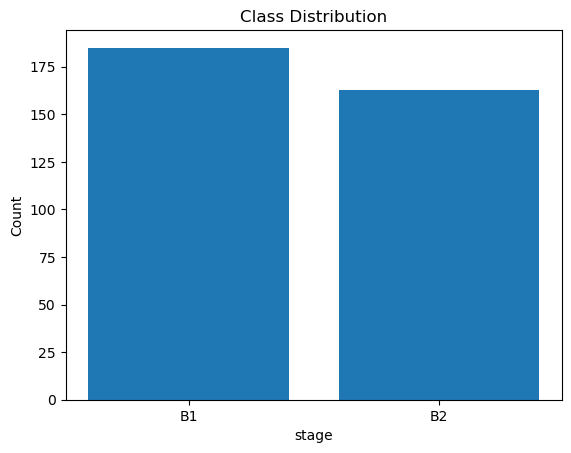

In [30]:
import matplotlib.pyplot as plt
import pandas as pd

path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000.xlsx'

data = pd.read_excel(path)
x=data.drop(["stage"],axis=1)#.drop(["patient"],axis=1)
y=data["stage"]

count_class = y.value_counts() # Count the occurrences of each class
plt.bar(count_class.index, count_class.values)
plt.xlabel('stage')
plt.ylabel('Count')
plt.title('Class Distribution')
plt.xticks(count_class.index, ['B1', 'B2'])
plt.show()


In [ ]:
from imblearn.over_sampling import SMOTE

smote=SMOTE(sampling_strategy='minority') 
x,y=smote.fit_resample(x,y)
y.value_counts()

from imblearn.over_sampling import BorderlineSMOTE

blsmote = BorderlineSMOTE(sampling_strategy='minority', kind='borderline-1')
X_resampled, y_resampled = blsmote.fit_resample(x, y)
y_resampled.value_counts()

df = pd.concat([X_resampled,y_resampled],axis = 1, ignore_index=True)
#print(X_resampled.shape)

pth = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/Delays_thirdof3peaks/all_fs2000SMOTE.xlsx'

if os.path.exists(pth):
    existing_df = pd.read_excel(pth)
    combined_df = pd.concat([existing_df,df],ignore_index=True) # remove duplicates

    with pd.ExcelWriter(pth, engine='openpyxl', mode='a') as writer:  # , 
        combined_df.to_excel(writer, index=False)
        print(f"Data appended to the existing excel file.")      
    # Save new Dataframe to Excel
else:
    with pd.ExcelWriter(pth, engine='openpyxl') as writer:
        df.to_excel(writer, index=False)
        print(f"Excel file created.")

stage
B1    185
B2    185
Name: count, dtype: int64

In [ ]:
def findRpeakIndex(ch, rMP):
    chdata = rMP.preprocessed_data['{}'.format(ch+1)].values
    rpeaks = wfdb.processing.xqrs_detect(chdata,fs=250,verbose=False)
    return rpeaks, chdata

def findAmplitudes2Darray(mode, rMP):
    amplitudes2Darray = []
    for i in range(num_channels):
        if i in mode-1:
            rpeaks_idcs, chdata = findRpeakIndex(i, rMP)
            amptd = np.round(chdata[rpeaks_idcs], decimals=3)
            amplitudes2Darray.append(amptd)
    return amplitudes2Darray


### Multifractal analysis

Estimated H = 1.712


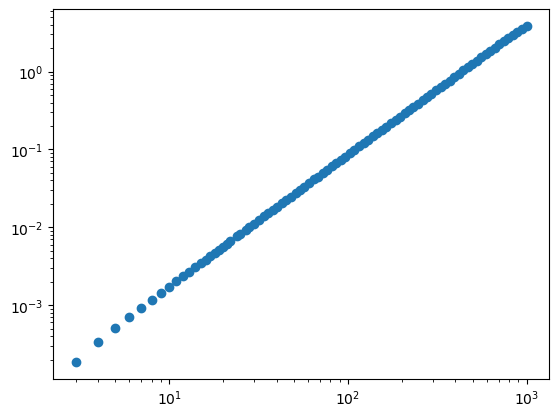

In [6]:
# Imports
from MFDFA import MFDFA
from MFDFA import fgn
# where this second library is to generate fractional Gaussian noises

# integration time and time sampling
t_final = 500
delta_t = 0.001

# Some drift theta and diffusion sigma parameters
theta = 0.3
sigma = 0.1

# The time array of the trajectory
time = np.arange(0, t_final, delta_t)

# The fractional Gaussian noise
H = 0.7
dB = (t_final ** H) * fgn(N = time.size, H = H)

# Initialise the array y
y = np.zeros([time.size])

# Integrate the process
for i in range(1, time.size):
   y[i] = y[i-1] - theta * y[i-1] * delta_t + sigma * dB[i]



# Select a band of lags, which usually ranges from
# very small segments of data, to very long ones, as
lag = np.unique(np.logspace(0.5, 3, 100, dtype=int))

# Notice these must be ints, since these will segment
# the data into chucks of lag size

# Select the power q
q = 2

# The order of the polynomial fitting
order = 1

# Obtain the (MF)DFA as
lag, dfa = MFDFA(y, lag = lag, q = q, order = order)

# To uncover the Hurst index, lets get some log-log plots
plt.loglog(lag, dfa, 'o', label='fOU: MFDFA q=2')

# And now we need to fit the line to find the slope
# in a double logaritmic scales, i.e., you need to
# fit the logs of the results
H_hat = np.polyfit(np.log(lag)[4:20],np.log(dfa[4:20]),1)[0]

print('Estimated H = '+'{:.3f}'.format(H_hat[0]))


# Now what you should obtain is: slope = H + 1

### STFT

In [112]:
from scipy.signal import stft, detrend
from scipy.stats import mode

#def fun2(rMP, stage, firstof3peaks_per_channel, excel_path, patientnum):
def stft_code(data, firstof3peaks_per_channel, excel_path, patient, stg):

    # Get the peak indices for channel 1
    channel_1_peaks = firstof3peaks_per_channel[data.columns[0]]

    # Initialise list to store delays for valid cycles
    delays_all_ch = []
    peak_all_ch = []
    # Define ECG peak delay tolerance
    tolerance = 20 # with 60 everything is in, to remove anomolies, i am going down to 10
    
    num_valid_cycles = 0
    # Calculate delays for each cycle
    for peak_1 in channel_1_peaks:
        #print('peak_1', peak_1)

        delay_ch = []
        peak_ch = []

        valid_cycle = True
        for ch in data.columns[1:]:  # 1: Skip channel 1, compare all others to it
            channel_peaks = firstof3peaks_per_channel[ch]
            # Find the closest peak in the current channel within the tolerance window
            valid_peaks = np.abs(channel_peaks-peak_1)<=tolerance #tolerance*rMP.metadata['amplifier_sample_rate']
            #print(valid_peaks)  # this is boolean, it says True where the peak is within the tolerance

            if np.any(valid_peaks):  # If there's a valid peak
                closest_peak0 = channel_peaks[valid_peaks][0] # Get the first valid peak
                #print('first valid peak', closest_peak)
                delay_ch_col0 = (closest_peak0-peak_1)#/rMP.metadata['amplifier_sample_rate'] # Convert to seconds
                #print('ch, delay_ch_col0', ch, delay_ch_col0)
                delay_ch.append(delay_ch_col0)

                peak_ch.append(closest_peak0)


            else:
                valid_cycle = False  #  If any channel does not have a valid peak for this col, skip it and go to the next column
                break 
            # If the cycle was valid, store the delays

        if valid_cycle:
            #print('valid cycle TRUE')
            num_valid_cycles += 1
            delays_all_ch.append(delay_ch)
            peak_all_ch.append(peak_ch)
    
    #return delays_all_ch, peak_all_ch




    fm_all_ch = []
    for i in range(len(peak_all_ch)):
        #print(peak_all_ch[i])
        fm_list_ch = []
        for j in range(len(peak_all_ch[i])):

            #print(j+2)
            ch = str(j+2)
            #print('ch', ch)
            
            x = data[ch].values[peak_all_ch[i][j]-400: peak_all_ch[i][j]+100]
            x = detrend(x)  # removing DC component? shows strong energy near 0 Hz, which suggests a DC component

            f, t, Zxx = stft(x, fs = 2000, nperseg=20000)

            # Find the peak frequency for each time frame
            peak_freq_indx = np.argmax(np.abs(Zxx), axis=0)  # Index of max frequency for each time step
            peak_freq = f[peak_freq_indx]  # Convert indices to frequencies

            # Find the most common peak frequency (mode)
            Fm = mode(peak_freq).mode
            #print("Most Frequent Peak Frequency (Fm):", Fm, "Hz")
            fm_list_ch.append(Fm)

        fm_all_ch.append(fm_list_ch)

    #print(len(fm_all_ch))
    df = pd.DataFrame(fm_all_ch)

    print(df)

    cols_labels = []
    for ch in data.columns[1:]:
        cols_labels += [f'Fm_{ch}']

    #print(len(fm_list), len(cols_labels))  # These match!
    if not df.empty:
        df.columns = cols_labels

        df['stage'] = [stg] * len(fm_all_ch)
        df['patient'] = [patient] * len(fm_all_ch)


    
    try:
        existing_df = pd.read_excel(excel_path)
        # Append the new data to the existing data
        combined_df = pd.concat([existing_df,df],ignore_index=True)
    except FileNotFoundError:
        # If the file doesn't exist, just use the new data
        combined_df = df

    # Write the combined data back to the Excel file
    with pd.ExcelWriter(excel_path,mode='w',engine='openpyxl') as writer:
        combined_df.to_excel(writer,index=False)
        print('put into excel') 
    
    return delays_all_ch, peak_all_ch


In [148]:
import pandas as pd
directory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh100/V2-V3/'

peaksdirectory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh100/V2-V3/WFDBpeaks/'
# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.csv")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)


bpm = []
for fp in bspm_fullpaths: 
    #fp = directory
    data = pd.read_csv(fp)
    patient = fp.split('/')[-1].split('.')[0]
    print('patient', patient)

    # Load the long-form DataFrame
    df_peaks = pd.read_csv(peaksdirectory + str(patient) + '_peaks.csv')

    # Rebuild peaks_per_channel dictionary
    peaks_per_channel = {
        ch: list(group['peak'].values)
        for ch, group in df_peaks.groupby('channel')}
    # Print the dictionary
    print(peaks_per_channel)



    SW = 350
    # finding surrounding peaks with the significant peak at the centre of the serach window
    thirdof3peaks_per_channel = {}
    all3peaks_per_channel = {}
    third_peak_val = {}
    #pearson_corr = {}

    for ch in data.columns:
        #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
        print('channel ', ch)
        ch_third_peaks = []
        ch_all_three_peaks = []
        ch_third_peak_val = []
        #ch_pearson_corr = []
        for peak_peaksch in peaks_per_channel[int(ch)]:
            signal_segment = data[ch].values
            three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

            if three_tallest_peaks is not None:
                ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
                ch_all_three_peaks += list(three_tallest_peaks)
                ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])

        thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
        all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
        third_peak_val[ch] = np.array(ch_third_peak_val)




    stg = findDetailsPatient(patient)
    excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh100/V2-V3/stft/stft.xlsx'
    stft_code(data, thirdof3peaks_per_channel, excel_path, patient, stg)



patient 23
{1: [509, 1187, 2062, 3607, 4464, 5892, 6846, 7808, 9540, 10419, 11411, 13056, 14052, 15019, 15907, 17544, 18395, 19853, 20719, 22081, 22942, 23901, 24969, 26453, 27281, 28223, 29805, 30651, 32123, 32976, 33898, 34783, 36294, 37175, 38216, 39788, 40653, 42012, 43248, 44108, 45624, 46594, 47749, 48808, 50441, 51340, 53084, 54459, 55409, 56384, 57601, 58467, 59510, 61102, 62101, 63837, 64775, 66153, 67217, 68092, 68985, 70035, 71633, 72543, 73793, 75459, 76394, 77602, 79145, 80261, 81165, 82613, 83891, 84815, 86029, 87887, 88765, 90234, 91597, 92491, 93369, 94546, 96196, 97142, 98817, 100415, 101417, 102878, 104343, 105343, 106505, 108168, 109153, 110890, 112340, 113333, 114484, 115466, 116292, 117292, 119245, 120138, 121059], 2: [503, 1180, 2054, 3601, 4457, 5886, 6839, 7800, 9534, 10412, 11404, 13050, 14046, 15011, 15899, 17538, 18388, 19846, 20712, 22075, 22935, 23894, 24961, 26447, 27273, 28216, 29798, 30644, 32116, 32969, 33891, 34776, 36288, 37168, 38209, 39782, 40646, 4

### Pearson Correlation Coefficient

In [323]:
import wfdb.processing
import numpy as np
import pandas as pd
import os, re, glob
from scipy.stats import pearsonr
from biolab.bspm import BSPM
from biolab.utils import apply2all


def pcc(data, stage, thirdof3peaks_per_channel, excel_path, patientnum, SW):
    
    # Get the peak indices for channel 1
    channel_1_peaks = thirdof3peaks_per_channel['1']

    corr_all_ch = []
    # Define ECG peak delay tolerance
    tolerance = 20 # THIS IS IN INDEX VALUES 0.025  # now 10ms; 100ms = 0.05 * 2000 = 0.1s, maybe let's try bit bigger with 0.1*2000 = 200ms
    # plt.plot(channel_peaks)

    num_valid_cycles = 0
    # Calculate delays for each cycle
    for peak_1 in channel_1_peaks:
        print('peak_1', peak_1)
        peak_1_lower, peak_1_upper = peak_1-600, peak_1+100
        #print(peak_1_lower, 'peak_1_lower')
        #print(peak_1_upper, 'peak_1_upper')
        ch1_array = data['1'][peak_1_lower: peak_1_upper]
        #print('len(ch1_array)', len(ch1_array))
        
        corr_ch = []  # previously was delays_ch
        valid_cycle = True
        
        for ch in data.columns[1:]:  # Skip channel 1, compare all others to it
            print('ch', ch)
            channel_peaks = thirdof3peaks_per_channel[ch]
            #print('channel_peaks', channel_peaks)
            valid_peaks = np.abs(channel_peaks-peak_1)<=tolerance #tolerance*rMP.metadata['amplifier_sample_rate']

            if np.any(valid_peaks):  # If there's a valid peak
                #closest_peak0 = channel_peaks[valid_peaks][0]
                ch_array = data[ch][peak_1_lower: peak_1_upper]
                print('len(ch',ch,'_array)', len(ch_array))
                if len(ch_array) > 2:
                    corr_ch_col = pearsonr(ch1_array, ch_array)[0] #Pearson_correlation(ch1_array,ch_array)
                    corr_ch.append(corr_ch_col)                #closest_peak = channel_peaks[valid_peaks][0] # Get the first valid peak
                else:
                    valid_cycle = False
                    print('valid_cycle FALSE')
                    break 
            else:
                # If any channel does not have a valid peak for this col, skip it and go to the next column
                valid_cycle = False
                print('valid_cycle FALSE')
                break 

        if valid_cycle:
            #print('valid cycle TRUE') 
            num_valid_cycles += 1
            #print(len(delay_ch))
            corr_all_ch.append(corr_ch)

        # Convert delays to DataFrame
    if corr_all_ch:  # Only create DataFrame if there are valid cycles
        #print('delays exist')
        delay_df = pd.DataFrame(corr_all_ch)
        #print('created delays df')
        #print('delay_df', delay_df)
        
        cols_labels = []
        for ch in data.columns[1:]:
            cols_labels += [f'Delay_ch{ch}']
                
        #print(cols_labels)
        delay_df.columns = cols_labels
        #print('delay_df.columns', delay_df.columns)
    else:
        delay_df = pd.DataFrame()  # Return an empty DataFrame if no valid cycles are found
        #print('created dataframe')
    
    #print('num_valid_cycles', num_valid_cycles)
    delay_df['stage'] = [stage] * num_valid_cycles
    delay_df['patient'] = [patientnum] * num_valid_cycles
    delay_df['search_window'] = [SW] * num_valid_cycles
    #print('included stage in dataframe')
    #print(delay_df)
 
    # Append the DataFrame to an existing Excel file
    #excel_path = r'C:\Users\Ruben\OneDrive - University of Cambridge\PhD\BSPM_for_ECGi\Publications\Wireless 3D Stacking of High Density E-textile Eutectogel Electrode Arrays for Cutaneous Electrophysiology\Experiments\INTAN\Data\ECG_classification\Delay_feature_matrix.xlsx'
    # Load the existing data from the Excel file
    try:
        existing_df = pd.read_excel(excel_path)
        # Append the new data to the existing data
        combined_df = pd.concat([existing_df,delay_df],ignore_index=True)
    except FileNotFoundError:
        # If the file doesn't exist, just use the new data
        combined_df = delay_df

    # Write the combined data back to the Excel file
    with pd.ExcelWriter(excel_path,mode='w',engine='openpyxl') as writer:
        combined_df.to_excel(writer,index=False)
        print('put into excel') 


In [319]:
import pandas as pd
directory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/V2-V3/'

peaksdirectory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/V2-V3/WFDBpeaks/'
# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.csv")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)


#bpm = []
for fp in bspm_fullpaths: 
#fp = directory
    data = pd.read_csv(fp)
    patient = fp.split('/')[-1].split('.')[0]
    print('patient', patient)
    stage = findDetailsPatient(patient)
    # Load the long-form DataFrame
    df_peaks = pd.read_csv(peaksdirectory + str(patient) + '_peaks.csv')

    # Rebuild peaks_per_channel dictionary
    peaks_per_channel = {
        ch: list(group['peak'].values)
        for ch, group in df_peaks.groupby('channel')}
    # Print the dictionary
    print(peaks_per_channel)



    SW = 350
    # finding surrounding peaks with the significant peak at the centre of the serach window
    thirdof3peaks_per_channel = {}
    all3peaks_per_channel = {}
    third_peak_val = {}
    #pearson_corr = {}

    for ch in data.columns:
        #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
        #print('channel ', ch)
        ch_third_peaks = []
        ch_all_three_peaks = []
        ch_third_peak_val = []
        #ch_pearson_corr = []
        for peak_peaksch in peaks_per_channel[int(ch)]:
            signal_segment = data[ch].values
            three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]

            if three_tallest_peaks is not None:
                ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
                ch_all_three_peaks += list(three_tallest_peaks)
                ch_third_peak_val.append(signal_segment[three_tallest_peaks[2]])

        thirdof3peaks_per_channel[ch] = np.array(ch_third_peaks)
        all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
        third_peak_val[ch] = np.array(ch_third_peak_val)

    print('peaks_per_channel', peaks_per_channel)
    print(peaks_per_channel.keys())
    print(peaks_per_channel[1])
    stg = findDetailsPatient(patient)
    excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/V2-V3/corr/corr.xlsx'
    pcc(data, stage, thirdof3peaks_per_channel, excel_path, patient, SW)
    #stft_code(data, thirdof3peaks_per_channel, excel_path, patient, stg)



patient 29
patient 29
stage B1
{1: [464, 1456, 2772, 4270, 5519, 7201, 8705, 10369, 11552, 13461, 14709, 16140, 17701, 18847, 20979, 22389, 24332, 25569, 27703, 29021, 30839, 32156, 33910, 35265, 36184, 38274, 39881, 41466, 42957, 44142, 45452, 46614, 48509, 49847, 51082, 52392, 53630, 54405, 56177, 57471, 59004, 60280, 61358, 62679, 63899, 65050, 66470, 67566, 68780, 70180, 71292, 72755, 73782, 75554, 76632, 78064, 79239, 80389, 82345, 83552, 85315, 86695, 88501, 90062, 91312, 92835, 94166, 94933, 95681, 97019, 98197, 99569, 100826, 102009, 103166, 104217, 105328, 106330, 107393, 108399, 109391, 110524, 111625, 112101, 112822, 114025, 115009, 116444, 117739, 118813, 120085, 121444, 122721, 124301, 125808], 2: [472, 1463, 2781, 4277, 5526, 7207, 8714, 10376, 11561, 13470, 14721, 15798, 16368, 16961, 17706, 18856, 20986, 22399, 24339, 25576, 27710, 29030, 30848, 32164, 33914, 35274, 36193, 38283, 38702, 39654, 40353, 41477, 42910, 44148, 45461, 46623, 48516, 49856, 51090, 52401, 53641, 

### HFD

In [32]:
def fun2hfd(data, firstof3peaks_per_channel, wfdbtimestamps):

    # Get the peak indices for channel 1
    channel_1_peaks = firstof3peaks_per_channel[data.columns[0]]

    # Initialise list to store delays for valid cycles
    #delays_all_ch = []
    peak_all_ch = []
    # Define ECG peak delay tolerance
    tolerance = 20 # with 60 everything is in, to remove anomolies, i am going down to 10
    
    timestamps_all_ch = []

    num_valid_cycles = 0
    # Calculate delays for each cycle
    for peak_1 in channel_1_peaks:
        #print('peak_1', peak_1)

        #delay_ch = []
        peak_ch = []
        timestamps_ch = []

        valid_cycle = True
        for ch in data.columns[1:]:  # 1: Skip channel 1, compare all others to it
            channel_peaks = firstof3peaks_per_channel[ch]
            wfdbtimes = wfdbtimestamps[ch]
            # Find the closest peak in the current channel within the tolerance window
            valid_peaks = np.abs(channel_peaks-peak_1)<=tolerance #tolerance*rMP.metadata['amplifier_sample_rate']
            #print(valid_peaks)  # this is boolean, it says True where the peak is within the tolerance

            if np.any(valid_peaks):  # If there's a valid peak
                closest_peak0 = channel_peaks[valid_peaks][0] # Get the first valid peak
                wfdb_timestamp = wfdbtimes[valid_peaks][0]
                #print('first valid peak', closest_peak)
                #delay_ch_col0 = (closest_peak0-peak_1)#/rMP.metadata['amplifier_sample_rate'] # Convert to seconds
                #print('ch, delay_ch_col0', ch, delay_ch_col0)
                #delay_ch.append(delay_ch_col0)

                peak_ch.append(closest_peak0)
                # signal_segment = rMP.preprocessed_data[ch][0:60].values
                timestamps_ch.append(wfdb_timestamp)


            else:
                valid_cycle = False  #  If any channel does not have a valid peak for this col, skip it and go to the next column
                break 
            # If the cycle was valid, store the delays

        if valid_cycle:
            #print('valid cycle TRUE')
            num_valid_cycles += 1
            #delays_all_ch.append(delay_ch)
            peak_all_ch.append(peak_ch)
            #peak_timestamps.append(peak_1)
            timestamps_all_ch.append(timestamps_ch[0])
    
    return peak_all_ch, timestamps_all_ch

In [35]:
import pandas as pd
import neurokit2 as nk


directory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh20/V1/27.csv'

peaksdirectory = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/PreprocessedData2000/fhigh20/V1/WFDBpeaks/'
# Apply function to all files in read directory
# apply2all(read_directory=readpath,extension='.bspm',func=fun2)

""" os.chdir(directory) # move to the search directory
bspm_files = [f for f in glob.glob("*.csv")] # will produce a list of .bspm files
bspm_fullpaths = []
for filename in bspm_files:
    fullpath = os.path.join(directory, filename)
    bspm_fullpaths.append(fullpath)


#bpm = []
for fp in bspm_fullpaths:  """
fp = directory
data = pd.read_csv(fp)
patient = fp.split('/')[-1].split('.')[0]
print('patient', patient)
stage = findDetailsPatient(patient)
# Load the long-form DataFrame
df_peaks = pd.read_csv(peaksdirectory + str(patient) + '_peaks.csv')

# Rebuild peaks_per_channel dictionary
peaks_per_channel = {
    ch: list(group['peak'].values)
    for ch, group in df_peaks.groupby('channel')}
# Print the dictionary
print(peaks_per_channel)


SW = 400

# finding surrounding peaks with the significant peak at the centre of the serach window
firstof3peaks_per_channel = {}
all3peaks_per_channel = {}

wfdbpeaktimestamps = {}


    #all_chs_peaks = []
for ch in data.columns:
    #ch = '1'  # just doing it for channel 1... only looking at HR so one channel is sufficient
    
    print('channel ', ch)
#peaksch = wfdb.processing.xqrs_detect(rMP.preprocessed_data[ch][0:60].values,fs=4000,verbose=False)
    ch_third_peaks = []
    ch_all_three_peaks = []
    peak_timestamps = []
    

    for peak_peaksch in peaks_per_channel[int(ch)]:
        signal_segment = data[ch]
        three_tallest_peaks = find_3_peaks(signal_segment, peak_peaksch, search_window=SW) # peaks_per_channel[ch][0]
        #print('3 tallest_peaks', three_tallest_peaks)
        #for peak in three_tallest_peaks:
        #    plt.plot(peak/rMP.metadata['amplifier_sample_rate'], signal_segment[peak], 'o')
        if three_tallest_peaks is not None:
            ch_third_peaks.append(three_tallest_peaks[2])  # GONNA DO THE 3RD PEAK FOR NOW... THERE ARE SO FAR INCONSISTENCIES WITH THE OTHERS...
            ch_all_three_peaks += list(three_tallest_peaks)

            peak_timestamps.append(peak_peaksch)

            #num_valid
            #plt.show()
    firstof3peaks_per_channel[ch] = np.array(ch_third_peaks)
    all3peaks_per_channel[ch] = np.array(ch_all_three_peaks)
    wfdbpeaktimestamps[ch] = np.array(peak_timestamps)




peak_all_ch, timestamps_all_ch = fun2hfd(data, firstof3peaks_per_channel, wfdbpeaktimestamps)


fd_all_ch = []
for i in range(len(peak_all_ch)):
    #print(peak_all_ch[i])
    fd_list_ch = []
    for j in range(len(peak_all_ch[i])):

        #print(j+2)
        ch = str(j+2)
        #print('ch', ch)
        
        x = data[ch].values[peak_all_ch[i][j]-600: peak_all_ch[i][j]+100]

        k_max = 50
        #fd = higuchi_fd(x, k_max)
        #fd2 = hfda.measure(x, k_max)
        fd, info = nk.fractal_higuchi(x, k_max)
        #print(fd)
        #print(fd2)
        #print(fd)

        fd_list_ch.append(fd)

    fd_all_ch.append(fd_list_ch)



excel_path = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd.xlsx'
#r'/Users/arzina/Desktop/HFD.xlsx'#
#print(len(fm_all_ch))
df = pd.DataFrame(fd_all_ch)

print(df)

cols_labels = []
for ch in data.columns[1:]:
    cols_labels += [f'hfd_{ch}']

#print(len(fm_list), len(cols_labels))  # These match!
if not df.empty:
    df.columns = cols_labels

    df['stage'] = [stage] * len(fd_all_ch)
    df['patient'] = [patient] * len(fd_all_ch)
    df['search_window'] = [SW] * len(fd_all_ch)
    df['timestamp'] = timestamps_all_ch  # Add timestamps to the DataFrame


    try:
        existing_df = pd.read_excel(excel_path)
        # Append the new data to the existing data
        combined_df = pd.concat([existing_df,df],ignore_index=True)
    except FileNotFoundError:
        # If the file doesn't exist, just use the new data
        combined_df = df

    # Write the combined data back to the Excel file
    with pd.ExcelWriter(excel_path,mode='w',engine='openpyxl') as writer:
        combined_df.to_excel(writer,index=False)
        print('put into excel') 

patient 27
patient 27
stage B1
{1: [1942, 4383, 6512, 8777, 11161, 13513, 15987, 18015, 20161, 22083, 24414, 26480, 28319, 30213, 32295, 34484, 36385, 38624, 40265, 42722, 44379, 46740, 48933, 50888, 53451, 55251, 57668, 59493, 61858, 63568, 65834, 67839, 69604, 71566, 73610, 75240, 77121, 78716, 80152, 81926, 83473, 85484, 87312, 89086, 90981, 92848, 94972, 97156, 98837, 101186, 103073, 105480, 107132, 109397, 111441, 113333, 115406, 117444, 119531, 119998], 2: [1942, 4383, 6512, 8776, 11160, 13513, 15987, 18015, 20160, 22083, 24414, 26480, 28319, 30213, 32294, 34484, 36385, 38624, 40264, 42721, 44379, 46740, 48932, 50887, 53451, 55250, 57667, 59493, 61858, 63568, 65833, 67838, 69604, 71565, 73610, 75239, 77120, 78715, 80152, 81926, 83472, 85483, 87311, 89086, 90980, 92848, 94971, 97155, 98836, 101186, 103073, 105479, 107132, 109397, 111440, 113332, 115405, 117443, 119530, 119998], 3: [1940, 4381, 6510, 8775, 11159, 13511, 15985, 18014, 20159, 22081, 24413, 26479, 28317, 30211, 32292,

### Standardising feature matrix

In [66]:
import pandas as pd

fp = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/delays/delays_SCALEDPERPATIENT.xlsx'

df = pd.read_excel(fp)

df_n = df.drop(columns=['patient','stage', 'search_window', 'timestamp'])  # Remove unnecessary columns

df_o = df_n#.iloc[1:]

mean = df_o.values.mean()
std = df_o.values.std()

df_standardized = (df_o - mean) / std

df_standardized['patient'] = df['patient']
df_standardized['stage'] = df['stage']
df_standardized['search_window'] = df['search_window']
df_standardized['timestamp'] = df['timestamp']

save_fp = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/delays/delays_SCALEDPERPATIENT_STANDARDISED.xlsx'

SaveToExcel(df_standardized, save_fp)

Excel file created with new data.


### Combining dfs

In [75]:
df_hfd = pd.read_excel(r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_STANDARDISED.xlsx')
#df_hfd.drop(columns=['stage', 'search_window',], inplace=True)  # Remove unnecessary columns

df_hfd_gradangle = pd.read_excel(r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/hfd/hfd_GRADANGLE_STANDARDISED.xlsx')
#df_hfd_gradangle.drop(columns=['stage', 'search_window',], inplace=True)  # Remove unnecessary columns

df_delays = pd.read_excel(r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/delays/delays_SCALEDPERPATIENT_STANDARDISED.xlsx')
#df_delays.drop(columns=['stage', 'search_window',], inplace=True)  # Remove unnecessary columns

def SaveToExcelResetIndex(df, path):
    df = df.reset_index()  # This removes the index and makes it a column

    if os.path.exists(path):
        existing_df = pd.read_excel(path)
        combined_df = pd.concat([existing_df, df], ignore_index=True)
        combined_df.to_excel(path, index=False)
        print("Data merged and saved to Excel file.")
    else:
        df.to_excel(path, index=False)
        print("Data saved to new Excel file.")


In [ ]:

save_fp = r'/Users/arzina/Library/CloudStorage/OneDrive-UniversityofCambridge/11B/4TH YR PROJECT/FeatureMatrices/fhigh20/V1/delays_hfd_gradangle.xlsx'
patients = [17,18,19,21,22,23,24,25,26,28,29] #27

for p in patients:

    print('patient', p)

    stage = findDetailsPatient(str(p))

    df_hfd_p = df_hfd.query(f"patient == {p}")
    df_hfd_gradangle_p = df_hfd_gradangle.query(f"patient == {p}")
    df_delays_p = df_delays.query(f"patient == {p}")
    

    df_hfd_p = df_hfd_p.set_index('timestamp').drop(columns=['patient', 'stage', 'search_window'])
    df_hfd_gradangle_p = df_hfd_gradangle_p.set_index('timestamp').drop(columns=['patient', 'stage', 'search_window'])
    df_delays_p = df_delays_p.set_index('timestamp').drop(columns=['patient', 'stage', 'search_window'])

    combined_df = pd.concat([df_delays_p, df_hfd_p, df_hfd_gradangle_p], axis=1, join='inner')  # use 'inner' for only overlapping indexes

    print(combined_df.columns)

    combined_df['patient'] = [p] * len(combined_df)
    combined_df['stage'] = [stage] * len(combined_df)  # Assuming stage is the same for all rows
    
    SaveToExcelResetIndex(combined_df, save_fp)#, sheet_name=f'patient_{p}')



    

patient 27
patient 27
stage B1


InvalidIndexError: Reindexing only valid with uniquely valued Index objects

In [70]:
df_hfd_gradangle_p

,Grad_angle_ch10,Grad_angle_ch11,Grad_angle_ch12,Grad_angle_ch13,Grad_angle_ch14,Grad_angle_ch15,Grad_angle_ch16,Grad_angle_ch17,Grad_angle_ch18,Grad_angle_ch19,...,Grad_angle_ch3,Grad_angle_ch4,Grad_angle_ch5,Grad_angle_ch6,Grad_angle_ch7,Grad_angle_ch8,Grad_angle_ch9,patient,stage,search_window
timestamp,,,,,,,,,,,,,,,,,,,,,
